### import

In [1]:
import os
import pandas as pd
import random
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
import monai
from monai import transforms
from monai.utils import set_determinism, first
from monai.transforms import(
    AsDiscrete,
    AddChanneld,
    Compose,
    CropForegroundd,
    EnsureChannelFirstd,
    LoadImaged,
    RandFlipd,
    RandCropByPosNegLabeld,
    RandSpatialCropSamplesd,
    RandShiftIntensityd,
    RandZoomd,
    ScaleIntensityd,
    Spacingd,
    SpatialPadd,
    GaussianSmoothd,
    RandRotate90d,
    ToTensord,
    RandSpatialCropd,
    RandGaussianSmoothd,    
    RandGaussianSharpend,
    RandGaussianNoise,
    RandGaussianNoised,
    
)
from generative.losses import PatchAdversarialLoss, PerceptualLoss
from monai.config import print_config
from monai.losses import DiceCELoss
from monai.metrics import DiceMetric

from monai.data import (
    DataLoader,
    Dataset,
    CacheDataset,
    load_decathlon_datalist,
    decollate_batch,
)
from monai.networks.nets import UNet
from skimage import measure
from sklearn.metrics import roc_auc_score

import torch
import glob
print_config()

Failed to load image Python extension: /home/hufsbme/anaconda3/envs/infant/lib/python3.10/site-packages/torchvision/image.so: undefined symbol: _ZN5torch3jit17parseSchemaOrNameERKNSt7__cxx1112basic_stringIcSt11char_traitsIcESaIcEEE


MONAI version: 1.2.dev2304
Numpy version: 1.23.5
Pytorch version: 1.13.1+cu117
MONAI flags: HAS_EXT = False, USE_COMPILED = False, USE_META_DICT = False
MONAI rev id: 9a57be5aab9f2c2a134768c0c146399150e247a0
MONAI __file__: /home/hufsbme/.local/lib/python3.10/site-packages/monai/__init__.py

Optional dependencies:
Pytorch Ignite version: 0.4.10
ITK version: 5.3.0
Nibabel version: 5.0.0
scikit-image version: 0.19.3
Pillow version: 9.3.0
Tensorboard version: 2.12.3
gdown version: 4.6.0
TorchVision version: 0.13.1a0
tqdm version: 4.64.1
lmdb version: 1.4.0
psutil version: 5.9.0
pandas version: 1.5.3
einops version: 0.6.0
transformers version: 4.21.3
mlflow version: 2.1.1
pynrrd version: 1.0.0

For details about installing the optional dependencies, please visit:
    https://docs.monai.io/en/latest/installation.html#installing-the-recommended-dependencies



In [2]:

from models.network_swinir import SwinIR as net


In [3]:
if torch.cuda.is_available():
    device = torch.device('cuda:0')
else:
    device = torch.device('cpu')

print(device)

cuda:0


In [4]:
!nvidia-smi

Wed Nov  8 13:11:38 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.223.02   Driver Version: 470.223.02   CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA TITAN Xp     Off  | 00000000:01:00.0 Off |                  N/A |
| 42%   62C    P2    65W / 250W |   1157MiB / 12194MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

### data

In [5]:
import os
import glob
data_dir =  glob.glob('/nfs/hufsaims/kjh_shared/euna/ISMRM/24mo/*/3D_T2.nii.gz')
data_dir2 = glob.glob('/nfs/hufsaims/kjh_shared/euna/ISMRM/24mo/*/low_3d_T2.nii.gz')

# brain = []
# for i in range(len(data_dir)):
#     brain_segs = glob.glob('/nfs/hufsaims/kjh_shared/euna/ISMRM/24mo/'+ data_dir[i].split('/')[-2] + '/aseg.nii.gz')
#     brain = brain +brain_segs

# for i in range(len(data_dir)):
#     if data_dir[i].split('/')[-2] == 'MNBCP826360_24mo':
#         data_dir.pop(i-1)
#         data_dir2.pop(i-1)


data_size = len(data_dir) #46
train = int(data_size*0.9)  #41
data_size

47

In [6]:
train_ind = np.arange(0, 40) #41
#basal bcp : 123-150
#random으로 n
#cmcep

data_dicts = [
    {
        'image' : data_dir[i],
        'low_res_image' : data_dir2[i],
        
    }for i in train_ind
]
train_data = data_dicts

valid_ind = np.arange(40, 47) #6
#valid_ind = np.arange(25, 34)
data_dicts = [
    {
        'image' : data_dir[i],
        'low_res_image': data_dir2[i],
                 
    }for i in valid_ind
]
valid_data = data_dicts

In [7]:
len(train_data)
len(valid_data)
print(len(train_data),len(valid_data))
train_ind
valid_data

40 7


[{'image': '/nfs/hufsaims/kjh_shared/euna/ISMRM/24mo/NCBCP200474_24mo/3D_T2.nii.gz',
  'low_res_image': '/nfs/hufsaims/kjh_shared/euna/ISMRM/24mo/NCBCP200474_24mo/low_3d_T2.nii.gz'},
 {'image': '/nfs/hufsaims/kjh_shared/euna/ISMRM/24mo/NCBCP283899_24mo/3D_T2.nii.gz',
  'low_res_image': '/nfs/hufsaims/kjh_shared/euna/ISMRM/24mo/NCBCP283899_24mo/low_3d_T2.nii.gz'},
 {'image': '/nfs/hufsaims/kjh_shared/euna/ISMRM/24mo/NCBCP406663_24mo/3D_T2.nii.gz',
  'low_res_image': '/nfs/hufsaims/kjh_shared/euna/ISMRM/24mo/NCBCP406663_24mo/low_3d_T2.nii.gz'},
 {'image': '/nfs/hufsaims/kjh_shared/euna/ISMRM/24mo/NCBCP518139_24mo/3D_T2.nii.gz',
  'low_res_image': '/nfs/hufsaims/kjh_shared/euna/ISMRM/24mo/NCBCP518139_24mo/low_3d_T2.nii.gz'},
 {'image': '/nfs/hufsaims/kjh_shared/euna/ISMRM/24mo/NCBCP774004_24mo/3D_T2.nii.gz',
  'low_res_image': '/nfs/hufsaims/kjh_shared/euna/ISMRM/24mo/NCBCP774004_24mo/low_3d_T2.nii.gz'},
 {'image': '/nfs/hufsaims/kjh_shared/euna/ISMRM/24mo/NCBCP774387_24mo/3D_T2.nii.gz',


## transform & dataloader

In [8]:
#300,320,208,1
train_transforms = transforms.Compose(
    [
        transforms.LoadImaged(keys=["image",'low_res_image']),
        transforms.EnsureChannelFirstd(keys=["image","low_res_image"]),
        transforms.ScaleIntensityd(
                keys=["image",'low_res_image'],
                minv=0.0,
                maxv=1.0,
        ),           


#         transforms.SpatialPadd(keys=['image','low_res_image'],spatial_size=(400,400,300)),
#         transforms.CropForegroundd(keys=['image','label'],source_key=('image')), #299,319,208
#         transforms.CropForegroundd(keys=['low_res_image','label'],source_key=('low_res_image')),

        transforms.CenterSpatialCropd(keys=['image','low_res_image'],roi_size = (192,220,192)),
#         transforms.RandRotated(keys = ['image','low_res_image'],prob=0.5,range_x=[0.25,0.25])

    ]
)
train_ds = CacheDataset(data=train_data, transform=train_transforms)
train_loader = DataLoader(train_ds, batch_size=2, shuffle=True, num_workers=4, persistent_workers=True)

Loading dataset:  90%|████████████████████████████████████▉    | 36/40 [00:44<00:04,  1.24s/it]Modifying image pixdim from [0.79999954 0.8000003  0.79999983 1.        ] to [  0.79999954   0.80000034   0.79999984 210.04677354]


Loading dataset: 100%|█████████████████████████████████████████| 40/40 [00:49<00:00,  1.24s/it]


torch.Size([2, 1, 192, 220, 192])


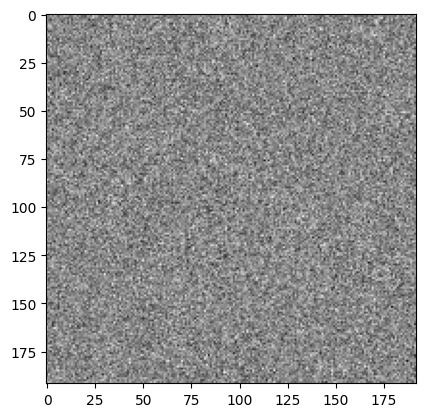

In [9]:
for step,batch in enumerate(train_loader):
    image = batch['low_res_image']#4,1,300,320,208
    print(image.shape)
    plt.imshow(image[0,0,...,0,:],cmap='gray')
    break

## validation

In [10]:
val_transforms = transforms.Compose(
    [
          transforms.LoadImaged(keys=["image",'low_res_image']),
        transforms.EnsureChannelFirstd(keys=["image","low_res_image"]),
        transforms.ScaleIntensityd(
                keys=["image",'low_res_image'],
                minv=0.0,
                maxv=1.0,
        ),           
#         transforms.SpatialPadd(keys=['image','low_res_image'],spatial_size=(256,256,256)),
        transforms.CenterSpatialCropd(keys=['image','low_res_image'],roi_size = (192,220,192)),
    ]
)
val_ds = CacheDataset(data=valid_data, transform=val_transforms)
val_loader = DataLoader(val_ds, batch_size=2, shuffle=True, num_workers=4)

Loading dataset: 100%|███████████████████████████████████████████| 7/7 [00:08<00:00,  1.25s/it]


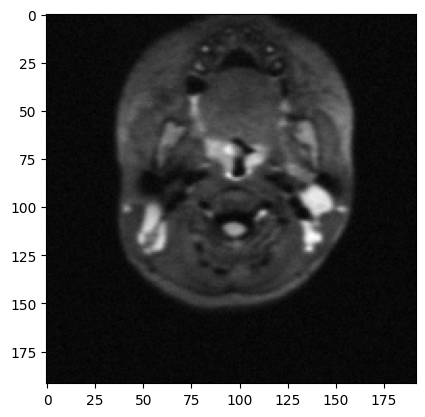

In [11]:
for step,batch in enumerate(val_loader):
    image = batch['low_res_image']#4,1,300,320,208
#     print(image.shape)
    plt.imshow(image[0,0,...,170,:],cmap='gray')
    

## Model

In [12]:
def get_outnorm(x:torch.Tensor, out_norm:str='') -> torch.Tensor:
    """ Common function to get a loss normalization value. Can
        normalize by either the batch size ('b'), the number of
        channels ('c'), the image size ('i') or combinations
        ('bi', 'bci', etc)
    """
    # b, c, h, w = x.size()
    img_shape = x.shape

    if not out_norm:
        return 1

    norm = 1
    if 'b' in out_norm:
        # normalize by batch size
        # norm /= b
        norm /= img_shape[0]
    if 'c' in out_norm:
        # normalize by the number of channels
        # norm /= c
        norm /= img_shape[-3]
    if 'i' in out_norm:
        # normalize by image/map size
        # norm /= h*w
        norm /= img_shape[-1]*img_shape[-2]

    return norm

In [13]:
class CharbonnierLoss(torch.nn.Module):
    """Charbonnier Loss (L1)"""
    def __init__(self, eps=1e-6, out_norm:str='bci'):
        super(CharbonnierLoss, self).__init__()
        self.eps = eps
        self.out_norm = out_norm

    def forward(self, x, y):
        norm = get_outnorm(x, self.out_norm)
        loss = torch.sum(torch.sqrt((x - y).pow(2) + self.eps**2))
        return loss*norm

In [14]:
# model = net(upscale=1, in_chans=1, img_size=192, window_size=8,
#                     img_range=1., depths=[4, 4, 4, 4], embed_dim=90, num_heads=[5, 5, 5, 5],
#                     mlp_ratio=2, upsampler='', resi_connection='1conv').to(device)
model = monai.networks.nets.UNet(
        spatial_dims=2,
        in_channels=1,
        out_channels=1,
        channels=(64, 128, 256, 512),
        strides=(2, 2, 2),
        num_res_units=3,
    ).to(device)

perceptual_loss = PerceptualLoss(spatial_dims = 2,network_type = 'alex').to(device)
loss_function_c = CharbonnierLoss()
loss_function = torch.nn.L1Loss()

# loss_function = CharbonnierLoss()
optimizer = torch.optim.AdamW(model.parameters(), 1e-4)
model.load_state_dict(torch.load(os.path.join("./weight/UNET_ISMRM_v2_last.pth")))

The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.


<All keys matched successfully>

In [15]:
def validation(val_loader):
    model.eval()
    with torch.no_grad():
        for step,batch in tqdm(enumerate(val_loader)):
            rand = random.randint(0,219)
            images = batch['low_res_image']
#             images = images.squeeze(1)
            images = images[...,rand,:].to(device)
#             images = images.permute(0,2,1,3)

            target = batch['image'][...,rand,:].to(device)
            
            val_output = model(images)
            perceptual = perceptual_loss(val_output,target)
            l1 = loss_function(val_output,target)
            loss = 0.01*perceptual + 0.99*l1

#             loss = loss_function(val_output,target)
    plt.subplot(131)
    plt.imshow(images[0,0,...].detach().cpu(),cmap='gray',vmin=0,vmax=0.5)
    plt.axis('off')
    plt.title('input')

    plt.subplot(132)
    plt.imshow(target[0,0,...].detach().cpu(),cmap='gray',vmin=0,vmax=0.5)
    plt.axis('off')
    plt.title('gt')

    plt.subplot(133)
    plt.imshow(val_output[0,0,...].detach().cpu(),cmap='gray',vmin=0,vmax=0.5)
    plt.title('prediction')

    plt.axis('off')
    plt.show()
    return loss.item()
    

20it [00:02,  7.33it/s]

Epoch 1, Loss: 0.028002505423501134



4it [00:00,  9.53it/s]


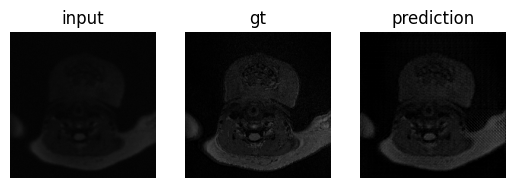

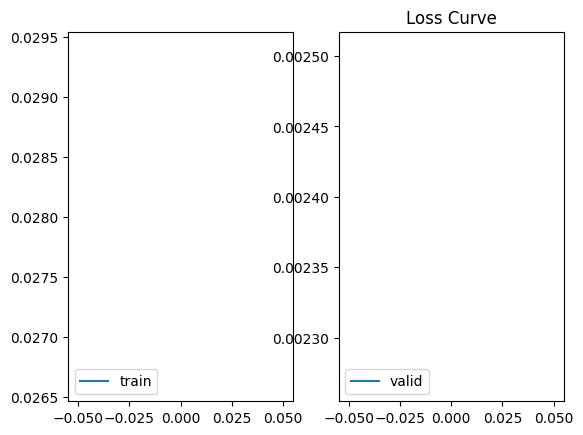

Model was saved! Current Best Dice 0.0023860603105276823


20it [00:02,  9.82it/s]


Epoch 2, Loss: 0.026314555876888336


20it [00:01, 10.26it/s]


Epoch 3, Loss: 0.023077912582084536


20it [00:01, 10.13it/s]


Epoch 4, Loss: 0.02436767378821969


20it [00:01, 10.20it/s]


Epoch 5, Loss: 0.02129798266105354


20it [00:01, 10.08it/s]


Epoch 6, Loss: 0.022105380799621342


20it [00:02,  9.99it/s]


Epoch 7, Loss: 0.022788280714303256


20it [00:02,  9.51it/s]


Epoch 8, Loss: 0.02175375078804791


20it [00:02,  9.89it/s]


Epoch 9, Loss: 0.017849427671171723


20it [00:02,  9.97it/s]


Epoch 10, Loss: 0.020503257308155297


20it [00:02,  9.94it/s]


Epoch 11, Loss: 0.019644148903898893


20it [00:02,  9.92it/s]


Epoch 12, Loss: 0.024832761054858564


20it [00:01, 10.51it/s]


Epoch 13, Loss: 0.022428474249318243


20it [00:01, 10.40it/s]


Epoch 14, Loss: 0.019596572010777892


20it [00:01, 10.11it/s]


Epoch 15, Loss: 0.021465230127796532


20it [00:01, 10.13it/s]


Epoch 16, Loss: 0.021668259426951407


20it [00:02,  9.98it/s]


Epoch 17, Loss: 0.024145516101270914


20it [00:02,  9.75it/s]


Epoch 18, Loss: 0.020646080863662063


20it [00:01, 10.42it/s]


Epoch 19, Loss: 0.02229727553203702


20it [00:01, 10.13it/s]


Epoch 20, Loss: 0.019641528418287636


20it [00:01, 10.14it/s]


Epoch 21, Loss: 0.021982344146817923


20it [00:01, 10.73it/s]


Epoch 22, Loss: 0.022418047441169618


20it [00:01, 10.63it/s]


Epoch 23, Loss: 0.020005972823128104


20it [00:01, 10.32it/s]


Epoch 24, Loss: 0.023046130407601596


20it [00:01, 10.03it/s]


Epoch 25, Loss: 0.021896579721942543


20it [00:01, 10.32it/s]


Epoch 26, Loss: 0.02010459841694683


20it [00:01, 10.41it/s]


Epoch 27, Loss: 0.02079504313878715


20it [00:02,  9.46it/s]


Epoch 28, Loss: 0.01976569090038538


20it [00:01, 10.49it/s]


Epoch 29, Loss: 0.018412368011195213


20it [00:01, 10.11it/s]


Epoch 30, Loss: 0.023536185175180434


20it [00:01, 10.26it/s]


Epoch 31, Loss: 0.02394457827322185


20it [00:01, 10.15it/s]


Epoch 32, Loss: 0.021375447511672974


20it [00:01, 10.70it/s]


Epoch 33, Loss: 0.02051036977209151


20it [00:01, 10.12it/s]


Epoch 34, Loss: 0.024788882629945875


20it [00:01, 10.42it/s]


Epoch 35, Loss: 0.021005400898866357


20it [00:01, 10.15it/s]


Epoch 36, Loss: 0.020364691596478225


20it [00:01, 10.55it/s]


Epoch 37, Loss: 0.021575860772281887


20it [00:02,  9.92it/s]


Epoch 38, Loss: 0.02271236917003989


20it [00:02,  9.51it/s]


Epoch 39, Loss: 0.023838589387014508


20it [00:01, 10.90it/s]


Epoch 40, Loss: 0.02384767630137503


20it [00:01, 10.15it/s]


Epoch 41, Loss: 0.020700436946935952


20it [00:02,  9.95it/s]


Epoch 42, Loss: 0.018107097968459128


20it [00:01, 10.41it/s]


Epoch 43, Loss: 0.020950763626024126


20it [00:02,  9.99it/s]


Epoch 44, Loss: 0.02124819471500814


20it [00:02,  9.80it/s]


Epoch 45, Loss: 0.020808230433613063


20it [00:01, 10.28it/s]


Epoch 46, Loss: 0.022584516275674104


20it [00:01, 10.41it/s]


Epoch 47, Loss: 0.022331064636819064


20it [00:01, 10.26it/s]


Epoch 48, Loss: 0.02134067246224731


20it [00:02,  9.61it/s]


Epoch 49, Loss: 0.01907189963385463


20it [00:02, 10.00it/s]


Epoch 50, Loss: 0.019453947688452898


20it [00:01, 10.22it/s]

Epoch 51, Loss: 0.021308269235305488



4it [00:00,  9.61it/s]


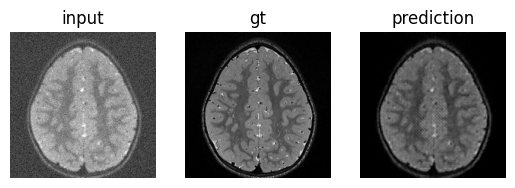

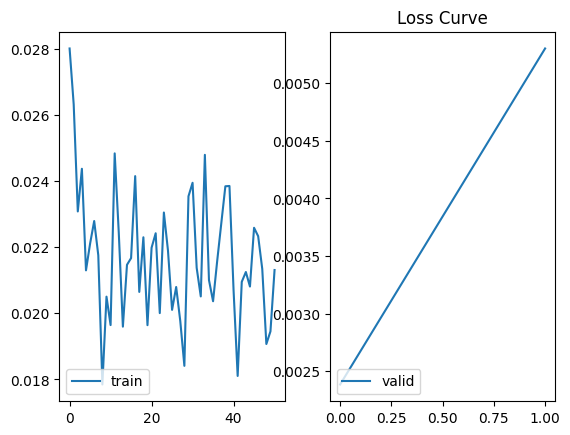

20it [00:01, 10.30it/s]


Epoch 52, Loss: 0.021297547314316035


20it [00:01, 10.03it/s]


Epoch 53, Loss: 0.01939529818482697


20it [00:01, 10.30it/s]


Epoch 54, Loss: 0.022737066261470318


20it [00:01, 10.26it/s]


Epoch 55, Loss: 0.019476185413077475


20it [00:02,  9.95it/s]


Epoch 56, Loss: 0.02181841938290745


20it [00:01, 10.12it/s]


Epoch 57, Loss: 0.024260977888479827


20it [00:02,  9.65it/s]


Epoch 58, Loss: 0.021346969297155738


20it [00:01, 10.34it/s]


Epoch 59, Loss: 0.01993613294325769


20it [00:01, 10.55it/s]


Epoch 60, Loss: 0.020954285701736807


20it [00:01, 10.04it/s]


Epoch 61, Loss: 0.019180809566751122


20it [00:01, 10.36it/s]


Epoch 62, Loss: 0.02160413721576333


20it [00:01, 10.52it/s]


Epoch 63, Loss: 0.02351184266153723


20it [00:01, 10.31it/s]


Epoch 64, Loss: 0.022468752739951015


20it [00:01, 10.25it/s]


Epoch 65, Loss: 0.02086174881551415


20it [00:01, 10.07it/s]


Epoch 66, Loss: 0.01866905705537647


20it [00:01, 10.10it/s]


Epoch 67, Loss: 0.021468564588576555


20it [00:02,  9.90it/s]


Epoch 68, Loss: 0.01884793690405786


20it [00:01, 10.06it/s]


Epoch 69, Loss: 0.019891412835568188


20it [00:02,  9.86it/s]


Epoch 70, Loss: 0.019469903036952018


20it [00:02,  9.98it/s]


Epoch 71, Loss: 0.02512262258678675


20it [00:01, 10.33it/s]


Epoch 72, Loss: 0.0247439906001091


20it [00:02,  9.92it/s]


Epoch 73, Loss: 0.02201936240307987


20it [00:01, 10.27it/s]


Epoch 74, Loss: 0.02148442098405212


20it [00:01, 10.18it/s]


Epoch 75, Loss: 0.019304674211889507


20it [00:02,  9.99it/s]


Epoch 76, Loss: 0.02218956993892789


20it [00:01, 10.48it/s]


Epoch 77, Loss: 0.019741222821176053


20it [00:01, 10.78it/s]


Epoch 78, Loss: 0.01691647432744503


20it [00:02,  9.88it/s]


Epoch 79, Loss: 0.020263135503046214


20it [00:01, 10.07it/s]


Epoch 80, Loss: 0.01852216487750411


20it [00:01, 10.46it/s]


Epoch 81, Loss: 0.020923498715274037


20it [00:02,  9.85it/s]


Epoch 82, Loss: 0.020282339002005757


20it [00:01, 10.17it/s]


Epoch 83, Loss: 0.023193763848394156


20it [00:02,  9.93it/s]


Epoch 84, Loss: 0.020839233277365567


20it [00:01, 10.05it/s]


Epoch 85, Loss: 0.021049469895660877


20it [00:01, 10.06it/s]


Epoch 86, Loss: 0.018899915972724557


20it [00:01, 10.43it/s]


Epoch 87, Loss: 0.020328586967661978


20it [00:02,  9.90it/s]


Epoch 88, Loss: 0.019193913880735637


20it [00:01, 10.07it/s]


Epoch 89, Loss: 0.02105737174861133


20it [00:01, 10.51it/s]


Epoch 90, Loss: 0.017564041283912958


20it [00:02,  9.97it/s]


Epoch 91, Loss: 0.0211416550911963


20it [00:02,  9.84it/s]


Epoch 92, Loss: 0.022258730581961574


20it [00:01, 10.39it/s]


Epoch 93, Loss: 0.026022554747760294


20it [00:01, 10.20it/s]


Epoch 94, Loss: 0.02144832508638501


20it [00:01, 10.08it/s]


Epoch 95, Loss: 0.021319065731950103


20it [00:01, 10.18it/s]


Epoch 96, Loss: 0.018155034584924578


20it [00:02,  9.99it/s]


Epoch 97, Loss: 0.020493832929059864


20it [00:02,  9.81it/s]


Epoch 98, Loss: 0.020740019297227262


20it [00:02,  9.37it/s]


Epoch 99, Loss: 0.020663793035782873


20it [00:01, 10.16it/s]


Epoch 100, Loss: 0.02141414084471762


20it [00:02,  9.82it/s]

Epoch 101, Loss: 0.01810377782676369



4it [00:00,  9.00it/s]


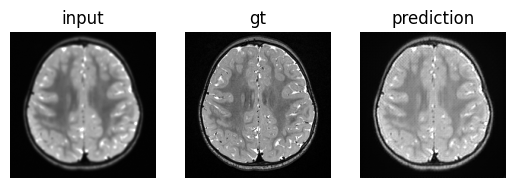

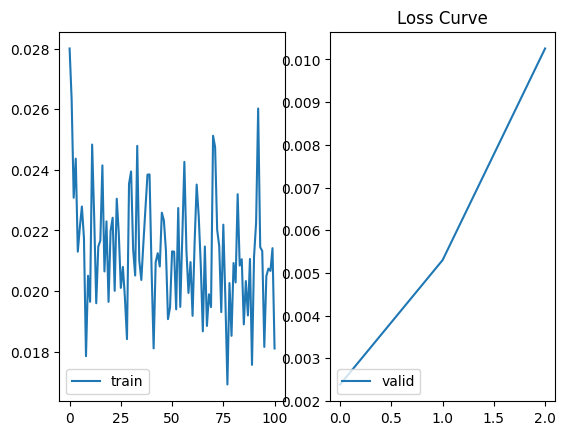

20it [00:01, 10.10it/s]


Epoch 102, Loss: 0.01722902534529567


20it [00:01, 10.32it/s]


Epoch 103, Loss: 0.017960686609148978


20it [00:02,  9.91it/s]


Epoch 104, Loss: 0.019569534901529552


20it [00:01, 10.08it/s]


Epoch 105, Loss: 0.019424624834209682


20it [00:01, 10.40it/s]


Epoch 106, Loss: 0.019670756184495986


20it [00:01, 10.15it/s]


Epoch 107, Loss: 0.019737892830744386


20it [00:02,  9.79it/s]


Epoch 108, Loss: 0.020492510637268424


20it [00:01, 10.40it/s]


Epoch 109, Loss: 0.0220872163772583


20it [00:01, 10.52it/s]


Epoch 110, Loss: 0.022063213819637894


20it [00:02,  9.98it/s]


Epoch 111, Loss: 0.023191931820474566


20it [00:01, 10.06it/s]


Epoch 112, Loss: 0.021267138421535492


20it [00:01, 10.16it/s]


Epoch 113, Loss: 0.020001413230784238


20it [00:02,  9.99it/s]


Epoch 114, Loss: 0.019534201198257505


20it [00:02,  9.92it/s]


Epoch 115, Loss: 0.02273918860591948


20it [00:01, 10.24it/s]


Epoch 116, Loss: 0.02067036502994597


20it [00:01, 10.21it/s]


Epoch 117, Loss: 0.021793971257284283


20it [00:02,  9.66it/s]


Epoch 118, Loss: 0.02003632504492998


20it [00:01, 10.26it/s]


Epoch 119, Loss: 0.020568021992221474


20it [00:01, 10.13it/s]


Epoch 120, Loss: 0.020709364116191863


20it [00:01, 10.41it/s]


Epoch 121, Loss: 0.02053223131224513


20it [00:02,  9.75it/s]


Epoch 122, Loss: 0.02199591468088329


20it [00:02,  9.95it/s]


Epoch 123, Loss: 0.020131698460318148


20it [00:01, 10.15it/s]


Epoch 124, Loss: 0.020467797992751002


20it [00:02,  9.87it/s]


Epoch 125, Loss: 0.0190752423601225


20it [00:01, 10.35it/s]


Epoch 126, Loss: 0.02018809497822076


20it [00:01, 10.27it/s]


Epoch 127, Loss: 0.018479455565102398


20it [00:02,  9.55it/s]


Epoch 128, Loss: 0.024645543145015835


20it [00:01, 10.30it/s]


Epoch 129, Loss: 0.020166506548412143


20it [00:01, 10.00it/s]


Epoch 130, Loss: 0.020064876042306425


20it [00:01, 10.06it/s]


Epoch 131, Loss: 0.020758134848438203


20it [00:02,  9.93it/s]


Epoch 132, Loss: 0.023301481502130628


20it [00:01, 10.19it/s]


Epoch 133, Loss: 0.018138774309773


20it [00:01, 10.01it/s]


Epoch 134, Loss: 0.021351561020128428


20it [00:01, 10.37it/s]


Epoch 135, Loss: 0.019247336545959115


20it [00:01, 10.05it/s]


Epoch 136, Loss: 0.019948103372007607


20it [00:01, 10.31it/s]


Epoch 137, Loss: 0.020810470124706625


20it [00:01, 10.16it/s]


Epoch 138, Loss: 0.01844327603466809


20it [00:02,  9.51it/s]


Epoch 139, Loss: 0.02092879223637283


20it [00:02,  9.82it/s]


Epoch 140, Loss: 0.02145325131714344


20it [00:01, 10.68it/s]


Epoch 141, Loss: 0.02136418572627008


20it [00:02,  9.78it/s]


Epoch 142, Loss: 0.018767840648069977


20it [00:01, 10.14it/s]


Epoch 143, Loss: 0.01949019671883434


20it [00:01, 10.22it/s]


Epoch 144, Loss: 0.019712294219061732


20it [00:01, 10.30it/s]


Epoch 145, Loss: 0.020003557368181647


20it [00:01, 10.31it/s]


Epoch 146, Loss: 0.022827634913846852


20it [00:01, 10.27it/s]


Epoch 147, Loss: 0.022737361816689373


20it [00:01, 10.14it/s]


Epoch 148, Loss: 0.019363249791786073


20it [00:02, 10.00it/s]


Epoch 149, Loss: 0.020584150520153343


20it [00:02,  9.77it/s]


Epoch 150, Loss: 0.02194358827546239


20it [00:01, 10.15it/s]

Epoch 151, Loss: 0.021200012508779766



4it [00:00,  9.91it/s]


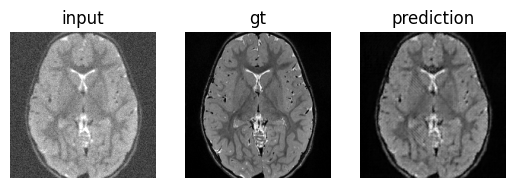

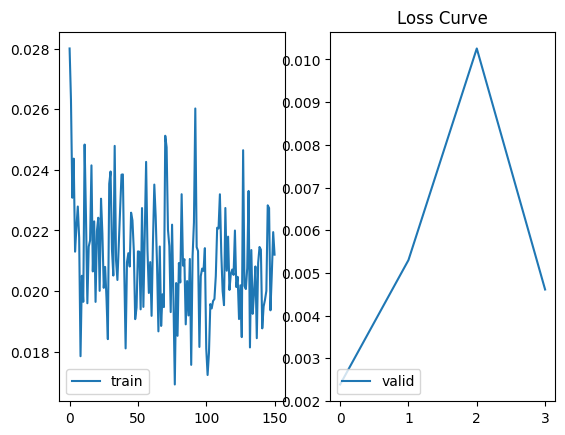

20it [00:02,  9.77it/s]


Epoch 152, Loss: 0.022905475227162242


20it [00:01, 10.15it/s]


Epoch 153, Loss: 0.02001809673383832


20it [00:02,  9.97it/s]


Epoch 154, Loss: 0.021414453350007533


20it [00:01, 10.64it/s]


Epoch 155, Loss: 0.01965959663502872


20it [00:01, 10.30it/s]


Epoch 156, Loss: 0.01870031710714102


20it [00:01, 10.24it/s]


Epoch 157, Loss: 0.020842333510518073


20it [00:02,  9.92it/s]


Epoch 158, Loss: 0.019398930994793773


20it [00:02,  9.37it/s]


Epoch 159, Loss: 0.018252552882768214


20it [00:01, 10.25it/s]


Epoch 160, Loss: 0.02038324186578393


20it [00:02,  9.92it/s]


Epoch 161, Loss: 0.02123328116722405


20it [00:02,  9.82it/s]


Epoch 162, Loss: 0.019903099304065107


20it [00:01, 10.11it/s]


Epoch 163, Loss: 0.019955353951081632


20it [00:02,  9.91it/s]


Epoch 164, Loss: 0.019784080469980835


20it [00:01, 10.33it/s]


Epoch 165, Loss: 0.023400333896279334


20it [00:01, 10.14it/s]


Epoch 166, Loss: 0.02079008654691279


20it [00:01, 10.21it/s]


Epoch 167, Loss: 0.02209379824344069


20it [00:01, 10.01it/s]


Epoch 168, Loss: 0.0198501679347828


20it [00:01, 10.11it/s]


Epoch 169, Loss: 0.02192631890065968


20it [00:01, 10.13it/s]


Epoch 170, Loss: 0.02329846112988889


20it [00:01, 10.20it/s]


Epoch 171, Loss: 0.01868355239275843


20it [00:01, 10.31it/s]


Epoch 172, Loss: 0.019189127488061786


20it [00:01, 10.13it/s]


Epoch 173, Loss: 0.020631562918424606


20it [00:02,  9.68it/s]


Epoch 174, Loss: 0.01996820527128875


20it [00:01, 10.09it/s]


Epoch 175, Loss: 0.017562243505381048


20it [00:01, 10.37it/s]


Epoch 176, Loss: 0.018151150667108595


20it [00:01, 10.18it/s]


Epoch 177, Loss: 0.01927886646008119


20it [00:01, 10.15it/s]


Epoch 178, Loss: 0.019576827762648463


20it [00:01, 10.07it/s]


Epoch 179, Loss: 0.018363805045373736


20it [00:01, 10.24it/s]


Epoch 180, Loss: 0.020771383913233875


20it [00:02,  9.58it/s]


Epoch 181, Loss: 0.018374927737750114


20it [00:01, 10.40it/s]


Epoch 182, Loss: 0.022208710247650743


20it [00:02,  9.98it/s]


Epoch 183, Loss: 0.016629578825086356


20it [00:01, 10.32it/s]


Epoch 184, Loss: 0.023670730693265796


20it [00:01, 10.32it/s]


Epoch 185, Loss: 0.018359829881228508


20it [00:01, 10.02it/s]


Epoch 186, Loss: 0.018648257991299034


20it [00:01, 10.08it/s]


Epoch 187, Loss: 0.01972445985302329


20it [00:01, 10.61it/s]


Epoch 188, Loss: 0.019309820560738444


20it [00:01, 10.10it/s]


Epoch 189, Loss: 0.02042149512562901


20it [00:01, 10.09it/s]


Epoch 190, Loss: 0.018646917981095613


20it [00:02,  9.61it/s]


Epoch 191, Loss: 0.021224966272711754


20it [00:02,  9.83it/s]


Epoch 192, Loss: 0.021460133139044046


20it [00:02,  9.82it/s]


Epoch 193, Loss: 0.019091937877237796


20it [00:01, 10.34it/s]


Epoch 194, Loss: 0.02408141647465527


20it [00:01, 10.04it/s]


Epoch 195, Loss: 0.01952772354707122


20it [00:01, 10.16it/s]


Epoch 196, Loss: 0.01887553306296468


20it [00:01, 10.14it/s]


Epoch 197, Loss: 0.017827774095349014


20it [00:01, 10.30it/s]


Epoch 198, Loss: 0.018767204112373294


20it [00:02,  9.65it/s]


Epoch 199, Loss: 0.022110230475664138


20it [00:02,  9.64it/s]


Epoch 200, Loss: 0.02095498840790242


20it [00:01, 10.49it/s]

Epoch 201, Loss: 0.018500407133251427



4it [00:00,  5.37it/s]


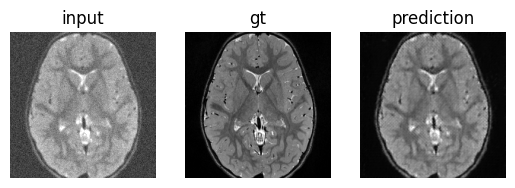

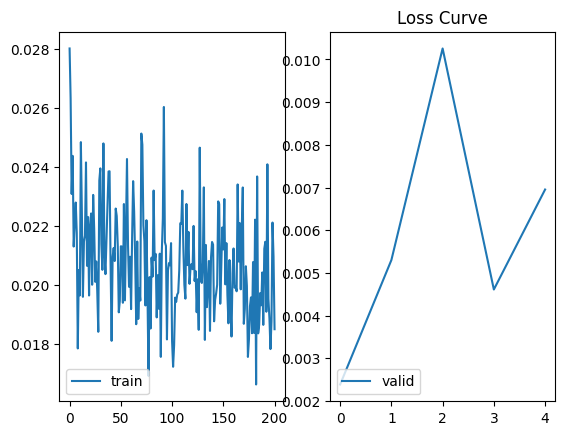

20it [00:01, 10.39it/s]


Epoch 202, Loss: 0.019566844310611488


20it [00:01, 10.24it/s]


Epoch 203, Loss: 0.017385965143330396


20it [00:01, 10.04it/s]


Epoch 204, Loss: 0.022788449469953776


20it [00:01, 10.04it/s]


Epoch 205, Loss: 0.018787536956369876


20it [00:01, 10.20it/s]


Epoch 206, Loss: 0.020310534606687726


20it [00:01, 10.03it/s]


Epoch 207, Loss: 0.02063605128787458


20it [00:02,  9.95it/s]


Epoch 208, Loss: 0.018290419992990792


20it [00:01, 10.28it/s]


Epoch 209, Loss: 0.017754921689629555


20it [00:02,  9.62it/s]


Epoch 210, Loss: 0.018603321607224645


20it [00:02,  9.96it/s]


Epoch 211, Loss: 0.02328813588246703


20it [00:01, 10.23it/s]


Epoch 212, Loss: 0.023336125165224077


20it [00:01, 10.55it/s]


Epoch 213, Loss: 0.015403540106490254


20it [00:02,  9.92it/s]


Epoch 214, Loss: 0.018074531760066747


20it [00:01, 10.32it/s]


Epoch 215, Loss: 0.021837729471735658


20it [00:01, 10.14it/s]


Epoch 216, Loss: 0.020211211359128355


20it [00:01, 10.11it/s]


Epoch 217, Loss: 0.02106088390573859


20it [00:01, 10.08it/s]


Epoch 218, Loss: 0.020919355796650052


20it [00:02,  9.91it/s]


Epoch 219, Loss: 0.017825164808891715


20it [00:02,  9.92it/s]


Epoch 220, Loss: 0.019920472777448593


20it [00:02, 10.00it/s]


Epoch 221, Loss: 0.01833025098312646


20it [00:01, 10.31it/s]


Epoch 222, Loss: 0.020601086132228375


20it [00:02,  9.95it/s]


Epoch 223, Loss: 0.02071111318655312


20it [00:01, 10.06it/s]


Epoch 224, Loss: 0.01992276681121439


20it [00:01, 10.09it/s]


Epoch 225, Loss: 0.017071714648045598


20it [00:01, 10.33it/s]


Epoch 226, Loss: 0.018747516139410437


20it [00:01, 10.12it/s]


Epoch 227, Loss: 0.01804705266840756


20it [00:01, 10.31it/s]


Epoch 228, Loss: 0.019049683690536768


20it [00:01, 10.36it/s]


Epoch 229, Loss: 0.020944069186225534


20it [00:01, 10.38it/s]


Epoch 230, Loss: 0.020555278984829783


20it [00:02,  9.78it/s]


Epoch 231, Loss: 0.02092501176521182


20it [00:01, 10.26it/s]


Epoch 232, Loss: 0.01761263320222497


20it [00:01, 10.11it/s]


Epoch 233, Loss: 0.01937020884361118


20it [00:01, 10.17it/s]


Epoch 234, Loss: 0.01847921807784587


20it [00:02,  9.38it/s]


Epoch 235, Loss: 0.020367478928528727


20it [00:01, 10.05it/s]


Epoch 236, Loss: 0.02017411107663065


20it [00:01, 10.22it/s]


Epoch 237, Loss: 0.01657130536623299


20it [00:01, 10.45it/s]


Epoch 238, Loss: 0.018894737144000827


20it [00:01, 10.17it/s]


Epoch 239, Loss: 0.020718722231686117


20it [00:01, 10.32it/s]


Epoch 240, Loss: 0.019405156024731696


20it [00:02,  9.79it/s]


Epoch 241, Loss: 0.02011339506134391


20it [00:01, 10.62it/s]


Epoch 242, Loss: 0.0179846913786605


20it [00:02,  9.93it/s]


Epoch 243, Loss: 0.018232175940647723


20it [00:01, 10.08it/s]


Epoch 244, Loss: 0.017661698814481496


20it [00:01, 10.17it/s]


Epoch 245, Loss: 0.01659815260209143


20it [00:02,  9.82it/s]


Epoch 246, Loss: 0.019317216123454273


20it [00:01, 10.21it/s]


Epoch 247, Loss: 0.023566373530775307


20it [00:01, 10.48it/s]


Epoch 248, Loss: 0.018416831525973974


20it [00:01, 10.47it/s]


Epoch 249, Loss: 0.01912054098211229


20it [00:01, 10.45it/s]


Epoch 250, Loss: 0.020656253257766367


20it [00:02,  9.35it/s]

Epoch 251, Loss: 0.01882445765659213



4it [00:00,  8.62it/s]


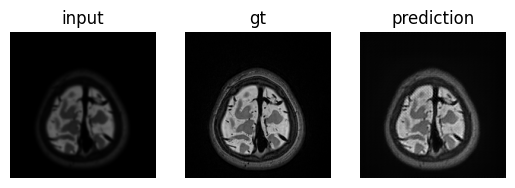

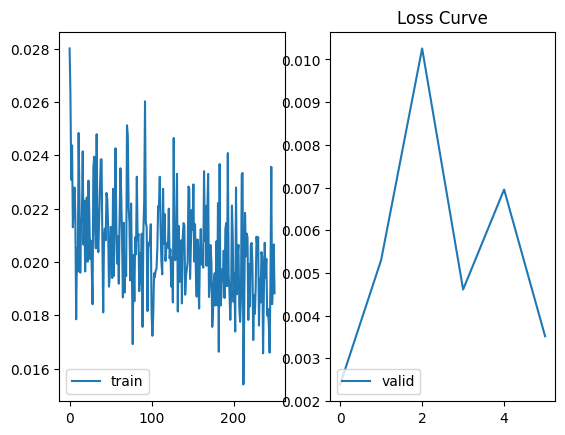

20it [00:02,  9.94it/s]


Epoch 252, Loss: 0.016650385642424225


20it [00:01, 10.51it/s]


Epoch 253, Loss: 0.0190334684913978


20it [00:01, 10.27it/s]


Epoch 254, Loss: 0.018697081366553903


20it [00:01, 10.10it/s]


Epoch 255, Loss: 0.018740037409588694


20it [00:01, 10.49it/s]


Epoch 256, Loss: 0.020155413425527513


20it [00:02,  9.73it/s]


Epoch 257, Loss: 0.020924590108916164


20it [00:01, 10.06it/s]


Epoch 258, Loss: 0.021582619356922805


20it [00:01, 10.44it/s]


Epoch 259, Loss: 0.019177756877616046


20it [00:02,  9.59it/s]


Epoch 260, Loss: 0.01982933955732733


20it [00:02,  9.79it/s]


Epoch 261, Loss: 0.019561375910416245


20it [00:01, 10.13it/s]


Epoch 262, Loss: 0.021200189541559666


20it [00:01, 10.77it/s]


Epoch 263, Loss: 0.02055840918328613


20it [00:01, 10.09it/s]


Epoch 264, Loss: 0.01999053033068776


20it [00:01, 10.13it/s]


Epoch 265, Loss: 0.018315410241484642


20it [00:02,  9.86it/s]


Epoch 266, Loss: 0.019967881171032785


20it [00:01, 10.36it/s]


Epoch 267, Loss: 0.019160220725461842


20it [00:01, 10.27it/s]


Epoch 268, Loss: 0.018601736635901034


20it [00:01, 10.19it/s]


Epoch 269, Loss: 0.02043405387084931


20it [00:01, 10.47it/s]


Epoch 270, Loss: 0.021919404109939932


20it [00:02,  9.65it/s]


Epoch 271, Loss: 0.019252895773388446


20it [00:02,  9.85it/s]


Epoch 272, Loss: 0.020299088698811828


20it [00:02,  9.95it/s]


Epoch 273, Loss: 0.018763337354175746


20it [00:02,  9.79it/s]


Epoch 274, Loss: 0.017919436655938627


20it [00:01, 10.18it/s]


Epoch 275, Loss: 0.0176711893058382


20it [00:01, 10.08it/s]


Epoch 276, Loss: 0.020167791517451406


20it [00:02,  9.90it/s]


Epoch 277, Loss: 0.019935619411990048


20it [00:02,  9.86it/s]


Epoch 278, Loss: 0.017717544198967518


20it [00:01, 10.14it/s]


Epoch 279, Loss: 0.020876936172135173


20it [00:02,  9.94it/s]


Epoch 280, Loss: 0.018023982760496438


20it [00:02,  9.86it/s]


Epoch 281, Loss: 0.018701994186267258


20it [00:02,  9.99it/s]


Epoch 282, Loss: 0.015515937632881106


20it [00:01, 10.01it/s]


Epoch 283, Loss: 0.017279248079285027


20it [00:01, 10.20it/s]


Epoch 284, Loss: 0.017473189951851965


20it [00:02,  9.91it/s]


Epoch 285, Loss: 0.021383452229201794


20it [00:01, 10.40it/s]


Epoch 286, Loss: 0.018672388000413775


20it [00:01, 10.16it/s]


Epoch 287, Loss: 0.019821490300819276


20it [00:01, 10.20it/s]


Epoch 288, Loss: 0.01902828263118863


20it [00:02, 10.00it/s]


Epoch 289, Loss: 0.01708723488263786


20it [00:01, 10.14it/s]


Epoch 290, Loss: 0.019956139964051545


20it [00:02,  9.29it/s]


Epoch 291, Loss: 0.020099640311673283


20it [00:02,  9.99it/s]


Epoch 292, Loss: 0.02116726799868047


20it [00:01, 10.24it/s]


Epoch 293, Loss: 0.019416766427457332


20it [00:02,  9.92it/s]


Epoch 294, Loss: 0.01974073362071067


20it [00:02,  9.62it/s]


Epoch 295, Loss: 0.0209836432011798


20it [00:01, 10.35it/s]


Epoch 296, Loss: 0.016266335872933267


20it [00:01, 10.29it/s]


Epoch 297, Loss: 0.021321817208081482


20it [00:01, 10.45it/s]


Epoch 298, Loss: 0.01997001958079636


20it [00:02,  9.86it/s]


Epoch 299, Loss: 0.017606769944541155


20it [00:01, 10.33it/s]


Epoch 300, Loss: 0.019006964075379072


20it [00:01, 10.14it/s]

Epoch 301, Loss: 0.02032819043379277



4it [00:00, 10.05it/s]


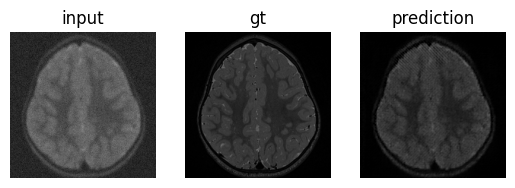

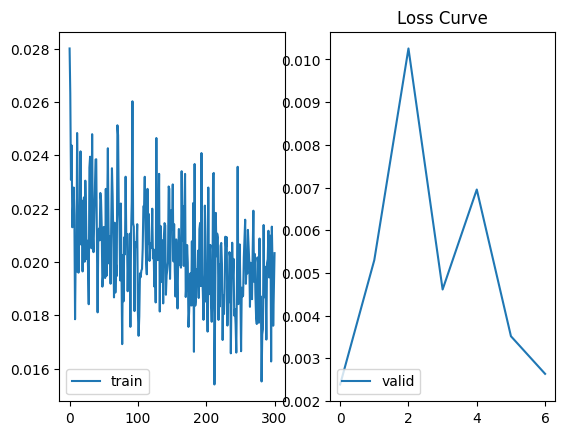

20it [00:01, 10.03it/s]


Epoch 302, Loss: 0.020921923220157623


20it [00:02,  9.99it/s]


Epoch 303, Loss: 0.01843021789100021


20it [00:02,  9.64it/s]


Epoch 304, Loss: 0.019014515494927765


20it [00:01, 10.30it/s]


Epoch 305, Loss: 0.020669502415694298


20it [00:02,  9.91it/s]


Epoch 306, Loss: 0.019892341177910566


20it [00:01, 10.32it/s]


Epoch 307, Loss: 0.020724199269898234


20it [00:01, 10.35it/s]


Epoch 308, Loss: 0.017417995491996408


20it [00:02,  9.94it/s]


Epoch 309, Loss: 0.019787555397488176


20it [00:01, 10.25it/s]


Epoch 310, Loss: 0.018435158720239996


20it [00:01, 10.59it/s]


Epoch 311, Loss: 0.01711028057616204


20it [00:02,  9.11it/s]


Epoch 312, Loss: 0.015283512359019369


20it [00:01, 10.24it/s]


Epoch 313, Loss: 0.017917967680841685


20it [00:01, 10.13it/s]


Epoch 314, Loss: 0.01965803592465818


20it [00:02,  9.89it/s]


Epoch 315, Loss: 0.016894704801961778


20it [00:01, 10.45it/s]


Epoch 316, Loss: 0.019738362170755863


20it [00:01, 10.43it/s]


Epoch 317, Loss: 0.02043386516161263


20it [00:02,  9.74it/s]


Epoch 318, Loss: 0.021498171845450997


20it [00:01, 10.10it/s]


Epoch 319, Loss: 0.01951776447240263


20it [00:01, 10.28it/s]


Epoch 320, Loss: 0.019031709246337413


20it [00:01, 10.21it/s]


Epoch 321, Loss: 0.018835754692554475


20it [00:02,  9.59it/s]


Epoch 322, Loss: 0.017657899484038352


20it [00:01, 10.34it/s]


Epoch 323, Loss: 0.01589078193064779


20it [00:01, 10.17it/s]


Epoch 324, Loss: 0.02136989012360573


20it [00:01, 10.42it/s]


Epoch 325, Loss: 0.02020717510022223


20it [00:01, 10.38it/s]


Epoch 326, Loss: 0.02136706616729498


20it [00:01, 10.07it/s]


Epoch 327, Loss: 0.016936932352837174


20it [00:01, 10.55it/s]


Epoch 328, Loss: 0.020739818760193884


20it [00:01, 10.25it/s]


Epoch 329, Loss: 0.018562304857186972


20it [00:01, 10.22it/s]


Epoch 330, Loss: 0.02015359189826995


20it [00:01, 10.32it/s]


Epoch 331, Loss: 0.015281292865984142


20it [00:02,  9.67it/s]


Epoch 332, Loss: 0.02106095654889941


20it [00:02,  9.72it/s]


Epoch 333, Loss: 0.01957256505265832


20it [00:01, 10.04it/s]


Epoch 334, Loss: 0.019593420205637813


20it [00:01, 10.31it/s]


Epoch 335, Loss: 0.018720515305176377


20it [00:02,  9.77it/s]


Epoch 336, Loss: 0.017803603142965585


20it [00:02,  9.97it/s]


Epoch 337, Loss: 0.019306805706582962


20it [00:01, 10.21it/s]


Epoch 338, Loss: 0.01974483225494623


20it [00:01, 10.77it/s]


Epoch 339, Loss: 0.019267632020637394


20it [00:01, 10.12it/s]


Epoch 340, Loss: 0.020202637184411287


20it [00:02,  9.75it/s]


Epoch 341, Loss: 0.018665978265926243


20it [00:01, 10.46it/s]


Epoch 342, Loss: 0.020433640386909247


20it [00:01, 10.07it/s]


Epoch 343, Loss: 0.018401382490992546


20it [00:01, 10.18it/s]


Epoch 344, Loss: 0.019123791088350117


20it [00:02,  9.82it/s]


Epoch 345, Loss: 0.017057002405636013


20it [00:01, 10.08it/s]


Epoch 346, Loss: 0.01823491547256708


20it [00:01, 10.03it/s]


Epoch 347, Loss: 0.01966755362227559


20it [00:02,  9.75it/s]


Epoch 348, Loss: 0.02014103145338595


20it [00:01, 10.35it/s]


Epoch 349, Loss: 0.016840416681952776


20it [00:01, 10.07it/s]


Epoch 350, Loss: 0.019054528861306607


20it [00:01, 10.53it/s]

Epoch 351, Loss: 0.018885142006911337



4it [00:00,  9.76it/s]


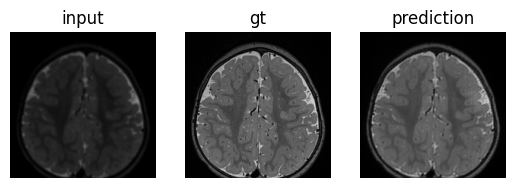

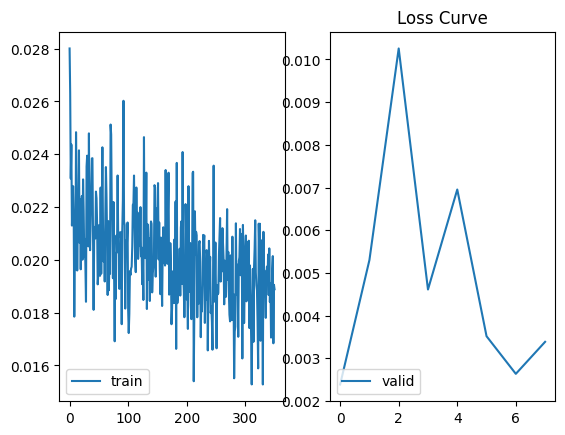

20it [00:02,  9.55it/s]


Epoch 352, Loss: 0.021844702772796154


20it [00:01, 10.29it/s]


Epoch 353, Loss: 0.01992716055829078


20it [00:01, 10.30it/s]


Epoch 354, Loss: 0.0203381999861449


20it [00:02,  9.95it/s]


Epoch 355, Loss: 0.01838718056678772


20it [00:01, 10.18it/s]


Epoch 356, Loss: 0.01812485228292644


20it [00:01, 10.10it/s]


Epoch 357, Loss: 0.016921580722555517


20it [00:02,  9.85it/s]


Epoch 358, Loss: 0.017959412338677795


20it [00:01, 10.25it/s]


Epoch 359, Loss: 0.01774580681230873


20it [00:01, 10.11it/s]


Epoch 360, Loss: 0.017195138055831193


20it [00:02,  9.80it/s]


Epoch 361, Loss: 0.017492456664331257


20it [00:01, 10.01it/s]


Epoch 362, Loss: 0.017474282230250538


20it [00:02,  9.52it/s]


Epoch 363, Loss: 0.0212083725258708


20it [00:01, 10.13it/s]


Epoch 364, Loss: 0.019949553383048622


20it [00:01, 10.64it/s]


Epoch 365, Loss: 0.02072752043604851


20it [00:01, 10.29it/s]


Epoch 366, Loss: 0.018410087353549896


20it [00:01, 10.20it/s]


Epoch 367, Loss: 0.01832209846470505


20it [00:01, 10.02it/s]


Epoch 368, Loss: 0.018901069834828376


20it [00:02,  9.97it/s]


Epoch 369, Loss: 0.01891214892966673


20it [00:02,  9.79it/s]


Epoch 370, Loss: 0.02179444544017315


20it [00:01, 10.57it/s]


Epoch 371, Loss: 0.021096436213701962


20it [00:01, 10.41it/s]


Epoch 372, Loss: 0.017590734548866747


20it [00:02,  9.06it/s]


Epoch 373, Loss: 0.017024422576650978


20it [00:01, 10.10it/s]


Epoch 374, Loss: 0.01974294742103666


20it [00:01, 10.22it/s]


Epoch 375, Loss: 0.0167007879819721


20it [00:01, 10.40it/s]


Epoch 376, Loss: 0.020586660224944354


20it [00:01, 10.21it/s]


Epoch 377, Loss: 0.019213211047463118


20it [00:01, 10.55it/s]


Epoch 378, Loss: 0.01854444758500904


20it [00:01, 10.07it/s]


Epoch 379, Loss: 0.019315158040262757


20it [00:01, 10.04it/s]


Epoch 380, Loss: 0.020403635548427702


20it [00:01, 10.00it/s]


Epoch 381, Loss: 0.019325954606756568


20it [00:01, 10.28it/s]


Epoch 382, Loss: 0.019001015275716782


20it [00:02,  9.85it/s]


Epoch 383, Loss: 0.020460170018486677


20it [00:02,  9.50it/s]


Epoch 384, Loss: 0.019213851098902522


20it [00:01, 10.41it/s]


Epoch 385, Loss: 0.019768903870135544


20it [00:02,  9.85it/s]


Epoch 386, Loss: 0.02094659456051886


20it [00:02,  9.87it/s]


Epoch 387, Loss: 0.019778564386069775


20it [00:01, 10.04it/s]


Epoch 388, Loss: 0.019475058047100903


20it [00:01, 10.19it/s]


Epoch 389, Loss: 0.01940595277119428


20it [00:01, 10.15it/s]


Epoch 390, Loss: 0.01779016605578363


20it [00:01, 10.16it/s]


Epoch 391, Loss: 0.01786657408811152


20it [00:01, 10.70it/s]


Epoch 392, Loss: 0.018237982923164964


20it [00:01, 10.27it/s]


Epoch 393, Loss: 0.018461329839192332


20it [00:01, 10.36it/s]


Epoch 394, Loss: 0.02103871959261596


20it [00:02,  9.60it/s]


Epoch 395, Loss: 0.019373535830527543


20it [00:02,  9.89it/s]


Epoch 396, Loss: 0.01839070748537779


20it [00:02,  9.93it/s]


Epoch 397, Loss: 0.01687186671188101


20it [00:01, 10.25it/s]


Epoch 398, Loss: 0.0199889300391078


20it [00:02,  9.86it/s]


Epoch 399, Loss: 0.020131984539330006


20it [00:02,  9.94it/s]


Epoch 400, Loss: 0.016944100405089556


20it [00:01, 10.18it/s]

Epoch 401, Loss: 0.01694861236028373



4it [00:00,  8.96it/s]


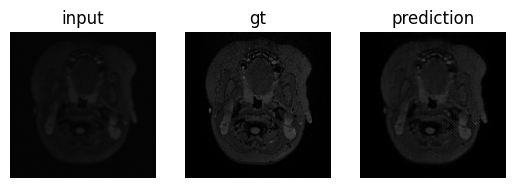

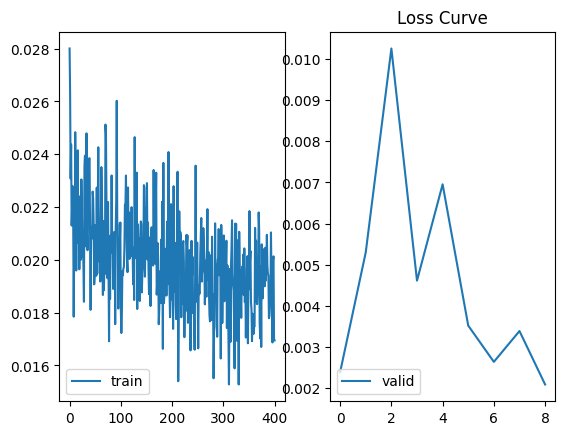

Model was saved! Current Best Dice 0.0020852084271609783


20it [00:01, 10.07it/s]


Epoch 402, Loss: 0.01754709694068879


20it [00:01, 10.66it/s]


Epoch 403, Loss: 0.016210345004219563


20it [00:02,  9.51it/s]


Epoch 404, Loss: 0.01839939074125141


20it [00:01, 10.32it/s]


Epoch 405, Loss: 0.018431384395807982


20it [00:01, 10.03it/s]


Epoch 406, Loss: 0.01828416094649583


20it [00:02,  9.69it/s]


Epoch 407, Loss: 0.016024603159166873


20it [00:01, 10.28it/s]


Epoch 408, Loss: 0.019406631146557628


20it [00:02,  9.98it/s]


Epoch 409, Loss: 0.01808594964677468


20it [00:02,  9.91it/s]


Epoch 410, Loss: 0.017622569808736444


20it [00:02,  9.92it/s]


Epoch 411, Loss: 0.0164515488082543


20it [00:01, 10.24it/s]


Epoch 412, Loss: 0.01770969571080059


20it [00:01, 10.11it/s]


Epoch 413, Loss: 0.018008418125100435


20it [00:01, 10.30it/s]


Epoch 414, Loss: 0.017824062635190784


20it [00:02,  9.74it/s]


Epoch 415, Loss: 0.018980406364426015


20it [00:02,  9.83it/s]


Epoch 416, Loss: 0.01932478090748191


20it [00:02,  9.73it/s]


Epoch 417, Loss: 0.018655203306116162


20it [00:01, 10.04it/s]


Epoch 418, Loss: 0.016957285744138063


20it [00:01, 10.07it/s]


Epoch 419, Loss: 0.016881631081923844


20it [00:01, 10.18it/s]


Epoch 420, Loss: 0.018895182898268102


20it [00:01, 10.14it/s]


Epoch 421, Loss: 0.019192423112690447


20it [00:01, 10.14it/s]


Epoch 422, Loss: 0.019620581599883734


20it [00:01, 10.06it/s]


Epoch 423, Loss: 0.01768499130848795


20it [00:01, 10.23it/s]


Epoch 424, Loss: 0.018166311376262456


20it [00:02,  9.74it/s]


Epoch 425, Loss: 0.016354727372527123


20it [00:01, 10.07it/s]


Epoch 426, Loss: 0.01793312546797097


20it [00:01, 10.18it/s]


Epoch 427, Loss: 0.020119949523359538


20it [00:01, 10.01it/s]


Epoch 428, Loss: 0.018757562385872006


20it [00:02,  9.83it/s]


Epoch 429, Loss: 0.01869279253296554


20it [00:01, 10.25it/s]


Epoch 430, Loss: 0.018302380735985935


20it [00:01, 10.03it/s]


Epoch 431, Loss: 0.016798629565164445


20it [00:01, 10.01it/s]


Epoch 432, Loss: 0.018372754962183536


20it [00:01, 10.49it/s]


Epoch 433, Loss: 0.018030123179778458


20it [00:02,  9.89it/s]


Epoch 434, Loss: 0.018454735493287446


20it [00:01, 10.27it/s]


Epoch 435, Loss: 0.018189338175579904


20it [00:02,  9.58it/s]


Epoch 436, Loss: 0.019838834065012634


20it [00:01, 10.36it/s]


Epoch 437, Loss: 0.016679577971808614


20it [00:01, 10.19it/s]


Epoch 438, Loss: 0.018300741910934448


20it [00:01, 10.18it/s]


Epoch 439, Loss: 0.01999094265047461


20it [00:01, 10.17it/s]


Epoch 440, Loss: 0.018932173494249582


20it [00:01, 10.30it/s]


Epoch 441, Loss: 0.01909358047414571


20it [00:01, 10.11it/s]


Epoch 442, Loss: 0.019248429499566556


20it [00:01, 10.22it/s]


Epoch 443, Loss: 0.018855956266634166


20it [00:01, 10.58it/s]


Epoch 444, Loss: 0.017491302662529053


20it [00:02,  9.86it/s]


Epoch 445, Loss: 0.017778697703033686


20it [00:02,  9.66it/s]


Epoch 446, Loss: 0.017033532832283527


20it [00:01, 10.34it/s]


Epoch 447, Loss: 0.017509077256545425


20it [00:01, 10.15it/s]


Epoch 448, Loss: 0.021128091774880887


20it [00:01, 10.21it/s]


Epoch 449, Loss: 0.016743501601740717


20it [00:01, 10.16it/s]


Epoch 450, Loss: 0.017765639955177902


20it [00:01, 10.34it/s]

Epoch 451, Loss: 0.016985165397636594



4it [00:00,  9.49it/s]


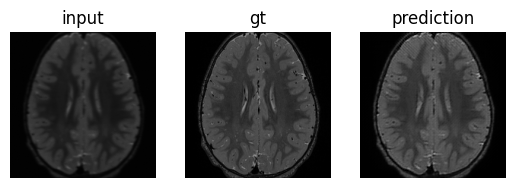

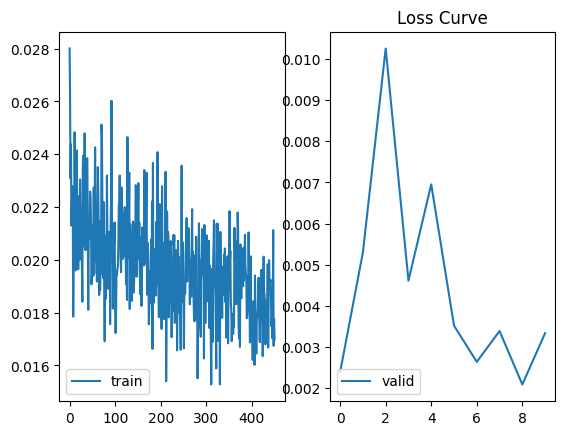

20it [00:01, 10.08it/s]


Epoch 452, Loss: 0.015650849393568932


20it [00:01, 10.63it/s]


Epoch 453, Loss: 0.017955905268900098


20it [00:01, 10.04it/s]


Epoch 454, Loss: 0.018937766226008533


20it [00:02,  9.49it/s]


Epoch 455, Loss: 0.01817928475793451


20it [00:01, 10.15it/s]


Epoch 456, Loss: 0.018824437446892262


20it [00:02,  9.80it/s]


Epoch 457, Loss: 0.016220266337040812


20it [00:01, 10.32it/s]


Epoch 458, Loss: 0.017680078092962504


20it [00:01, 10.08it/s]


Epoch 459, Loss: 0.018092428660020234


20it [00:01, 10.05it/s]


Epoch 460, Loss: 0.01877579796127975


20it [00:01, 10.05it/s]


Epoch 461, Loss: 0.018466665362939238


20it [00:01, 10.15it/s]


Epoch 462, Loss: 0.020816012867726386


20it [00:02,  9.94it/s]


Epoch 463, Loss: 0.019686734210699795


20it [00:01, 10.20it/s]


Epoch 464, Loss: 0.020869336323812604


20it [00:02,  9.54it/s]


Epoch 465, Loss: 0.02159365366678685


20it [00:01, 10.64it/s]


Epoch 466, Loss: 0.018866243748925628


20it [00:01, 10.46it/s]


Epoch 467, Loss: 0.017575608426705004


20it [00:02,  9.96it/s]


Epoch 468, Loss: 0.01896399969700724


20it [00:02,  9.91it/s]


Epoch 469, Loss: 0.01710378376301378


20it [00:02,  9.96it/s]


Epoch 470, Loss: 0.019023911282420158


20it [00:01, 10.09it/s]


Epoch 471, Loss: 0.017708548065274953


20it [00:02,  9.95it/s]


Epoch 472, Loss: 0.017034151428379118


20it [00:02,  9.63it/s]


Epoch 473, Loss: 0.01717713880352676


20it [00:01, 10.02it/s]


Epoch 474, Loss: 0.016900276741944255


20it [00:01, 10.09it/s]


Epoch 475, Loss: 0.01780413594096899


20it [00:02,  9.81it/s]


Epoch 476, Loss: 0.018106472725048662


20it [00:01, 10.23it/s]


Epoch 477, Loss: 0.019140616967342795


20it [00:01, 10.47it/s]


Epoch 478, Loss: 0.01805339122656733


20it [00:02,  9.92it/s]


Epoch 479, Loss: 0.018934057001024483


20it [00:01, 10.26it/s]


Epoch 480, Loss: 0.019817656930536033


20it [00:01, 10.22it/s]


Epoch 481, Loss: 0.020098115690052508


20it [00:01, 10.07it/s]


Epoch 482, Loss: 0.021642376808449625


20it [00:02,  9.88it/s]


Epoch 483, Loss: 0.01874702563509345


20it [00:01, 10.12it/s]


Epoch 484, Loss: 0.018189737643115222


20it [00:01, 10.23it/s]


Epoch 485, Loss: 0.01682184375822544


20it [00:02,  9.76it/s]


Epoch 486, Loss: 0.01896038237027824


20it [00:01, 10.20it/s]


Epoch 487, Loss: 0.018766858242452146


20it [00:01, 10.18it/s]


Epoch 488, Loss: 0.020196209009736777


20it [00:01, 10.30it/s]


Epoch 489, Loss: 0.019120032899081707


20it [00:01, 10.10it/s]


Epoch 490, Loss: 0.018499890831299125


20it [00:01, 10.20it/s]


Epoch 491, Loss: 0.017038291320204735


20it [00:01, 10.20it/s]


Epoch 492, Loss: 0.017259398382157086


20it [00:01, 10.15it/s]


Epoch 493, Loss: 0.018375345272943377


20it [00:02,  9.95it/s]


Epoch 494, Loss: 0.01705064750276506


20it [00:01, 10.15it/s]


Epoch 495, Loss: 0.016632405132986604


20it [00:02,  9.61it/s]


Epoch 496, Loss: 0.01898573599755764


20it [00:01, 10.19it/s]


Epoch 497, Loss: 0.01805376976262778


20it [00:02,  9.84it/s]


Epoch 498, Loss: 0.019700223999097943


20it [00:01, 10.12it/s]


Epoch 499, Loss: 0.01885148745495826


20it [00:01, 10.54it/s]


Epoch 500, Loss: 0.016911246499512346


20it [00:01, 10.17it/s]

Epoch 501, Loss: 0.019715412869118154



4it [00:00,  9.04it/s]


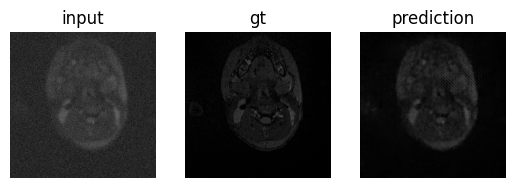

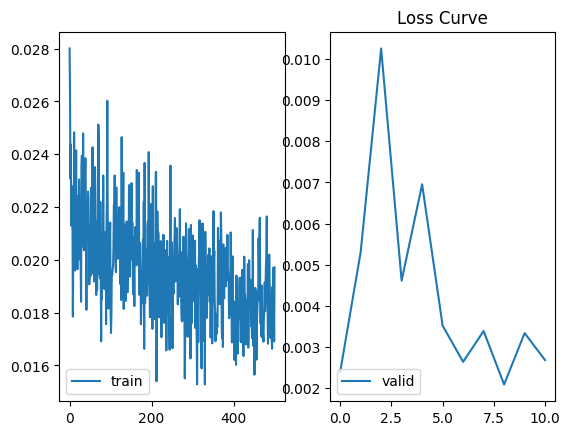

20it [00:02,  9.83it/s]


Epoch 502, Loss: 0.017952926596626638


20it [00:01, 10.29it/s]


Epoch 503, Loss: 0.018246190203353763


20it [00:01, 10.26it/s]


Epoch 504, Loss: 0.016245180182158946


20it [00:02,  9.39it/s]


Epoch 505, Loss: 0.020193592784926294


20it [00:01, 10.32it/s]


Epoch 506, Loss: 0.017992741195484996


20it [00:01, 10.04it/s]


Epoch 507, Loss: 0.01851054625585675


20it [00:02,  9.94it/s]


Epoch 508, Loss: 0.018522248486988246


20it [00:02,  9.83it/s]


Epoch 509, Loss: 0.01992268187459558


20it [00:01, 10.47it/s]


Epoch 510, Loss: 0.019029427436180413


20it [00:01, 10.15it/s]


Epoch 511, Loss: 0.01703287656418979


20it [00:01, 10.29it/s]


Epoch 512, Loss: 0.01842572707682848


20it [00:01, 10.23it/s]


Epoch 513, Loss: 0.017845424730330704


20it [00:01, 10.20it/s]


Epoch 514, Loss: 0.01887955965939909


20it [00:01, 10.01it/s]


Epoch 515, Loss: 0.017761210538446905


20it [00:02,  9.40it/s]


Epoch 516, Loss: 0.018449144158512353


20it [00:01, 10.15it/s]


Epoch 517, Loss: 0.018456245516426863


20it [00:02,  9.74it/s]


Epoch 518, Loss: 0.0190912704449147


20it [00:01, 10.12it/s]


Epoch 519, Loss: 0.02048541819676757


20it [00:01, 10.32it/s]


Epoch 520, Loss: 0.019792302418500184


20it [00:01, 10.22it/s]


Epoch 521, Loss: 0.018739688908681273


20it [00:01, 10.22it/s]


Epoch 522, Loss: 0.018149628583341838


20it [00:01, 10.19it/s]


Epoch 523, Loss: 0.01768708567833528


20it [00:01, 10.08it/s]


Epoch 524, Loss: 0.017169872834347188


20it [00:01, 10.10it/s]


Epoch 525, Loss: 0.017132366308942437


20it [00:02,  9.62it/s]


Epoch 526, Loss: 0.018266474502161144


20it [00:01, 10.19it/s]


Epoch 527, Loss: 0.018227839097380637


20it [00:01, 10.06it/s]


Epoch 528, Loss: 0.01808198888320476


20it [00:01, 10.14it/s]


Epoch 529, Loss: 0.017324095452204348


20it [00:01, 10.11it/s]


Epoch 530, Loss: 0.017776490980759264


20it [00:02,  9.83it/s]


Epoch 531, Loss: 0.017184336879290642


20it [00:02,  9.89it/s]


Epoch 532, Loss: 0.018955706246197225


20it [00:01, 10.66it/s]


Epoch 533, Loss: 0.0171208290848881


20it [00:01, 10.19it/s]


Epoch 534, Loss: 0.01662991145858541


20it [00:01, 10.25it/s]


Epoch 535, Loss: 0.018275040993466975


20it [00:02,  9.73it/s]


Epoch 536, Loss: 0.01894418247975409


20it [00:01, 10.04it/s]


Epoch 537, Loss: 0.017751715844497085


20it [00:01, 10.29it/s]


Epoch 538, Loss: 0.015958105237223207


20it [00:01, 10.71it/s]


Epoch 539, Loss: 0.017831932427361606


20it [00:01, 10.52it/s]


Epoch 540, Loss: 0.020350811316166072


20it [00:01, 10.25it/s]


Epoch 541, Loss: 0.020967510482296347


20it [00:01, 10.46it/s]


Epoch 542, Loss: 0.017590727820061148


20it [00:01, 10.18it/s]


Epoch 543, Loss: 0.017464102269150315


20it [00:01, 10.03it/s]


Epoch 544, Loss: 0.01725603595841676


20it [00:01, 10.05it/s]


Epoch 545, Loss: 0.018173136143013836


20it [00:02,  9.58it/s]


Epoch 546, Loss: 0.01697922919411212


20it [00:01, 10.19it/s]


Epoch 547, Loss: 0.017559533310122787


20it [00:01, 10.43it/s]


Epoch 548, Loss: 0.018233975674957038


20it [00:01, 10.03it/s]


Epoch 549, Loss: 0.01828433412592858


20it [00:01, 10.54it/s]


Epoch 550, Loss: 0.014608344493899495


20it [00:01, 10.17it/s]

Epoch 551, Loss: 0.017999511514790355



4it [00:00, 10.32it/s]


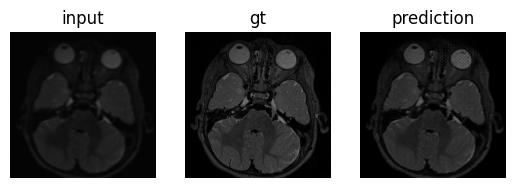

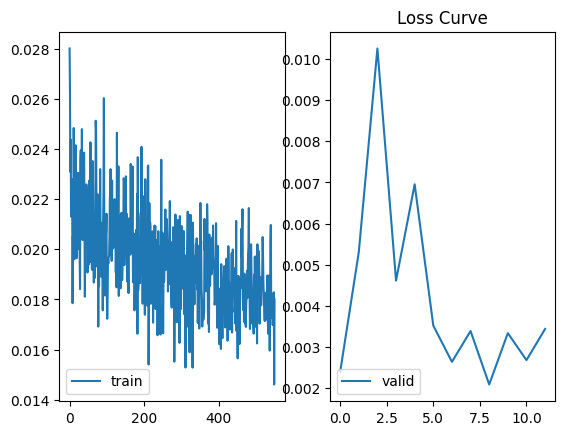

20it [00:01, 10.12it/s]


Epoch 552, Loss: 0.015746825886890293


20it [00:01, 10.31it/s]


Epoch 553, Loss: 0.019022212480194867


20it [00:01, 10.31it/s]


Epoch 554, Loss: 0.01638990519568324


20it [00:02,  9.53it/s]


Epoch 555, Loss: 0.018625167664140463


20it [00:01, 10.37it/s]


Epoch 556, Loss: 0.015784584730863572


20it [00:01, 10.24it/s]


Epoch 557, Loss: 0.017252332950010895


20it [00:01, 10.03it/s]


Epoch 558, Loss: 0.017784710065461694


20it [00:01, 10.53it/s]


Epoch 559, Loss: 0.017813392728567124


20it [00:02,  9.92it/s]


Epoch 560, Loss: 0.01586529929190874


20it [00:01, 10.29it/s]


Epoch 561, Loss: 0.01859542983584106


20it [00:01, 10.57it/s]


Epoch 562, Loss: 0.01646518970374018


20it [00:01, 10.09it/s]


Epoch 563, Loss: 0.0171639499720186


20it [00:01, 10.06it/s]


Epoch 564, Loss: 0.016556259151548146


20it [00:01, 10.38it/s]


Epoch 565, Loss: 0.01815346085932106


20it [00:02,  9.85it/s]


Epoch 566, Loss: 0.01682176599279046


20it [00:01, 10.30it/s]


Epoch 567, Loss: 0.01730923482682556


20it [00:01, 10.24it/s]


Epoch 568, Loss: 0.017507144156843422


20it [00:02,  9.90it/s]


Epoch 569, Loss: 0.017783861700445415


20it [00:01, 10.43it/s]


Epoch 570, Loss: 0.017613805714063346


20it [00:02,  9.77it/s]


Epoch 571, Loss: 0.01869802689179778


20it [00:01, 10.49it/s]


Epoch 572, Loss: 0.020245259627699852


20it [00:01, 10.39it/s]


Epoch 573, Loss: 0.020328725571744144


20it [00:02,  9.96it/s]


Epoch 574, Loss: 0.017593756993301214


20it [00:01, 10.00it/s]


Epoch 575, Loss: 0.019174725073389708


20it [00:01, 10.30it/s]


Epoch 576, Loss: 0.016476332838647068


20it [00:02,  9.85it/s]


Epoch 577, Loss: 0.015458704787306488


20it [00:02,  9.82it/s]


Epoch 578, Loss: 0.01839681281708181


20it [00:02,  9.78it/s]


Epoch 579, Loss: 0.017373125534504652


20it [00:01, 10.38it/s]


Epoch 580, Loss: 0.018232824746519327


20it [00:02,  9.99it/s]


Epoch 581, Loss: 0.018492978787980972


20it [00:01, 10.36it/s]


Epoch 582, Loss: 0.019013260630890726


20it [00:01, 10.06it/s]


Epoch 583, Loss: 0.016641356947366147


20it [00:02,  9.65it/s]


Epoch 584, Loss: 0.017907750443555415


20it [00:01, 10.24it/s]


Epoch 585, Loss: 0.01781808922532946


20it [00:01, 10.42it/s]


Epoch 586, Loss: 0.0156883142888546


20it [00:02,  9.63it/s]


Epoch 587, Loss: 0.015278648398816586


20it [00:01, 10.25it/s]


Epoch 588, Loss: 0.01756877520820126


20it [00:01, 10.26it/s]


Epoch 589, Loss: 0.017050704965367914


20it [00:01, 10.34it/s]


Epoch 590, Loss: 0.016785722610075028


20it [00:02,  9.68it/s]


Epoch 591, Loss: 0.01656114144716412


20it [00:01, 10.22it/s]


Epoch 592, Loss: 0.018582309037446974


20it [00:02,  9.94it/s]


Epoch 593, Loss: 0.01610250133089721


20it [00:01, 10.04it/s]


Epoch 594, Loss: 0.017243883828632532


20it [00:01, 10.13it/s]


Epoch 595, Loss: 0.016670634131878616


20it [00:01, 10.30it/s]


Epoch 596, Loss: 0.01801365294959396


20it [00:01, 10.09it/s]


Epoch 597, Loss: 0.015818470576778054


20it [00:02,  9.43it/s]


Epoch 598, Loss: 0.01756804748438299


20it [00:01, 10.44it/s]


Epoch 599, Loss: 0.018259831692557783


20it [00:01, 10.34it/s]


Epoch 600, Loss: 0.018940489646047352


20it [00:02,  9.69it/s]

Epoch 601, Loss: 0.02104346421547234



4it [00:00,  9.62it/s]


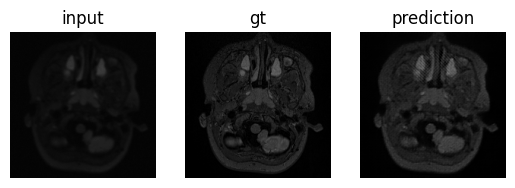

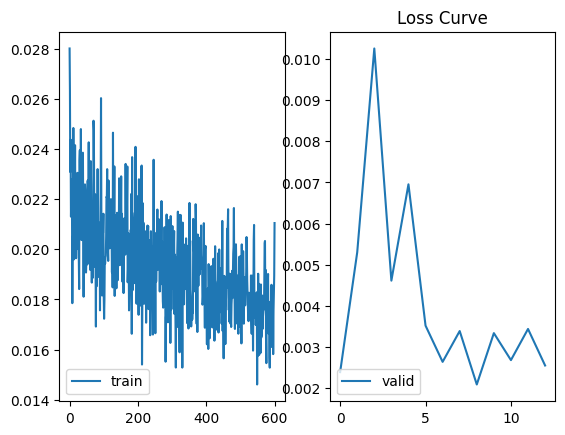

20it [00:01, 10.18it/s]


Epoch 602, Loss: 0.017493937187828122


20it [00:02,  9.88it/s]


Epoch 603, Loss: 0.018914051167666913


20it [00:01, 10.00it/s]


Epoch 604, Loss: 0.01942038000561297


20it [00:01, 10.55it/s]


Epoch 605, Loss: 0.017409053188748656


20it [00:01, 10.17it/s]


Epoch 606, Loss: 0.015871528221759947


20it [00:02,  9.47it/s]


Epoch 607, Loss: 0.018351992638781667


20it [00:01, 10.21it/s]


Epoch 608, Loss: 0.01868767829146236


20it [00:01, 10.37it/s]


Epoch 609, Loss: 0.018082992685958744


20it [00:01, 10.05it/s]


Epoch 610, Loss: 0.018859490845352413


20it [00:01, 10.12it/s]


Epoch 611, Loss: 0.016842919494956733


20it [00:02,  9.99it/s]


Epoch 612, Loss: 0.017556241573765875


20it [00:01, 10.46it/s]


Epoch 613, Loss: 0.017841561511158944


20it [00:02, 10.00it/s]


Epoch 614, Loss: 0.017638408998027443


20it [00:02,  9.92it/s]


Epoch 615, Loss: 0.017304590332787483


20it [00:02,  9.86it/s]


Epoch 616, Loss: 0.017471380555070935


20it [00:02,  9.67it/s]


Epoch 617, Loss: 0.017233635298907757


20it [00:02,  9.86it/s]


Epoch 618, Loss: 0.016845455206930638


20it [00:02,  9.98it/s]


Epoch 619, Loss: 0.018337761575821787


20it [00:01, 10.38it/s]


Epoch 620, Loss: 0.01771752634085715


20it [00:01, 10.40it/s]


Epoch 621, Loss: 0.01708798015024513


20it [00:02,  9.89it/s]


Epoch 622, Loss: 0.016364106489345432


20it [00:02,  9.84it/s]


Epoch 623, Loss: 0.01924144644290209


20it [00:01, 10.39it/s]


Epoch 624, Loss: 0.016398454667069018


20it [00:01, 10.29it/s]


Epoch 625, Loss: 0.017949109920300542


20it [00:01, 10.37it/s]


Epoch 626, Loss: 0.01704251781338826


20it [00:02,  9.61it/s]


Epoch 627, Loss: 0.017959298519417643


20it [00:01, 10.04it/s]


Epoch 628, Loss: 0.01839378187432885


20it [00:01, 10.39it/s]


Epoch 629, Loss: 0.01732074583414942


20it [00:02,  9.91it/s]


Epoch 630, Loss: 0.01714819862972945


20it [00:02,  9.81it/s]


Epoch 631, Loss: 0.01889081943081692


20it [00:02,  9.94it/s]


Epoch 632, Loss: 0.014941897592507303


20it [00:01, 10.17it/s]


Epoch 633, Loss: 0.017372626345604658


20it [00:02,  9.90it/s]


Epoch 634, Loss: 0.01603416947182268


20it [00:02,  9.77it/s]


Epoch 635, Loss: 0.01941408133134246


20it [00:01, 10.33it/s]


Epoch 636, Loss: 0.0176543980371207


20it [00:01, 10.07it/s]


Epoch 637, Loss: 0.017030325531959534


20it [00:02,  9.66it/s]


Epoch 638, Loss: 0.021197511604987083


20it [00:01, 10.32it/s]


Epoch 639, Loss: 0.018701045657508075


20it [00:01, 10.58it/s]


Epoch 640, Loss: 0.017660476150922477


20it [00:01, 10.05it/s]


Epoch 641, Loss: 0.016821719449944796


20it [00:01, 10.08it/s]


Epoch 642, Loss: 0.018211781699210405


20it [00:01, 10.31it/s]


Epoch 643, Loss: 0.0181161155924201


20it [00:02,  9.78it/s]


Epoch 644, Loss: 0.016716586821712554


20it [00:01, 10.23it/s]


Epoch 645, Loss: 0.017167728464119136


20it [00:01, 10.34it/s]


Epoch 646, Loss: 0.01513275554170832


20it [00:02,  9.46it/s]


Epoch 647, Loss: 0.017462164675816894


20it [00:02,  9.87it/s]


Epoch 648, Loss: 0.01627098354510963


20it [00:01, 10.17it/s]


Epoch 649, Loss: 0.018532209983095526


20it [00:01, 10.20it/s]


Epoch 650, Loss: 0.016782270488329233


20it [00:01, 10.30it/s]

Epoch 651, Loss: 0.017402941803447904



4it [00:00,  8.85it/s]


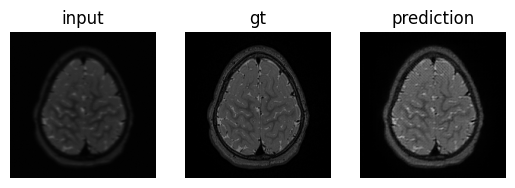

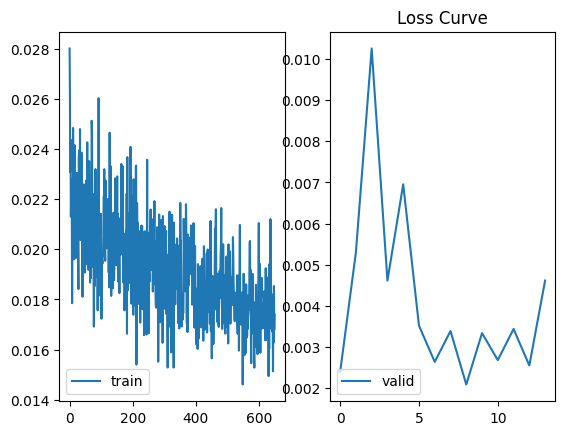

20it [00:02, 10.00it/s]


Epoch 652, Loss: 0.016403247928246857


20it [00:02,  9.65it/s]


Epoch 653, Loss: 0.018713966431096195


20it [00:02,  9.90it/s]


Epoch 654, Loss: 0.01737243155948818


20it [00:01, 10.08it/s]


Epoch 655, Loss: 0.01790033739525825


20it [00:02,  9.59it/s]


Epoch 656, Loss: 0.018731403164565563


20it [00:02,  9.99it/s]


Epoch 657, Loss: 0.02183322871569544


20it [00:01, 10.50it/s]


Epoch 658, Loss: 0.019904215005226433


20it [00:01, 10.40it/s]


Epoch 659, Loss: 0.017740227445028723


20it [00:01, 10.11it/s]


Epoch 660, Loss: 0.01762203499674797


20it [00:01, 10.53it/s]


Epoch 661, Loss: 0.014655285712797195


20it [00:02,  9.87it/s]


Epoch 662, Loss: 0.01776230987161398


20it [00:01, 10.30it/s]


Epoch 663, Loss: 0.02013655542396009


20it [00:01, 10.05it/s]


Epoch 664, Loss: 0.019840597384609283


20it [00:01, 10.33it/s]


Epoch 665, Loss: 0.018684821017086507


20it [00:01, 10.25it/s]


Epoch 666, Loss: 0.018351183738559484


20it [00:02,  9.87it/s]


Epoch 667, Loss: 0.01791840314399451


20it [00:01, 10.05it/s]


Epoch 668, Loss: 0.018525218474678695


20it [00:01, 10.02it/s]


Epoch 669, Loss: 0.01904609831981361


20it [00:01, 10.21it/s]


Epoch 670, Loss: 0.01991133773699403


20it [00:02,  9.92it/s]


Epoch 671, Loss: 0.019193606614135206


20it [00:01, 10.03it/s]


Epoch 672, Loss: 0.01595224130433053


20it [00:02,  9.90it/s]


Epoch 673, Loss: 0.017873608763329683


20it [00:02,  9.94it/s]


Epoch 674, Loss: 0.01755685976240784


20it [00:01, 10.02it/s]


Epoch 675, Loss: 0.018272438226267694


20it [00:01, 10.17it/s]


Epoch 676, Loss: 0.01773225727956742


20it [00:02,  9.93it/s]


Epoch 677, Loss: 0.016210431628860534


20it [00:02,  9.85it/s]


Epoch 678, Loss: 0.01627946337684989


20it [00:02,  9.79it/s]


Epoch 679, Loss: 0.018533644475974144


20it [00:02,  9.69it/s]


Epoch 680, Loss: 0.018051332980394363


20it [00:01, 10.20it/s]


Epoch 681, Loss: 0.016197356674820185


20it [00:02,  9.91it/s]


Epoch 682, Loss: 0.016370927961543203


20it [00:01, 10.17it/s]


Epoch 683, Loss: 0.017682973365299403


20it [00:02,  9.97it/s]


Epoch 684, Loss: 0.01851322199217975


20it [00:02,  9.97it/s]


Epoch 685, Loss: 0.014978666300885379


20it [00:02,  9.96it/s]


Epoch 686, Loss: 0.01863244331907481


20it [00:01, 10.22it/s]


Epoch 687, Loss: 0.015982497413642705


20it [00:02,  9.44it/s]


Epoch 688, Loss: 0.01636202083900571


20it [00:01, 10.27it/s]


Epoch 689, Loss: 0.017864436190575362


20it [00:01, 10.21it/s]


Epoch 690, Loss: 0.01877397526986897


20it [00:02,  9.94it/s]


Epoch 691, Loss: 0.01737332160118967


20it [00:01, 10.31it/s]


Epoch 692, Loss: 0.016832198528572918


20it [00:02, 10.00it/s]


Epoch 693, Loss: 0.015647547785192728


20it [00:01, 10.35it/s]


Epoch 694, Loss: 0.018078097142279148


20it [00:02,  9.85it/s]


Epoch 695, Loss: 0.018099223356693984


20it [00:02,  9.92it/s]


Epoch 696, Loss: 0.01645568266976625


20it [00:01, 10.18it/s]


Epoch 697, Loss: 0.019017786905169486


20it [00:02,  9.76it/s]


Epoch 698, Loss: 0.017668068502098323


20it [00:02,  9.63it/s]


Epoch 699, Loss: 0.016557193594053388


20it [00:02,  9.87it/s]


Epoch 700, Loss: 0.0180748010519892


20it [00:01, 10.19it/s]

Epoch 701, Loss: 0.018697030004113914



4it [00:00, 10.44it/s]


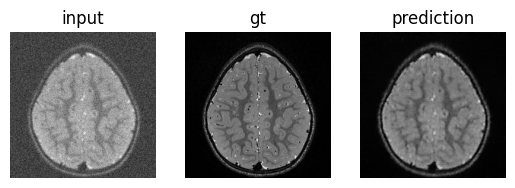

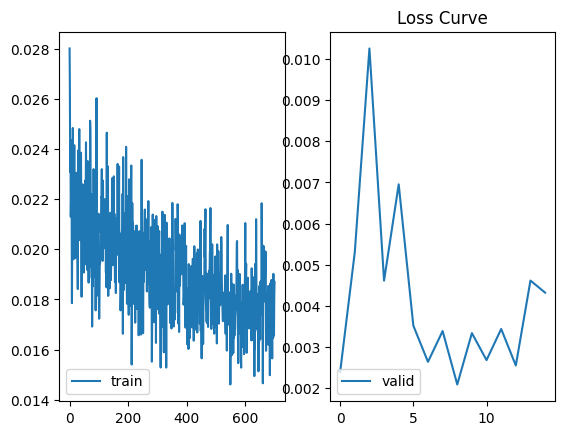

20it [00:01, 10.19it/s]


Epoch 702, Loss: 0.016460602288134396


20it [00:01, 10.04it/s]


Epoch 703, Loss: 0.01873687873594463


20it [00:01, 10.09it/s]


Epoch 704, Loss: 0.01867266686167568


20it [00:02,  9.88it/s]


Epoch 705, Loss: 0.017965166317299008


20it [00:01, 10.32it/s]


Epoch 706, Loss: 0.016996532259508968


20it [00:02,  9.47it/s]


Epoch 707, Loss: 0.015280397597234697


20it [00:01, 10.13it/s]


Epoch 708, Loss: 0.014821636583656072


20it [00:01, 10.16it/s]


Epoch 709, Loss: 0.015848530211951584


20it [00:01, 10.07it/s]


Epoch 710, Loss: 0.017094375821761786


20it [00:02,  9.82it/s]


Epoch 711, Loss: 0.01710082879289985


20it [00:01, 10.12it/s]


Epoch 712, Loss: 0.01655552419833839


20it [00:01, 10.15it/s]


Epoch 713, Loss: 0.019334642589092253


20it [00:01, 10.14it/s]


Epoch 714, Loss: 0.017249123146757483


20it [00:01, 10.01it/s]


Epoch 715, Loss: 0.01764060209970921


20it [00:02,  9.95it/s]


Epoch 716, Loss: 0.017430109367705882


20it [00:01, 10.62it/s]


Epoch 717, Loss: 0.01645312933251262


20it [00:02,  9.98it/s]


Epoch 718, Loss: 0.01848554527387023


20it [00:02,  9.59it/s]


Epoch 719, Loss: 0.017880356032401325


20it [00:02,  9.80it/s]


Epoch 720, Loss: 0.015139674255624413


20it [00:01, 10.02it/s]


Epoch 721, Loss: 0.01710722129791975


20it [00:01, 10.03it/s]


Epoch 722, Loss: 0.017628334742039443


20it [00:02,  9.93it/s]


Epoch 723, Loss: 0.017787460703402758


20it [00:01, 10.08it/s]


Epoch 724, Loss: 0.019442653050646186


20it [00:01, 10.21it/s]


Epoch 725, Loss: 0.01703658364713192


20it [00:01, 10.22it/s]


Epoch 726, Loss: 0.01795791876502335


20it [00:01, 10.27it/s]


Epoch 727, Loss: 0.019706776645034552


20it [00:01, 10.45it/s]


Epoch 728, Loss: 0.019222963647916914


20it [00:01, 10.10it/s]


Epoch 729, Loss: 0.017773211584426463


20it [00:02,  9.67it/s]


Epoch 730, Loss: 0.01752244809176773


20it [00:01, 10.15it/s]


Epoch 731, Loss: 0.017186219012364744


20it [00:01, 10.39it/s]


Epoch 732, Loss: 0.01689452035352588


20it [00:01, 10.39it/s]


Epoch 733, Loss: 0.017561328154988586


20it [00:01, 10.06it/s]


Epoch 734, Loss: 0.01884263560641557


20it [00:01, 10.18it/s]


Epoch 735, Loss: 0.016632228379603476


20it [00:02,  9.94it/s]


Epoch 736, Loss: 0.01677972215693444


20it [00:02,  9.72it/s]


Epoch 737, Loss: 0.01615875819697976


20it [00:01, 10.09it/s]


Epoch 738, Loss: 0.01649338488932699


20it [00:01, 10.12it/s]


Epoch 739, Loss: 0.017490585730411113


20it [00:01, 10.31it/s]


Epoch 740, Loss: 0.014982303534634412


20it [00:02,  9.58it/s]


Epoch 741, Loss: 0.017916580406017603


20it [00:01, 10.44it/s]


Epoch 742, Loss: 0.017930032662115993


20it [00:01, 10.14it/s]


Epoch 743, Loss: 0.018690621247515082


20it [00:01, 10.23it/s]


Epoch 744, Loss: 0.018479982018470766


20it [00:01, 10.06it/s]


Epoch 745, Loss: 0.015611541736871005


20it [00:01, 10.37it/s]


Epoch 746, Loss: 0.015352448890917003


20it [00:01, 10.41it/s]


Epoch 747, Loss: 0.016966797038912775


20it [00:01, 10.25it/s]


Epoch 748, Loss: 0.015618433896452188


20it [00:02,  9.94it/s]


Epoch 749, Loss: 0.01804157728329301


20it [00:01, 10.14it/s]


Epoch 750, Loss: 0.016032924805767835


20it [00:01, 10.03it/s]

Epoch 751, Loss: 0.016525952285155653



4it [00:00,  9.72it/s]


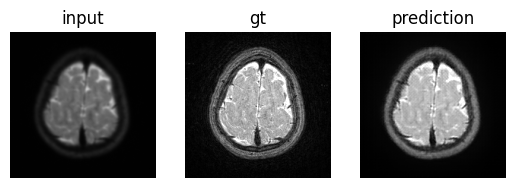

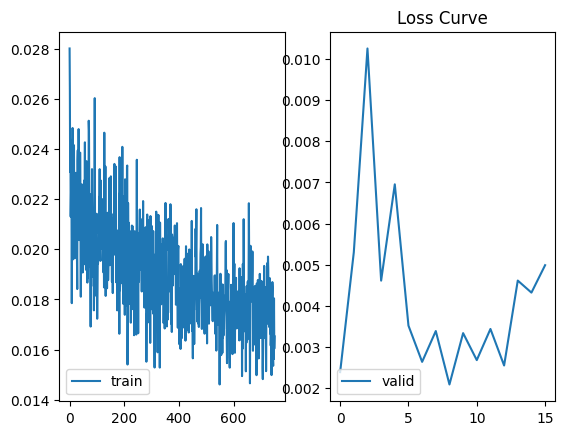

20it [00:02,  9.84it/s]


Epoch 752, Loss: 0.018273862660862505


20it [00:01, 10.07it/s]


Epoch 753, Loss: 0.016542760794982313


20it [00:01, 10.05it/s]


Epoch 754, Loss: 0.01803233753889799


20it [00:01, 10.02it/s]


Epoch 755, Loss: 0.019632234191522


20it [00:01, 10.27it/s]


Epoch 756, Loss: 0.018941526301205158


20it [00:01, 10.50it/s]


Epoch 757, Loss: 0.01634518101345748


20it [00:01, 10.50it/s]


Epoch 758, Loss: 0.01746571306139231


20it [00:01, 10.38it/s]


Epoch 759, Loss: 0.016343678417615592


20it [00:01, 10.71it/s]


Epoch 760, Loss: 0.017943893698975442


20it [00:02,  9.61it/s]


Epoch 761, Loss: 0.018980165501125155


20it [00:01, 10.10it/s]


Epoch 762, Loss: 0.01769390332046896


20it [00:02,  9.82it/s]


Epoch 763, Loss: 0.018412586580961943


20it [00:01, 10.03it/s]


Epoch 764, Loss: 0.01972211143001914


20it [00:01, 10.21it/s]


Epoch 765, Loss: 0.018615126283839344


20it [00:01, 10.32it/s]


Epoch 766, Loss: 0.018655279907397924


20it [00:01, 10.06it/s]


Epoch 767, Loss: 0.01817750585032627


20it [00:02,  9.97it/s]


Epoch 768, Loss: 0.017769177025184036


20it [00:01, 10.13it/s]


Epoch 769, Loss: 0.019612115807831287


20it [00:01, 10.44it/s]


Epoch 770, Loss: 0.017964295914862306


20it [00:02,  9.67it/s]


Epoch 771, Loss: 0.018194906832650303


20it [00:02,  9.94it/s]


Epoch 772, Loss: 0.01721981114242226


20it [00:01, 10.54it/s]


Epoch 773, Loss: 0.017917138896882533


20it [00:01, 10.08it/s]


Epoch 774, Loss: 0.015913272509351373


20it [00:02,  9.99it/s]


Epoch 775, Loss: 0.018367402022704482


20it [00:01, 10.11it/s]


Epoch 776, Loss: 0.017699376586824654


20it [00:01, 10.47it/s]


Epoch 777, Loss: 0.017461549059953542


20it [00:02,  9.89it/s]


Epoch 778, Loss: 0.018670024769380688


20it [00:01, 10.27it/s]


Epoch 779, Loss: 0.017490917164832354


20it [00:01, 10.07it/s]


Epoch 780, Loss: 0.017308200476691127


20it [00:01, 10.13it/s]


Epoch 781, Loss: 0.017660325136967005


20it [00:02,  9.67it/s]


Epoch 782, Loss: 0.013185927306767552


20it [00:01, 10.09it/s]


Epoch 783, Loss: 0.01634252497460693


20it [00:01, 10.35it/s]


Epoch 784, Loss: 0.017190631455741824


20it [00:02,  9.97it/s]


Epoch 785, Loss: 0.019101547775790095


20it [00:01, 10.36it/s]


Epoch 786, Loss: 0.015777533454820514


20it [00:01, 10.25it/s]


Epoch 787, Loss: 0.018252590647898616


20it [00:01, 10.35it/s]


Epoch 788, Loss: 0.01659985084552318


20it [00:02,  9.95it/s]


Epoch 789, Loss: 0.016991984751075506


20it [00:02,  9.85it/s]


Epoch 790, Loss: 0.016031773504801096


20it [00:02,  9.86it/s]


Epoch 791, Loss: 0.017449087603017686


20it [00:01, 10.17it/s]


Epoch 792, Loss: 0.015258322795853018


20it [00:02,  9.65it/s]


Epoch 793, Loss: 0.017121730942744762


20it [00:01, 10.21it/s]


Epoch 794, Loss: 0.016802010592073202


20it [00:01, 10.03it/s]


Epoch 795, Loss: 0.015542941889725626


20it [00:01, 10.19it/s]


Epoch 796, Loss: 0.016613728506490587


20it [00:01, 10.06it/s]


Epoch 797, Loss: 0.017125851358287036


20it [00:01, 10.23it/s]


Epoch 798, Loss: 0.016834610840305686


20it [00:01, 10.12it/s]


Epoch 799, Loss: 0.015250212093815208


20it [00:01, 10.70it/s]


Epoch 800, Loss: 0.016286786273121835


20it [00:01, 10.20it/s]

Epoch 801, Loss: 0.016317453351803124



4it [00:00,  9.55it/s]


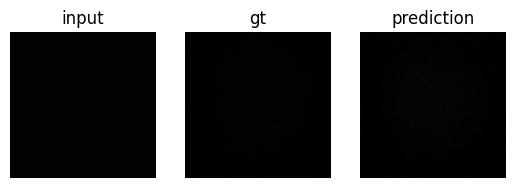

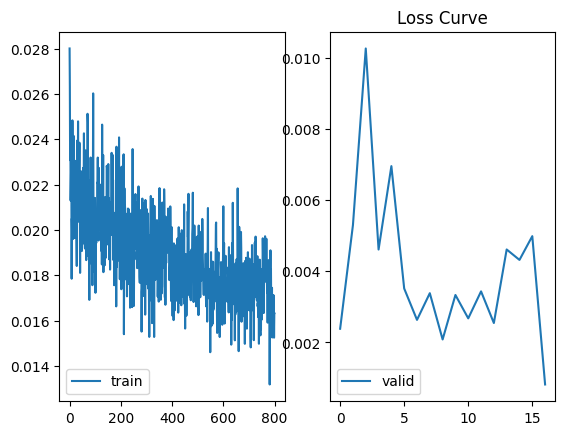

Model was saved! Current Best Dice 0.0008208062499761581


20it [00:02,  9.36it/s]


Epoch 802, Loss: 0.016954661812633276


20it [00:02,  9.83it/s]


Epoch 803, Loss: 0.01775322367902845


20it [00:01, 10.24it/s]


Epoch 804, Loss: 0.01792313897749409


20it [00:01, 10.34it/s]


Epoch 805, Loss: 0.017546502721961586


20it [00:02,  9.90it/s]


Epoch 806, Loss: 0.01892350285779685


20it [00:01, 10.39it/s]


Epoch 807, Loss: 0.01759221567772329


20it [00:01, 10.05it/s]


Epoch 808, Loss: 0.016311133024282755


20it [00:01, 10.36it/s]


Epoch 809, Loss: 0.016287556919269263


20it [00:02,  9.96it/s]


Epoch 810, Loss: 0.0170617749216035


20it [00:02,  9.79it/s]


Epoch 811, Loss: 0.019061494804918765


20it [00:01, 10.26it/s]


Epoch 812, Loss: 0.016341409471351653


20it [00:02,  9.55it/s]


Epoch 813, Loss: 0.016760081984102726


20it [00:02,  9.97it/s]


Epoch 814, Loss: 0.016789592104032636


20it [00:01, 10.15it/s]


Epoch 815, Loss: 0.017717429110780357


20it [00:02,  9.56it/s]


Epoch 816, Loss: 0.014541665965225548


20it [00:01, 10.67it/s]


Epoch 817, Loss: 0.016345297847874463


20it [00:01, 10.51it/s]


Epoch 818, Loss: 0.017598170973360538


20it [00:02,  9.79it/s]


Epoch 819, Loss: 0.018022655881941317


20it [00:02,  9.91it/s]


Epoch 820, Loss: 0.016652895254082978


20it [00:01, 10.32it/s]


Epoch 821, Loss: 0.016461886267643423


20it [00:01, 10.33it/s]


Epoch 822, Loss: 0.014759305492043495


20it [00:02,  9.37it/s]


Epoch 823, Loss: 0.01628753140103072


20it [00:01, 10.73it/s]


Epoch 824, Loss: 0.016508505982346832


20it [00:02,  9.95it/s]


Epoch 825, Loss: 0.0172856475925073


20it [00:01, 10.29it/s]


Epoch 826, Loss: 0.01676386595936492


20it [00:01, 10.46it/s]


Epoch 827, Loss: 0.01648522752802819


20it [00:01, 10.06it/s]


Epoch 828, Loss: 0.017477757530286908


20it [00:01, 10.01it/s]


Epoch 829, Loss: 0.017537316330708562


20it [00:01, 10.31it/s]


Epoch 830, Loss: 0.016939791513141244


20it [00:01, 10.29it/s]


Epoch 831, Loss: 0.01727834506891668


20it [00:02,  9.96it/s]


Epoch 832, Loss: 0.016639468865469097


20it [00:01, 10.41it/s]


Epoch 833, Loss: 0.016054008016362788


20it [00:02,  9.72it/s]


Epoch 834, Loss: 0.016483294079080224


20it [00:01, 10.46it/s]


Epoch 835, Loss: 0.017252910393290223


20it [00:01, 10.26it/s]


Epoch 836, Loss: 0.01869381859432906


20it [00:02,  9.89it/s]


Epoch 837, Loss: 0.017353169852867723


20it [00:01, 10.28it/s]


Epoch 838, Loss: 0.018257292360067366


20it [00:01, 10.04it/s]


Epoch 839, Loss: 0.017654087115079164


20it [00:01, 10.00it/s]


Epoch 840, Loss: 0.015292654326185585


20it [00:01, 10.02it/s]


Epoch 841, Loss: 0.016186812706291676


20it [00:02,  9.89it/s]


Epoch 842, Loss: 0.014552895666565747


20it [00:01, 10.73it/s]


Epoch 843, Loss: 0.01638419528026134


20it [00:02,  9.56it/s]


Epoch 844, Loss: 0.017494510882534085


20it [00:01, 10.04it/s]


Epoch 845, Loss: 0.01685041794553399


20it [00:01, 10.13it/s]


Epoch 846, Loss: 0.015273530967533588


20it [00:02,  9.78it/s]


Epoch 847, Loss: 0.016885192692279817


20it [00:01, 10.23it/s]


Epoch 848, Loss: 0.017948490381240845


20it [00:02,  9.93it/s]


Epoch 849, Loss: 0.018067158688791097


20it [00:01, 10.02it/s]


Epoch 850, Loss: 0.017091230186633766


20it [00:01, 10.12it/s]

Epoch 851, Loss: 0.017373069864697756



4it [00:00, 10.15it/s]


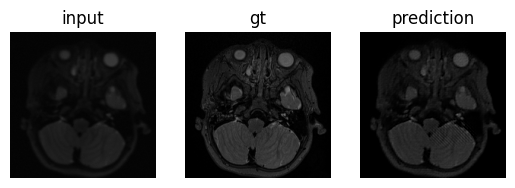

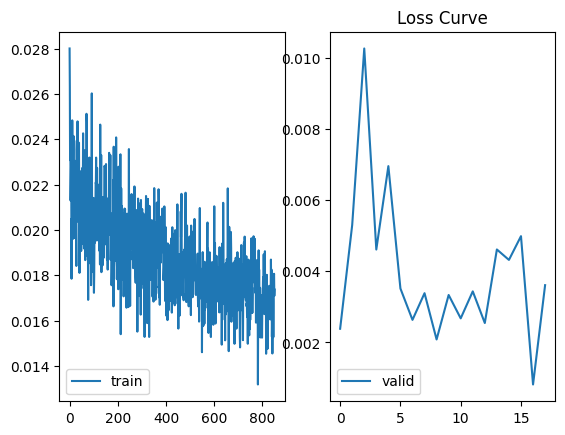

20it [00:01, 10.07it/s]


Epoch 852, Loss: 0.016723079746589063


20it [00:02,  9.74it/s]


Epoch 853, Loss: 0.01692085205577314


20it [00:02,  9.84it/s]


Epoch 854, Loss: 0.015453329985029995


20it [00:02,  9.89it/s]


Epoch 855, Loss: 0.016552067012526095


20it [00:02,  9.91it/s]


Epoch 856, Loss: 0.017031603516079484


20it [00:02,  9.79it/s]


Epoch 857, Loss: 0.016418463294394316


20it [00:01, 10.32it/s]


Epoch 858, Loss: 0.014245008071884512


20it [00:02,  9.86it/s]


Epoch 859, Loss: 0.015946894651278853


20it [00:02,  9.75it/s]


Epoch 860, Loss: 0.017556696431711316


20it [00:02,  9.94it/s]


Epoch 861, Loss: 0.01743810421321541


20it [00:01, 10.12it/s]


Epoch 862, Loss: 0.01751072918996215


20it [00:02,  9.59it/s]


Epoch 863, Loss: 0.018668594444170593


20it [00:01, 10.26it/s]


Epoch 864, Loss: 0.018180905608460307


20it [00:01, 10.23it/s]


Epoch 865, Loss: 0.017719724122434853


20it [00:01, 10.30it/s]


Epoch 866, Loss: 0.015105552738532424


20it [00:01, 10.04it/s]


Epoch 867, Loss: 0.017878720758017153


20it [00:02,  9.65it/s]


Epoch 868, Loss: 0.016778011980932206


20it [00:01, 10.36it/s]


Epoch 869, Loss: 0.015063683409243822


20it [00:01, 10.19it/s]


Epoch 870, Loss: 0.019797539664432408


20it [00:01, 10.18it/s]


Epoch 871, Loss: 0.01805541452486068


20it [00:01, 10.23it/s]


Epoch 872, Loss: 0.017149984487332404


20it [00:01, 10.28it/s]


Epoch 873, Loss: 0.017640554532408714


20it [00:02,  9.82it/s]


Epoch 874, Loss: 0.017587080551311373


20it [00:01, 10.29it/s]


Epoch 875, Loss: 0.016428771358914674


20it [00:02,  9.63it/s]


Epoch 876, Loss: 0.016070793429389597


20it [00:01, 10.27it/s]


Epoch 877, Loss: 0.017033528815954924


20it [00:01, 10.36it/s]


Epoch 878, Loss: 0.017940085369627923


20it [00:01, 10.16it/s]


Epoch 879, Loss: 0.016720706154592334


20it [00:01, 10.23it/s]


Epoch 880, Loss: 0.01742142017465085


20it [00:02,  9.62it/s]


Epoch 881, Loss: 0.018021185114048422


20it [00:01, 10.37it/s]


Epoch 882, Loss: 0.01799613903276622


20it [00:01, 10.08it/s]


Epoch 883, Loss: 0.017706558713689445


20it [00:01, 10.17it/s]


Epoch 884, Loss: 0.018057098705321552


20it [00:02,  9.64it/s]


Epoch 885, Loss: 0.017519982624799015


20it [00:01, 10.37it/s]


Epoch 886, Loss: 0.017201029718853532


20it [00:02,  9.92it/s]


Epoch 887, Loss: 0.013083632849156857


20it [00:02,  9.94it/s]


Epoch 888, Loss: 0.017793825874105097


20it [00:01, 10.35it/s]


Epoch 889, Loss: 0.016069788322784006


20it [00:01, 10.19it/s]


Epoch 890, Loss: 0.016480241133831442


20it [00:02, 10.00it/s]


Epoch 891, Loss: 0.017759786709211765


20it [00:01, 10.08it/s]


Epoch 892, Loss: 0.01503805189859122


20it [00:01, 10.33it/s]


Epoch 893, Loss: 0.01612385977059603


20it [00:02,  9.91it/s]


Epoch 894, Loss: 0.0167230918770656


20it [00:02,  9.43it/s]


Epoch 895, Loss: 0.01693882083054632


20it [00:01, 10.31it/s]


Epoch 896, Loss: 0.01579534125048667


20it [00:02,  9.77it/s]


Epoch 897, Loss: 0.017311219405382872


20it [00:01, 10.23it/s]


Epoch 898, Loss: 0.01616731211543083


20it [00:01, 10.25it/s]


Epoch 899, Loss: 0.016122718725819142


20it [00:02,  9.86it/s]


Epoch 900, Loss: 0.016756080416962506


20it [00:02,  9.80it/s]

Epoch 901, Loss: 0.017759267892688512



4it [00:00,  9.67it/s]


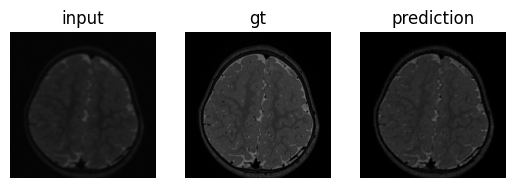

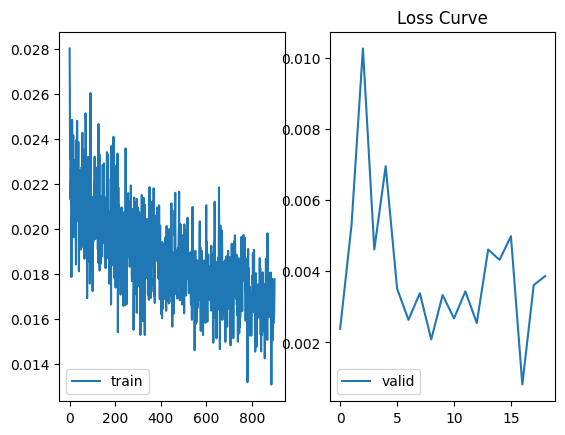

20it [00:02,  9.65it/s]


Epoch 902, Loss: 0.016935516346711664


20it [00:01, 10.08it/s]


Epoch 903, Loss: 0.016520061320625244


20it [00:02,  9.57it/s]


Epoch 904, Loss: 0.017073103017173706


20it [00:01, 10.19it/s]


Epoch 905, Loss: 0.016536845196969806


20it [00:01, 10.24it/s]


Epoch 906, Loss: 0.015442459913901984


20it [00:02,  9.85it/s]


Epoch 907, Loss: 0.01787118847714737


20it [00:02,  9.92it/s]


Epoch 908, Loss: 0.01675003217533231


20it [00:01, 10.06it/s]


Epoch 909, Loss: 0.015639350330457092


20it [00:01, 10.17it/s]


Epoch 910, Loss: 0.017215984757058322


20it [00:01, 10.07it/s]


Epoch 911, Loss: 0.01722213674802333


20it [00:01, 10.26it/s]


Epoch 912, Loss: 0.017541349120438098


20it [00:02,  9.98it/s]


Epoch 913, Loss: 0.015679705212824045


20it [00:02,  9.57it/s]


Epoch 914, Loss: 0.017067527887411414


20it [00:01, 10.14it/s]


Epoch 915, Loss: 0.01772314708214253


20it [00:01, 10.29it/s]


Epoch 916, Loss: 0.016237186407670377


20it [00:01, 10.06it/s]


Epoch 917, Loss: 0.01580596771091223


20it [00:01, 10.05it/s]


Epoch 918, Loss: 0.016222032555378973


20it [00:01, 10.23it/s]


Epoch 919, Loss: 0.017007028707303105


20it [00:02,  9.94it/s]


Epoch 920, Loss: 0.01576571792829782


20it [00:01, 10.13it/s]


Epoch 921, Loss: 0.01738114599138498


20it [00:01, 10.50it/s]


Epoch 922, Loss: 0.017719361139461397


20it [00:02,  9.97it/s]


Epoch 923, Loss: 0.017573226150125264


20it [00:02,  9.66it/s]


Epoch 924, Loss: 0.01576178171671927


20it [00:01, 10.36it/s]


Epoch 925, Loss: 0.01519426100421697


20it [00:02,  9.81it/s]


Epoch 926, Loss: 0.016750959458295255


20it [00:01, 10.01it/s]


Epoch 927, Loss: 0.01837259535677731


20it [00:01, 10.97it/s]


Epoch 928, Loss: 0.017936943750828504


20it [00:01, 10.11it/s]


Epoch 929, Loss: 0.016939454572275282


20it [00:01, 10.05it/s]


Epoch 930, Loss: 0.017142301052808763


20it [00:01, 10.31it/s]


Epoch 931, Loss: 0.018083735671825706


20it [00:01, 10.11it/s]


Epoch 932, Loss: 0.016928185266442596


20it [00:01, 10.02it/s]


Epoch 933, Loss: 0.01775636086240411


20it [00:01, 10.12it/s]


Epoch 934, Loss: 0.01570107862353325


20it [00:02,  9.96it/s]


Epoch 935, Loss: 0.018124984321184458


20it [00:02,  9.99it/s]


Epoch 936, Loss: 0.018089735065586865


20it [00:02,  9.86it/s]


Epoch 937, Loss: 0.013620420976076275


20it [00:01, 10.18it/s]


Epoch 938, Loss: 0.015920459781773387


20it [00:01, 10.22it/s]


Epoch 939, Loss: 0.017445097817108034


20it [00:01, 10.05it/s]


Epoch 940, Loss: 0.016930493339896203


20it [00:01, 10.10it/s]


Epoch 941, Loss: 0.016240860591642557


20it [00:01, 10.36it/s]


Epoch 942, Loss: 0.017039097589440645


20it [00:02,  9.98it/s]


Epoch 943, Loss: 0.01597423499915749


20it [00:01, 10.46it/s]


Epoch 944, Loss: 0.016318346187472344


20it [00:01, 10.09it/s]


Epoch 945, Loss: 0.01615525020752102


20it [00:01, 10.10it/s]


Epoch 946, Loss: 0.016397922253236174


20it [00:02,  9.41it/s]


Epoch 947, Loss: 0.015456316608469934


20it [00:01, 10.41it/s]


Epoch 948, Loss: 0.018920868216082454


20it [00:01, 10.03it/s]


Epoch 949, Loss: 0.01726751830428839


20it [00:01, 10.28it/s]


Epoch 950, Loss: 0.019612186355516315


20it [00:01, 10.35it/s]

Epoch 951, Loss: 0.01653055162169039



4it [00:00, 10.06it/s]


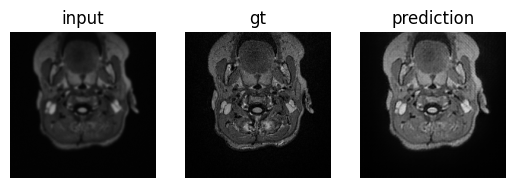

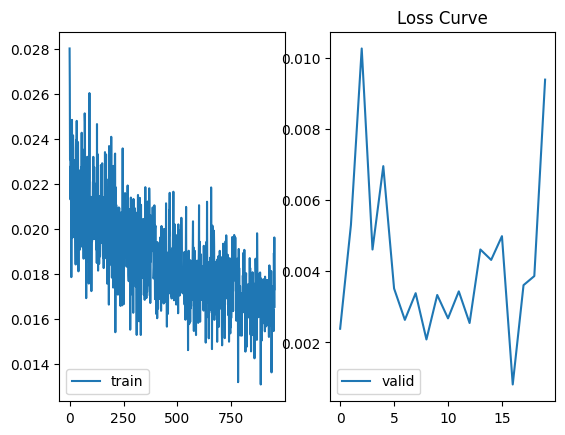

20it [00:02,  9.98it/s]


Epoch 952, Loss: 0.014325467939488589


20it [00:01, 10.13it/s]


Epoch 953, Loss: 0.01658748076297343


20it [00:02,  9.88it/s]


Epoch 954, Loss: 0.01646521098446101


20it [00:01, 10.51it/s]


Epoch 955, Loss: 0.016054299054667355


20it [00:02,  9.39it/s]


Epoch 956, Loss: 0.016659378679469226


20it [00:01, 10.03it/s]


Epoch 957, Loss: 0.015689012513030322


20it [00:02,  9.89it/s]


Epoch 958, Loss: 0.017248433886561543


20it [00:01, 10.09it/s]


Epoch 959, Loss: 0.016730577242560683


20it [00:01, 10.13it/s]


Epoch 960, Loss: 0.017516721040010452


20it [00:02,  9.69it/s]


Epoch 961, Loss: 0.01912931154947728


20it [00:01, 10.20it/s]


Epoch 962, Loss: 0.01949260039255023


20it [00:01, 10.43it/s]


Epoch 963, Loss: 0.018340536020696165


20it [00:01, 10.10it/s]


Epoch 964, Loss: 0.016487334622070193


20it [00:02,  9.96it/s]


Epoch 965, Loss: 0.015202739462256431


20it [00:02,  9.72it/s]


Epoch 966, Loss: 0.017281971918419004


20it [00:01, 10.09it/s]


Epoch 967, Loss: 0.018030559830367564


20it [00:01, 10.11it/s]


Epoch 968, Loss: 0.017242131661623715


20it [00:01, 10.56it/s]


Epoch 969, Loss: 0.016570685314945877


20it [00:01, 10.09it/s]


Epoch 970, Loss: 0.01672269186237827


20it [00:01, 10.10it/s]


Epoch 971, Loss: 0.01584103878121823


20it [00:02,  9.95it/s]


Epoch 972, Loss: 0.016395153687335552


20it [00:01, 10.33it/s]


Epoch 973, Loss: 0.01587507650256157


20it [00:01, 10.31it/s]


Epoch 974, Loss: 0.01692894729785621


20it [00:01, 10.60it/s]


Epoch 975, Loss: 0.01774163933005184


20it [00:01, 10.33it/s]


Epoch 976, Loss: 0.01735365316271782


20it [00:02,  9.41it/s]


Epoch 977, Loss: 0.01710859858430922


20it [00:02,  9.99it/s]


Epoch 978, Loss: 0.019163691694848238


20it [00:01, 10.66it/s]


Epoch 979, Loss: 0.01600340656004846


20it [00:01, 10.13it/s]


Epoch 980, Loss: 0.016892670351080597


20it [00:02,  9.88it/s]


Epoch 981, Loss: 0.01720744741614908


20it [00:02,  9.83it/s]


Epoch 982, Loss: 0.017626424366608263


20it [00:02,  9.78it/s]


Epoch 983, Loss: 0.017374682007357478


20it [00:02,  9.93it/s]


Epoch 984, Loss: 0.016366631304845215


20it [00:01, 10.39it/s]


Epoch 985, Loss: 0.016660687047988176


20it [00:02,  9.63it/s]


Epoch 986, Loss: 0.0161922846455127


20it [00:01, 10.11it/s]


Epoch 987, Loss: 0.016628250875510276


20it [00:02,  9.94it/s]


Epoch 988, Loss: 0.015033703739754855


20it [00:02,  9.79it/s]


Epoch 989, Loss: 0.016874550236389042


20it [00:02,  9.66it/s]


Epoch 990, Loss: 0.01820602659136057


20it [00:02, 10.00it/s]


Epoch 991, Loss: 0.016795596305746584


20it [00:02,  9.87it/s]


Epoch 992, Loss: 0.016021254332736136


20it [00:02,  9.83it/s]


Epoch 993, Loss: 0.018281100830063225


20it [00:01, 10.69it/s]


Epoch 994, Loss: 0.01534680041950196


20it [00:01, 10.03it/s]


Epoch 995, Loss: 0.01553152254782617


20it [00:02,  9.98it/s]


Epoch 996, Loss: 0.016068785544484855


20it [00:01, 10.27it/s]


Epoch 997, Loss: 0.01513243387453258


20it [00:02,  9.58it/s]


Epoch 998, Loss: 0.01735578146763146


20it [00:01, 10.05it/s]


Epoch 999, Loss: 0.014815185219049454


20it [00:01, 10.00it/s]


Epoch 1000, Loss: 0.01579265659675002


20it [00:01, 10.33it/s]

Epoch 1001, Loss: 0.016442776494659483



4it [00:00, 10.47it/s]


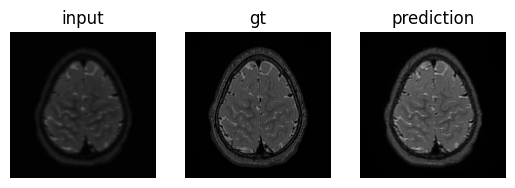

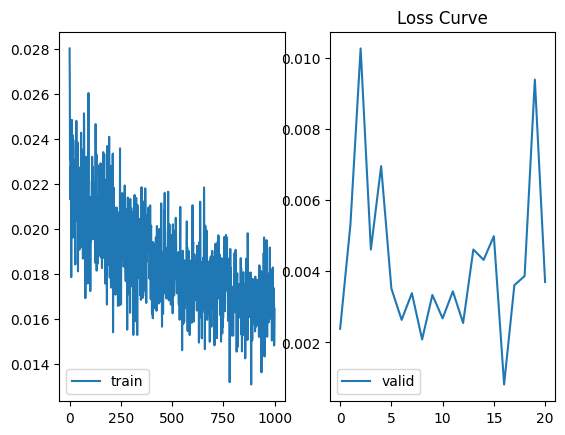

20it [00:01, 10.25it/s]


Epoch 1002, Loss: 0.017458693985827268


20it [00:01, 10.08it/s]


Epoch 1003, Loss: 0.017440638761036097


20it [00:01, 10.00it/s]


Epoch 1004, Loss: 0.017034947010688483


20it [00:01, 10.09it/s]


Epoch 1005, Loss: 0.017486281227320433


20it [00:02,  9.91it/s]


Epoch 1006, Loss: 0.01673315024236217


20it [00:02,  9.46it/s]


Epoch 1007, Loss: 0.01550639714114368


20it [00:01, 10.07it/s]


Epoch 1008, Loss: 0.017758504208177327


20it [00:02,  9.91it/s]


Epoch 1009, Loss: 0.017319889389909804


20it [00:01, 10.38it/s]


Epoch 1010, Loss: 0.017155578965321182


20it [00:01, 10.37it/s]


Epoch 1011, Loss: 0.018141363572794944


20it [00:01, 10.22it/s]


Epoch 1012, Loss: 0.018005989165976642


20it [00:01, 10.04it/s]


Epoch 1013, Loss: 0.017115704948082566


20it [00:01, 10.39it/s]


Epoch 1014, Loss: 0.01620268791448325


20it [00:01, 10.07it/s]


Epoch 1015, Loss: 0.016956006083637475


20it [00:01, 10.37it/s]


Epoch 1016, Loss: 0.0165667308261618


20it [00:01, 10.00it/s]


Epoch 1017, Loss: 0.017798694130033255


20it [00:02,  9.85it/s]


Epoch 1018, Loss: 0.017745908163487912


20it [00:01, 10.09it/s]


Epoch 1019, Loss: 0.01569815295515582


20it [00:01, 10.21it/s]


Epoch 1020, Loss: 0.01810510652139783


20it [00:01, 10.23it/s]


Epoch 1021, Loss: 0.017011154256761075


20it [00:01, 10.43it/s]


Epoch 1022, Loss: 0.016066332533955573


20it [00:01, 10.12it/s]


Epoch 1023, Loss: 0.018950100429356097


20it [00:01, 10.19it/s]


Epoch 1024, Loss: 0.01599690729053691


20it [00:01, 10.09it/s]


Epoch 1025, Loss: 0.01858751866966486


20it [00:01, 10.14it/s]


Epoch 1026, Loss: 0.017189910309389232


20it [00:02,  9.83it/s]


Epoch 1027, Loss: 0.01701578770298511


20it [00:02,  9.39it/s]


Epoch 1028, Loss: 0.01577202642802149


20it [00:01, 10.49it/s]


Epoch 1029, Loss: 0.017125279316678642


20it [00:02,  9.78it/s]


Epoch 1030, Loss: 0.01697520646266639


20it [00:02,  9.74it/s]


Epoch 1031, Loss: 0.017041068524122238


20it [00:02,  9.77it/s]


Epoch 1032, Loss: 0.016747187613509594


20it [00:01, 10.19it/s]


Epoch 1033, Loss: 0.016969204274937512


20it [00:01, 10.10it/s]


Epoch 1034, Loss: 0.016465416981372983


20it [00:02,  9.80it/s]


Epoch 1035, Loss: 0.01711676127742976


20it [00:01, 10.04it/s]


Epoch 1036, Loss: 0.016410988848656417


20it [00:02,  9.87it/s]


Epoch 1037, Loss: 0.016514361090958118


20it [00:02,  9.50it/s]


Epoch 1038, Loss: 0.01815039860084653


20it [00:01, 10.24it/s]


Epoch 1039, Loss: 0.016796201188117265


20it [00:01, 10.18it/s]


Epoch 1040, Loss: 0.018004312203265725


20it [00:01, 10.04it/s]


Epoch 1041, Loss: 0.016625581379048526


20it [00:02,  9.95it/s]


Epoch 1042, Loss: 0.018725631968118252


20it [00:02,  9.87it/s]


Epoch 1043, Loss: 0.014995634299702942


20it [00:01, 10.24it/s]


Epoch 1044, Loss: 0.016233592457138003


20it [00:02,  9.89it/s]


Epoch 1045, Loss: 0.015733796125277876


20it [00:02,  9.99it/s]


Epoch 1046, Loss: 0.017422938952222466


20it [00:01, 10.14it/s]


Epoch 1047, Loss: 0.01672163016628474


20it [00:02,  9.91it/s]


Epoch 1048, Loss: 0.01495810942724347


20it [00:02,  9.52it/s]


Epoch 1049, Loss: 0.01845071741845459


20it [00:01, 10.27it/s]


Epoch 1050, Loss: 0.0166136403917335


20it [00:01, 10.25it/s]

Epoch 1051, Loss: 0.017658780748024582



4it [00:00,  9.39it/s]


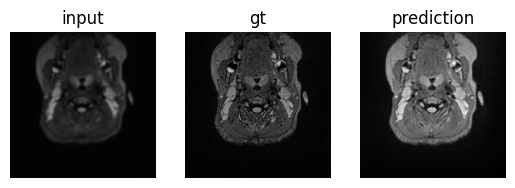

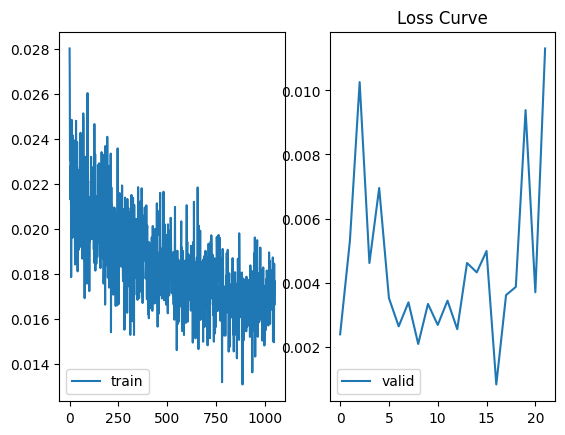

20it [00:01, 10.10it/s]


Epoch 1052, Loss: 0.016425593639723957


20it [00:01, 10.03it/s]


Epoch 1053, Loss: 0.016543417400680483


20it [00:02,  9.98it/s]


Epoch 1054, Loss: 0.016633906168863177


20it [00:01, 10.30it/s]


Epoch 1055, Loss: 0.015797584981191902


20it [00:02,  9.96it/s]


Epoch 1056, Loss: 0.015847605490125715


20it [00:01, 10.11it/s]


Epoch 1057, Loss: 0.01680738606955856


20it [00:02,  9.34it/s]


Epoch 1058, Loss: 0.014567441237159074


20it [00:01, 10.46it/s]


Epoch 1059, Loss: 0.017277500359341502


20it [00:02,  9.92it/s]


Epoch 1060, Loss: 0.018099038396030664


20it [00:01, 10.24it/s]


Epoch 1061, Loss: 0.01672684142831713


20it [00:01, 10.05it/s]


Epoch 1062, Loss: 0.015256499825045466


20it [00:01, 10.29it/s]


Epoch 1063, Loss: 0.01534372561145574


20it [00:01, 10.23it/s]


Epoch 1064, Loss: 0.01730044975411147


20it [00:01, 10.30it/s]


Epoch 1065, Loss: 0.017539415461942553


20it [00:01, 10.22it/s]


Epoch 1066, Loss: 0.018344891630113123


20it [00:01, 10.03it/s]


Epoch 1067, Loss: 0.016769106243737043


20it [00:01, 10.01it/s]


Epoch 1068, Loss: 0.018573476886376738


20it [00:01, 10.08it/s]


Epoch 1069, Loss: 0.014888341911137104


20it [00:01, 10.00it/s]


Epoch 1070, Loss: 0.013716477307025344


20it [00:01, 10.11it/s]


Epoch 1071, Loss: 0.015371234435588122


20it [00:01, 10.01it/s]


Epoch 1072, Loss: 0.01828409722074866


20it [00:01, 10.19it/s]


Epoch 1073, Loss: 0.017383389663882552


20it [00:01, 10.03it/s]


Epoch 1074, Loss: 0.016826321801636367


20it [00:01, 10.00it/s]


Epoch 1075, Loss: 0.016184428217820825


20it [00:01, 10.21it/s]


Epoch 1076, Loss: 0.01731342766433954


20it [00:02,  9.98it/s]


Epoch 1077, Loss: 0.014219948882237076


20it [00:01, 10.17it/s]


Epoch 1078, Loss: 0.016796680446714164


20it [00:01, 10.01it/s]


Epoch 1079, Loss: 0.016287232260219754


20it [00:02,  9.97it/s]


Epoch 1080, Loss: 0.016276313411071896


20it [00:01, 10.07it/s]


Epoch 1081, Loss: 0.015976535086520017


20it [00:02,  9.90it/s]


Epoch 1082, Loss: 0.0163886722875759


20it [00:02,  9.91it/s]


Epoch 1083, Loss: 0.01745967771857977


20it [00:01, 10.07it/s]


Epoch 1084, Loss: 0.015557875763624907


20it [00:01, 10.08it/s]


Epoch 1085, Loss: 0.01543860025703907


20it [00:01, 10.15it/s]


Epoch 1086, Loss: 0.016792411589995025


20it [00:01, 10.01it/s]


Epoch 1087, Loss: 0.01569407247006893


20it [00:01, 10.12it/s]


Epoch 1088, Loss: 0.0177525220438838


20it [00:02,  9.79it/s]


Epoch 1089, Loss: 0.017765823937952518


20it [00:01, 10.13it/s]


Epoch 1090, Loss: 0.014268297387752682


20it [00:02,  9.84it/s]


Epoch 1091, Loss: 0.015969851217232645


20it [00:02,  9.99it/s]


Epoch 1092, Loss: 0.01553115042624995


20it [00:01, 10.03it/s]


Epoch 1093, Loss: 0.016498773102648558


20it [00:02,  9.93it/s]


Epoch 1094, Loss: 0.01783225315157324


20it [00:01, 10.01it/s]


Epoch 1095, Loss: 0.017449403181672096


20it [00:01, 10.13it/s]


Epoch 1096, Loss: 0.017352514923550187


20it [00:01, 10.33it/s]


Epoch 1097, Loss: 0.01720524178817868


20it [00:01, 10.01it/s]


Epoch 1098, Loss: 0.01641906478907913


20it [00:02,  9.97it/s]


Epoch 1099, Loss: 0.016962130134925247


20it [00:02,  9.57it/s]


Epoch 1100, Loss: 0.01766516687348485


20it [00:01, 10.09it/s]

Epoch 1101, Loss: 0.016554008109960706



4it [00:00, 10.50it/s]


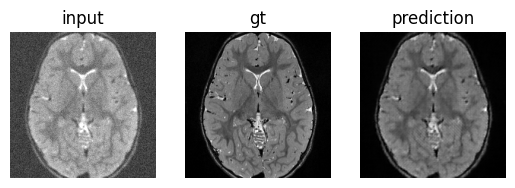

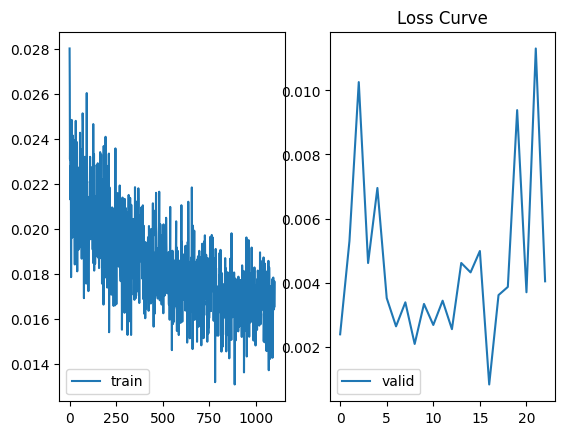

20it [00:01, 10.11it/s]


Epoch 1102, Loss: 0.016384425782598556


20it [00:01, 10.24it/s]


Epoch 1103, Loss: 0.01604891405440867


20it [00:01, 10.35it/s]


Epoch 1104, Loss: 0.015805760398507118


20it [00:01, 10.03it/s]


Epoch 1105, Loss: 0.018276740331202745


20it [00:01, 10.30it/s]


Epoch 1106, Loss: 0.017822711262851954


20it [00:02,  9.91it/s]


Epoch 1107, Loss: 0.017805265844799578


20it [00:01, 10.24it/s]


Epoch 1108, Loss: 0.01649598591029644


20it [00:02,  9.98it/s]


Epoch 1109, Loss: 0.014796445565298199


20it [00:02,  9.60it/s]


Epoch 1110, Loss: 0.015597769035957753


20it [00:01, 10.11it/s]


Epoch 1111, Loss: 0.01530946510611102


20it [00:01, 10.10it/s]


Epoch 1112, Loss: 0.01732379193417728


20it [00:01, 10.30it/s]


Epoch 1113, Loss: 0.016199867939576507


20it [00:01, 10.02it/s]


Epoch 1114, Loss: 0.016908642323687672


20it [00:02,  9.81it/s]


Epoch 1115, Loss: 0.01586481665726751


20it [00:02,  9.84it/s]


Epoch 1116, Loss: 0.015035681193694472


20it [00:01, 10.20it/s]


Epoch 1117, Loss: 0.017337078135460614


20it [00:02,  9.94it/s]


Epoch 1118, Loss: 0.015273153479211033


20it [00:01, 10.11it/s]


Epoch 1119, Loss: 0.016174861532635986


20it [00:02,  9.92it/s]


Epoch 1120, Loss: 0.017610682954546063


20it [00:02,  9.50it/s]


Epoch 1121, Loss: 0.017577439127489925


20it [00:01, 10.18it/s]


Epoch 1122, Loss: 0.01615565954707563


20it [00:01, 10.10it/s]


Epoch 1123, Loss: 0.015598714025691152


20it [00:01, 10.05it/s]


Epoch 1124, Loss: 0.01665382639039308


20it [00:01, 10.08it/s]


Epoch 1125, Loss: 0.01653013755567372


20it [00:01, 10.05it/s]


Epoch 1126, Loss: 0.015522234491072595


20it [00:01, 10.31it/s]


Epoch 1127, Loss: 0.016590440331492574


20it [00:02,  9.59it/s]


Epoch 1128, Loss: 0.01637230140622705


20it [00:02,  9.82it/s]


Epoch 1129, Loss: 0.015748971456196158


20it [00:02,  9.64it/s]


Epoch 1130, Loss: 0.016082453657872975


20it [00:02,  9.93it/s]


Epoch 1131, Loss: 0.015481261000968517


20it [00:02,  9.79it/s]


Epoch 1132, Loss: 0.017278308141976596


20it [00:01, 10.06it/s]


Epoch 1133, Loss: 0.01714741679606959


20it [00:02,  9.88it/s]


Epoch 1134, Loss: 0.017697143368422985


20it [00:01, 10.23it/s]


Epoch 1135, Loss: 0.016151022561825813


20it [00:01, 10.33it/s]


Epoch 1136, Loss: 0.017969496082514524


20it [00:02,  9.99it/s]


Epoch 1137, Loss: 0.01721391419414431


20it [00:02,  9.83it/s]


Epoch 1138, Loss: 0.016423007822595537


20it [00:01, 10.16it/s]


Epoch 1139, Loss: 0.017271764343604445


20it [00:02,  9.80it/s]


Epoch 1140, Loss: 0.016451289970427753


20it [00:01, 10.15it/s]


Epoch 1141, Loss: 0.018797025829553605


20it [00:01, 10.02it/s]


Epoch 1142, Loss: 0.016508719744160773


20it [00:01, 10.03it/s]


Epoch 1143, Loss: 0.015575010364409536


20it [00:01, 10.14it/s]


Epoch 1144, Loss: 0.015302700735628606


20it [00:01, 10.65it/s]


Epoch 1145, Loss: 0.017646315274760127


20it [00:01, 10.30it/s]


Epoch 1146, Loss: 0.015570760890841483


20it [00:01, 10.34it/s]


Epoch 1147, Loss: 0.01648303014226258


20it [00:01, 10.21it/s]


Epoch 1148, Loss: 0.014272471563890577


20it [00:01, 10.21it/s]


Epoch 1149, Loss: 0.015647592768073083


20it [00:01, 10.19it/s]


Epoch 1150, Loss: 0.017014606471639125


20it [00:01, 10.32it/s]

Epoch 1151, Loss: 0.01729079911019653



4it [00:00,  8.55it/s]


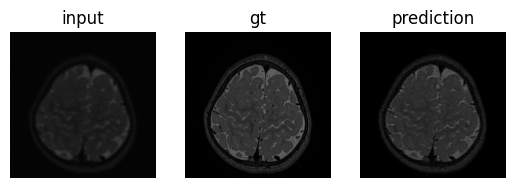

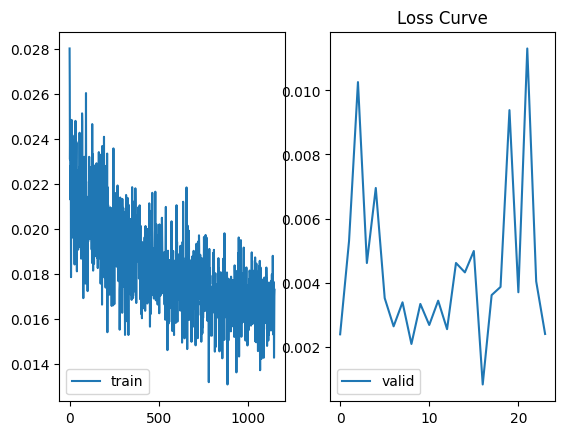

20it [00:01, 10.05it/s]


Epoch 1152, Loss: 0.0180038683116436


20it [00:01, 10.37it/s]


Epoch 1153, Loss: 0.015732400584965944


20it [00:01, 10.15it/s]


Epoch 1154, Loss: 0.01591782986652106


20it [00:01, 10.47it/s]


Epoch 1155, Loss: 0.01485290415585041


20it [00:01, 10.70it/s]


Epoch 1156, Loss: 0.017126365983858704


20it [00:01, 10.37it/s]


Epoch 1157, Loss: 0.017726737586781383


20it [00:01, 10.72it/s]


Epoch 1158, Loss: 0.014777505863457918


20it [00:02,  9.69it/s]


Epoch 1159, Loss: 0.01618278210517019


20it [00:01, 10.43it/s]


Epoch 1160, Loss: 0.017676818929612637


20it [00:02,  9.69it/s]


Epoch 1161, Loss: 0.014978709327988327


20it [00:02,  9.99it/s]


Epoch 1162, Loss: 0.013713699369691312


20it [00:01, 10.24it/s]


Epoch 1163, Loss: 0.015535479981917889


20it [00:01, 10.32it/s]


Epoch 1164, Loss: 0.015067647490650416


20it [00:01, 10.30it/s]


Epoch 1165, Loss: 0.01599533895496279


20it [00:01, 10.08it/s]


Epoch 1166, Loss: 0.017643122235313058


20it [00:02,  9.94it/s]


Epoch 1167, Loss: 0.016911622090265154


20it [00:01, 10.47it/s]


Epoch 1168, Loss: 0.01787170018069446


20it [00:02,  9.91it/s]


Epoch 1169, Loss: 0.01636441326700151


20it [00:01, 10.41it/s]


Epoch 1170, Loss: 0.015426232444588095


20it [00:01, 10.57it/s]


Epoch 1171, Loss: 0.01639791977358982


20it [00:02,  9.65it/s]


Epoch 1172, Loss: 0.0161862188950181


20it [00:01, 10.43it/s]


Epoch 1173, Loss: 0.0172111333347857


20it [00:01, 10.41it/s]


Epoch 1174, Loss: 0.017810715083032846


20it [00:02,  9.91it/s]


Epoch 1175, Loss: 0.015567728958558291


20it [00:01, 10.10it/s]


Epoch 1176, Loss: 0.017540979152545332


20it [00:02,  9.91it/s]


Epoch 1177, Loss: 0.015553696174174547


20it [00:01, 10.07it/s]


Epoch 1178, Loss: 0.015988092799670995


20it [00:01, 10.46it/s]


Epoch 1179, Loss: 0.015919369808398188


20it [00:01, 10.34it/s]


Epoch 1180, Loss: 0.017056091071572153


20it [00:01, 10.29it/s]


Epoch 1181, Loss: 0.015424150880426169


20it [00:02,  9.80it/s]


Epoch 1182, Loss: 0.015294525807257741


20it [00:02,  9.88it/s]


Epoch 1183, Loss: 0.013522113021463156


20it [00:02,  9.97it/s]


Epoch 1184, Loss: 0.015701198764145375


20it [00:01, 10.26it/s]


Epoch 1185, Loss: 0.01678705671802163


20it [00:01, 10.05it/s]


Epoch 1186, Loss: 0.016042945673689246


20it [00:01, 10.14it/s]


Epoch 1187, Loss: 0.016883325856179


20it [00:02,  9.98it/s]


Epoch 1188, Loss: 0.015934867388568818


20it [00:02,  9.99it/s]


Epoch 1189, Loss: 0.015600295923650264


20it [00:01, 10.15it/s]


Epoch 1190, Loss: 0.017576555442065


20it [00:01, 10.19it/s]


Epoch 1191, Loss: 0.018359374231658877


20it [00:01, 10.32it/s]


Epoch 1192, Loss: 0.018067863071337342


20it [00:02,  9.74it/s]


Epoch 1193, Loss: 0.015377957746386528


20it [00:01, 10.17it/s]


Epoch 1194, Loss: 0.016928193112835287


20it [00:02,  9.99it/s]


Epoch 1195, Loss: 0.017697705328464507


20it [00:01, 10.58it/s]


Epoch 1196, Loss: 0.017492327955551445


20it [00:01, 10.25it/s]


Epoch 1197, Loss: 0.017022505938075482


20it [00:01, 10.25it/s]


Epoch 1198, Loss: 0.01584999265614897


20it [00:01, 10.59it/s]


Epoch 1199, Loss: 0.0164319827221334


20it [00:01, 10.09it/s]


Epoch 1200, Loss: 0.016289404314011335


20it [00:01, 10.05it/s]

Epoch 1201, Loss: 0.015689350152388214



4it [00:00,  8.98it/s]


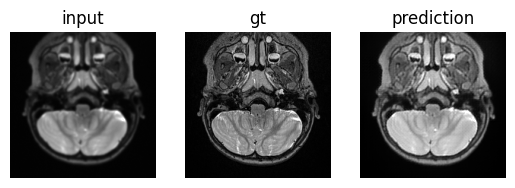

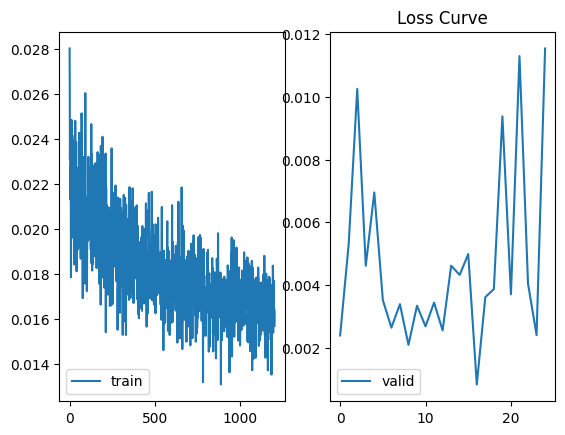

20it [00:02,  9.74it/s]


Epoch 1202, Loss: 0.015094497869722546


20it [00:01, 10.05it/s]


Epoch 1203, Loss: 0.015200830530375242


20it [00:02,  9.83it/s]


Epoch 1204, Loss: 0.016826663026586176


20it [00:01, 10.00it/s]


Epoch 1205, Loss: 0.017576929228380323


20it [00:01, 10.16it/s]


Epoch 1206, Loss: 0.014318108768202364


20it [00:01, 10.17it/s]


Epoch 1207, Loss: 0.014395257062278687


20it [00:01, 10.13it/s]


Epoch 1208, Loss: 0.015483164042234421


20it [00:01, 10.08it/s]


Epoch 1209, Loss: 0.01693774664308876


20it [00:01, 10.02it/s]


Epoch 1210, Loss: 0.013954361574724317


20it [00:01, 10.23it/s]


Epoch 1211, Loss: 0.015996037493459882


20it [00:02,  9.63it/s]


Epoch 1212, Loss: 0.016688899998553098


20it [00:01, 10.08it/s]


Epoch 1213, Loss: 0.015935236448422076


20it [00:01, 10.44it/s]


Epoch 1214, Loss: 0.017166072386316955


20it [00:01, 10.04it/s]


Epoch 1215, Loss: 0.017230503144674003


20it [00:01, 10.05it/s]


Epoch 1216, Loss: 0.015369977243244648


20it [00:01, 10.28it/s]


Epoch 1217, Loss: 0.015813522064127027


20it [00:02,  9.99it/s]


Epoch 1218, Loss: 0.014989034505560994


20it [00:02,  9.77it/s]


Epoch 1219, Loss: 0.016209024633280934


20it [00:01, 10.37it/s]


Epoch 1220, Loss: 0.014487707545049489


20it [00:01, 10.23it/s]


Epoch 1221, Loss: 0.015259355842135846


20it [00:01, 10.08it/s]


Epoch 1222, Loss: 0.017196271964348853


20it [00:02,  9.50it/s]


Epoch 1223, Loss: 0.016900944453664125


20it [00:02,  9.92it/s]


Epoch 1224, Loss: 0.01752613727003336


20it [00:02,  9.97it/s]


Epoch 1225, Loss: 0.017044557351619007


20it [00:01, 10.14it/s]


Epoch 1226, Loss: 0.015296589105855674


20it [00:02,  9.87it/s]


Epoch 1227, Loss: 0.015769655047915877


20it [00:01, 10.16it/s]


Epoch 1228, Loss: 0.016151935420930387


20it [00:02,  9.98it/s]


Epoch 1229, Loss: 0.016677032737061382


20it [00:02,  9.80it/s]


Epoch 1230, Loss: 0.01779964049346745


20it [00:01, 10.13it/s]


Epoch 1231, Loss: 0.014636857598088682


20it [00:01, 10.35it/s]


Epoch 1232, Loss: 0.01729013256262988


20it [00:01, 10.46it/s]


Epoch 1233, Loss: 0.015860421175602823


20it [00:02,  9.74it/s]


Epoch 1234, Loss: 0.016353425057604908


20it [00:02,  9.80it/s]


Epoch 1235, Loss: 0.016274120775051415


20it [00:01, 10.22it/s]


Epoch 1236, Loss: 0.01742139325942844


20it [00:02,  9.90it/s]


Epoch 1237, Loss: 0.015717034181579947


20it [00:01, 10.32it/s]


Epoch 1238, Loss: 0.016010600654408336


20it [00:01, 10.09it/s]


Epoch 1239, Loss: 0.017047167883720248


20it [00:01, 10.23it/s]


Epoch 1240, Loss: 0.017030989448539913


20it [00:01, 10.38it/s]


Epoch 1241, Loss: 0.016759125143289567


20it [00:01, 10.25it/s]


Epoch 1242, Loss: 0.01690877238288522


20it [00:02,  9.68it/s]


Epoch 1243, Loss: 0.016423101467080415


20it [00:02,  9.59it/s]


Epoch 1244, Loss: 0.017380228615365922


20it [00:02,  9.89it/s]


Epoch 1245, Loss: 0.016453242406714707


20it [00:01, 10.24it/s]


Epoch 1246, Loss: 0.01620048324111849


20it [00:02,  9.92it/s]


Epoch 1247, Loss: 0.01692343333270401


20it [00:01, 10.06it/s]


Epoch 1248, Loss: 0.015077768184710294


20it [00:01, 10.19it/s]


Epoch 1249, Loss: 0.01693853803444654


20it [00:01, 10.00it/s]


Epoch 1250, Loss: 0.016796231851913035


20it [00:02,  9.82it/s]

Epoch 1251, Loss: 0.016488087736070155



4it [00:00,  9.20it/s]


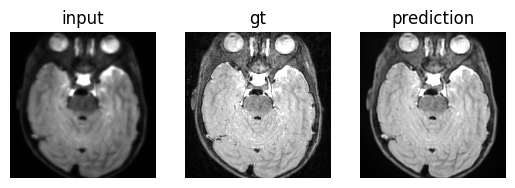

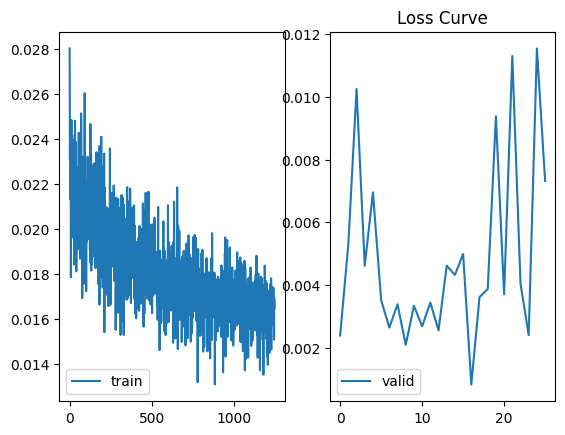

20it [00:01, 10.44it/s]


Epoch 1252, Loss: 0.015885660657659173


20it [00:02,  9.81it/s]


Epoch 1253, Loss: 0.01563663677079603


20it [00:01, 10.10it/s]


Epoch 1254, Loss: 0.018111939588561655


20it [00:02,  9.70it/s]


Epoch 1255, Loss: 0.016645837179385125


20it [00:01, 10.30it/s]


Epoch 1256, Loss: 0.017284810170531274


20it [00:01, 10.16it/s]


Epoch 1257, Loss: 0.017886673938483


20it [00:01, 10.25it/s]


Epoch 1258, Loss: 0.017650866159237923


20it [00:01, 10.00it/s]


Epoch 1259, Loss: 0.017112887720577417


20it [00:01, 10.10it/s]


Epoch 1260, Loss: 0.01545205172151327


20it [00:01, 10.22it/s]


Epoch 1261, Loss: 0.017606304376386106


20it [00:01, 10.18it/s]


Epoch 1262, Loss: 0.01615336528047919


20it [00:01, 10.10it/s]


Epoch 1263, Loss: 0.017224810482002795


20it [00:02,  9.47it/s]


Epoch 1264, Loss: 0.01735754737164825


20it [00:01, 10.23it/s]


Epoch 1265, Loss: 0.016592863225378097


20it [00:01, 10.04it/s]


Epoch 1266, Loss: 0.015519264503382146


20it [00:02,  9.94it/s]


Epoch 1267, Loss: 0.01718061128631234


20it [00:01, 10.66it/s]


Epoch 1268, Loss: 0.014685429248493165


20it [00:02,  9.91it/s]


Epoch 1269, Loss: 0.0167401458369568


20it [00:01, 10.23it/s]


Epoch 1270, Loss: 0.01639563838252798


20it [00:01, 10.21it/s]


Epoch 1271, Loss: 0.01666085785254836


20it [00:02,  9.83it/s]


Epoch 1272, Loss: 0.014296164968982339


20it [00:01, 10.39it/s]


Epoch 1273, Loss: 0.016092219529673456


20it [00:02,  9.65it/s]


Epoch 1274, Loss: 0.015692576603032648


20it [00:01, 10.11it/s]


Epoch 1275, Loss: 0.0164507927140221


20it [00:01, 10.26it/s]


Epoch 1276, Loss: 0.018390031554736196


20it [00:01, 10.29it/s]


Epoch 1277, Loss: 0.017045644344761968


20it [00:01, 10.10it/s]


Epoch 1278, Loss: 0.015791285724844784


20it [00:01, 10.23it/s]


Epoch 1279, Loss: 0.015459690894931554


20it [00:01, 10.26it/s]


Epoch 1280, Loss: 0.016007877979427577


20it [00:01, 10.13it/s]


Epoch 1281, Loss: 0.014650127559434623


20it [00:02,  9.99it/s]


Epoch 1282, Loss: 0.01534882935229689


20it [00:01, 10.18it/s]


Epoch 1283, Loss: 0.017369636055082082


20it [00:02,  9.96it/s]


Epoch 1284, Loss: 0.015220633172430099


20it [00:02,  9.63it/s]


Epoch 1285, Loss: 0.01715094471583143


20it [00:02,  9.94it/s]


Epoch 1286, Loss: 0.016407745238393546


20it [00:01, 10.00it/s]


Epoch 1287, Loss: 0.01770562119781971


20it [00:01, 10.11it/s]


Epoch 1288, Loss: 0.015480426838621497


20it [00:01, 10.07it/s]


Epoch 1289, Loss: 0.015914283506572247


20it [00:01, 10.05it/s]


Epoch 1290, Loss: 0.01582013382576406


20it [00:01, 10.34it/s]


Epoch 1291, Loss: 0.016587487398646773


20it [00:01, 10.03it/s]


Epoch 1292, Loss: 0.015587954316288233


20it [00:01, 10.32it/s]


Epoch 1293, Loss: 0.014836306986398994


20it [00:01, 10.16it/s]


Epoch 1294, Loss: 0.016841293568722902


20it [00:01, 10.26it/s]


Epoch 1295, Loss: 0.016404650907497854


20it [00:02,  9.66it/s]


Epoch 1296, Loss: 0.01759927358943969


20it [00:01, 10.34it/s]


Epoch 1297, Loss: 0.017397556942887603


20it [00:02,  9.81it/s]


Epoch 1298, Loss: 0.01667819085996598


20it [00:01, 10.34it/s]


Epoch 1299, Loss: 0.01574278003536165


20it [00:02,  9.74it/s]


Epoch 1300, Loss: 0.017200513323768974


20it [00:02,  9.93it/s]

Epoch 1301, Loss: 0.017967766826041044



4it [00:00, 10.53it/s]


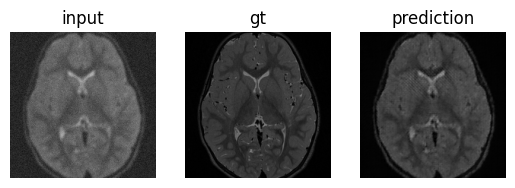

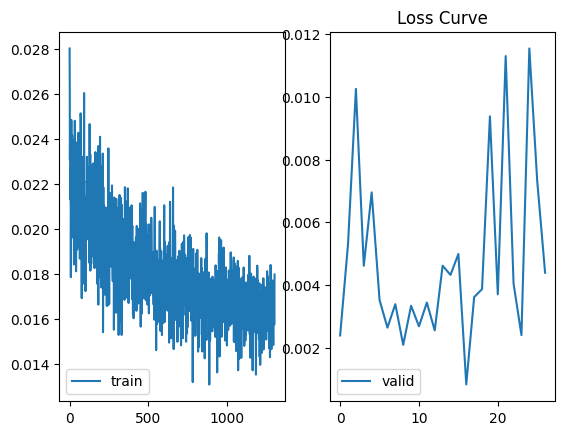

20it [00:01, 10.57it/s]


Epoch 1302, Loss: 0.017869451083242893


20it [00:02,  9.92it/s]


Epoch 1303, Loss: 0.017193445819430053


20it [00:01, 10.45it/s]


Epoch 1304, Loss: 0.01599399414844811


20it [00:01, 10.01it/s]


Epoch 1305, Loss: 0.016130387678276747


20it [00:02,  9.52it/s]


Epoch 1306, Loss: 0.014569622301496565


20it [00:01, 10.04it/s]


Epoch 1307, Loss: 0.01737327880691737


20it [00:01, 10.35it/s]


Epoch 1308, Loss: 0.017349861096590757


20it [00:01, 10.45it/s]


Epoch 1309, Loss: 0.014988082810305059


20it [00:02,  9.98it/s]


Epoch 1310, Loss: 0.01681528149638325


20it [00:02, 10.00it/s]


Epoch 1311, Loss: 0.01327513309661299


20it [00:01, 10.40it/s]


Epoch 1312, Loss: 0.016231387201696635


20it [00:01, 10.13it/s]


Epoch 1313, Loss: 0.017603987641632558


20it [00:01, 10.09it/s]


Epoch 1314, Loss: 0.015565792424604296


20it [00:01, 10.01it/s]


Epoch 1315, Loss: 0.016348450584337114


20it [00:01, 10.45it/s]


Epoch 1316, Loss: 0.01512540231924504


20it [00:02,  9.84it/s]


Epoch 1317, Loss: 0.01680083500687033


20it [00:01, 10.35it/s]


Epoch 1318, Loss: 0.014689516555517913


20it [00:01, 10.41it/s]


Epoch 1319, Loss: 0.017821792559698225


20it [00:01, 10.16it/s]


Epoch 1320, Loss: 0.016962581500411033


20it [00:02,  9.98it/s]


Epoch 1321, Loss: 0.01648869242053479


20it [00:01, 10.47it/s]


Epoch 1322, Loss: 0.016273217811249196


20it [00:01, 10.07it/s]


Epoch 1323, Loss: 0.016969963582232593


20it [00:01, 10.48it/s]


Epoch 1324, Loss: 0.01604148941114545


20it [00:02,  9.93it/s]


Epoch 1325, Loss: 0.01649364223703742


20it [00:01, 10.15it/s]


Epoch 1326, Loss: 0.01660938411951065


20it [00:01, 10.30it/s]


Epoch 1327, Loss: 0.01567864485550672


20it [00:02,  9.31it/s]


Epoch 1328, Loss: 0.016414215113036333


20it [00:02,  9.88it/s]


Epoch 1329, Loss: 0.015599682601168752


20it [00:01, 10.00it/s]


Epoch 1330, Loss: 0.015431670076213776


20it [00:01, 10.26it/s]


Epoch 1331, Loss: 0.014529114367906003


20it [00:02,  9.83it/s]


Epoch 1332, Loss: 0.01526023035403341


20it [00:01, 10.06it/s]


Epoch 1333, Loss: 0.017374249640852213


20it [00:01, 10.36it/s]


Epoch 1334, Loss: 0.015556906803976745


20it [00:02,  9.98it/s]


Epoch 1335, Loss: 0.015792618039995432


20it [00:02,  9.94it/s]


Epoch 1336, Loss: 0.014209364040289075


20it [00:01, 10.54it/s]


Epoch 1337, Loss: 0.017387769743800165


20it [00:02,  9.55it/s]


Epoch 1338, Loss: 0.014786662615370006


20it [00:02,  9.76it/s]


Epoch 1339, Loss: 0.017903658235445617


20it [00:02,  9.91it/s]


Epoch 1340, Loss: 0.01611414421349764


20it [00:01, 10.02it/s]


Epoch 1341, Loss: 0.017556117055937646


20it [00:01, 10.57it/s]


Epoch 1342, Loss: 0.01642936998978257


20it [00:02,  9.95it/s]


Epoch 1343, Loss: 0.015847844688687475


20it [00:02,  9.92it/s]


Epoch 1344, Loss: 0.014804807165637613


20it [00:01, 10.18it/s]


Epoch 1345, Loss: 0.01522385999560356


20it [00:02,  9.72it/s]


Epoch 1346, Loss: 0.015865224599838256


20it [00:02,  9.89it/s]


Epoch 1347, Loss: 0.015012891823425889


20it [00:02,  9.98it/s]


Epoch 1348, Loss: 0.015423238521907478


20it [00:02,  9.87it/s]


Epoch 1349, Loss: 0.013236358948051929


20it [00:02,  9.45it/s]


Epoch 1350, Loss: 0.01628315537236631


20it [00:01, 10.45it/s]

Epoch 1351, Loss: 0.015565179800614715



4it [00:00,  9.65it/s]


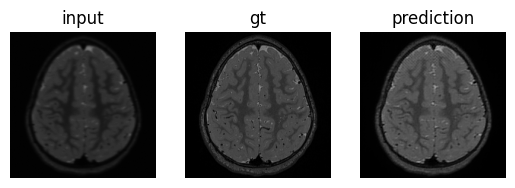

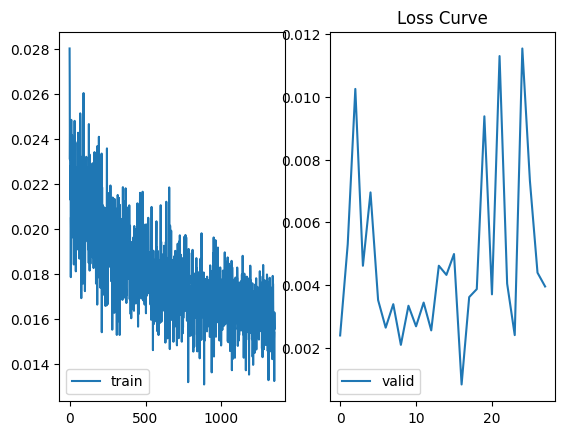

20it [00:02,  9.94it/s]


Epoch 1352, Loss: 0.015379600133746863


20it [00:02,  9.81it/s]


Epoch 1353, Loss: 0.014335125184152276


20it [00:02,  9.99it/s]


Epoch 1354, Loss: 0.016962705261539666


20it [00:02,  9.94it/s]


Epoch 1355, Loss: 0.015317191043868661


20it [00:02,  9.96it/s]


Epoch 1356, Loss: 0.015653843246400356


20it [00:01, 10.25it/s]


Epoch 1357, Loss: 0.015610373870003968


20it [00:01, 10.36it/s]


Epoch 1358, Loss: 0.015311663213651627


20it [00:01, 10.48it/s]


Epoch 1359, Loss: 0.016751525923609734


20it [00:02,  9.51it/s]


Epoch 1360, Loss: 0.015510944416746497


20it [00:02,  9.91it/s]


Epoch 1361, Loss: 0.014427306759171189


20it [00:01, 10.11it/s]


Epoch 1362, Loss: 0.01525674139847979


20it [00:02,  9.87it/s]


Epoch 1363, Loss: 0.01712253747973591


20it [00:01, 10.01it/s]


Epoch 1364, Loss: 0.015033205866347998


20it [00:02,  9.91it/s]


Epoch 1365, Loss: 0.01601094505749643


20it [00:01, 10.06it/s]


Epoch 1366, Loss: 0.016345043177716435


20it [00:01, 10.12it/s]


Epoch 1367, Loss: 0.015553787327371537


20it [00:01, 10.19it/s]


Epoch 1368, Loss: 0.014203301235102116


20it [00:01, 10.42it/s]


Epoch 1369, Loss: 0.016344551718793808


20it [00:02,  9.97it/s]


Epoch 1370, Loss: 0.016751595539972186


20it [00:01, 10.35it/s]


Epoch 1371, Loss: 0.014405306545086205


20it [00:01, 10.05it/s]


Epoch 1372, Loss: 0.014946711692027747


20it [00:02,  9.78it/s]


Epoch 1373, Loss: 0.015557550289668143


20it [00:01, 10.16it/s]


Epoch 1374, Loss: 0.017376126162707804


20it [00:01, 10.18it/s]


Epoch 1375, Loss: 0.014842967910226434


20it [00:01, 10.22it/s]


Epoch 1376, Loss: 0.015642794594168664


20it [00:01, 10.05it/s]


Epoch 1377, Loss: 0.015614744299091399


20it [00:02,  9.83it/s]


Epoch 1378, Loss: 0.01753974996972829


20it [00:02,  9.82it/s]


Epoch 1379, Loss: 0.017225259030237795


20it [00:01, 10.45it/s]


Epoch 1380, Loss: 0.01625309733208269


20it [00:02,  9.89it/s]


Epoch 1381, Loss: 0.016750745242461562


20it [00:01, 10.21it/s]


Epoch 1382, Loss: 0.015336716338060797


20it [00:02,  9.90it/s]


Epoch 1383, Loss: 0.013999918429180979


20it [00:01, 10.05it/s]


Epoch 1384, Loss: 0.01651825294829905


20it [00:01, 10.13it/s]


Epoch 1385, Loss: 0.01586151239462197


20it [00:02,  9.82it/s]


Epoch 1386, Loss: 0.015592822397593409


20it [00:01, 10.05it/s]


Epoch 1387, Loss: 0.0160650068661198


20it [00:02,  9.76it/s]


Epoch 1388, Loss: 0.016032033832743764


20it [00:01, 10.40it/s]


Epoch 1389, Loss: 0.017176464246585966


20it [00:01, 10.51it/s]


Epoch 1390, Loss: 0.01584980224724859


20it [00:02,  9.67it/s]


Epoch 1391, Loss: 0.01621118178591132


20it [00:01, 10.12it/s]


Epoch 1392, Loss: 0.016124982852488756


20it [00:01, 10.02it/s]


Epoch 1393, Loss: 0.01606212032493204


20it [00:01, 10.08it/s]


Epoch 1394, Loss: 0.015469317545648665


20it [00:02,  9.99it/s]


Epoch 1395, Loss: 0.015945256873965263


20it [00:01, 10.06it/s]


Epoch 1396, Loss: 0.015812320704571902


20it [00:01, 10.16it/s]


Epoch 1397, Loss: 0.01612954104784876


20it [00:02,  9.95it/s]


Epoch 1398, Loss: 0.015865217510145156


20it [00:02,  9.50it/s]


Epoch 1399, Loss: 0.01667062675114721


20it [00:01, 10.40it/s]


Epoch 1400, Loss: 0.01679934186395258


20it [00:01, 10.20it/s]

Epoch 1401, Loss: 0.015338288364000618



4it [00:00, 10.12it/s]


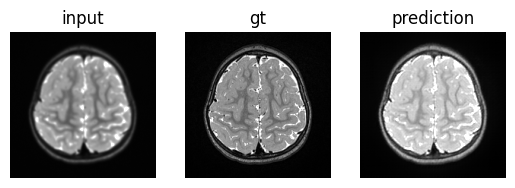

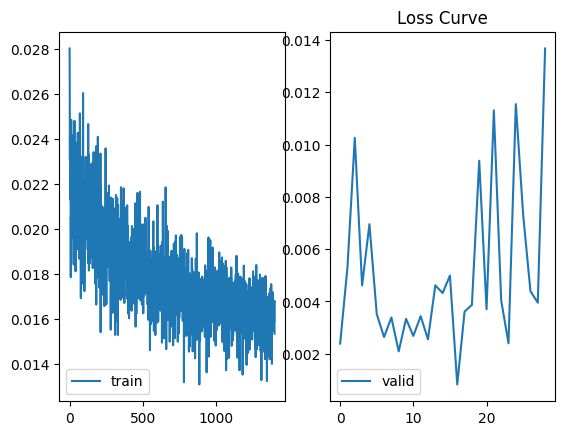

20it [00:01, 10.06it/s]


Epoch 1402, Loss: 0.016943619260564445


20it [00:01, 10.29it/s]


Epoch 1403, Loss: 0.016716848104260863


20it [00:01, 10.07it/s]


Epoch 1404, Loss: 0.016733679384924472


20it [00:01, 10.22it/s]


Epoch 1405, Loss: 0.017806452582590282


20it [00:01, 10.42it/s]


Epoch 1406, Loss: 0.01564779339823872


20it [00:01, 10.15it/s]


Epoch 1407, Loss: 0.017765660770237446


20it [00:02,  9.96it/s]


Epoch 1408, Loss: 0.017444277531467378


20it [00:01, 10.30it/s]


Epoch 1409, Loss: 0.016119742719456553


20it [00:01, 10.09it/s]


Epoch 1410, Loss: 0.01349825863726437


20it [00:01, 10.20it/s]


Epoch 1411, Loss: 0.015584759053308517


20it [00:02,  9.47it/s]


Epoch 1412, Loss: 0.017810277873650193


20it [00:01, 10.18it/s]


Epoch 1413, Loss: 0.015995027427561582


20it [00:02,  9.93it/s]


Epoch 1414, Loss: 0.016351907327771188


20it [00:01, 10.19it/s]


Epoch 1415, Loss: 0.01626966685289517


20it [00:02,  9.91it/s]


Epoch 1416, Loss: 0.015112342010252178


20it [00:01, 10.18it/s]


Epoch 1417, Loss: 0.014631761680357158


20it [00:01, 10.21it/s]


Epoch 1418, Loss: 0.01694856593385339


20it [00:01, 10.06it/s]


Epoch 1419, Loss: 0.01637549480656162


20it [00:01, 10.14it/s]


Epoch 1420, Loss: 0.01811545086093247


20it [00:02,  9.85it/s]


Epoch 1421, Loss: 0.01711065333802253


20it [00:01, 10.13it/s]


Epoch 1422, Loss: 0.01687975637614727


20it [00:02,  9.50it/s]


Epoch 1423, Loss: 0.018059002480003982


20it [00:01, 10.45it/s]


Epoch 1424, Loss: 0.017684131232090294


20it [00:01, 10.44it/s]


Epoch 1425, Loss: 0.01673263547709212


20it [00:02,  9.90it/s]


Epoch 1426, Loss: 0.013929100043606013


20it [00:01, 10.30it/s]


Epoch 1427, Loss: 0.015773462876677514


20it [00:01, 10.21it/s]


Epoch 1428, Loss: 0.01452995224390179


20it [00:01, 10.43it/s]


Epoch 1429, Loss: 0.015185895492322743


20it [00:01, 10.29it/s]


Epoch 1430, Loss: 0.017462854646146296


20it [00:02,  9.98it/s]


Epoch 1431, Loss: 0.016232722834683955


20it [00:02,  9.94it/s]


Epoch 1432, Loss: 0.01697388181928545


20it [00:02,  9.67it/s]


Epoch 1433, Loss: 0.015130861662328243


20it [00:01, 10.34it/s]


Epoch 1434, Loss: 0.015558666340075434


20it [00:01, 10.11it/s]


Epoch 1435, Loss: 0.015504147741012275


20it [00:01, 10.40it/s]


Epoch 1436, Loss: 0.0158693042001687


20it [00:01, 10.23it/s]


Epoch 1437, Loss: 0.015460293344222008


20it [00:02,  9.95it/s]


Epoch 1438, Loss: 0.016189253842458128


20it [00:02,  9.88it/s]


Epoch 1439, Loss: 0.01413307103794068


20it [00:02,  9.87it/s]


Epoch 1440, Loss: 0.016986181051470338


20it [00:01, 10.40it/s]


Epoch 1441, Loss: 0.01594671718776226


20it [00:02,  9.69it/s]


Epoch 1442, Loss: 0.01563831530511379


20it [00:02,  9.82it/s]


Epoch 1443, Loss: 0.016933212918229402


20it [00:02,  9.66it/s]


Epoch 1444, Loss: 0.014146055071614682


20it [00:02,  9.89it/s]


Epoch 1445, Loss: 0.01639274803455919


20it [00:01, 10.07it/s]


Epoch 1446, Loss: 0.015101976308505983


20it [00:01, 10.05it/s]


Epoch 1447, Loss: 0.01630174135789275


20it [00:02, 10.00it/s]


Epoch 1448, Loss: 0.01603953125886619


20it [00:01, 10.14it/s]


Epoch 1449, Loss: 0.01626448000315577


20it [00:01, 10.01it/s]


Epoch 1450, Loss: 0.015428324707318097


20it [00:01, 10.10it/s]

Epoch 1451, Loss: 0.016512388247065246



4it [00:00, 10.00it/s]


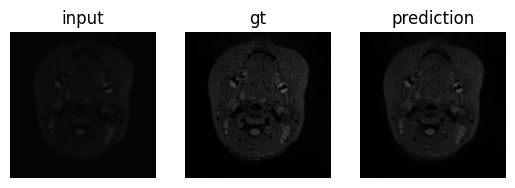

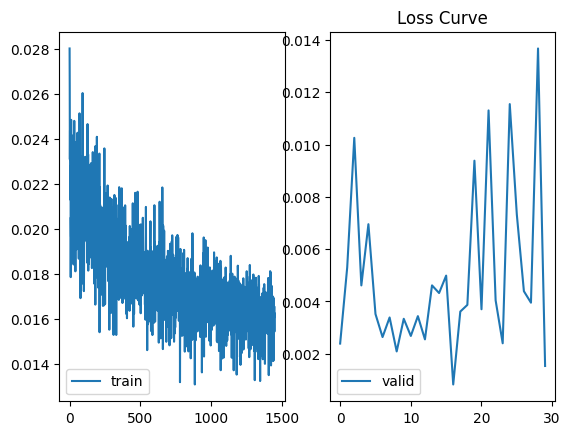

20it [00:01, 10.06it/s]


Epoch 1452, Loss: 0.017196091706864536


20it [00:02,  9.52it/s]


Epoch 1453, Loss: 0.015983633464202285


20it [00:01, 10.21it/s]


Epoch 1454, Loss: 0.015573530038818718


20it [00:01, 10.12it/s]


Epoch 1455, Loss: 0.0161779728718102


20it [00:01, 10.58it/s]


Epoch 1456, Loss: 0.015434275544248522


20it [00:02,  9.86it/s]


Epoch 1457, Loss: 0.016936012310907245


20it [00:02,  9.99it/s]


Epoch 1458, Loss: 0.014731959532946348


20it [00:01, 10.25it/s]


Epoch 1459, Loss: 0.014813637337647378


20it [00:02,  9.93it/s]


Epoch 1460, Loss: 0.018294964637607335


20it [00:01, 10.36it/s]


Epoch 1461, Loss: 0.01775012176949531


20it [00:01, 10.34it/s]


Epoch 1462, Loss: 0.019755295012146235


20it [00:01, 10.00it/s]


Epoch 1463, Loss: 0.018105446733534335


20it [00:02,  9.65it/s]


Epoch 1464, Loss: 0.016326944087632002


20it [00:02,  9.85it/s]


Epoch 1465, Loss: 0.01738856693264097


20it [00:01, 10.18it/s]


Epoch 1466, Loss: 0.014085622015409171


20it [00:01, 10.37it/s]


Epoch 1467, Loss: 0.015386220021173357


20it [00:01, 10.05it/s]


Epoch 1468, Loss: 0.016138474037870765


20it [00:01, 10.16it/s]


Epoch 1469, Loss: 0.01551220789551735


20it [00:02,  9.81it/s]


Epoch 1470, Loss: 0.014846078678965568


20it [00:01, 10.19it/s]


Epoch 1471, Loss: 0.016386011661961675


20it [00:01, 10.04it/s]


Epoch 1472, Loss: 0.014669589709956198


20it [00:02,  9.99it/s]


Epoch 1473, Loss: 0.016033662087284028


20it [00:01, 10.27it/s]


Epoch 1474, Loss: 0.014172497601248325


20it [00:02,  9.39it/s]


Epoch 1475, Loss: 0.01600910669658333


20it [00:01, 10.02it/s]


Epoch 1476, Loss: 0.017188859055750072


20it [00:01, 10.42it/s]


Epoch 1477, Loss: 0.01549790392164141


20it [00:01, 10.06it/s]


Epoch 1478, Loss: 0.017374817561358214


20it [00:01, 10.24it/s]


Epoch 1479, Loss: 0.017024090327322484


20it [00:02,  9.77it/s]


Epoch 1480, Loss: 0.015196082729380578


20it [00:02,  9.85it/s]


Epoch 1481, Loss: 0.016647068248130382


20it [00:01, 10.15it/s]


Epoch 1482, Loss: 0.015496858430560678


20it [00:02,  9.71it/s]


Epoch 1483, Loss: 0.01466840720968321


20it [00:01, 10.04it/s]


Epoch 1484, Loss: 0.017063460778445005


20it [00:01, 10.13it/s]


Epoch 1485, Loss: 0.015079733286984264


20it [00:02,  9.30it/s]


Epoch 1486, Loss: 0.016522900317795575


20it [00:01, 10.19it/s]


Epoch 1487, Loss: 0.017252886760979892


20it [00:01, 10.04it/s]


Epoch 1488, Loss: 0.01675909652840346


20it [00:02,  9.91it/s]


Epoch 1489, Loss: 0.015092001296579838


20it [00:01, 10.42it/s]


Epoch 1490, Loss: 0.01573274510446936


20it [00:02,  9.99it/s]


Epoch 1491, Loss: 0.015159170085098594


20it [00:01, 10.47it/s]


Epoch 1492, Loss: 0.015933542675338686


20it [00:01, 10.04it/s]


Epoch 1493, Loss: 0.01569755175150931


20it [00:02,  9.88it/s]


Epoch 1494, Loss: 0.015647638193331658


20it [00:01, 10.09it/s]


Epoch 1495, Loss: 0.01604943908751011


20it [00:02,  9.87it/s]


Epoch 1496, Loss: 0.01613017829367891


20it [00:01, 10.14it/s]


Epoch 1497, Loss: 0.016077019297517835


20it [00:01, 10.18it/s]


Epoch 1498, Loss: 0.01619572623167187


20it [00:02,  9.70it/s]


Epoch 1499, Loss: 0.015563101321458817


20it [00:01, 10.26it/s]


Epoch 1500, Loss: 0.0161370559129864


20it [00:01, 10.49it/s]

Epoch 1501, Loss: 0.01702143212314695



4it [00:00,  9.37it/s]


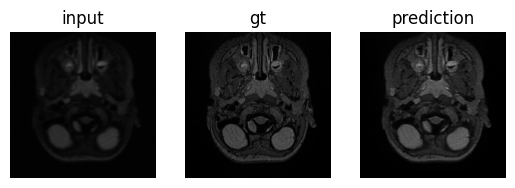

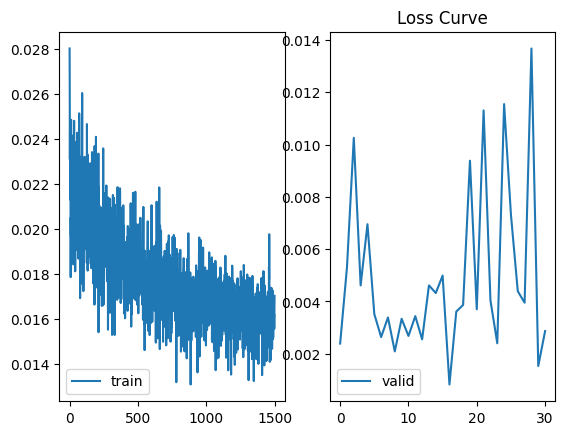

20it [00:01, 10.18it/s]


Epoch 1502, Loss: 0.01696131411008537


20it [00:02,  9.89it/s]


Epoch 1503, Loss: 0.015460639586672187


20it [00:02,  9.96it/s]


Epoch 1504, Loss: 0.01714153019711375


20it [00:02,  9.21it/s]


Epoch 1505, Loss: 0.015684112324379385


20it [00:02,  9.80it/s]


Epoch 1506, Loss: 0.01646331560332328


20it [00:01, 10.43it/s]


Epoch 1507, Loss: 0.015871955524198712


20it [00:02,  9.73it/s]


Epoch 1508, Loss: 0.01706202534260228


20it [00:01, 10.13it/s]


Epoch 1509, Loss: 0.015798235894180834


20it [00:01, 10.15it/s]


Epoch 1510, Loss: 0.016629703738726676


20it [00:01, 10.12it/s]


Epoch 1511, Loss: 0.015861143916845323


20it [00:01, 10.51it/s]


Epoch 1512, Loss: 0.017714202450588346


20it [00:01, 10.42it/s]


Epoch 1513, Loss: 0.016579096333589404


20it [00:02,  9.93it/s]


Epoch 1514, Loss: 0.01580203070770949


20it [00:02,  9.97it/s]


Epoch 1515, Loss: 0.016069469694048166


20it [00:02,  9.79it/s]


Epoch 1516, Loss: 0.015209650853648782


20it [00:02,  9.90it/s]


Epoch 1517, Loss: 0.014797820802778005


20it [00:01, 10.39it/s]


Epoch 1518, Loss: 0.01648421068675816


20it [00:01, 10.12it/s]


Epoch 1519, Loss: 0.016236222954466938


20it [00:02,  9.66it/s]


Epoch 1520, Loss: 0.015274514211341739


20it [00:01, 10.20it/s]


Epoch 1521, Loss: 0.01664761200081557


20it [00:01, 10.21it/s]


Epoch 1522, Loss: 0.016645561251789332


20it [00:02,  9.94it/s]


Epoch 1523, Loss: 0.01686643287539482


20it [00:02,  9.89it/s]


Epoch 1524, Loss: 0.016776583157479763


20it [00:02,  9.87it/s]


Epoch 1525, Loss: 0.015420426079072059


20it [00:02,  9.56it/s]


Epoch 1526, Loss: 0.014681849023327231


20it [00:02,  9.93it/s]


Epoch 1527, Loss: 0.016538117732852697


20it [00:01, 10.10it/s]


Epoch 1528, Loss: 0.01468723292928189


20it [00:01, 10.33it/s]


Epoch 1529, Loss: 0.016425894654821603


20it [00:02,  9.83it/s]


Epoch 1530, Loss: 0.015993897477164863


20it [00:01, 10.16it/s]


Epoch 1531, Loss: 0.017226219014264642


20it [00:01, 10.33it/s]


Epoch 1532, Loss: 0.016007194155827166


20it [00:01, 10.16it/s]


Epoch 1533, Loss: 0.015441459324210881


20it [00:01, 10.28it/s]


Epoch 1534, Loss: 0.016507935582194478


20it [00:01, 10.28it/s]


Epoch 1535, Loss: 0.014592241402715445


20it [00:02,  9.97it/s]


Epoch 1536, Loss: 0.01636141208000481


20it [00:02,  9.67it/s]


Epoch 1537, Loss: 0.016374633135274052


20it [00:01, 10.15it/s]


Epoch 1538, Loss: 0.016829368518665434


20it [00:01, 10.32it/s]


Epoch 1539, Loss: 0.015899075265042483


20it [00:02, 10.00it/s]


Epoch 1540, Loss: 0.018442566506564617


20it [00:01, 10.11it/s]


Epoch 1541, Loss: 0.018801605561748147


20it [00:01, 10.14it/s]


Epoch 1542, Loss: 0.01823395830579102


20it [00:02,  9.96it/s]


Epoch 1543, Loss: 0.015913403092417865


20it [00:02,  9.69it/s]


Epoch 1544, Loss: 0.01629312583245337


20it [00:02,  9.89it/s]


Epoch 1545, Loss: 0.01703829844482243


20it [00:02,  9.92it/s]


Epoch 1546, Loss: 0.01624805023893714


20it [00:02,  9.62it/s]


Epoch 1547, Loss: 0.01776305162347853


20it [00:01, 10.07it/s]


Epoch 1548, Loss: 0.014939110213890671


20it [00:01, 10.14it/s]


Epoch 1549, Loss: 0.01790137472562492


20it [00:01, 10.13it/s]


Epoch 1550, Loss: 0.016449605138041078


20it [00:02,  9.84it/s]

Epoch 1551, Loss: 0.014803384756669402



4it [00:00, 10.26it/s]


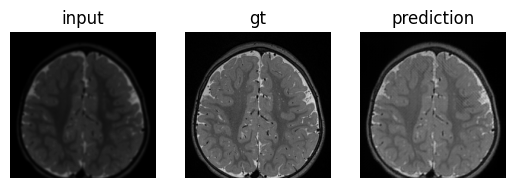

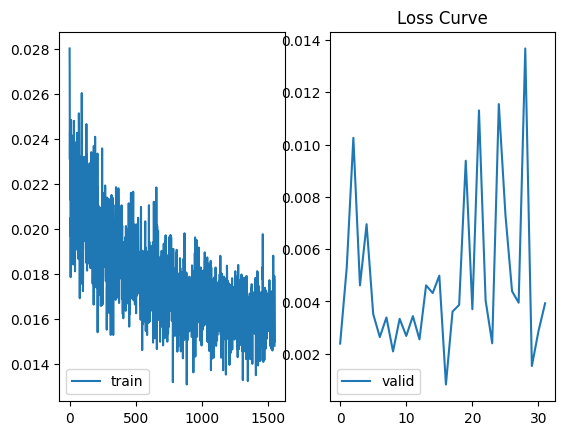

20it [00:01, 10.15it/s]


Epoch 1552, Loss: 0.016335869440808892


20it [00:01, 10.12it/s]


Epoch 1553, Loss: 0.01524680289439857


20it [00:02,  9.90it/s]


Epoch 1554, Loss: 0.0191231036093086


20it [00:01, 10.13it/s]


Epoch 1555, Loss: 0.01770616783760488


20it [00:02,  9.16it/s]


Epoch 1556, Loss: 0.016546519193798303


20it [00:01, 10.04it/s]


Epoch 1557, Loss: 0.01579764687921852


20it [00:02,  9.83it/s]


Epoch 1558, Loss: 0.016368233459070326


20it [00:01, 10.23it/s]


Epoch 1559, Loss: 0.016378942283336074


20it [00:02,  9.97it/s]


Epoch 1560, Loss: 0.018210625788196922


20it [00:01, 10.19it/s]


Epoch 1561, Loss: 0.01677409393014386


20it [00:01, 10.04it/s]


Epoch 1562, Loss: 0.015636872942559422


20it [00:01, 10.05it/s]


Epoch 1563, Loss: 0.014053995069116355


20it [00:02,  9.88it/s]


Epoch 1564, Loss: 0.016331318160519005


20it [00:01, 10.01it/s]


Epoch 1565, Loss: 0.015358381380792707


20it [00:02,  9.93it/s]


Epoch 1566, Loss: 0.016743052401579916


20it [00:02,  9.70it/s]


Epoch 1567, Loss: 0.015975844231434166


20it [00:02,  9.79it/s]


Epoch 1568, Loss: 0.01718301137443632


20it [00:01, 10.03it/s]


Epoch 1569, Loss: 0.018455559900030494


20it [00:01, 10.24it/s]


Epoch 1570, Loss: 0.016343239694833755


20it [00:01, 10.05it/s]


Epoch 1571, Loss: 0.015658799512311816


20it [00:01, 10.30it/s]


Epoch 1572, Loss: 0.01715422810520977


20it [00:01, 10.44it/s]


Epoch 1573, Loss: 0.015564792894292623


20it [00:01, 10.24it/s]


Epoch 1574, Loss: 0.015826917765662075


20it [00:01, 10.41it/s]


Epoch 1575, Loss: 0.016078001528512686


20it [00:01, 10.19it/s]


Epoch 1576, Loss: 0.015686861402355135


20it [00:01, 10.22it/s]


Epoch 1577, Loss: 0.01773274689912796


20it [00:02,  9.54it/s]


Epoch 1578, Loss: 0.014560768473893404


20it [00:02,  9.91it/s]


Epoch 1579, Loss: 0.014975168486125767


20it [00:01, 10.09it/s]


Epoch 1580, Loss: 0.01671424494124949


20it [00:02,  9.99it/s]


Epoch 1581, Loss: 0.015260060154832899


20it [00:02,  9.96it/s]


Epoch 1582, Loss: 0.01695738483686


20it [00:02,  9.99it/s]


Epoch 1583, Loss: 0.014429458091035486


20it [00:02,  9.94it/s]


Epoch 1584, Loss: 0.015458896965719759


20it [00:02,  9.93it/s]


Epoch 1585, Loss: 0.014898920734412967


20it [00:01, 10.17it/s]


Epoch 1586, Loss: 0.016464284854009748


20it [00:02,  9.93it/s]


Epoch 1587, Loss: 0.0156666390132159


20it [00:02,  9.50it/s]


Epoch 1588, Loss: 0.01629269332624972


20it [00:01, 10.06it/s]


Epoch 1589, Loss: 0.014074709150008857


20it [00:01, 10.23it/s]


Epoch 1590, Loss: 0.016069964249618353


20it [00:01, 10.10it/s]


Epoch 1591, Loss: 0.01644842161331326


20it [00:02,  9.80it/s]


Epoch 1592, Loss: 0.015164131368510424


20it [00:01, 10.13it/s]


Epoch 1593, Loss: 0.014189302653539926


20it [00:01, 10.42it/s]


Epoch 1594, Loss: 0.015922181284986438


20it [00:02,  9.92it/s]


Epoch 1595, Loss: 0.016040481673553587


20it [00:01, 10.31it/s]


Epoch 1596, Loss: 0.01691418425180018


20it [00:01, 10.36it/s]


Epoch 1597, Loss: 0.016506415815092622


20it [00:02,  9.61it/s]


Epoch 1598, Loss: 0.016537520894780756


20it [00:01, 10.25it/s]


Epoch 1599, Loss: 0.016782273049466313


20it [00:01, 10.07it/s]


Epoch 1600, Loss: 0.01508411110844463


20it [00:01, 10.09it/s]

Epoch 1601, Loss: 0.014967608917504548



4it [00:00, 10.01it/s]


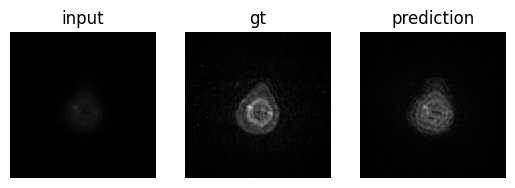

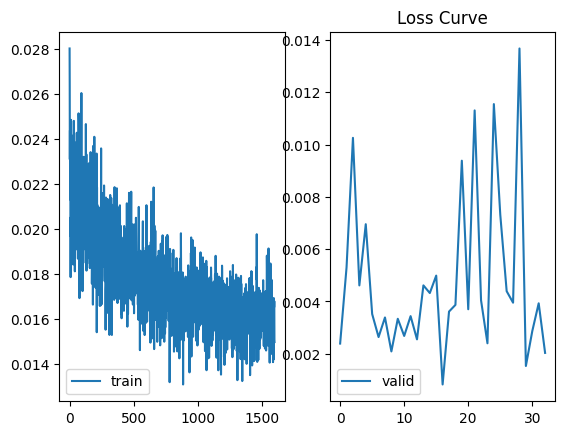

20it [00:02,  9.98it/s]


Epoch 1602, Loss: 0.01457551191560924


20it [00:02,  9.74it/s]


Epoch 1603, Loss: 0.017467182502150534


20it [00:02,  9.97it/s]


Epoch 1604, Loss: 0.015585743263363839


20it [00:01, 10.20it/s]


Epoch 1605, Loss: 0.014779639570042491


20it [00:02,  9.99it/s]


Epoch 1606, Loss: 0.017035039188340307


20it [00:02,  9.76it/s]


Epoch 1607, Loss: 0.014872184628620744


20it [00:02,  9.65it/s]


Epoch 1608, Loss: 0.016607145755551757


20it [00:01, 10.15it/s]


Epoch 1609, Loss: 0.016141281626187266


20it [00:01, 10.25it/s]


Epoch 1610, Loss: 0.01459504123777151


20it [00:01, 10.34it/s]


Epoch 1611, Loss: 0.016075031994841994


20it [00:02,  9.89it/s]


Epoch 1612, Loss: 0.017106595227960496


20it [00:01, 10.28it/s]


Epoch 1613, Loss: 0.016954847262240946


20it [00:01, 10.16it/s]


Epoch 1614, Loss: 0.01654720848891884


20it [00:01, 10.09it/s]


Epoch 1615, Loss: 0.015104840835556388


20it [00:01, 10.24it/s]


Epoch 1616, Loss: 0.015375878196209669


20it [00:01, 10.58it/s]


Epoch 1617, Loss: 0.015304493787698447


20it [00:02,  9.73it/s]


Epoch 1618, Loss: 0.016210090101230888


20it [00:01, 10.40it/s]


Epoch 1619, Loss: 0.01630560935009271


20it [00:01, 10.08it/s]


Epoch 1620, Loss: 0.016355501813814045


20it [00:01, 10.18it/s]


Epoch 1621, Loss: 0.015301689191255718


20it [00:01, 10.04it/s]


Epoch 1622, Loss: 0.016060286713764072


20it [00:02,  9.83it/s]


Epoch 1623, Loss: 0.01585177071392536


20it [00:01, 10.82it/s]


Epoch 1624, Loss: 0.01655200788518414


20it [00:01, 10.37it/s]


Epoch 1625, Loss: 0.015751584304962308


20it [00:01, 10.15it/s]


Epoch 1626, Loss: 0.015832459973171353


20it [00:01, 10.62it/s]


Epoch 1627, Loss: 0.01678338774945587


20it [00:01, 10.08it/s]


Epoch 1628, Loss: 0.016833207593299447


20it [00:02,  9.49it/s]


Epoch 1629, Loss: 0.01626466759480536


20it [00:01, 10.20it/s]


Epoch 1630, Loss: 0.015162822022102774


20it [00:01, 10.02it/s]


Epoch 1631, Loss: 0.016399708623066545


20it [00:01, 10.01it/s]


Epoch 1632, Loss: 0.015217170619871467


20it [00:01, 10.32it/s]


Epoch 1633, Loss: 0.01523917899467051


20it [00:02,  9.80it/s]


Epoch 1634, Loss: 0.014627120201475918


20it [00:01, 10.30it/s]


Epoch 1635, Loss: 0.012951920763589442


20it [00:01, 10.21it/s]


Epoch 1636, Loss: 0.014832815050613134


20it [00:02,  9.86it/s]


Epoch 1637, Loss: 0.016560550918802618


20it [00:02,  9.95it/s]


Epoch 1638, Loss: 0.017016811389476062


20it [00:02,  9.51it/s]


Epoch 1639, Loss: 0.014839106146246195


20it [00:01, 10.26it/s]


Epoch 1640, Loss: 0.015107644931413233


20it [00:01, 10.16it/s]


Epoch 1641, Loss: 0.016758091328665615


20it [00:01, 10.13it/s]


Epoch 1642, Loss: 0.01663434735964984


20it [00:02,  9.72it/s]


Epoch 1643, Loss: 0.014698130369652063


20it [00:01, 10.14it/s]


Epoch 1644, Loss: 0.016970248590223492


20it [00:02,  9.78it/s]


Epoch 1645, Loss: 0.015127371996641159


20it [00:01, 10.20it/s]


Epoch 1646, Loss: 0.013808191544376314


20it [00:01, 10.26it/s]


Epoch 1647, Loss: 0.015520797041244806


20it [00:01, 10.34it/s]


Epoch 1648, Loss: 0.01669844740536064


20it [00:01, 10.16it/s]


Epoch 1649, Loss: 0.015495040663518011


20it [00:02,  9.43it/s]


Epoch 1650, Loss: 0.015977526898495853


20it [00:01, 10.16it/s]

Epoch 1651, Loss: 0.016573072876781225



4it [00:00, 10.13it/s]


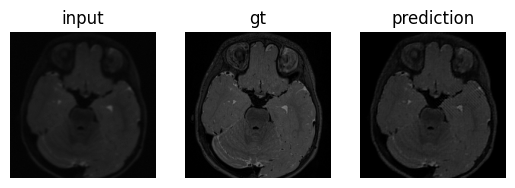

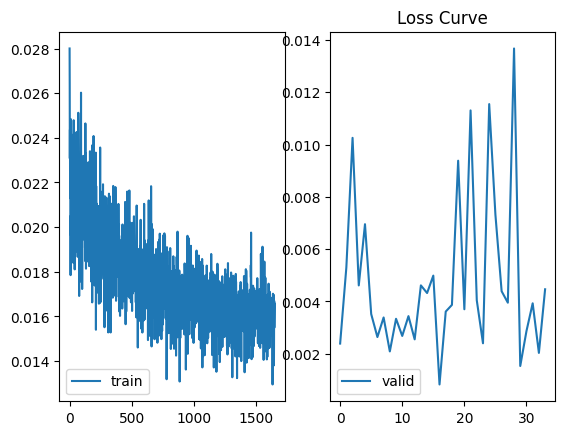

20it [00:01, 10.32it/s]


Epoch 1652, Loss: 0.01444815460126847


20it [00:01, 10.04it/s]


Epoch 1653, Loss: 0.014724341873079538


20it [00:01, 10.13it/s]


Epoch 1654, Loss: 0.015090954466722905


20it [00:02,  9.92it/s]


Epoch 1655, Loss: 0.01632384171243757


20it [00:01, 10.32it/s]


Epoch 1656, Loss: 0.015466798818670214


20it [00:02,  9.92it/s]


Epoch 1657, Loss: 0.015301750297658146


20it [00:02,  9.50it/s]


Epoch 1658, Loss: 0.015503123437520116


20it [00:02,  9.32it/s]


Epoch 1659, Loss: 0.014069476746954024


20it [00:02,  9.85it/s]


Epoch 1660, Loss: 0.015918852807953954


20it [00:01, 10.15it/s]


Epoch 1661, Loss: 0.017554885149002074


20it [00:02,  9.94it/s]


Epoch 1662, Loss: 0.015470322966575623


20it [00:01, 10.27it/s]


Epoch 1663, Loss: 0.015976027958095072


20it [00:01, 10.37it/s]


Epoch 1664, Loss: 0.014025874098297208


20it [00:01, 10.09it/s]


Epoch 1665, Loss: 0.015833241888321935


20it [00:01, 10.18it/s]


Epoch 1666, Loss: 0.015273512480780483


20it [00:01, 10.25it/s]


Epoch 1667, Loss: 0.016221547918394207


20it [00:01, 10.09it/s]


Epoch 1668, Loss: 0.01587062281323597


20it [00:01, 10.27it/s]


Epoch 1669, Loss: 0.015821101889014245


20it [00:02,  9.41it/s]


Epoch 1670, Loss: 0.014572771964594722


20it [00:01, 10.63it/s]


Epoch 1671, Loss: 0.014547669584862888


20it [00:02,  9.88it/s]


Epoch 1672, Loss: 0.016694667050614953


20it [00:01, 10.15it/s]


Epoch 1673, Loss: 0.013929658173583447


20it [00:02,  9.93it/s]


Epoch 1674, Loss: 0.015684746927581726


20it [00:02,  9.94it/s]


Epoch 1675, Loss: 0.0174781022593379


20it [00:02,  9.66it/s]


Epoch 1676, Loss: 0.013969327660743148


20it [00:01, 10.40it/s]


Epoch 1677, Loss: 0.016549473884515463


20it [00:01, 10.07it/s]


Epoch 1678, Loss: 0.015489781182259322


20it [00:02,  9.77it/s]


Epoch 1679, Loss: 0.015059864474460482


20it [00:01, 10.18it/s]


Epoch 1680, Loss: 0.016316181141883136


20it [00:02,  9.78it/s]


Epoch 1681, Loss: 0.017476001707836985


20it [00:01, 10.10it/s]


Epoch 1682, Loss: 0.015799237799365075


20it [00:01, 10.26it/s]


Epoch 1683, Loss: 0.014940205472521484


20it [00:01, 10.36it/s]


Epoch 1684, Loss: 0.016591740399599077


20it [00:01, 10.08it/s]


Epoch 1685, Loss: 0.015239721117541193


20it [00:01, 10.37it/s]


Epoch 1686, Loss: 0.01370222056284547


20it [00:01, 10.23it/s]


Epoch 1687, Loss: 0.015507989085745067


20it [00:01, 10.29it/s]


Epoch 1688, Loss: 0.015982970828190446


20it [00:02,  9.88it/s]


Epoch 1689, Loss: 0.01588615314103663


20it [00:02,  9.66it/s]


Epoch 1690, Loss: 0.015414020593743772


20it [00:01, 10.34it/s]


Epoch 1691, Loss: 0.017219162988476457


20it [00:02,  9.96it/s]


Epoch 1692, Loss: 0.01519115490373224


20it [00:02,  9.84it/s]


Epoch 1693, Loss: 0.01670345345046371


20it [00:01, 10.09it/s]


Epoch 1694, Loss: 0.01565612363629043


20it [00:01, 10.11it/s]


Epoch 1695, Loss: 0.01568911550566554


20it [00:01, 10.30it/s]


Epoch 1696, Loss: 0.015377091721165925


20it [00:01, 10.02it/s]


Epoch 1697, Loss: 0.014835406769998371


20it [00:01, 10.02it/s]


Epoch 1698, Loss: 0.015413306804839521


20it [00:01, 10.30it/s]


Epoch 1699, Loss: 0.016392554435878993


20it [00:02,  9.72it/s]


Epoch 1700, Loss: 0.014539474342018365


20it [00:01, 10.19it/s]

Epoch 1701, Loss: 0.016483641089871527



4it [00:00, 10.77it/s]


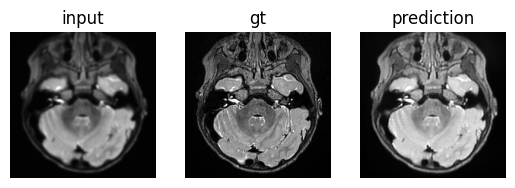

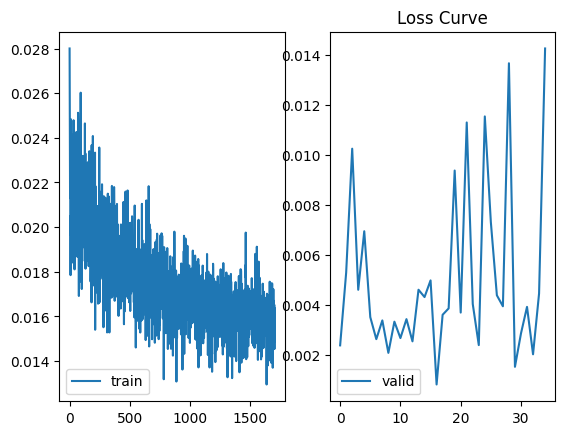

20it [00:01, 10.40it/s]


Epoch 1702, Loss: 0.016667955461889504


20it [00:01, 10.41it/s]


Epoch 1703, Loss: 0.015317235363181681


20it [00:01, 10.02it/s]


Epoch 1704, Loss: 0.014875461568590254


20it [00:01, 10.14it/s]


Epoch 1705, Loss: 0.017242749291472136


20it [00:01, 10.29it/s]


Epoch 1706, Loss: 0.013296288577839733


20it [00:01, 10.20it/s]


Epoch 1707, Loss: 0.0173145659849979


20it [00:01, 10.08it/s]


Epoch 1708, Loss: 0.015725907729938628


20it [00:02,  9.41it/s]


Epoch 1709, Loss: 0.01569396210834384


20it [00:01, 10.14it/s]


Epoch 1710, Loss: 0.01476688664406538


20it [00:02,  9.73it/s]


Epoch 1711, Loss: 0.01608749895822257


20it [00:02,  9.95it/s]


Epoch 1712, Loss: 0.015467488160356879


20it [00:02,  9.87it/s]


Epoch 1713, Loss: 0.015663415705785156


20it [00:02,  9.90it/s]


Epoch 1714, Loss: 0.016421143105253576


20it [00:01, 10.12it/s]


Epoch 1715, Loss: 0.015050826943479478


20it [00:02,  9.90it/s]


Epoch 1716, Loss: 0.014448540366720409


20it [00:01, 10.47it/s]


Epoch 1717, Loss: 0.013738469383679331


20it [00:01, 10.00it/s]


Epoch 1718, Loss: 0.016282029123976825


20it [00:01, 10.14it/s]


Epoch 1719, Loss: 0.015439817821606994


20it [00:02,  9.88it/s]


Epoch 1720, Loss: 0.016916886484250427


20it [00:02,  9.99it/s]


Epoch 1721, Loss: 0.016356140933930875


20it [00:01, 10.14it/s]


Epoch 1722, Loss: 0.015118481777608394


20it [00:01, 10.35it/s]


Epoch 1723, Loss: 0.014611792424693704


20it [00:01, 10.06it/s]


Epoch 1724, Loss: 0.015935675520449877


20it [00:01, 10.04it/s]


Epoch 1725, Loss: 0.016075842082500458


20it [00:02,  9.97it/s]


Epoch 1726, Loss: 0.017599027277901767


20it [00:02,  9.78it/s]


Epoch 1727, Loss: 0.016244872473180294


20it [00:02,  9.75it/s]


Epoch 1728, Loss: 0.017750299768522382


20it [00:01, 10.13it/s]


Epoch 1729, Loss: 0.015380790969356895


20it [00:02,  9.72it/s]


Epoch 1730, Loss: 0.014955973369069397


20it [00:02,  9.80it/s]


Epoch 1731, Loss: 0.0160478173289448


20it [00:01, 10.17it/s]


Epoch 1732, Loss: 0.014858424931298941


20it [00:02, 10.00it/s]


Epoch 1733, Loss: 0.014403748605400325


20it [00:01, 10.23it/s]


Epoch 1734, Loss: 0.014271961059421301


20it [00:02,  9.49it/s]


Epoch 1735, Loss: 0.016503624827601017


20it [00:02,  9.84it/s]


Epoch 1736, Loss: 0.01653909576125443


20it [00:02,  9.80it/s]


Epoch 1737, Loss: 0.01428869490046054


20it [00:01, 10.07it/s]


Epoch 1738, Loss: 0.013782916939817369


20it [00:01, 10.09it/s]


Epoch 1739, Loss: 0.016148228966630995


20it [00:01, 10.31it/s]


Epoch 1740, Loss: 0.016972257103770972


20it [00:02,  9.33it/s]


Epoch 1741, Loss: 0.01511176439234987


20it [00:01, 10.21it/s]


Epoch 1742, Loss: 0.016953417542390527


20it [00:02,  9.99it/s]


Epoch 1743, Loss: 0.017092094151303173


20it [00:01, 10.22it/s]


Epoch 1744, Loss: 0.017303408402949572


20it [00:01, 10.21it/s]


Epoch 1745, Loss: 0.015940150897949933


20it [00:02,  9.77it/s]


Epoch 1746, Loss: 0.01608285033144057


20it [00:01, 10.01it/s]


Epoch 1747, Loss: 0.01673669214360416


20it [00:02,  9.95it/s]


Epoch 1748, Loss: 0.015315974352415652


20it [00:01, 10.23it/s]


Epoch 1749, Loss: 0.016436293139122427


20it [00:02,  9.97it/s]


Epoch 1750, Loss: 0.016784248361364006


20it [00:01, 10.39it/s]

Epoch 1751, Loss: 0.014578498853370547



4it [00:00,  5.56it/s]


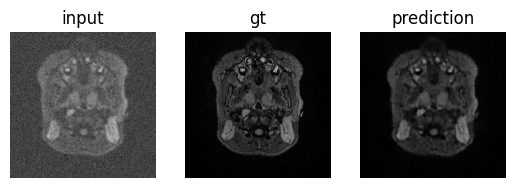

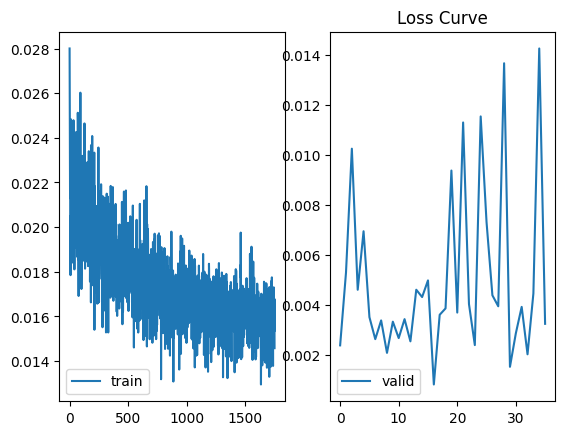

20it [00:01, 10.22it/s]


Epoch 1752, Loss: 0.01706219466868788


20it [00:01, 10.36it/s]


Epoch 1753, Loss: 0.015998695383314044


20it [00:01, 10.93it/s]


Epoch 1754, Loss: 0.01672348752617836


20it [00:01, 10.10it/s]


Epoch 1755, Loss: 0.01609724326990545


20it [00:02,  9.97it/s]


Epoch 1756, Loss: 0.014565491362009197


20it [00:02,  9.80it/s]


Epoch 1757, Loss: 0.016456006839871407


20it [00:01, 10.19it/s]


Epoch 1758, Loss: 0.01514416744466871


20it [00:01, 10.18it/s]


Epoch 1759, Loss: 0.0156867807963863


20it [00:01, 10.15it/s]


Epoch 1760, Loss: 0.014466526871547102


20it [00:02,  9.56it/s]


Epoch 1761, Loss: 0.01715616350993514


20it [00:02,  9.95it/s]


Epoch 1762, Loss: 0.016561312647536398


20it [00:01, 10.37it/s]


Epoch 1763, Loss: 0.017325789760798217


20it [00:01, 10.49it/s]


Epoch 1764, Loss: 0.015964970481581985


20it [00:01, 10.03it/s]


Epoch 1765, Loss: 0.016134610725566746


20it [00:02,  9.96it/s]


Epoch 1766, Loss: 0.01541461325250566


20it [00:01, 10.07it/s]


Epoch 1767, Loss: 0.017106711445376278


20it [00:01, 10.01it/s]


Epoch 1768, Loss: 0.016181897721253335


20it [00:02,  9.90it/s]


Epoch 1769, Loss: 0.017050351772923023


20it [00:01, 10.06it/s]


Epoch 1770, Loss: 0.0160011155763641


20it [00:02,  9.85it/s]


Epoch 1771, Loss: 0.016102211480028928


20it [00:02,  9.60it/s]


Epoch 1772, Loss: 0.01717504342086613


20it [00:01, 10.20it/s]


Epoch 1773, Loss: 0.015817913180217146


20it [00:01, 10.48it/s]


Epoch 1774, Loss: 0.01557785903569311


20it [00:01, 10.40it/s]


Epoch 1775, Loss: 0.015419042529538273


20it [00:02,  9.90it/s]


Epoch 1776, Loss: 0.015558006637729705


20it [00:01, 10.12it/s]


Epoch 1777, Loss: 0.015535331889986992


20it [00:01, 10.51it/s]


Epoch 1778, Loss: 0.014987436053343118


20it [00:01, 10.58it/s]


Epoch 1779, Loss: 0.01643740339204669


20it [00:01, 10.05it/s]


Epoch 1780, Loss: 0.017345660482533276


20it [00:01, 10.11it/s]


Epoch 1781, Loss: 0.016798389749601482


20it [00:01, 10.34it/s]


Epoch 1782, Loss: 0.015238731331191958


20it [00:02,  9.79it/s]


Epoch 1783, Loss: 0.015219676529522986


20it [00:01, 10.41it/s]


Epoch 1784, Loss: 0.017428299249149858


20it [00:02,  9.91it/s]


Epoch 1785, Loss: 0.014340700721368194


20it [00:01, 10.21it/s]


Epoch 1786, Loss: 0.015880150557495653


20it [00:02,  9.65it/s]


Epoch 1787, Loss: 0.013551406271290034


20it [00:02,  9.98it/s]


Epoch 1788, Loss: 0.015333232912234962


20it [00:01, 10.03it/s]


Epoch 1789, Loss: 0.014782432606443763


20it [00:02,  9.97it/s]


Epoch 1790, Loss: 0.016271543223410845


20it [00:01, 10.25it/s]


Epoch 1791, Loss: 0.016756915487349033


20it [00:01, 10.23it/s]


Epoch 1792, Loss: 0.014733812306076288


20it [00:02,  9.77it/s]


Epoch 1793, Loss: 0.014874712284654378


20it [00:02,  9.72it/s]


Epoch 1794, Loss: 0.015763546386733652


20it [00:01, 10.12it/s]


Epoch 1795, Loss: 0.01583351958543062


20it [00:01, 10.25it/s]


Epoch 1796, Loss: 0.013510630768723785


20it [00:01, 10.17it/s]


Epoch 1797, Loss: 0.014193189679645002


20it [00:01, 10.12it/s]


Epoch 1798, Loss: 0.015924387518316506


20it [00:01, 10.25it/s]


Epoch 1799, Loss: 0.013201593677513302


20it [00:01, 10.23it/s]


Epoch 1800, Loss: 0.015989429969340562


20it [00:01, 10.21it/s]

Epoch 1801, Loss: 0.0162459327140823



4it [00:00,  8.51it/s]


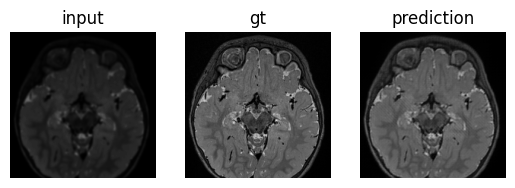

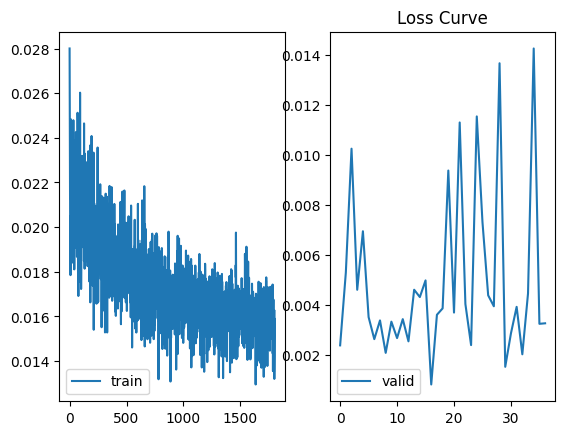

20it [00:01, 10.09it/s]


Epoch 1802, Loss: 0.015749853546731175


20it [00:02,  9.49it/s]


Epoch 1803, Loss: 0.015731786703690888


20it [00:01, 10.08it/s]


Epoch 1804, Loss: 0.01628266661427915


20it [00:01, 10.22it/s]


Epoch 1805, Loss: 0.013839491433463991


20it [00:02,  9.83it/s]


Epoch 1806, Loss: 0.015906964777968824


20it [00:01, 10.21it/s]


Epoch 1807, Loss: 0.016382641391828656


20it [00:01, 10.31it/s]


Epoch 1808, Loss: 0.012991247279569507


20it [00:01, 10.40it/s]


Epoch 1809, Loss: 0.016056008939631283


20it [00:01, 10.25it/s]


Epoch 1810, Loss: 0.015212841029278935


20it [00:01, 10.12it/s]


Epoch 1811, Loss: 0.016038570960517973


20it [00:01, 10.20it/s]


Epoch 1812, Loss: 0.015468631638213992


20it [00:02,  9.94it/s]


Epoch 1813, Loss: 0.017330687306821347


20it [00:02,  9.60it/s]


Epoch 1814, Loss: 0.01404955384787172


20it [00:02,  9.88it/s]


Epoch 1815, Loss: 0.015706110862083733


20it [00:01, 10.46it/s]


Epoch 1816, Loss: 0.013697752088773996


20it [00:01, 10.03it/s]


Epoch 1817, Loss: 0.014671671530231833


20it [00:01, 10.30it/s]


Epoch 1818, Loss: 0.014589274674654007


20it [00:01, 10.06it/s]


Epoch 1819, Loss: 0.015159489901270718


20it [00:01, 10.18it/s]


Epoch 1820, Loss: 0.01643813499249518


20it [00:01, 10.38it/s]


Epoch 1821, Loss: 0.015255122841335834


20it [00:01, 10.43it/s]


Epoch 1822, Loss: 0.015317424410022795


20it [00:02,  9.82it/s]


Epoch 1823, Loss: 0.015122505754698068


20it [00:02,  9.47it/s]


Epoch 1824, Loss: 0.017175932601094245


20it [00:02,  9.79it/s]


Epoch 1825, Loss: 0.015392545226495713


20it [00:02,  9.97it/s]


Epoch 1826, Loss: 0.017971713095903397


20it [00:01, 10.12it/s]


Epoch 1827, Loss: 0.01586389874573797


20it [00:01, 10.09it/s]


Epoch 1828, Loss: 0.015459731756709515


20it [00:01, 10.31it/s]


Epoch 1829, Loss: 0.01619715036358684


20it [00:01, 10.18it/s]


Epoch 1830, Loss: 0.01592541312566027


20it [00:01, 10.17it/s]


Epoch 1831, Loss: 0.016023741057142615


20it [00:01, 10.36it/s]


Epoch 1832, Loss: 0.01601327587850392


20it [00:01, 10.23it/s]


Epoch 1833, Loss: 0.014868962997570633


20it [00:02,  9.85it/s]


Epoch 1834, Loss: 0.014717390178702772


20it [00:02,  9.77it/s]


Epoch 1835, Loss: 0.01630197206977755


20it [00:02,  9.46it/s]


Epoch 1836, Loss: 0.014923225925303995


20it [00:02,  9.42it/s]


Epoch 1837, Loss: 0.015298105473630131


20it [00:01, 10.08it/s]


Epoch 1838, Loss: 0.015352474001701921


20it [00:01, 10.35it/s]


Epoch 1839, Loss: 0.015054040541872381


20it [00:01, 10.31it/s]


Epoch 1840, Loss: 0.01632783063687384


20it [00:01, 10.06it/s]


Epoch 1841, Loss: 0.015967555320821704


20it [00:01, 10.27it/s]


Epoch 1842, Loss: 0.016844899067655204


20it [00:01, 10.06it/s]


Epoch 1843, Loss: 0.015815215790644287


20it [00:02,  9.73it/s]


Epoch 1844, Loss: 0.014754129736684263


20it [00:02,  9.93it/s]


Epoch 1845, Loss: 0.014947841444518417


20it [00:01, 10.61it/s]


Epoch 1846, Loss: 0.014502722746692598


20it [00:02,  9.68it/s]


Epoch 1847, Loss: 0.016762029193341733


20it [00:02,  9.69it/s]


Epoch 1848, Loss: 0.01553273987956345


20it [00:01, 10.24it/s]


Epoch 1849, Loss: 0.0158874592743814


20it [00:01, 10.23it/s]


Epoch 1850, Loss: 0.014167966134846211


20it [00:01, 10.45it/s]

Epoch 1851, Loss: 0.015578239550814032



4it [00:00,  9.86it/s]


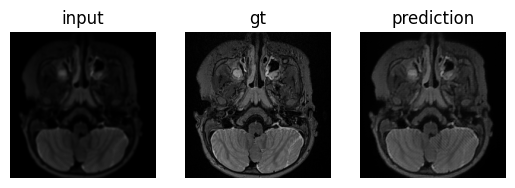

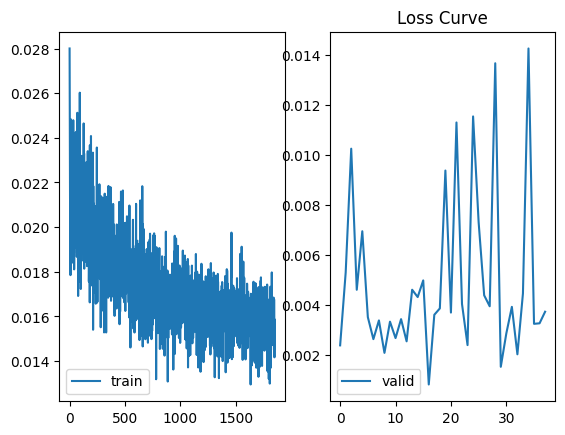

20it [00:01, 10.13it/s]


Epoch 1852, Loss: 0.01604661566670984


20it [00:02,  9.75it/s]


Epoch 1853, Loss: 0.01463125963928178


20it [00:01, 10.45it/s]


Epoch 1854, Loss: 0.013420914264861495


20it [00:02,  9.74it/s]


Epoch 1855, Loss: 0.01647739598993212


20it [00:02,  9.95it/s]


Epoch 1856, Loss: 0.016319936607033014


20it [00:01, 10.26it/s]


Epoch 1857, Loss: 0.015655171265825628


20it [00:02,  9.87it/s]


Epoch 1858, Loss: 0.0162020992487669


20it [00:02,  9.94it/s]


Epoch 1859, Loss: 0.015482682082802058


20it [00:01, 10.03it/s]


Epoch 1860, Loss: 0.015417531575076282


20it [00:02, 10.00it/s]


Epoch 1861, Loss: 0.016024685511365534


20it [00:01, 10.03it/s]


Epoch 1862, Loss: 0.015082257555332036


20it [00:01, 10.17it/s]


Epoch 1863, Loss: 0.015190318110398948


20it [00:01, 10.21it/s]


Epoch 1864, Loss: 0.01733852536417544


20it [00:02,  9.99it/s]


Epoch 1865, Loss: 0.014486570877488702


20it [00:02,  9.70it/s]


Epoch 1866, Loss: 0.016736888338346034


20it [00:02,  9.83it/s]


Epoch 1867, Loss: 0.015804917248897255


20it [00:02,  9.98it/s]


Epoch 1868, Loss: 0.016448081843554972


20it [00:01, 10.15it/s]


Epoch 1869, Loss: 0.016354778059758247


20it [00:02,  9.75it/s]


Epoch 1870, Loss: 0.014872813213150949


20it [00:01, 10.07it/s]


Epoch 1871, Loss: 0.016224161838181317


20it [00:01, 10.26it/s]


Epoch 1872, Loss: 0.01453219442628324


20it [00:02,  9.67it/s]


Epoch 1873, Loss: 0.016766239190474153


20it [00:01, 10.33it/s]


Epoch 1874, Loss: 0.014636170933954418


20it [00:02,  9.88it/s]


Epoch 1875, Loss: 0.01529793085064739


20it [00:01, 10.18it/s]


Epoch 1876, Loss: 0.01564469749573618


20it [00:02,  9.61it/s]


Epoch 1877, Loss: 0.016267775697633623


20it [00:01, 10.18it/s]


Epoch 1878, Loss: 0.012613919633440673


20it [00:01, 10.16it/s]


Epoch 1879, Loss: 0.014086543465964496


20it [00:01, 10.18it/s]


Epoch 1880, Loss: 0.014795374101959169


20it [00:01, 10.08it/s]


Epoch 1881, Loss: 0.015360255911946296


20it [00:01, 10.08it/s]


Epoch 1882, Loss: 0.016620392072945835


20it [00:01, 10.49it/s]


Epoch 1883, Loss: 0.014638373744674027


20it [00:01, 10.01it/s]


Epoch 1884, Loss: 0.017725415364839136


20it [00:01, 10.17it/s]


Epoch 1885, Loss: 0.016906003840267657


20it [00:02,  9.99it/s]


Epoch 1886, Loss: 0.013602970377542078


20it [00:01, 10.20it/s]


Epoch 1887, Loss: 0.01515468955039978


20it [00:02,  9.87it/s]


Epoch 1888, Loss: 0.013447689346503467


20it [00:01, 10.21it/s]


Epoch 1889, Loss: 0.014336128835566342


20it [00:01, 10.02it/s]


Epoch 1890, Loss: 0.01619689157232642


20it [00:01, 10.17it/s]


Epoch 1891, Loss: 0.015398044453468174


20it [00:01, 10.53it/s]


Epoch 1892, Loss: 0.01641937284730375


20it [00:01, 10.11it/s]


Epoch 1893, Loss: 0.015756213222630322


20it [00:01, 10.29it/s]


Epoch 1894, Loss: 0.013367959670722485


20it [00:01, 10.19it/s]


Epoch 1895, Loss: 0.01447778126457706


20it [00:01, 10.36it/s]


Epoch 1896, Loss: 0.01588621202390641


20it [00:01, 10.00it/s]


Epoch 1897, Loss: 0.017683683894574642


20it [00:02,  9.52it/s]


Epoch 1898, Loss: 0.016064433567225932


20it [00:01, 10.19it/s]


Epoch 1899, Loss: 0.015216908254660665


20it [00:01, 10.02it/s]


Epoch 1900, Loss: 0.016919092554599047


20it [00:01, 10.27it/s]

Epoch 1901, Loss: 0.015205524757038801



4it [00:00, 10.48it/s]


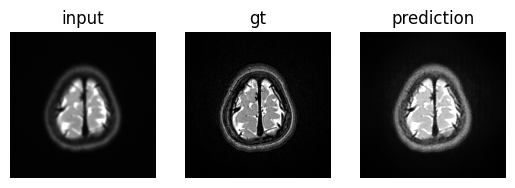

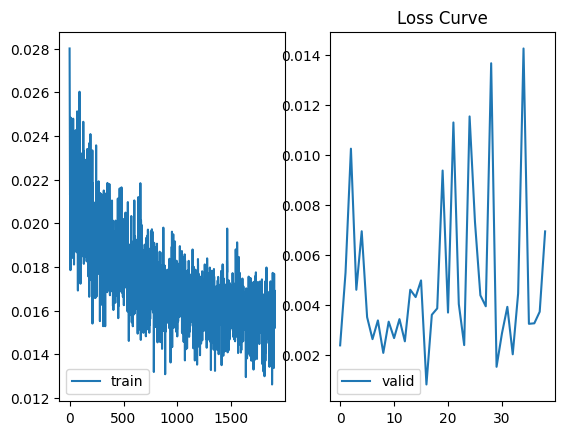

20it [00:02,  9.98it/s]


Epoch 1902, Loss: 0.015205306618008762


20it [00:01, 10.14it/s]


Epoch 1903, Loss: 0.015847297129221262


20it [00:01, 10.25it/s]


Epoch 1904, Loss: 0.01622639934066683


20it [00:01, 10.16it/s]


Epoch 1905, Loss: 0.016466812207363547


20it [00:01, 10.12it/s]


Epoch 1906, Loss: 0.01600953608285636


20it [00:02,  9.22it/s]


Epoch 1907, Loss: 0.015239262499380856


20it [00:02,  9.94it/s]


Epoch 1908, Loss: 0.01520996110048145


20it [00:01, 10.16it/s]


Epoch 1909, Loss: 0.014118895214051009


20it [00:02,  9.97it/s]


Epoch 1910, Loss: 0.01588721580337733


20it [00:01, 10.32it/s]


Epoch 1911, Loss: 0.014578069862909614


20it [00:01, 10.11it/s]


Epoch 1912, Loss: 0.014872945414390415


20it [00:01, 10.02it/s]


Epoch 1913, Loss: 0.015585206355899573


20it [00:02,  9.71it/s]


Epoch 1914, Loss: 0.016047803265973926


20it [00:01, 10.10it/s]


Epoch 1915, Loss: 0.0160591930616647


20it [00:01, 10.44it/s]


Epoch 1916, Loss: 0.01567682921886444


20it [00:01, 10.34it/s]


Epoch 1917, Loss: 0.01538843447342515


20it [00:02,  9.74it/s]


Epoch 1918, Loss: 0.015895553596783428


20it [00:01, 10.17it/s]


Epoch 1919, Loss: 0.015869508660398424


20it [00:02,  9.99it/s]


Epoch 1920, Loss: 0.014531333069317042


20it [00:02,  9.96it/s]


Epoch 1921, Loss: 0.015533528290688992


20it [00:01, 10.01it/s]


Epoch 1922, Loss: 0.016357867955230178


20it [00:01, 10.26it/s]


Epoch 1923, Loss: 0.01509655814152211


20it [00:01, 10.13it/s]


Epoch 1924, Loss: 0.016280978033319116


20it [00:02,  9.89it/s]


Epoch 1925, Loss: 0.016271605668589473


20it [00:01, 10.20it/s]


Epoch 1926, Loss: 0.016839934163726866


20it [00:01, 10.22it/s]


Epoch 1927, Loss: 0.015905490983277558


20it [00:02,  9.90it/s]


Epoch 1928, Loss: 0.01582139537204057


20it [00:02,  9.53it/s]


Epoch 1929, Loss: 0.015832746308296917


20it [00:02,  9.94it/s]


Epoch 1930, Loss: 0.01647759792394936


20it [00:01, 10.62it/s]


Epoch 1931, Loss: 0.016408220422454177


20it [00:01, 10.15it/s]


Epoch 1932, Loss: 0.014858790300786495


20it [00:01, 10.13it/s]


Epoch 1933, Loss: 0.016722760209813715


20it [00:02,  9.76it/s]


Epoch 1934, Loss: 0.016310677316505463


20it [00:01, 10.13it/s]


Epoch 1935, Loss: 0.017556612216867506


20it [00:02,  9.99it/s]


Epoch 1936, Loss: 0.015584971779026091


20it [00:02,  9.85it/s]


Epoch 1937, Loss: 0.014820183638948946


20it [00:01, 10.18it/s]


Epoch 1938, Loss: 0.016007830412127076


20it [00:02,  9.55it/s]


Epoch 1939, Loss: 0.016552258259616794


20it [00:02,  9.89it/s]


Epoch 1940, Loss: 0.016465830150991678


20it [00:02,  9.94it/s]


Epoch 1941, Loss: 0.016895278519950808


20it [00:01, 10.03it/s]


Epoch 1942, Loss: 0.01422385429032147


20it [00:02,  9.97it/s]


Epoch 1943, Loss: 0.016250928561203182


20it [00:01, 10.22it/s]


Epoch 1944, Loss: 0.016830143961124124


20it [00:02,  9.89it/s]


Epoch 1945, Loss: 0.016649423888884483


20it [00:01, 10.06it/s]


Epoch 1946, Loss: 0.017046545376069845


20it [00:01, 10.09it/s]


Epoch 1947, Loss: 0.013972866092808544


20it [00:01, 10.13it/s]


Epoch 1948, Loss: 0.016001998027786613


20it [00:02,  9.87it/s]


Epoch 1949, Loss: 0.014717376604676247


20it [00:02,  9.27it/s]


Epoch 1950, Loss: 0.017493921844288707


20it [00:01, 10.07it/s]

Epoch 1951, Loss: 0.01641709809191525



4it [00:00, 10.68it/s]


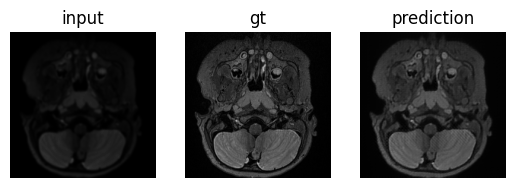

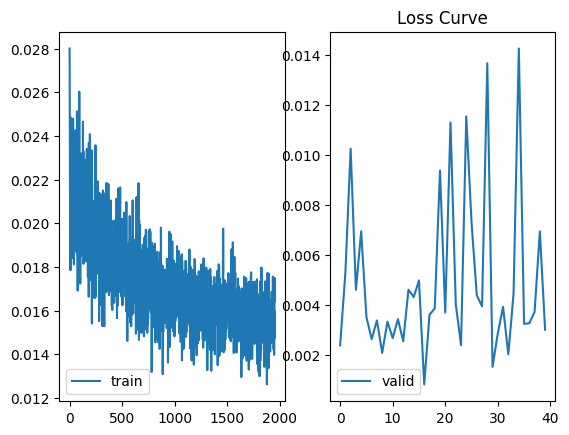

20it [00:02,  9.91it/s]


Epoch 1952, Loss: 0.014451109478250146


20it [00:01, 10.08it/s]


Epoch 1953, Loss: 0.016191484057344496


20it [00:01, 10.18it/s]


Epoch 1954, Loss: 0.015111376205459237


20it [00:02,  9.78it/s]


Epoch 1955, Loss: 0.013231856341008097


20it [00:01, 10.00it/s]


Epoch 1956, Loss: 0.014666831761132926


20it [00:01, 10.08it/s]


Epoch 1957, Loss: 0.01618430551607162


20it [00:01, 10.22it/s]


Epoch 1958, Loss: 0.015784898679703473


20it [00:02,  9.10it/s]


Epoch 1959, Loss: 0.01584287374280393


20it [00:01, 10.06it/s]


Epoch 1960, Loss: 0.013483492645900697


20it [00:01, 10.28it/s]


Epoch 1961, Loss: 0.01573585718870163


20it [00:01, 10.14it/s]


Epoch 1962, Loss: 0.0154740322381258


20it [00:01, 10.36it/s]


Epoch 1963, Loss: 0.014754288480617106


20it [00:01, 10.14it/s]


Epoch 1964, Loss: 0.016304678423330186


20it [00:01, 10.34it/s]


Epoch 1965, Loss: 0.014039031229913235


20it [00:01, 10.16it/s]


Epoch 1966, Loss: 0.01452797835227102


20it [00:01, 10.32it/s]


Epoch 1967, Loss: 0.014586401730775833


20it [00:02,  9.94it/s]


Epoch 1968, Loss: 0.01393152407836169


20it [00:02,  9.48it/s]


Epoch 1969, Loss: 0.014471176161896438


20it [00:01, 10.21it/s]


Epoch 1970, Loss: 0.016429784800857307


20it [00:01, 10.29it/s]


Epoch 1971, Loss: 0.014607035857625305


20it [00:02,  9.79it/s]


Epoch 1972, Loss: 0.014237490552477538


20it [00:01, 10.26it/s]


Epoch 1973, Loss: 0.0158683676738292


20it [00:02,  9.77it/s]


Epoch 1974, Loss: 0.013533351279329508


20it [00:01, 10.22it/s]


Epoch 1975, Loss: 0.015646700724028052


20it [00:01, 10.31it/s]


Epoch 1976, Loss: 0.015421633096411824


20it [00:01, 10.00it/s]


Epoch 1977, Loss: 0.016108217043802144


20it [00:01, 10.07it/s]


Epoch 1978, Loss: 0.014943108498118817


20it [00:01, 10.47it/s]


Epoch 1979, Loss: 0.016038773860782386


20it [00:02,  9.49it/s]


Epoch 1980, Loss: 0.015169506473466755


20it [00:02,  9.97it/s]


Epoch 1981, Loss: 0.016580966487526893


20it [00:02,  9.81it/s]


Epoch 1982, Loss: 0.015445947740226984


20it [00:01, 10.26it/s]


Epoch 1983, Loss: 0.01518978290259838


20it [00:01, 10.16it/s]


Epoch 1984, Loss: 0.01436291087884456


20it [00:01, 10.18it/s]


Epoch 1985, Loss: 0.01530113120097667


20it [00:01, 10.20it/s]


Epoch 1986, Loss: 0.0161638040561229


20it [00:01, 10.08it/s]


Epoch 1987, Loss: 0.014687592163681984


20it [00:01, 10.39it/s]


Epoch 1988, Loss: 0.014344537479337305


20it [00:02,  9.84it/s]


Epoch 1989, Loss: 0.01550605909433216


20it [00:02,  9.67it/s]


Epoch 1990, Loss: 0.01569692965131253


20it [00:01, 10.06it/s]


Epoch 1991, Loss: 0.013810425414703786


20it [00:01, 10.36it/s]


Epoch 1992, Loss: 0.016089817869942635


20it [00:01, 10.36it/s]


Epoch 1993, Loss: 0.01567850192077458


20it [00:01, 10.19it/s]


Epoch 1994, Loss: 0.01588935307227075


20it [00:02,  9.96it/s]


Epoch 1995, Loss: 0.015486640157178044


20it [00:01, 10.38it/s]


Epoch 1996, Loss: 0.015419785608537495


20it [00:01, 10.05it/s]


Epoch 1997, Loss: 0.014582330640405417


20it [00:02,  9.98it/s]


Epoch 1998, Loss: 0.016686099348589778


20it [00:02,  9.85it/s]


Epoch 1999, Loss: 0.016833469923585653


20it [00:02,  9.95it/s]


Epoch 2000, Loss: 0.013913869997486472


20it [00:02,  9.45it/s]

Epoch 2001, Loss: 0.014796998375095427



4it [00:00, 10.38it/s]


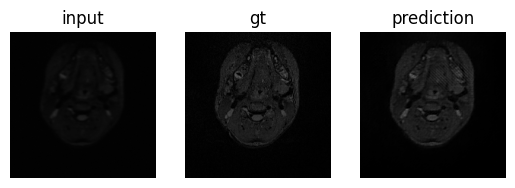

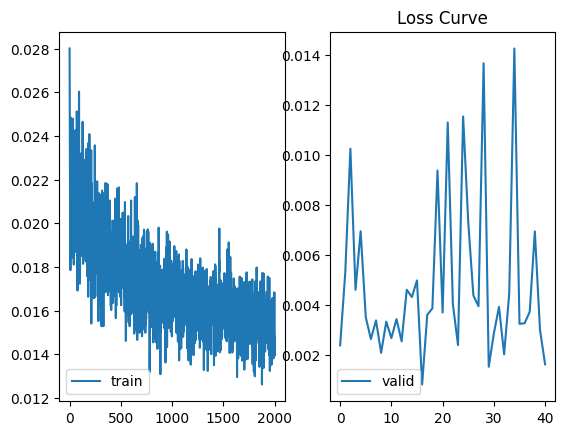

20it [00:01, 10.63it/s]


Epoch 2002, Loss: 0.012804183713160455


20it [00:02,  9.92it/s]


Epoch 2003, Loss: 0.016070911008864642


20it [00:01, 10.15it/s]


Epoch 2004, Loss: 0.015807890216819942


20it [00:02,  9.96it/s]


Epoch 2005, Loss: 0.013546648190822453


20it [00:01, 10.06it/s]


Epoch 2006, Loss: 0.01695339474827051


20it [00:02,  9.81it/s]


Epoch 2007, Loss: 0.015546920686028897


20it [00:02,  9.92it/s]


Epoch 2008, Loss: 0.014897019066847862


20it [00:01, 10.34it/s]


Epoch 2009, Loss: 0.015134940505959094


20it [00:02,  9.18it/s]


Epoch 2010, Loss: 0.014267948758788406


20it [00:01, 10.24it/s]


Epoch 2011, Loss: 0.01581420770380646


20it [00:01, 10.27it/s]


Epoch 2012, Loss: 0.015365380910225213


20it [00:02,  9.91it/s]


Epoch 2013, Loss: 0.01609610931482166


20it [00:01, 10.03it/s]


Epoch 2014, Loss: 0.01593953142873943


20it [00:01, 10.34it/s]


Epoch 2015, Loss: 0.016560651524923743


20it [00:02,  9.88it/s]


Epoch 2016, Loss: 0.015824669133871795


20it [00:01, 10.01it/s]


Epoch 2017, Loss: 0.015043146954849363


20it [00:01, 10.24it/s]


Epoch 2018, Loss: 0.01699841730296612


20it [00:01, 10.56it/s]


Epoch 2019, Loss: 0.017796816304326057


20it [00:02,  9.80it/s]


Epoch 2020, Loss: 0.016095392289571464


20it [00:02,  9.67it/s]


Epoch 2021, Loss: 0.01576637683901936


20it [00:02,  9.91it/s]


Epoch 2022, Loss: 0.016044166369829325


20it [00:01, 10.02it/s]


Epoch 2023, Loss: 0.013766620121896268


20it [00:02,  9.69it/s]


Epoch 2024, Loss: 0.014949874929152429


20it [00:02,  9.71it/s]


Epoch 2025, Loss: 0.015950810397043824


20it [00:01, 10.26it/s]


Epoch 2026, Loss: 0.015175261185504496


20it [00:01, 10.34it/s]


Epoch 2027, Loss: 0.015543583012185992


20it [00:01, 10.12it/s]


Epoch 2028, Loss: 0.01474621780216694


20it [00:01, 10.16it/s]


Epoch 2029, Loss: 0.014087816665414721


20it [00:01, 10.40it/s]


Epoch 2030, Loss: 0.015908048395067452


20it [00:02,  9.70it/s]


Epoch 2031, Loss: 0.016284882673062384


20it [00:02,  9.68it/s]


Epoch 2032, Loss: 0.016358874971047044


20it [00:01, 10.29it/s]


Epoch 2033, Loss: 0.014982407190836966


20it [00:02,  9.84it/s]


Epoch 2034, Loss: 0.014700975269079208


20it [00:01, 10.02it/s]


Epoch 2035, Loss: 0.016119356080889703


20it [00:01, 10.37it/s]


Epoch 2036, Loss: 0.014156530774198473


20it [00:02,  9.78it/s]


Epoch 2037, Loss: 0.015546966949477792


20it [00:01, 10.11it/s]


Epoch 2038, Loss: 0.012847615731880068


20it [00:01, 10.14it/s]


Epoch 2039, Loss: 0.014621159294620156


20it [00:01, 10.46it/s]


Epoch 2040, Loss: 0.015400621527805924


20it [00:01, 10.01it/s]


Epoch 2041, Loss: 0.01601842944510281


20it [00:02,  9.48it/s]


Epoch 2042, Loss: 0.015347479493357241


20it [00:01, 10.30it/s]


Epoch 2043, Loss: 0.014815645234193653


20it [00:01, 10.20it/s]


Epoch 2044, Loss: 0.01498869655188173


20it [00:01, 10.10it/s]


Epoch 2045, Loss: 0.014732716628350318


20it [00:01, 10.28it/s]


Epoch 2046, Loss: 0.01421049387427047


20it [00:01, 10.25it/s]


Epoch 2047, Loss: 0.016464943950995802


20it [00:01, 10.30it/s]


Epoch 2048, Loss: 0.015151171712204814


20it [00:02,  9.94it/s]


Epoch 2049, Loss: 0.014741289347875863


20it [00:01, 10.01it/s]


Epoch 2050, Loss: 0.01452767096925527


20it [00:01, 10.02it/s]

Epoch 2051, Loss: 0.0158273296430707



4it [00:00,  9.22it/s]


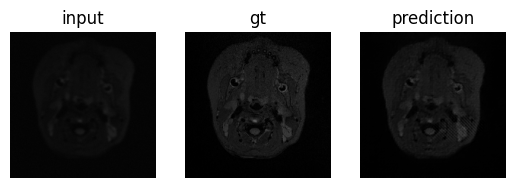

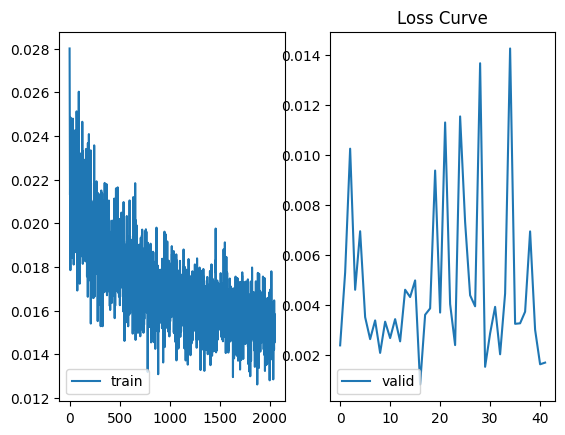

20it [00:01, 10.14it/s]


Epoch 2052, Loss: 0.014519099611788988


20it [00:01, 10.24it/s]


Epoch 2053, Loss: 0.01503324774093926


20it [00:02,  9.66it/s]


Epoch 2054, Loss: 0.015616739448159934


20it [00:01, 10.13it/s]


Epoch 2055, Loss: 0.015859858109615745


20it [00:01, 10.22it/s]


Epoch 2056, Loss: 0.01563979755155742


20it [00:01, 10.04it/s]


Epoch 2057, Loss: 0.014718086179345845


20it [00:02,  9.88it/s]


Epoch 2058, Loss: 0.015129667869769037


20it [00:02,  9.86it/s]


Epoch 2059, Loss: 0.01367927888641134


20it [00:01, 10.04it/s]


Epoch 2060, Loss: 0.015662830579094587


20it [00:01, 10.40it/s]


Epoch 2061, Loss: 0.015752295101992785


20it [00:01, 10.07it/s]


Epoch 2062, Loss: 0.015549731615465134


20it [00:02,  9.57it/s]


Epoch 2063, Loss: 0.016538819205015896


20it [00:01, 10.18it/s]


Epoch 2064, Loss: 0.016941232420504094


20it [00:01, 10.16it/s]


Epoch 2065, Loss: 0.013466572668403388


20it [00:01, 10.21it/s]


Epoch 2066, Loss: 0.015950256772339345


20it [00:01, 10.17it/s]


Epoch 2067, Loss: 0.016011752630583943


20it [00:01, 10.28it/s]


Epoch 2068, Loss: 0.014209382876288146


20it [00:01, 10.07it/s]


Epoch 2069, Loss: 0.016511812643148004


20it [00:01, 10.24it/s]


Epoch 2070, Loss: 0.015204366506077349


20it [00:01, 10.10it/s]


Epoch 2071, Loss: 0.012342788139358163


20it [00:01, 10.21it/s]


Epoch 2072, Loss: 0.016129206796176732


20it [00:01, 10.23it/s]


Epoch 2073, Loss: 0.016037590708583592


20it [00:02,  9.48it/s]


Epoch 2074, Loss: 0.015318468073382973


20it [00:02,  9.91it/s]


Epoch 2075, Loss: 0.01519080160651356


20it [00:01, 10.05it/s]


Epoch 2076, Loss: 0.014843304734677076


20it [00:01, 10.11it/s]


Epoch 2077, Loss: 0.015511666459497064


20it [00:02,  9.95it/s]


Epoch 2078, Loss: 0.014097184338606895


20it [00:02,  9.85it/s]


Epoch 2079, Loss: 0.015497243637219072


20it [00:01, 10.11it/s]


Epoch 2080, Loss: 0.014311203709803521


20it [00:01, 10.07it/s]


Epoch 2081, Loss: 0.014541809714864939


20it [00:01, 10.05it/s]


Epoch 2082, Loss: 0.01491532069630921


20it [00:02,  9.99it/s]


Epoch 2083, Loss: 0.016127195954322816


20it [00:02, 10.00it/s]


Epoch 2084, Loss: 0.015756518905982377


20it [00:02,  9.85it/s]


Epoch 2085, Loss: 0.01468373134266585


20it [00:01, 10.47it/s]


Epoch 2086, Loss: 0.015760446223430334


20it [00:01, 10.27it/s]


Epoch 2087, Loss: 0.015586437250021845


20it [00:01, 10.34it/s]


Epoch 2088, Loss: 0.01551206298172474


20it [00:01, 10.23it/s]


Epoch 2089, Loss: 0.01644237486179918


20it [00:02,  9.49it/s]


Epoch 2090, Loss: 0.01484721046872437


20it [00:02,  9.97it/s]


Epoch 2091, Loss: 0.014405127719510347


20it [00:01, 10.06it/s]


Epoch 2092, Loss: 0.016776145622134208


20it [00:01, 10.23it/s]


Epoch 2093, Loss: 0.013875404116697609


20it [00:01, 10.14it/s]


Epoch 2094, Loss: 0.01441606660373509


20it [00:01, 10.26it/s]


Epoch 2095, Loss: 0.01588959984946996


20it [00:02,  9.30it/s]


Epoch 2096, Loss: 0.014366190996952355


20it [00:02,  9.83it/s]


Epoch 2097, Loss: 0.016442581615410744


20it [00:01, 10.12it/s]


Epoch 2098, Loss: 0.016896095941774547


20it [00:01, 10.30it/s]


Epoch 2099, Loss: 0.01645617901813239


20it [00:02,  9.61it/s]


Epoch 2100, Loss: 0.015561643801629544


20it [00:01, 10.31it/s]

Epoch 2101, Loss: 0.014604506571777165



4it [00:00,  9.80it/s]


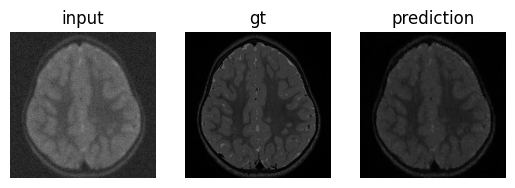

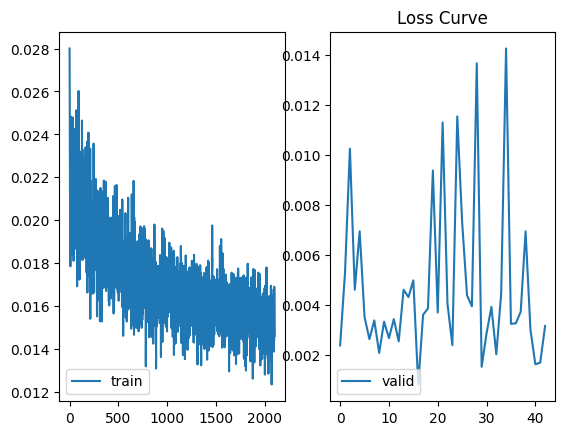

20it [00:01, 10.38it/s]


Epoch 2102, Loss: 0.016123827639967205


20it [00:01, 10.30it/s]


Epoch 2103, Loss: 0.014790015574544669


20it [00:02,  9.19it/s]


Epoch 2104, Loss: 0.014891491387970746


20it [00:01, 10.06it/s]


Epoch 2105, Loss: 0.014234123262576759


20it [00:02,  9.80it/s]


Epoch 2106, Loss: 0.015722240693867205


20it [00:01, 10.15it/s]


Epoch 2107, Loss: 0.015067241271026433


20it [00:01, 10.26it/s]


Epoch 2108, Loss: 0.014427467971108854


20it [00:02,  9.95it/s]


Epoch 2109, Loss: 0.014204028504900634


20it [00:01, 10.53it/s]


Epoch 2110, Loss: 0.016916537284851076


20it [00:01, 10.18it/s]


Epoch 2111, Loss: 0.015982748381793498


20it [00:01, 10.43it/s]


Epoch 2112, Loss: 0.013752245367504657


20it [00:01, 10.10it/s]


Epoch 2113, Loss: 0.015755302435718477


20it [00:01, 10.50it/s]


Epoch 2114, Loss: 0.015195848420262337


20it [00:02,  9.66it/s]


Epoch 2115, Loss: 0.015521828935015946


20it [00:02,  9.87it/s]


Epoch 2116, Loss: 0.015550306858494877


20it [00:01, 10.19it/s]


Epoch 2117, Loss: 0.014988348493352533


20it [00:01, 10.01it/s]


Epoch 2118, Loss: 0.013707562233321369


20it [00:01, 10.34it/s]


Epoch 2119, Loss: 0.014961469057016074


20it [00:01, 10.22it/s]


Epoch 2120, Loss: 0.015170860732905567


20it [00:01, 10.97it/s]


Epoch 2121, Loss: 0.01529465513303876


20it [00:02,  9.70it/s]


Epoch 2122, Loss: 0.014256947976537048


20it [00:01, 10.04it/s]


Epoch 2123, Loss: 0.014856169337872416


20it [00:02,  9.92it/s]


Epoch 2124, Loss: 0.01672927550971508


20it [00:01, 10.02it/s]


Epoch 2125, Loss: 0.015113317896611989


20it [00:02,  9.84it/s]


Epoch 2126, Loss: 0.01527242858428508


20it [00:01, 10.11it/s]


Epoch 2127, Loss: 0.01696327409008518


20it [00:02,  9.82it/s]


Epoch 2128, Loss: 0.016035826038569213


20it [00:01, 10.37it/s]


Epoch 2129, Loss: 0.015316622680984437


20it [00:01, 10.19it/s]


Epoch 2130, Loss: 0.015937410038895906


20it [00:01, 10.05it/s]


Epoch 2131, Loss: 0.01667066660011187


20it [00:01, 10.41it/s]


Epoch 2132, Loss: 0.015235355799086392


20it [00:01, 10.16it/s]


Epoch 2133, Loss: 0.01446563545614481


20it [00:01, 10.14it/s]


Epoch 2134, Loss: 0.015615296037867665


20it [00:01, 10.00it/s]


Epoch 2135, Loss: 0.014044366055168211


20it [00:01, 10.19it/s]


Epoch 2136, Loss: 0.015385944047011435


20it [00:02,  9.46it/s]


Epoch 2137, Loss: 0.01575661785900593


20it [00:01, 10.14it/s]


Epoch 2138, Loss: 0.01526244911365211


20it [00:02,  9.99it/s]


Epoch 2139, Loss: 0.015857751469593496


20it [00:02,  9.79it/s]


Epoch 2140, Loss: 0.013943460094742477


20it [00:01, 10.35it/s]


Epoch 2141, Loss: 0.015744785603601485


20it [00:01, 10.49it/s]


Epoch 2142, Loss: 0.01565452585928142


20it [00:02,  9.82it/s]


Epoch 2143, Loss: 0.015817608847282828


20it [00:01, 10.36it/s]


Epoch 2144, Loss: 0.0157325787935406


20it [00:01, 10.27it/s]


Epoch 2145, Loss: 0.015528478042688221


20it [00:01, 10.04it/s]


Epoch 2146, Loss: 0.016312416503205897


20it [00:02,  9.67it/s]


Epoch 2147, Loss: 0.014814852259587497


20it [00:01, 10.26it/s]


Epoch 2148, Loss: 0.015937118488363922


20it [00:01, 10.62it/s]


Epoch 2149, Loss: 0.016146389045752586


20it [00:01, 10.20it/s]


Epoch 2150, Loss: 0.016246368538122623


20it [00:01, 10.05it/s]

Epoch 2151, Loss: 0.015197013970464468



4it [00:00, 10.09it/s]


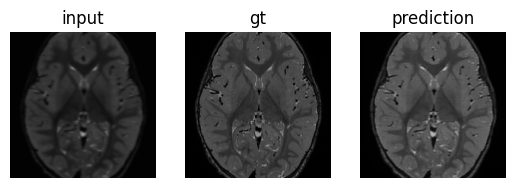

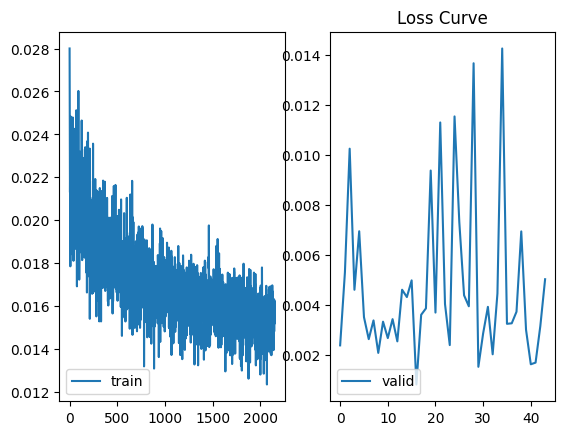

20it [00:01, 10.05it/s]


Epoch 2152, Loss: 0.014406900736503303


20it [00:02,  9.77it/s]


Epoch 2153, Loss: 0.015245442162267864


20it [00:02,  9.96it/s]


Epoch 2154, Loss: 0.01577270179986954


20it [00:02,  9.63it/s]


Epoch 2155, Loss: 0.015523095964454114


20it [00:01, 10.44it/s]


Epoch 2156, Loss: 0.015821344894357027


20it [00:02,  9.29it/s]


Epoch 2157, Loss: 0.01607450214214623


20it [00:02,  9.98it/s]


Epoch 2158, Loss: 0.015941819036379458


20it [00:01, 10.50it/s]


Epoch 2159, Loss: 0.014828810608014465


20it [00:02, 10.00it/s]


Epoch 2160, Loss: 0.014756683097220957


20it [00:01, 10.37it/s]


Epoch 2161, Loss: 0.0157698143273592


20it [00:01, 10.37it/s]


Epoch 2162, Loss: 0.01432643795851618


20it [00:01, 10.39it/s]


Epoch 2163, Loss: 0.015428187092766166


20it [00:01, 10.23it/s]


Epoch 2164, Loss: 0.014914446033071727


20it [00:02,  9.97it/s]


Epoch 2165, Loss: 0.016217288351617752


20it [00:02,  9.98it/s]


Epoch 2166, Loss: 0.01509237235877663


20it [00:01, 10.01it/s]


Epoch 2167, Loss: 0.016626225505024194


20it [00:01, 10.14it/s]


Epoch 2168, Loss: 0.016378245828673244


20it [00:01, 10.08it/s]


Epoch 2169, Loss: 0.015106705413199962


20it [00:01, 10.02it/s]


Epoch 2170, Loss: 0.015131679223850369


20it [00:01, 10.27it/s]


Epoch 2171, Loss: 0.014227428869344295


20it [00:02, 10.00it/s]


Epoch 2172, Loss: 0.015705227269791067


20it [00:01, 10.27it/s]


Epoch 2173, Loss: 0.01419748436892405


20it [00:01, 10.09it/s]


Epoch 2174, Loss: 0.013674574741162359


20it [00:01, 10.35it/s]


Epoch 2175, Loss: 0.015817383187822998


20it [00:02,  9.97it/s]


Epoch 2176, Loss: 0.015109217737335711


20it [00:01, 10.05it/s]


Epoch 2177, Loss: 0.014355377899482847


20it [00:02,  9.58it/s]


Epoch 2178, Loss: 0.015526862698607147


20it [00:01, 10.17it/s]


Epoch 2179, Loss: 0.015810519084334375


20it [00:01, 10.41it/s]


Epoch 2180, Loss: 0.014810538722667844


20it [00:01, 10.05it/s]


Epoch 2181, Loss: 0.014245886285789312


20it [00:02,  9.84it/s]


Epoch 2182, Loss: 0.01315775146940723


20it [00:01, 10.36it/s]


Epoch 2183, Loss: 0.015417274739593267


20it [00:01, 10.10it/s]


Epoch 2184, Loss: 0.016144402651116253


20it [00:01, 10.02it/s]


Epoch 2185, Loss: 0.016689738631248473


20it [00:02,  9.95it/s]


Epoch 2186, Loss: 0.015526384161785246


20it [00:02,  9.91it/s]


Epoch 2187, Loss: 0.015671368595212697


20it [00:02,  9.94it/s]


Epoch 2188, Loss: 0.016469817608594894


20it [00:02,  9.63it/s]


Epoch 2189, Loss: 0.016998711286578327


20it [00:01, 10.14it/s]


Epoch 2190, Loss: 0.01687325385864824


20it [00:01, 10.11it/s]


Epoch 2191, Loss: 0.017402983829379083


20it [00:01, 10.46it/s]


Epoch 2192, Loss: 0.015349438809789718


20it [00:01, 10.01it/s]


Epoch 2193, Loss: 0.015868709748610856


20it [00:01, 10.38it/s]


Epoch 2194, Loss: 0.014951822417788207


20it [00:01, 10.57it/s]


Epoch 2195, Loss: 0.014490626461338252


20it [00:02,  9.98it/s]


Epoch 2196, Loss: 0.014619115844834597


20it [00:01, 10.10it/s]


Epoch 2197, Loss: 0.014116748748347164


20it [00:01, 10.26it/s]


Epoch 2198, Loss: 0.014490568276960403


20it [00:01, 10.19it/s]


Epoch 2199, Loss: 0.015096580213867127


20it [00:01, 10.12it/s]


Epoch 2200, Loss: 0.016332796285860242


20it [00:02,  9.66it/s]

Epoch 2201, Loss: 0.013269157661125065



4it [00:00,  9.61it/s]


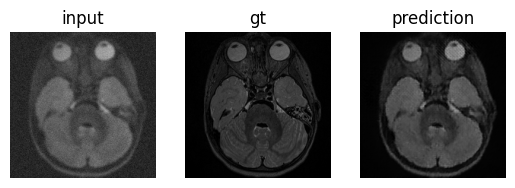

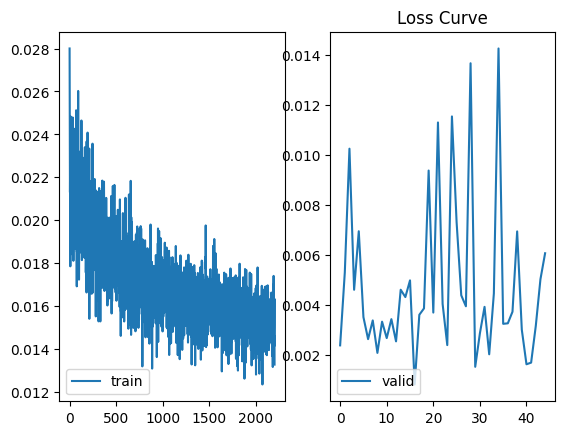

20it [00:01, 10.38it/s]


Epoch 2202, Loss: 0.015304682264104485


20it [00:01, 10.15it/s]


Epoch 2203, Loss: 0.013240126660093665


20it [00:01, 10.18it/s]


Epoch 2204, Loss: 0.015278398280497641


20it [00:01, 10.34it/s]


Epoch 2205, Loss: 0.016110349213704467


20it [00:01, 10.15it/s]


Epoch 2206, Loss: 0.015219237864948809


20it [00:02,  9.89it/s]


Epoch 2207, Loss: 0.01297246899921447


20it [00:02,  9.74it/s]


Epoch 2208, Loss: 0.015340830432251096


20it [00:02,  9.23it/s]


Epoch 2209, Loss: 0.015200930216815322


20it [00:02,  9.94it/s]


Epoch 2210, Loss: 0.015003231540322303


20it [00:01, 10.44it/s]


Epoch 2211, Loss: 0.015504985139705241


20it [00:01, 10.10it/s]


Epoch 2212, Loss: 0.015148920309729873


20it [00:01, 10.50it/s]


Epoch 2213, Loss: 0.015271170018240809


20it [00:01, 10.23it/s]


Epoch 2214, Loss: 0.01592171748634428


20it [00:02,  9.70it/s]


Epoch 2215, Loss: 0.014905877131968736


20it [00:01, 10.01it/s]


Epoch 2216, Loss: 0.01471215095371008


20it [00:02,  9.95it/s]


Epoch 2217, Loss: 0.014923939108848571


20it [00:01, 10.12it/s]


Epoch 2218, Loss: 0.016156980558298527


20it [00:01, 10.14it/s]


Epoch 2219, Loss: 0.014918069320265204


20it [00:01, 10.01it/s]


Epoch 2220, Loss: 0.014155284338630735


20it [00:01, 10.05it/s]


Epoch 2221, Loss: 0.01654548814985901


20it [00:01, 10.26it/s]


Epoch 2222, Loss: 0.015406343736685812


20it [00:01, 10.03it/s]


Epoch 2223, Loss: 0.013895883853547276


20it [00:02,  9.95it/s]


Epoch 2224, Loss: 0.017207661480642854


20it [00:01, 10.06it/s]


Epoch 2225, Loss: 0.01438957084901631


20it [00:01, 10.02it/s]


Epoch 2226, Loss: 0.015741443098522722


20it [00:01, 10.30it/s]


Epoch 2227, Loss: 0.015734522230923177


20it [00:01, 10.08it/s]


Epoch 2228, Loss: 0.01596141147892922


20it [00:02,  9.98it/s]


Epoch 2229, Loss: 0.01786534213460982


20it [00:01, 10.09it/s]


Epoch 2230, Loss: 0.015978948306292297


20it [00:02,  9.48it/s]


Epoch 2231, Loss: 0.01488410155288875


20it [00:01, 10.08it/s]


Epoch 2232, Loss: 0.015167187340557576


20it [00:02,  9.86it/s]


Epoch 2233, Loss: 0.014869282441213726


20it [00:02,  9.90it/s]


Epoch 2234, Loss: 0.015031440183520317


20it [00:01, 10.57it/s]


Epoch 2235, Loss: 0.015467368718236684


20it [00:02,  9.95it/s]


Epoch 2236, Loss: 0.015823424397967755


20it [00:02,  9.68it/s]


Epoch 2237, Loss: 0.016585787339136005


20it [00:01, 10.40it/s]


Epoch 2238, Loss: 0.01525095934048295


20it [00:01, 10.03it/s]


Epoch 2239, Loss: 0.015162810124456883


20it [00:01, 10.22it/s]


Epoch 2240, Loss: 0.016456049354746937


20it [00:01, 10.06it/s]


Epoch 2241, Loss: 0.015113263367675244


20it [00:02,  9.34it/s]


Epoch 2242, Loss: 0.014866164268460125


20it [00:01, 10.06it/s]


Epoch 2243, Loss: 0.015352559392340481


20it [00:01, 10.12it/s]


Epoch 2244, Loss: 0.016450334107503295


20it [00:01, 10.13it/s]


Epoch 2245, Loss: 0.014039922831580042


20it [00:02,  9.89it/s]


Epoch 2246, Loss: 0.014688702381681651


20it [00:01, 10.32it/s]


Epoch 2247, Loss: 0.015018404577858746


20it [00:02,  9.93it/s]


Epoch 2248, Loss: 0.014289419166743755


20it [00:02,  9.90it/s]


Epoch 2249, Loss: 0.015206718537956476


20it [00:01, 10.58it/s]


Epoch 2250, Loss: 0.014303232682868839


20it [00:01, 10.07it/s]

Epoch 2251, Loss: 0.015750134852714835



4it [00:00, 10.30it/s]


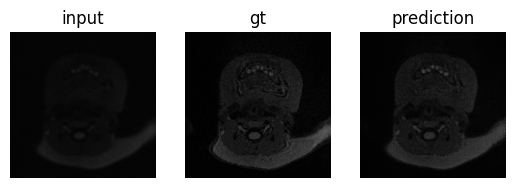

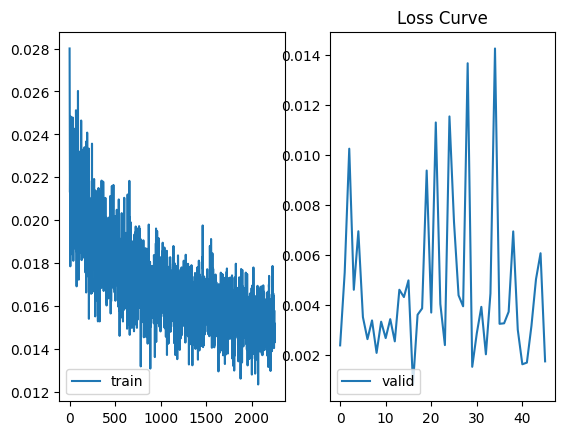

20it [00:01, 10.05it/s]


Epoch 2252, Loss: 0.017136292392387988


20it [00:01, 10.31it/s]


Epoch 2253, Loss: 0.01676537732128054


20it [00:01, 10.15it/s]


Epoch 2254, Loss: 0.015196654305327684


20it [00:01, 10.18it/s]


Epoch 2255, Loss: 0.013966158987022937


20it [00:01, 10.29it/s]


Epoch 2256, Loss: 0.014673709636554122


20it [00:01, 10.07it/s]


Epoch 2257, Loss: 0.015549529856070877


20it [00:02,  9.99it/s]


Epoch 2258, Loss: 0.014220202516298741


20it [00:02,  9.97it/s]


Epoch 2259, Loss: 0.014788308762945235


20it [00:01, 10.27it/s]


Epoch 2260, Loss: 0.01445791603764519


20it [00:01, 10.04it/s]


Epoch 2261, Loss: 0.01589191609527916


20it [00:02,  9.65it/s]


Epoch 2262, Loss: 0.01573387354146689


20it [00:02,  9.91it/s]


Epoch 2263, Loss: 0.014086590730585158


20it [00:01, 10.08it/s]


Epoch 2264, Loss: 0.016725645679980517


20it [00:01, 10.33it/s]


Epoch 2265, Loss: 0.012400991562753916


20it [00:02,  9.88it/s]


Epoch 2266, Loss: 0.015459609462413936


20it [00:01, 10.28it/s]


Epoch 2267, Loss: 0.014460154250264168


20it [00:02,  9.85it/s]


Epoch 2268, Loss: 0.015781975898426025


20it [00:01, 10.07it/s]


Epoch 2269, Loss: 0.01655814963160083


20it [00:01, 10.21it/s]


Epoch 2270, Loss: 0.014369947521481663


20it [00:01, 10.04it/s]


Epoch 2271, Loss: 0.015115537587553263


20it [00:01, 10.04it/s]


Epoch 2272, Loss: 0.015283907169941813


20it [00:02,  9.64it/s]


Epoch 2273, Loss: 0.014452016260474921


20it [00:01, 10.19it/s]


Epoch 2274, Loss: 0.014345905114896595


20it [00:01, 10.12it/s]


Epoch 2275, Loss: 0.016411110339686275


20it [00:01, 10.11it/s]


Epoch 2276, Loss: 0.016807682695798576


20it [00:01, 10.57it/s]


Epoch 2277, Loss: 0.013813114224467427


20it [00:01, 10.19it/s]


Epoch 2278, Loss: 0.015341851371340453


20it [00:01, 10.13it/s]


Epoch 2279, Loss: 0.014645151374861599


20it [00:01, 10.20it/s]


Epoch 2280, Loss: 0.014157918118871748


20it [00:02,  9.74it/s]


Epoch 2281, Loss: 0.014124511159025133


20it [00:01, 10.19it/s]


Epoch 2282, Loss: 0.015428173483815043


20it [00:02,  9.57it/s]


Epoch 2283, Loss: 0.016371899214573205


20it [00:01, 10.25it/s]


Epoch 2284, Loss: 0.01504936086712405


20it [00:01, 10.00it/s]


Epoch 2285, Loss: 0.011946574202738702


20it [00:01, 10.15it/s]


Epoch 2286, Loss: 0.014124144311062991


20it [00:01, 10.10it/s]


Epoch 2287, Loss: 0.016128546744585037


20it [00:01, 10.53it/s]


Epoch 2288, Loss: 0.015561236860230565


20it [00:02,  9.92it/s]


Epoch 2289, Loss: 0.013271970115602017


20it [00:01, 10.19it/s]


Epoch 2290, Loss: 0.013192434597294777


20it [00:02,  9.81it/s]


Epoch 2291, Loss: 0.014598737028427422


20it [00:02,  9.97it/s]


Epoch 2292, Loss: 0.0162657669512555


20it [00:01, 10.01it/s]


Epoch 2293, Loss: 0.015155108366161584


20it [00:02,  9.69it/s]


Epoch 2294, Loss: 0.01551186062861234


20it [00:02,  9.69it/s]


Epoch 2295, Loss: 0.013946123269852251


20it [00:02,  9.98it/s]


Epoch 2296, Loss: 0.015670006815344095


20it [00:01, 10.33it/s]


Epoch 2297, Loss: 0.01399814705364406


20it [00:01, 10.13it/s]


Epoch 2298, Loss: 0.016601406084373594


20it [00:01, 10.26it/s]


Epoch 2299, Loss: 0.016383504681289195


20it [00:01, 10.22it/s]


Epoch 2300, Loss: 0.016096077766269444


20it [00:01, 10.48it/s]

Epoch 2301, Loss: 0.016267046378925443



4it [00:00, 10.50it/s]


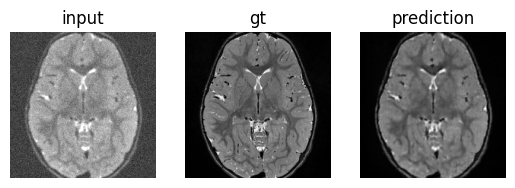

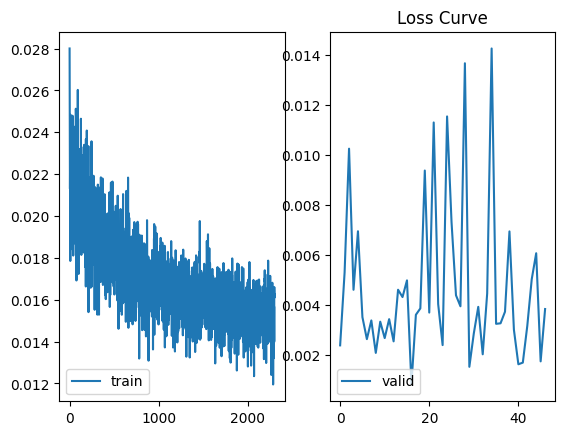

20it [00:01, 10.04it/s]


Epoch 2302, Loss: 0.016080796672031283


20it [00:02,  9.58it/s]


Epoch 2303, Loss: 0.015371474670246243


20it [00:01, 10.15it/s]


Epoch 2304, Loss: 0.013912460370920598


20it [00:02,  9.90it/s]


Epoch 2305, Loss: 0.0163486800622195


20it [00:01, 10.33it/s]


Epoch 2306, Loss: 0.013901627401355653


20it [00:01, 10.40it/s]


Epoch 2307, Loss: 0.014792090351693332


20it [00:01, 10.15it/s]


Epoch 2308, Loss: 0.014814889524132013


20it [00:01, 10.22it/s]


Epoch 2309, Loss: 0.017162660881876946


20it [00:01, 10.04it/s]


Epoch 2310, Loss: 0.014001101930625736


20it [00:01, 10.35it/s]


Epoch 2311, Loss: 0.01323067203629762


20it [00:02,  9.95it/s]


Epoch 2312, Loss: 0.016518863523378967


20it [00:01, 10.30it/s]


Epoch 2313, Loss: 0.01442027254961431


20it [00:02,  9.69it/s]


Epoch 2314, Loss: 0.014308361080475151


20it [00:01, 10.43it/s]


Epoch 2315, Loss: 0.015199617645703257


20it [00:02,  9.81it/s]


Epoch 2316, Loss: 0.015674894361291082


20it [00:01, 10.14it/s]


Epoch 2317, Loss: 0.015307971579022705


20it [00:01, 10.03it/s]


Epoch 2318, Loss: 0.015881439996883275


20it [00:02,  9.96it/s]


Epoch 2319, Loss: 0.014790767431259155


20it [00:02,  9.98it/s]


Epoch 2320, Loss: 0.015455376333557069


20it [00:01, 10.16it/s]


Epoch 2321, Loss: 0.014794389205053448


20it [00:01, 10.00it/s]


Epoch 2322, Loss: 0.016069874889217316


20it [00:01, 10.21it/s]


Epoch 2323, Loss: 0.014948656922206283


20it [00:02,  9.91it/s]


Epoch 2324, Loss: 0.015574081218801439


20it [00:01, 10.11it/s]


Epoch 2325, Loss: 0.015891464974265544


20it [00:02,  9.80it/s]


Epoch 2326, Loss: 0.015366920153610408


20it [00:02,  9.81it/s]


Epoch 2327, Loss: 0.015506806317716837


20it [00:01, 10.34it/s]


Epoch 2328, Loss: 0.01557657604571432


20it [00:02,  9.87it/s]


Epoch 2329, Loss: 0.013158433290664106


20it [00:01, 10.77it/s]


Epoch 2330, Loss: 0.013757730403449386


20it [00:02,  9.90it/s]


Epoch 2331, Loss: 0.01509397877380252


20it [00:01, 10.32it/s]


Epoch 2332, Loss: 0.01420135642401874


20it [00:01, 10.08it/s]


Epoch 2333, Loss: 0.016010618582367898


20it [00:01, 10.48it/s]


Epoch 2334, Loss: 0.015290893195196987


20it [00:02,  9.45it/s]


Epoch 2335, Loss: 0.015629652678035198


20it [00:01, 10.06it/s]


Epoch 2336, Loss: 0.015313322353176773


20it [00:01, 10.18it/s]


Epoch 2337, Loss: 0.016029584500938655


20it [00:01, 10.19it/s]


Epoch 2338, Loss: 0.017112452001310886


20it [00:01, 10.09it/s]


Epoch 2339, Loss: 0.015395209915004671


20it [00:01, 10.35it/s]


Epoch 2340, Loss: 0.015972942276857794


20it [00:02,  9.84it/s]


Epoch 2341, Loss: 0.013343786972109228


20it [00:01, 10.18it/s]


Epoch 2342, Loss: 0.015228626853786408


20it [00:02,  9.82it/s]


Epoch 2343, Loss: 0.01481216901447624


20it [00:01, 10.22it/s]


Epoch 2344, Loss: 0.013076306215953081


20it [00:02,  9.92it/s]


Epoch 2345, Loss: 0.013808283407706767


20it [00:02,  9.66it/s]


Epoch 2346, Loss: 0.014092918578535318


20it [00:02,  9.83it/s]


Epoch 2347, Loss: 0.015462168282829225


20it [00:01, 10.07it/s]


Epoch 2348, Loss: 0.013888062094338238


20it [00:02,  9.83it/s]


Epoch 2349, Loss: 0.01526493433630094


20it [00:01, 10.01it/s]


Epoch 2350, Loss: 0.016172363772056997


20it [00:01, 10.07it/s]

Epoch 2351, Loss: 0.015357350918930025



4it [00:00,  9.28it/s]


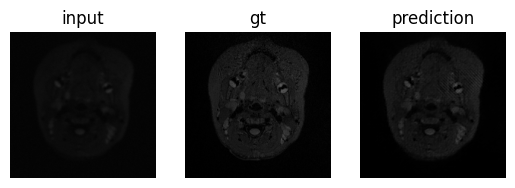

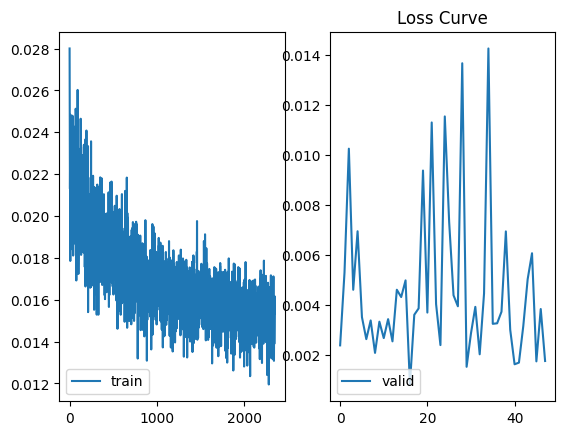

20it [00:02,  9.91it/s]


Epoch 2352, Loss: 0.015168852591887116


20it [00:02,  9.98it/s]


Epoch 2353, Loss: 0.014000298501923681


20it [00:01, 10.25it/s]


Epoch 2354, Loss: 0.015639454615302383


20it [00:02,  9.83it/s]


Epoch 2355, Loss: 0.01487366403453052


20it [00:01, 10.00it/s]


Epoch 2356, Loss: 0.01608843735884875


20it [00:01, 10.25it/s]


Epoch 2357, Loss: 0.015173132065683603


20it [00:01, 10.25it/s]


Epoch 2358, Loss: 0.015057562687434255


20it [00:02,  9.92it/s]


Epoch 2359, Loss: 0.015486912801861763


20it [00:01, 10.08it/s]


Epoch 2360, Loss: 0.016623204620555044


20it [00:01, 10.09it/s]


Epoch 2361, Loss: 0.014822030870709569


20it [00:01, 10.22it/s]


Epoch 2362, Loss: 0.016641541756689547


20it [00:02,  9.94it/s]


Epoch 2363, Loss: 0.015228981501422822


20it [00:01, 10.11it/s]


Epoch 2364, Loss: 0.015422269701957703


20it [00:01, 10.11it/s]


Epoch 2365, Loss: 0.014881783770397306


20it [00:02,  9.44it/s]


Epoch 2366, Loss: 0.016180568863637744


20it [00:02,  9.85it/s]


Epoch 2367, Loss: 0.016734157176688313


20it [00:01, 10.14it/s]


Epoch 2368, Loss: 0.016527664079330862


20it [00:02,  9.97it/s]


Epoch 2369, Loss: 0.019083604542538525


20it [00:02,  9.91it/s]


Epoch 2370, Loss: 0.015481407172046602


20it [00:01, 10.17it/s]


Epoch 2371, Loss: 0.015526562742888928


20it [00:02,  9.93it/s]


Epoch 2372, Loss: 0.017513345833867787


20it [00:01, 10.15it/s]


Epoch 2373, Loss: 0.017079441575333476


20it [00:01, 10.11it/s]


Epoch 2374, Loss: 0.016437795129604638


20it [00:01, 10.07it/s]


Epoch 2375, Loss: 0.01573317339643836


20it [00:02,  9.34it/s]


Epoch 2376, Loss: 0.017023512930609285


20it [00:02,  9.95it/s]


Epoch 2377, Loss: 0.01417635816615075


20it [00:01, 10.50it/s]


Epoch 2378, Loss: 0.013475768512580543


20it [00:01, 10.34it/s]


Epoch 2379, Loss: 0.016172928269952536


20it [00:02,  9.94it/s]


Epoch 2380, Loss: 0.017018114356324075


20it [00:02,  9.88it/s]


Epoch 2381, Loss: 0.015983549342490733


20it [00:02,  9.70it/s]


Epoch 2382, Loss: 0.014777239901013673


20it [00:01, 10.08it/s]


Epoch 2383, Loss: 0.015940431575290858


20it [00:01, 10.11it/s]


Epoch 2384, Loss: 0.015796512342058124


20it [00:01, 10.11it/s]


Epoch 2385, Loss: 0.014872669288888574


20it [00:02,  9.58it/s]


Epoch 2386, Loss: 0.014789882325567305


20it [00:02,  9.88it/s]


Epoch 2387, Loss: 0.015578157408162952


20it [00:01, 10.26it/s]


Epoch 2388, Loss: 0.01471244851127267


20it [00:01, 10.03it/s]


Epoch 2389, Loss: 0.015744114364497363


20it [00:01, 10.18it/s]


Epoch 2390, Loss: 0.014195721596479416


20it [00:02,  9.99it/s]


Epoch 2391, Loss: 0.01512757792370394


20it [00:02,  9.99it/s]


Epoch 2392, Loss: 0.016298740170896053


20it [00:01, 10.01it/s]


Epoch 2393, Loss: 0.015885579795576633


20it [00:01, 10.35it/s]


Epoch 2394, Loss: 0.015054229996167123


20it [00:01, 10.24it/s]


Epoch 2395, Loss: 0.015007750759832562


20it [00:02,  9.97it/s]


Epoch 2396, Loss: 0.01638613233808428


20it [00:01, 10.20it/s]


Epoch 2397, Loss: 0.014269665419124066


20it [00:02,  9.82it/s]


Epoch 2398, Loss: 0.015900827897712588


20it [00:02,  9.90it/s]


Epoch 2399, Loss: 0.014096178230829537


20it [00:01, 10.24it/s]


Epoch 2400, Loss: 0.014666166924871504


20it [00:01, 10.03it/s]

Epoch 2401, Loss: 0.015401403862051665



4it [00:00, 10.56it/s]


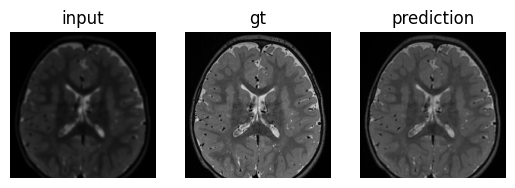

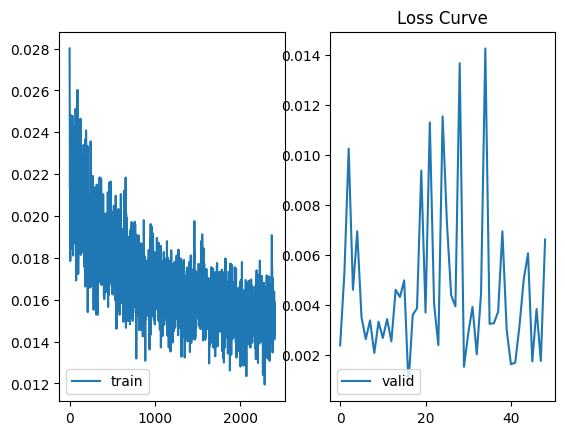

20it [00:01, 10.07it/s]


Epoch 2402, Loss: 0.014414423541165889


20it [00:01, 10.20it/s]


Epoch 2403, Loss: 0.016283729090355338


20it [00:01, 10.08it/s]


Epoch 2404, Loss: 0.012781643215566874


20it [00:01, 10.75it/s]


Epoch 2405, Loss: 0.014299770537763833


20it [00:01, 10.00it/s]


Epoch 2406, Loss: 0.01500157795380801


20it [00:02,  9.60it/s]


Epoch 2407, Loss: 0.013586916425265372


20it [00:01, 10.27it/s]


Epoch 2408, Loss: 0.014365520351566375


20it [00:01, 10.24it/s]


Epoch 2409, Loss: 0.015558651741594076


20it [00:02,  9.88it/s]


Epoch 2410, Loss: 0.014994662639219314


20it [00:02,  9.97it/s]


Epoch 2411, Loss: 0.015581390308216213


20it [00:02,  9.91it/s]


Epoch 2412, Loss: 0.015537525597028434


20it [00:01, 10.29it/s]


Epoch 2413, Loss: 0.015674204821698366


20it [00:01, 10.46it/s]


Epoch 2414, Loss: 0.014742527320049704


20it [00:01, 10.09it/s]


Epoch 2415, Loss: 0.014238658966496587


20it [00:02,  9.77it/s]


Epoch 2416, Loss: 0.014038373436778783


20it [00:02,  9.51it/s]


Epoch 2417, Loss: 0.016120157716795803


20it [00:01, 10.43it/s]


Epoch 2418, Loss: 0.015219388250261544


20it [00:01, 10.78it/s]


Epoch 2419, Loss: 0.013712911948096007


20it [00:01, 10.16it/s]


Epoch 2420, Loss: 0.014187049656175076


20it [00:01, 10.23it/s]


Epoch 2421, Loss: 0.01424566749483347


20it [00:01, 10.06it/s]


Epoch 2422, Loss: 0.01652745991013944


20it [00:01, 10.00it/s]


Epoch 2423, Loss: 0.015147318062372506


20it [00:02,  9.74it/s]


Epoch 2424, Loss: 0.014826391264796257


20it [00:01, 10.12it/s]


Epoch 2425, Loss: 0.014902936259750277


20it [00:02,  9.87it/s]


Epoch 2426, Loss: 0.01590746161527932


20it [00:01, 10.12it/s]


Epoch 2427, Loss: 0.0157860494684428


20it [00:02,  9.75it/s]


Epoch 2428, Loss: 0.01368986803572625


20it [00:01, 10.10it/s]


Epoch 2429, Loss: 0.015581088606268167


20it [00:01, 10.13it/s]


Epoch 2430, Loss: 0.015391951892524958


20it [00:01, 10.04it/s]


Epoch 2431, Loss: 0.014951859670691191


20it [00:01, 10.40it/s]


Epoch 2432, Loss: 0.016309943981468678


20it [00:02,  9.99it/s]


Epoch 2433, Loss: 0.013961033965460955


20it [00:01, 10.07it/s]


Epoch 2434, Loss: 0.013412443734705449


20it [00:01, 10.29it/s]


Epoch 2435, Loss: 0.01465793113457039


20it [00:01, 10.19it/s]


Epoch 2436, Loss: 0.015412377682514489


20it [00:01, 10.38it/s]


Epoch 2437, Loss: 0.014806524477899074


20it [00:02,  9.84it/s]


Epoch 2438, Loss: 0.014718654996249825


20it [00:01, 10.03it/s]


Epoch 2439, Loss: 0.016523378086276352


20it [00:02, 10.00it/s]


Epoch 2440, Loss: 0.015215254831127822


20it [00:01, 10.02it/s]


Epoch 2441, Loss: 0.01399232066469267


20it [00:01, 10.42it/s]


Epoch 2442, Loss: 0.016442313557490706


20it [00:02,  9.80it/s]


Epoch 2443, Loss: 0.01632914659567177


20it [00:02,  9.90it/s]


Epoch 2444, Loss: 0.01337614415679127


20it [00:01, 10.02it/s]


Epoch 2445, Loss: 0.0164005484781228


20it [00:01, 10.17it/s]


Epoch 2446, Loss: 0.015893826726824045


20it [00:01, 10.08it/s]


Epoch 2447, Loss: 0.01326689710840583


20it [00:02,  9.76it/s]


Epoch 2448, Loss: 0.015674334357026965


20it [00:02,  9.84it/s]


Epoch 2449, Loss: 0.014767029427457602


20it [00:01, 10.61it/s]


Epoch 2450, Loss: 0.014771838975138962


20it [00:02,  9.91it/s]

Epoch 2451, Loss: 0.014576305588707327



4it [00:00,  9.80it/s]


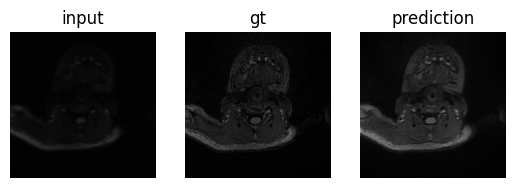

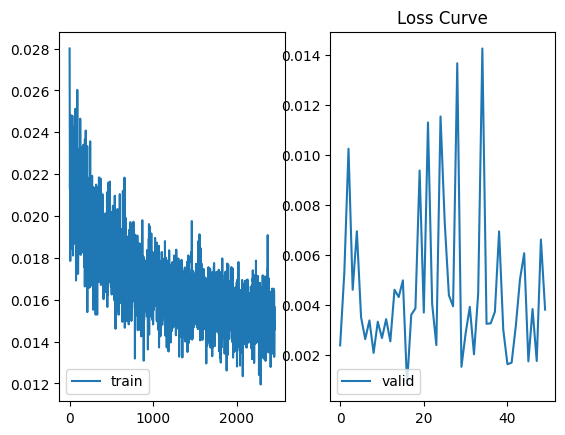

20it [00:01, 10.47it/s]


Epoch 2452, Loss: 0.01571620583999902


20it [00:02,  9.93it/s]


Epoch 2453, Loss: 0.01436594461556524


20it [00:01, 10.13it/s]


Epoch 2454, Loss: 0.01346481778891757


20it [00:01, 10.31it/s]


Epoch 2455, Loss: 0.014554771524854005


20it [00:02,  9.80it/s]


Epoch 2456, Loss: 0.015632439544424413


20it [00:02,  9.54it/s]


Epoch 2457, Loss: 0.015028801467269658


20it [00:01, 10.15it/s]


Epoch 2458, Loss: 0.014692375320009887


20it [00:01, 10.51it/s]


Epoch 2459, Loss: 0.015777991618961096


20it [00:01, 10.07it/s]


Epoch 2460, Loss: 0.014024645858444273


20it [00:01, 10.08it/s]


Epoch 2461, Loss: 0.013115851627662777


20it [00:02,  9.93it/s]


Epoch 2462, Loss: 0.015898253326304256


20it [00:01, 10.28it/s]


Epoch 2463, Loss: 0.01577632746193558


20it [00:02,  9.83it/s]


Epoch 2464, Loss: 0.014334903098642826


20it [00:02,  9.86it/s]


Epoch 2465, Loss: 0.01633524368517101


20it [00:01, 10.01it/s]


Epoch 2466, Loss: 0.01419132025912404


20it [00:01, 10.13it/s]


Epoch 2467, Loss: 0.015217286860570311


20it [00:02,  9.50it/s]


Epoch 2468, Loss: 0.01386959464289248


20it [00:01, 10.16it/s]


Epoch 2469, Loss: 0.015125932544469834


20it [00:01, 10.31it/s]


Epoch 2470, Loss: 0.014894206204917281


20it [00:01, 10.11it/s]


Epoch 2471, Loss: 0.014389608358033


20it [00:01, 10.53it/s]


Epoch 2472, Loss: 0.013784298929385841


20it [00:01, 10.35it/s]


Epoch 2473, Loss: 0.012892490974627436


20it [00:02,  9.95it/s]


Epoch 2474, Loss: 0.014657528838142753


20it [00:01, 10.03it/s]


Epoch 2475, Loss: 0.016834434354677796


20it [00:01, 10.14it/s]


Epoch 2476, Loss: 0.014652272476814688


20it [00:01, 10.43it/s]


Epoch 2477, Loss: 0.013727635354734957


20it [00:02,  9.55it/s]


Epoch 2478, Loss: 0.015963095077313482


20it [00:02,  9.96it/s]


Epoch 2479, Loss: 0.01530992710031569


20it [00:01, 10.12it/s]


Epoch 2480, Loss: 0.01631263424642384


20it [00:01, 10.06it/s]


Epoch 2481, Loss: 0.015543490275740623


20it [00:01, 10.07it/s]


Epoch 2482, Loss: 0.01661836209241301


20it [00:02,  9.86it/s]


Epoch 2483, Loss: 0.01724135144613683


20it [00:01, 10.13it/s]


Epoch 2484, Loss: 0.015663212828803806


20it [00:01, 10.50it/s]


Epoch 2485, Loss: 0.01705211077351123


20it [00:01, 10.08it/s]


Epoch 2486, Loss: 0.015647961432114242


20it [00:02,  9.93it/s]


Epoch 2487, Loss: 0.01534097280818969


20it [00:02,  9.27it/s]


Epoch 2488, Loss: 0.014949736429844051


20it [00:01, 10.32it/s]


Epoch 2489, Loss: 0.015366352349519729


20it [00:01, 10.05it/s]


Epoch 2490, Loss: 0.013678499206434935


20it [00:01, 10.06it/s]


Epoch 2491, Loss: 0.015480749122798444


20it [00:02,  9.93it/s]


Epoch 2492, Loss: 0.01725475797429681


20it [00:01, 10.15it/s]


Epoch 2493, Loss: 0.015185225429013372


20it [00:01, 10.13it/s]


Epoch 2494, Loss: 0.015437622391618788


20it [00:01, 10.18it/s]


Epoch 2495, Loss: 0.016057027131319047


20it [00:01, 10.51it/s]


Epoch 2496, Loss: 0.015555006056092679


20it [00:01, 10.34it/s]


Epoch 2497, Loss: 0.016374112316407265


20it [00:02,  9.59it/s]


Epoch 2498, Loss: 0.015493153082206845


20it [00:01, 10.16it/s]


Epoch 2499, Loss: 0.012689576647244395


20it [00:01, 10.02it/s]


Epoch 2500, Loss: 0.014619380503427237


20it [00:01, 10.20it/s]

Epoch 2501, Loss: 0.014187747251708061



4it [00:00, 10.26it/s]


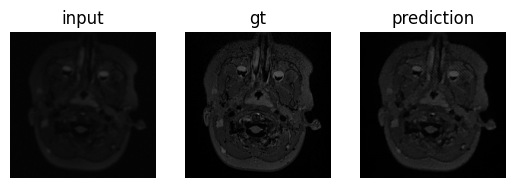

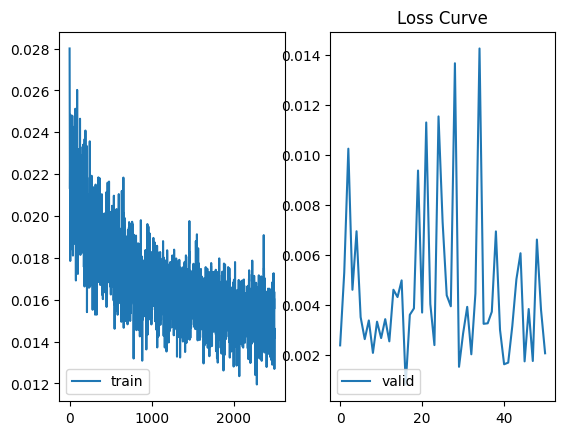

20it [00:01, 10.13it/s]


Epoch 2502, Loss: 0.016022818442434073


20it [00:01, 10.19it/s]


Epoch 2503, Loss: 0.01439320300705731


20it [00:02,  9.83it/s]


Epoch 2504, Loss: 0.01606840663589537


20it [00:02,  9.96it/s]


Epoch 2505, Loss: 0.01524943085387349


20it [00:01, 10.04it/s]


Epoch 2506, Loss: 0.014585630223155021


20it [00:02,  9.45it/s]


Epoch 2507, Loss: 0.015449395822361111


20it [00:01, 10.20it/s]


Epoch 2508, Loss: 0.014638309297151864


20it [00:01, 10.04it/s]


Epoch 2509, Loss: 0.015857502073049545


20it [00:02,  9.97it/s]


Epoch 2510, Loss: 0.01650923197157681


20it [00:01, 10.07it/s]


Epoch 2511, Loss: 0.015227291639894247


20it [00:01, 10.11it/s]


Epoch 2512, Loss: 0.015639915224164726


20it [00:01, 10.39it/s]


Epoch 2513, Loss: 0.015345369116403162


20it [00:01, 10.31it/s]


Epoch 2514, Loss: 0.014093399024568498


20it [00:01, 10.09it/s]


Epoch 2515, Loss: 0.015538708213716746


20it [00:01, 10.09it/s]


Epoch 2516, Loss: 0.015402484405785798


20it [00:02,  9.37it/s]


Epoch 2517, Loss: 0.01679885881021619


20it [00:01, 10.17it/s]


Epoch 2518, Loss: 0.015515182248782367


20it [00:01, 10.06it/s]


Epoch 2519, Loss: 0.016642109723761678


20it [00:01, 10.19it/s]


Epoch 2520, Loss: 0.0165966265136376


20it [00:01, 10.17it/s]


Epoch 2521, Loss: 0.014151597197633236


20it [00:01, 10.23it/s]


Epoch 2522, Loss: 0.014780308399349452


20it [00:02,  9.78it/s]


Epoch 2523, Loss: 0.016243914188817144


20it [00:01, 10.16it/s]


Epoch 2524, Loss: 0.01312816763529554


20it [00:01, 10.28it/s]


Epoch 2525, Loss: 0.015703823254443704


20it [00:01, 10.14it/s]


Epoch 2526, Loss: 0.015855920035392046


20it [00:01, 10.14it/s]


Epoch 2527, Loss: 0.014383183396421372


20it [00:01, 10.25it/s]


Epoch 2528, Loss: 0.015272332599852233


20it [00:02,  9.70it/s]


Epoch 2529, Loss: 0.015335232997313143


20it [00:02,  9.86it/s]


Epoch 2530, Loss: 0.016259731049649416


20it [00:01, 10.17it/s]


Epoch 2531, Loss: 0.015173350786790251


20it [00:01, 10.00it/s]


Epoch 2532, Loss: 0.01403966739308089


20it [00:01, 10.20it/s]


Epoch 2533, Loss: 0.015088658430613577


20it [00:01, 10.04it/s]


Epoch 2534, Loss: 0.014219618588685989


20it [00:01, 10.17it/s]


Epoch 2535, Loss: 0.014003805024549365


20it [00:02,  9.67it/s]


Epoch 2536, Loss: 0.015312446677125991


20it [00:01, 10.11it/s]


Epoch 2537, Loss: 0.013102344004437327


20it [00:01, 10.04it/s]


Epoch 2538, Loss: 0.015465487458277494


20it [00:01, 10.10it/s]


Epoch 2539, Loss: 0.013610352098476141


20it [00:02,  9.52it/s]


Epoch 2540, Loss: 0.01411389394197613


20it [00:01, 10.37it/s]


Epoch 2541, Loss: 0.014777816319838166


20it [00:01, 10.37it/s]


Epoch 2542, Loss: 0.016613666154444217


20it [00:01, 10.13it/s]


Epoch 2543, Loss: 0.016433718823827805


20it [00:01, 10.03it/s]


Epoch 2544, Loss: 0.014906352036632597


20it [00:01, 10.42it/s]


Epoch 2545, Loss: 0.015571336657740176


20it [00:01, 10.18it/s]


Epoch 2546, Loss: 0.014240830903872848


20it [00:01, 10.07it/s]


Epoch 2547, Loss: 0.015249983209650963


20it [00:02,  9.95it/s]


Epoch 2548, Loss: 0.014511358295567333


20it [00:01, 10.19it/s]


Epoch 2549, Loss: 0.014149305608589203


20it [00:02,  9.79it/s]


Epoch 2550, Loss: 0.015612580999732017


20it [00:02,  9.52it/s]

Epoch 2551, Loss: 0.016280069807544352



4it [00:00,  9.87it/s]


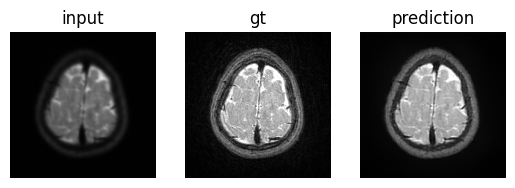

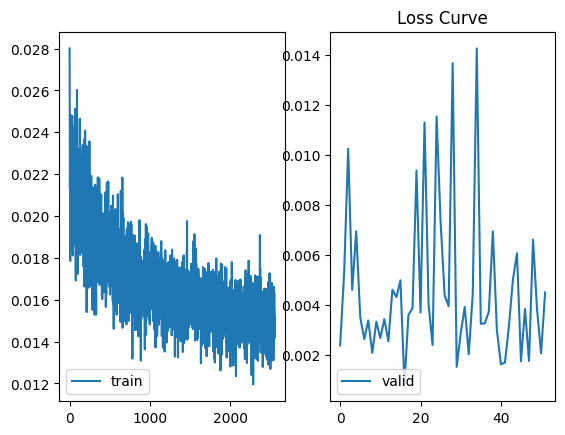

20it [00:02,  9.73it/s]


Epoch 2552, Loss: 0.0149527971399948


20it [00:01, 10.14it/s]


Epoch 2553, Loss: 0.013970239774789662


20it [00:02,  9.90it/s]


Epoch 2554, Loss: 0.015099518757779151


20it [00:01, 10.09it/s]


Epoch 2555, Loss: 0.015884918719530107


20it [00:01, 10.07it/s]


Epoch 2556, Loss: 0.013987119635567069


20it [00:01, 10.20it/s]


Epoch 2557, Loss: 0.014651427057106047


20it [00:01, 10.26it/s]


Epoch 2558, Loss: 0.014693665085360408


20it [00:01, 10.16it/s]


Epoch 2559, Loss: 0.014986888319253922


20it [00:02,  9.42it/s]


Epoch 2560, Loss: 0.015476003661751747


20it [00:01, 10.11it/s]


Epoch 2561, Loss: 0.01622277528513223


20it [00:01, 10.35it/s]


Epoch 2562, Loss: 0.015325144492089748


20it [00:02,  9.80it/s]


Epoch 2563, Loss: 0.014108197705354542


20it [00:02,  9.96it/s]


Epoch 2564, Loss: 0.015117417112924159


20it [00:01, 10.21it/s]


Epoch 2565, Loss: 0.015533143375068902


20it [00:01, 10.40it/s]


Epoch 2566, Loss: 0.015427923691459


20it [00:01, 10.03it/s]


Epoch 2567, Loss: 0.014673163590487093


20it [00:01, 10.21it/s]


Epoch 2568, Loss: 0.014748691662680358


20it [00:01, 10.17it/s]


Epoch 2569, Loss: 0.01735877913888544


20it [00:02,  9.70it/s]


Epoch 2570, Loss: 0.014597419160418212


20it [00:01, 10.26it/s]


Epoch 2571, Loss: 0.014363520918413997


20it [00:01, 10.47it/s]


Epoch 2572, Loss: 0.01558229506481439


20it [00:01, 10.13it/s]


Epoch 2573, Loss: 0.01381820640526712


20it [00:01, 10.44it/s]


Epoch 2574, Loss: 0.01607283072080463


20it [00:02,  9.79it/s]


Epoch 2575, Loss: 0.01690390631556511


20it [00:01, 10.10it/s]


Epoch 2576, Loss: 0.015141422557644547


20it [00:01, 10.37it/s]


Epoch 2577, Loss: 0.014865562249906362


20it [00:02,  9.95it/s]


Epoch 2578, Loss: 0.015064393728971481


20it [00:02,  9.97it/s]


Epoch 2579, Loss: 0.015458660782314837


20it [00:02,  9.36it/s]


Epoch 2580, Loss: 0.01446000875439495


20it [00:01, 10.05it/s]


Epoch 2581, Loss: 0.01667310521006584


20it [00:02,  9.86it/s]


Epoch 2582, Loss: 0.014287162199616432


20it [00:02,  9.93it/s]


Epoch 2583, Loss: 0.014704550802707671


20it [00:01, 10.06it/s]


Epoch 2584, Loss: 0.013934195972979069


20it [00:01, 10.27it/s]


Epoch 2585, Loss: 0.015581210469827056


20it [00:02,  9.97it/s]


Epoch 2586, Loss: 0.014823477482423186


20it [00:01, 10.23it/s]


Epoch 2587, Loss: 0.015722034429199994


20it [00:02,  9.89it/s]


Epoch 2588, Loss: 0.014012784231454134


20it [00:02,  9.99it/s]


Epoch 2589, Loss: 0.014357753633521497


20it [00:02,  9.90it/s]


Epoch 2590, Loss: 0.014487099542748183


20it [00:01, 10.13it/s]


Epoch 2591, Loss: 0.01622910681180656


20it [00:02,  9.54it/s]


Epoch 2592, Loss: 0.01431560912169516


20it [00:01, 10.35it/s]


Epoch 2593, Loss: 0.015042382164392621


20it [00:01, 10.12it/s]


Epoch 2594, Loss: 0.01615404156036675


20it [00:02,  9.98it/s]


Epoch 2595, Loss: 0.015384045895189047


20it [00:02,  9.93it/s]


Epoch 2596, Loss: 0.01384517183760181


20it [00:02,  9.91it/s]


Epoch 2597, Loss: 0.014097947860136628


20it [00:01, 10.52it/s]


Epoch 2598, Loss: 0.015572953061200679


20it [00:02,  9.94it/s]


Epoch 2599, Loss: 0.013626126293092965


20it [00:02,  9.93it/s]


Epoch 2600, Loss: 0.01544244282413274


20it [00:01, 10.03it/s]

Epoch 2601, Loss: 0.015547141712158919



4it [00:00, 10.61it/s]


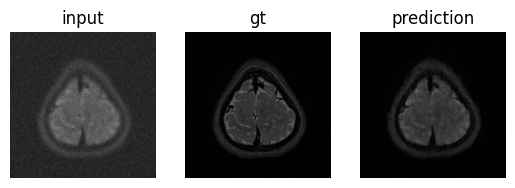

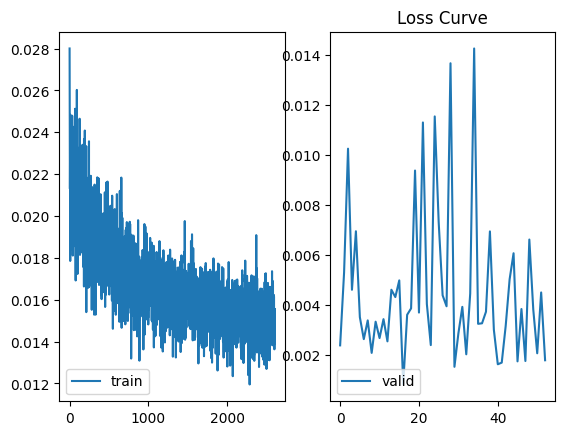

20it [00:02,  9.39it/s]


Epoch 2602, Loss: 0.015335866482928395


20it [00:01, 10.60it/s]


Epoch 2603, Loss: 0.015102262643631547


20it [00:01, 10.02it/s]


Epoch 2604, Loss: 0.016017086314968766


20it [00:01, 10.38it/s]


Epoch 2605, Loss: 0.015436985506676137


20it [00:01, 10.15it/s]


Epoch 2606, Loss: 0.015927806845866144


20it [00:01, 10.12it/s]


Epoch 2607, Loss: 0.01448384711984545


20it [00:01, 10.42it/s]


Epoch 2608, Loss: 0.015621301159262658


20it [00:01, 10.20it/s]


Epoch 2609, Loss: 0.01621615297626704


20it [00:01, 10.15it/s]


Epoch 2610, Loss: 0.015107887389604002


20it [00:02,  9.98it/s]


Epoch 2611, Loss: 0.015310225263237952


20it [00:02,  9.72it/s]


Epoch 2612, Loss: 0.015548857231624424


20it [00:01, 10.32it/s]


Epoch 2613, Loss: 0.01543022075202316


20it [00:01, 10.15it/s]


Epoch 2614, Loss: 0.015416721848305314


20it [00:02,  9.99it/s]


Epoch 2615, Loss: 0.015423615626059473


20it [00:01, 10.27it/s]


Epoch 2616, Loss: 0.013867817842401564


20it [00:02,  9.80it/s]


Epoch 2617, Loss: 0.013332808413542807


20it [00:01, 10.19it/s]


Epoch 2618, Loss: 0.015446975931990892


20it [00:01, 10.41it/s]


Epoch 2619, Loss: 0.014753166167065502


20it [00:02,  9.86it/s]


Epoch 2620, Loss: 0.01495248160790652


20it [00:02,  9.64it/s]


Epoch 2621, Loss: 0.014765469520352782


20it [00:01, 10.04it/s]


Epoch 2622, Loss: 0.014757574838586151


20it [00:02,  9.23it/s]


Epoch 2623, Loss: 0.015741708083078267


20it [00:02,  9.97it/s]


Epoch 2624, Loss: 0.016221359185874463


20it [00:01, 10.11it/s]


Epoch 2625, Loss: 0.014945062960032373


20it [00:01, 10.17it/s]


Epoch 2626, Loss: 0.016423572530038656


20it [00:01, 10.09it/s]


Epoch 2627, Loss: 0.01628849155968055


20it [00:01, 10.14it/s]


Epoch 2628, Loss: 0.013938615634106099


20it [00:01, 10.01it/s]


Epoch 2629, Loss: 0.015179506014101207


20it [00:01, 10.19it/s]


Epoch 2630, Loss: 0.01538347479654476


20it [00:01, 10.43it/s]


Epoch 2631, Loss: 0.016083223721943797


20it [00:02,  9.98it/s]


Epoch 2632, Loss: 0.015207708138041199


20it [00:02,  9.70it/s]


Epoch 2633, Loss: 0.014392620418220758


20it [00:01, 10.01it/s]


Epoch 2634, Loss: 0.015644953539595007


20it [00:01, 10.16it/s]


Epoch 2635, Loss: 0.015210424503311514


20it [00:02,  9.91it/s]


Epoch 2636, Loss: 0.015471560833975672


20it [00:02,  9.85it/s]


Epoch 2637, Loss: 0.014894540724344551


20it [00:01, 10.13it/s]


Epoch 2638, Loss: 0.01503626147750765


20it [00:01, 10.26it/s]


Epoch 2639, Loss: 0.014415976079180836


20it [00:01, 10.12it/s]


Epoch 2640, Loss: 0.015166183398105205


20it [00:01, 10.40it/s]


Epoch 2641, Loss: 0.014769199979491532


20it [00:01, 10.11it/s]


Epoch 2642, Loss: 0.014038105832878501


20it [00:02,  9.79it/s]


Epoch 2643, Loss: 0.015609214501455426


20it [00:01, 10.49it/s]


Epoch 2644, Loss: 0.015565197065006942


20it [00:02,  9.50it/s]


Epoch 2645, Loss: 0.015592647134326398


20it [00:01, 10.07it/s]


Epoch 2646, Loss: 0.014793905999977142


20it [00:01, 10.09it/s]


Epoch 2647, Loss: 0.016460390761494637


20it [00:02,  9.86it/s]


Epoch 2648, Loss: 0.015147499251179397


20it [00:01, 10.33it/s]


Epoch 2649, Loss: 0.015388939552940429


20it [00:02,  9.90it/s]


Epoch 2650, Loss: 0.014561441645491868


20it [00:01, 10.17it/s]

Epoch 2651, Loss: 0.014678492222446948



4it [00:00,  9.73it/s]


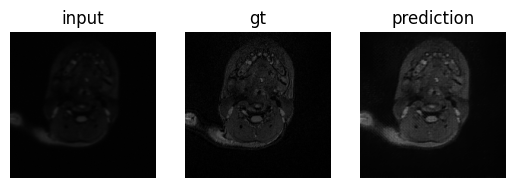

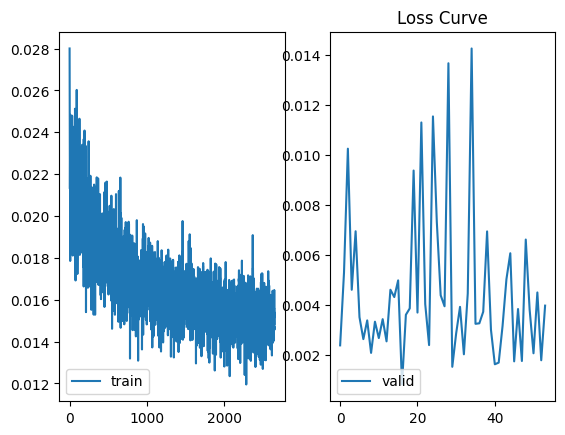

20it [00:02,  9.96it/s]


Epoch 2652, Loss: 0.014514415804296733


20it [00:01, 10.02it/s]


Epoch 2653, Loss: 0.013698368775658309


20it [00:02,  9.56it/s]


Epoch 2654, Loss: 0.016277150181122125


20it [00:01, 10.03it/s]


Epoch 2655, Loss: 0.01562949737999588


20it [00:02,  9.95it/s]


Epoch 2656, Loss: 0.014548064791597426


20it [00:01, 10.41it/s]


Epoch 2657, Loss: 0.015705025778152047


20it [00:02,  9.95it/s]


Epoch 2658, Loss: 0.015937108220532535


20it [00:01, 10.29it/s]


Epoch 2659, Loss: 0.015995718259364366


20it [00:02,  9.89it/s]


Epoch 2660, Loss: 0.01479283788939938


20it [00:01, 10.24it/s]


Epoch 2661, Loss: 0.016249661380425096


20it [00:01, 10.21it/s]


Epoch 2662, Loss: 0.01424410919426009


20it [00:01, 10.57it/s]


Epoch 2663, Loss: 0.015346782258711755


20it [00:02,  9.78it/s]


Epoch 2664, Loss: 0.014950285386294126


20it [00:01, 10.37it/s]


Epoch 2665, Loss: 0.013364659645594657


20it [00:02,  9.97it/s]


Epoch 2666, Loss: 0.015509056579321622


20it [00:01, 10.01it/s]


Epoch 2667, Loss: 0.013835075811948627


20it [00:02,  9.79it/s]


Epoch 2668, Loss: 0.015306623093783856


20it [00:01, 10.26it/s]


Epoch 2669, Loss: 0.015176139492541551


20it [00:01, 10.21it/s]


Epoch 2670, Loss: 0.012988691416103393


20it [00:01, 10.35it/s]


Epoch 2671, Loss: 0.01594473570585251


20it [00:01, 10.32it/s]


Epoch 2672, Loss: 0.014694589260034262


20it [00:01, 10.28it/s]


Epoch 2673, Loss: 0.015045738127082587


20it [00:02,  9.98it/s]


Epoch 2674, Loss: 0.013644292159006


20it [00:02,  9.91it/s]


Epoch 2675, Loss: 0.01607351899147034


20it [00:02,  9.51it/s]


Epoch 2676, Loss: 0.014648876013234257


20it [00:01, 10.47it/s]


Epoch 2677, Loss: 0.014951573021244257


20it [00:02,  9.91it/s]


Epoch 2678, Loss: 0.014905245718546211


20it [00:01, 10.19it/s]


Epoch 2679, Loss: 0.013164914725348354


20it [00:01, 10.05it/s]


Epoch 2680, Loss: 0.014996392757166178


20it [00:01, 10.06it/s]


Epoch 2681, Loss: 0.0157097710063681


20it [00:01, 10.21it/s]


Epoch 2682, Loss: 0.013906282046809793


20it [00:02,  9.94it/s]


Epoch 2683, Loss: 0.015508983051404357


20it [00:01, 10.22it/s]


Epoch 2684, Loss: 0.014280972396954894


20it [00:01, 10.53it/s]


Epoch 2685, Loss: 0.014847868494689465


20it [00:01, 10.00it/s]


Epoch 2686, Loss: 0.014981098822318017


20it [00:02,  9.55it/s]


Epoch 2687, Loss: 0.015483472403138876


20it [00:02,  9.78it/s]


Epoch 2688, Loss: 0.014014462649356574


20it [00:02,  9.85it/s]


Epoch 2689, Loss: 0.014607503823935986


20it [00:02,  9.92it/s]


Epoch 2690, Loss: 0.013626119389664381


20it [00:01, 10.04it/s]


Epoch 2691, Loss: 0.014942781801801175


20it [00:01, 10.05it/s]


Epoch 2692, Loss: 0.01368133119540289


20it [00:01, 10.03it/s]


Epoch 2693, Loss: 0.016491209110245108


20it [00:01, 10.10it/s]


Epoch 2694, Loss: 0.015878076292574407


20it [00:01, 10.15it/s]


Epoch 2695, Loss: 0.013657324609812348


20it [00:01, 10.51it/s]


Epoch 2696, Loss: 0.014689153502695262


20it [00:01, 10.26it/s]


Epoch 2697, Loss: 0.013324006285984069


20it [00:02,  9.45it/s]


Epoch 2698, Loss: 0.014906157949008047


20it [00:01, 10.01it/s]


Epoch 2699, Loss: 0.015470868721604348


20it [00:01, 10.05it/s]


Epoch 2700, Loss: 0.015968099841848014


20it [00:01, 10.38it/s]

Epoch 2701, Loss: 0.013205440901219844



4it [00:00, 10.35it/s]


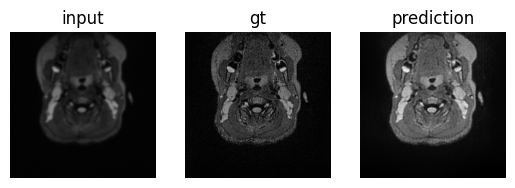

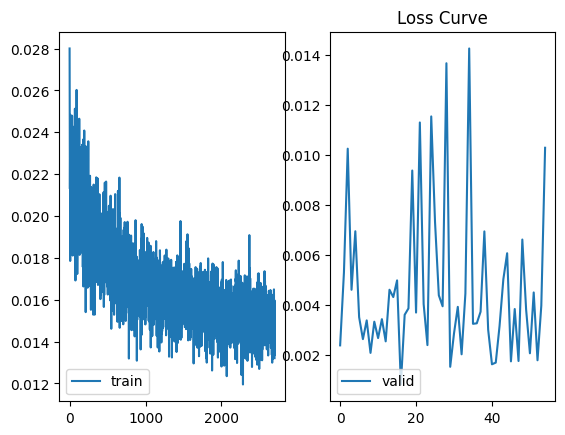

20it [00:02,  9.93it/s]


Epoch 2702, Loss: 0.014692610932979733


20it [00:02,  9.81it/s]


Epoch 2703, Loss: 0.01528238132596016


20it [00:01, 10.16it/s]


Epoch 2704, Loss: 0.01467595852445811


20it [00:02,  9.75it/s]


Epoch 2705, Loss: 0.015030856500379742


20it [00:01, 10.08it/s]


Epoch 2706, Loss: 0.01463295336579904


20it [00:01, 10.32it/s]


Epoch 2707, Loss: 0.01563340544234961


20it [00:02,  9.60it/s]


Epoch 2708, Loss: 0.01591264856979251


20it [00:01, 10.01it/s]


Epoch 2709, Loss: 0.015441556426230818


20it [00:01, 10.24it/s]


Epoch 2710, Loss: 0.01578005254268646


20it [00:01, 10.08it/s]


Epoch 2711, Loss: 0.014761788048781454


20it [00:02,  9.92it/s]


Epoch 2712, Loss: 0.015432887361384928


20it [00:01, 10.23it/s]


Epoch 2713, Loss: 0.014895391487516462


20it [00:01, 10.31it/s]


Epoch 2714, Loss: 0.013401123927906156


20it [00:01, 10.21it/s]


Epoch 2715, Loss: 0.015687932609580457


20it [00:01, 10.24it/s]


Epoch 2716, Loss: 0.016250921553000806


20it [00:02,  9.92it/s]


Epoch 2717, Loss: 0.015366527787409722


20it [00:02,  9.87it/s]


Epoch 2718, Loss: 0.014074184536002576


20it [00:02,  9.51it/s]


Epoch 2719, Loss: 0.015319426218047738


20it [00:01, 10.40it/s]


Epoch 2720, Loss: 0.014544319501146675


20it [00:01, 10.38it/s]


Epoch 2721, Loss: 0.01616387483663857


20it [00:01, 10.33it/s]


Epoch 2722, Loss: 0.01493627664167434


20it [00:01, 10.36it/s]


Epoch 2723, Loss: 0.015407567843794823


20it [00:02,  9.95it/s]


Epoch 2724, Loss: 0.015311989164911211


20it [00:01, 10.41it/s]


Epoch 2725, Loss: 0.016039037564769387


20it [00:01, 10.12it/s]


Epoch 2726, Loss: 0.015157656464725732


20it [00:01, 10.07it/s]


Epoch 2727, Loss: 0.015294230869039893


20it [00:01, 10.21it/s]


Epoch 2728, Loss: 0.015374438103754074


20it [00:02,  9.98it/s]


Epoch 2729, Loss: 0.015367180574685335


20it [00:02,  9.45it/s]


Epoch 2730, Loss: 0.01463272615801543


20it [00:01, 10.56it/s]


Epoch 2731, Loss: 0.0160231331596151


20it [00:02,  9.87it/s]


Epoch 2732, Loss: 0.015298481669742615


20it [00:01, 10.08it/s]


Epoch 2733, Loss: 0.014742783387191594


20it [00:02,  9.97it/s]


Epoch 2734, Loss: 0.0148563135182485


20it [00:01, 10.05it/s]


Epoch 2735, Loss: 0.015597619395703078


20it [00:02,  9.85it/s]


Epoch 2736, Loss: 0.014967029425315559


20it [00:02,  9.80it/s]


Epoch 2737, Loss: 0.014176031888928265


20it [00:01, 10.16it/s]


Epoch 2738, Loss: 0.01591963426908478


20it [00:01, 10.10it/s]


Epoch 2739, Loss: 0.015088978759013116


20it [00:01, 10.40it/s]


Epoch 2740, Loss: 0.01576154716312885


20it [00:02,  9.45it/s]


Epoch 2741, Loss: 0.015033386345021427


20it [00:02,  9.89it/s]


Epoch 2742, Loss: 0.013166707416530699


20it [00:01, 10.21it/s]


Epoch 2743, Loss: 0.015196252812165767


20it [00:01, 10.71it/s]


Epoch 2744, Loss: 0.015768495970405638


20it [00:01, 10.15it/s]


Epoch 2745, Loss: 0.015964616369456053


20it [00:02,  9.88it/s]


Epoch 2746, Loss: 0.01502217787783593


20it [00:01, 10.08it/s]


Epoch 2747, Loss: 0.01584097887389362


20it [00:02,  9.86it/s]


Epoch 2748, Loss: 0.01478274354012683


20it [00:01, 10.23it/s]


Epoch 2749, Loss: 0.014988248399458826


20it [00:02,  9.57it/s]


Epoch 2750, Loss: 0.015744926524348557


20it [00:01, 10.02it/s]

Epoch 2751, Loss: 0.012741775624454022



4it [00:00,  9.74it/s]


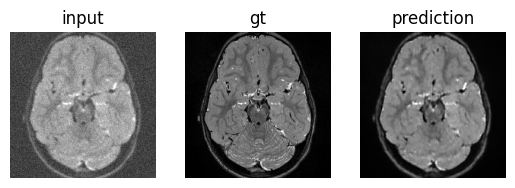

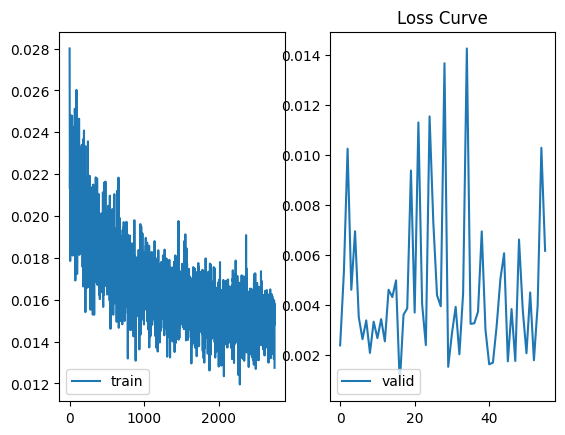

20it [00:01, 10.00it/s]


Epoch 2752, Loss: 0.013447144930250943


20it [00:01, 10.37it/s]


Epoch 2753, Loss: 0.014876194531098008


20it [00:02,  9.71it/s]


Epoch 2754, Loss: 0.014598137489520014


20it [00:02,  9.91it/s]


Epoch 2755, Loss: 0.014782155677676202


20it [00:01, 10.22it/s]


Epoch 2756, Loss: 0.015993794053792955


20it [00:02,  9.76it/s]


Epoch 2757, Loss: 0.015863131696823983


20it [00:01, 10.12it/s]


Epoch 2758, Loss: 0.01716297836974263


20it [00:01, 10.49it/s]


Epoch 2759, Loss: 0.012839376158080996


20it [00:02,  9.92it/s]


Epoch 2760, Loss: 0.01431262168334797


20it [00:01, 10.07it/s]


Epoch 2761, Loss: 0.014687616075389088


20it [00:02,  9.57it/s]


Epoch 2762, Loss: 0.015259296447038651


20it [00:01, 10.56it/s]


Epoch 2763, Loss: 0.015254071564413607


20it [00:01, 10.05it/s]


Epoch 2764, Loss: 0.012741302698850631


20it [00:02,  9.95it/s]


Epoch 2765, Loss: 0.01481269437354058


20it [00:02,  9.86it/s]


Epoch 2766, Loss: 0.015930236992426218


20it [00:01, 10.02it/s]


Epoch 2767, Loss: 0.0145991837605834


20it [00:01, 10.14it/s]


Epoch 2768, Loss: 0.015318649262189865


20it [00:02,  9.83it/s]


Epoch 2769, Loss: 0.015303072927054018


20it [00:02,  9.96it/s]


Epoch 2770, Loss: 0.014967829082161188


20it [00:01, 10.22it/s]


Epoch 2771, Loss: 0.0162472662050277


20it [00:01, 10.33it/s]


Epoch 2772, Loss: 0.013859342481009663


20it [00:02,  9.85it/s]


Epoch 2773, Loss: 0.01557152986060828


20it [00:01, 10.51it/s]


Epoch 2774, Loss: 0.014558488316833974


20it [00:01, 10.04it/s]


Epoch 2775, Loss: 0.016593036148697136


20it [00:01, 10.06it/s]


Epoch 2776, Loss: 0.015401917044073343


20it [00:02,  9.90it/s]


Epoch 2777, Loss: 0.014238655695226043


20it [00:02,  9.76it/s]


Epoch 2778, Loss: 0.014129314525052904


20it [00:01, 10.18it/s]


Epoch 2779, Loss: 0.015100887883454562


20it [00:01, 10.18it/s]


Epoch 2780, Loss: 0.01532861921004951


20it [00:01, 10.32it/s]


Epoch 2781, Loss: 0.015992234018631278


20it [00:01, 10.21it/s]


Epoch 2782, Loss: 0.015400177356787026


20it [00:01, 10.14it/s]


Epoch 2783, Loss: 0.01646354568656534


20it [00:02,  9.63it/s]


Epoch 2784, Loss: 0.014704151637852192


20it [00:01, 10.14it/s]


Epoch 2785, Loss: 0.015458602132275701


20it [00:01, 10.16it/s]


Epoch 2786, Loss: 0.016026769508607687


20it [00:02,  9.78it/s]


Epoch 2787, Loss: 0.014840871666092426


20it [00:01, 10.13it/s]


Epoch 2788, Loss: 0.01460616778349504


20it [00:01, 10.46it/s]


Epoch 2789, Loss: 0.014829764794558286


20it [00:01, 10.22it/s]


Epoch 2790, Loss: 0.015379545709583909


20it [00:01, 10.09it/s]


Epoch 2791, Loss: 0.014180581946857274


20it [00:01, 10.04it/s]


Epoch 2792, Loss: 0.014476549136452377


20it [00:01, 10.35it/s]


Epoch 2793, Loss: 0.01549540488049388


20it [00:02,  9.16it/s]


Epoch 2794, Loss: 0.01591034228913486


20it [00:01, 10.06it/s]


Epoch 2795, Loss: 0.015387700451537967


20it [00:01, 10.18it/s]


Epoch 2796, Loss: 0.01404971736483276


20it [00:01, 10.00it/s]


Epoch 2797, Loss: 0.015436221775598825


20it [00:01, 10.15it/s]


Epoch 2798, Loss: 0.015367116965353488


20it [00:01, 10.51it/s]


Epoch 2799, Loss: 0.014408566779457033


20it [00:02,  9.81it/s]


Epoch 2800, Loss: 0.015763988788239657


20it [00:02,  9.61it/s]

Epoch 2801, Loss: 0.013054241554345935



4it [00:00, 10.44it/s]


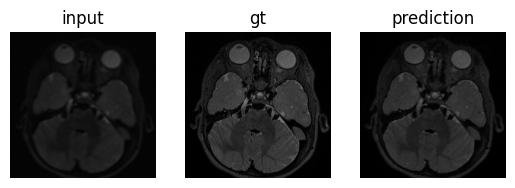

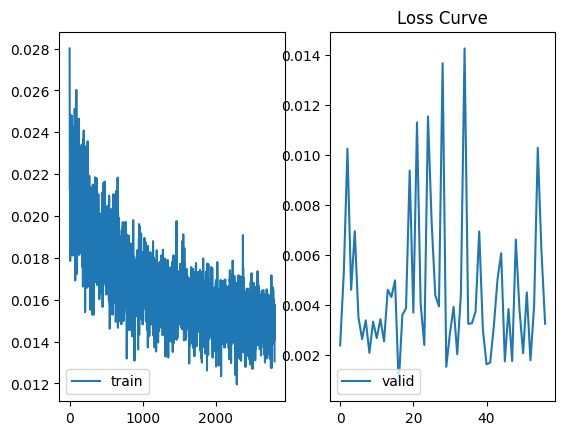

20it [00:02,  9.88it/s]


Epoch 2802, Loss: 0.015040570590645074


20it [00:01, 10.03it/s]


Epoch 2803, Loss: 0.013746956887189299


20it [00:02,  9.64it/s]


Epoch 2804, Loss: 0.014681005151942372


20it [00:01, 10.47it/s]


Epoch 2805, Loss: 0.01392014246666804


20it [00:01, 10.25it/s]


Epoch 2806, Loss: 0.015024255984462798


20it [00:02,  9.85it/s]


Epoch 2807, Loss: 0.01543178476858884


20it [00:01, 10.13it/s]


Epoch 2808, Loss: 0.015026709833182394


20it [00:02,  9.99it/s]


Epoch 2809, Loss: 0.015072549716569484


20it [00:01, 10.35it/s]


Epoch 2810, Loss: 0.016737895901314914


20it [00:02,  9.83it/s]


Epoch 2811, Loss: 0.013086219248361886


20it [00:01, 10.19it/s]


Epoch 2812, Loss: 0.013775811507366597


20it [00:01, 10.09it/s]


Epoch 2813, Loss: 0.014289127313531935


20it [00:02,  9.44it/s]


Epoch 2814, Loss: 0.014141655364073812


20it [00:02,  9.89it/s]


Epoch 2815, Loss: 0.013337274454534054


20it [00:01, 10.39it/s]


Epoch 2816, Loss: 0.015448242891579866


20it [00:01, 10.07it/s]


Epoch 2817, Loss: 0.013706637802533806


20it [00:01, 10.51it/s]


Epoch 2818, Loss: 0.014275567419826985


20it [00:01, 10.50it/s]


Epoch 2819, Loss: 0.015066761570051313


20it [00:01, 10.23it/s]


Epoch 2820, Loss: 0.014637918025255204


20it [00:02,  9.75it/s]


Epoch 2821, Loss: 0.014797411020845174


20it [00:02, 10.00it/s]


Epoch 2822, Loss: 0.015871165157295763


20it [00:01, 10.18it/s]


Epoch 2823, Loss: 0.014583566831424833


20it [00:01, 10.43it/s]


Epoch 2824, Loss: 0.013442803733050823


20it [00:02,  9.97it/s]


Epoch 2825, Loss: 0.014989209291525186


20it [00:02,  9.42it/s]


Epoch 2826, Loss: 0.014235994743648917


20it [00:01, 10.32it/s]


Epoch 2827, Loss: 0.015694313356652854


20it [00:01, 10.24it/s]


Epoch 2828, Loss: 0.01324811230879277


20it [00:01, 10.11it/s]


Epoch 2829, Loss: 0.015314560174010694


20it [00:02,  9.99it/s]


Epoch 2830, Loss: 0.014580972911790013


20it [00:01, 10.29it/s]


Epoch 2831, Loss: 0.014898915006779135


20it [00:01, 10.25it/s]


Epoch 2832, Loss: 0.014495796314440668


20it [00:01, 10.14it/s]


Epoch 2833, Loss: 0.014517937356140464


20it [00:02,  9.94it/s]


Epoch 2834, Loss: 0.013860117457807065


20it [00:01, 10.32it/s]


Epoch 2835, Loss: 0.015874513622839002


20it [00:01, 10.08it/s]


Epoch 2836, Loss: 0.015555586607661098


20it [00:02,  9.38it/s]


Epoch 2837, Loss: 0.01598193640820682


20it [00:01, 10.09it/s]


Epoch 2838, Loss: 0.015511358552612365


20it [00:01, 10.42it/s]


Epoch 2839, Loss: 0.014965937589295208


20it [00:01, 10.11it/s]


Epoch 2840, Loss: 0.013359604054130614


20it [00:01, 10.12it/s]


Epoch 2841, Loss: 0.01419143178500235


20it [00:01, 10.02it/s]


Epoch 2842, Loss: 0.01639380680862814


20it [00:01, 10.17it/s]


Epoch 2843, Loss: 0.012716788111720233


20it [00:01, 10.06it/s]


Epoch 2844, Loss: 0.015950270788744093


20it [00:01, 10.04it/s]


Epoch 2845, Loss: 0.012998946534935385


20it [00:01, 10.18it/s]


Epoch 2846, Loss: 0.014494124543853104


20it [00:02,  9.93it/s]


Epoch 2847, Loss: 0.015418753027915955


20it [00:02,  9.30it/s]


Epoch 2848, Loss: 0.015609332197345793


20it [00:01, 10.41it/s]


Epoch 2849, Loss: 0.014922478003427386


20it [00:01, 10.21it/s]


Epoch 2850, Loss: 0.016677682753652334


20it [00:01, 10.09it/s]

Epoch 2851, Loss: 0.016656259866431357



4it [00:00,  9.90it/s]


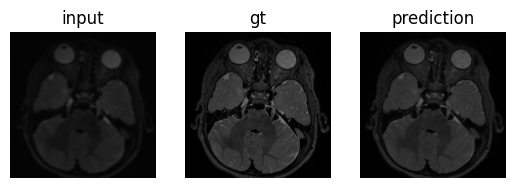

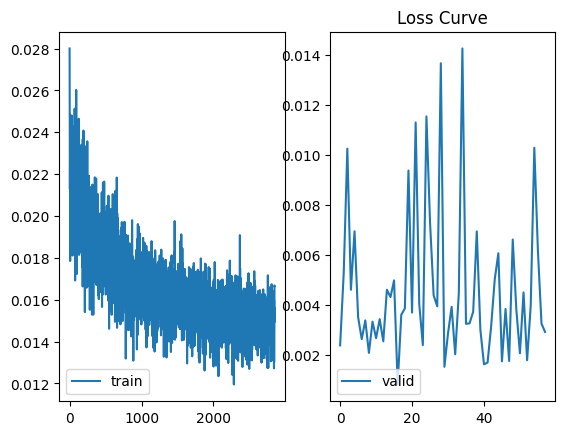

20it [00:01, 10.02it/s]


Epoch 2852, Loss: 0.015260366280563176


20it [00:01, 10.15it/s]


Epoch 2853, Loss: 0.016414998634718358


20it [00:01, 10.14it/s]


Epoch 2854, Loss: 0.014379149279557168


20it [00:01, 10.13it/s]


Epoch 2855, Loss: 0.014380828349385411


20it [00:01, 10.10it/s]


Epoch 2856, Loss: 0.016011606296524407


20it [00:02,  9.21it/s]


Epoch 2857, Loss: 0.014390809356700628


20it [00:01, 10.21it/s]


Epoch 2858, Loss: 0.013098430470563471


20it [00:02,  9.67it/s]


Epoch 2859, Loss: 0.014702661673072725


20it [00:02,  9.69it/s]


Epoch 2860, Loss: 0.013485792744904756


20it [00:01, 10.14it/s]


Epoch 2861, Loss: 0.014875413733534515


20it [00:02,  9.42it/s]


Epoch 2862, Loss: 0.013352490251418204


20it [00:02,  9.92it/s]


Epoch 2863, Loss: 0.014638892165385187


20it [00:01, 10.33it/s]


Epoch 2864, Loss: 0.01328818901674822


20it [00:02,  9.09it/s]


Epoch 2865, Loss: 0.012928584334440529


20it [00:01, 10.08it/s]


Epoch 2866, Loss: 0.013999801548197865


20it [00:02,  9.51it/s]


Epoch 2867, Loss: 0.015368642657995224


20it [00:02, 10.00it/s]


Epoch 2868, Loss: 0.015726426779292525


20it [00:02,  9.89it/s]


Epoch 2869, Loss: 0.013457416067831218


20it [00:02,  9.99it/s]


Epoch 2870, Loss: 0.013620160112623125


20it [00:01, 10.28it/s]


Epoch 2871, Loss: 0.01335897782118991


20it [00:01, 10.23it/s]


Epoch 2872, Loss: 0.016161994845606386


20it [00:01, 10.17it/s]


Epoch 2873, Loss: 0.014820042392238974


20it [00:01, 10.67it/s]


Epoch 2874, Loss: 0.015486414288170635


20it [00:02,  9.97it/s]


Epoch 2875, Loss: 0.016184585774317382


20it [00:02,  9.95it/s]


Epoch 2876, Loss: 0.014755095168948174


20it [00:02,  9.91it/s]


Epoch 2877, Loss: 0.015512327570468188


20it [00:01, 10.49it/s]


Epoch 2878, Loss: 0.015043708006851375


20it [00:01, 10.06it/s]


Epoch 2879, Loss: 0.015164834912866354


20it [00:01, 10.19it/s]


Epoch 2880, Loss: 0.01455145797226578


20it [00:01, 10.04it/s]


Epoch 2881, Loss: 0.015102517185732722


20it [00:01, 10.04it/s]


Epoch 2882, Loss: 0.016013964102603494


20it [00:02,  9.99it/s]


Epoch 2883, Loss: 0.015010532480664552


20it [00:01, 10.08it/s]


Epoch 2884, Loss: 0.014687670907005668


20it [00:01, 10.60it/s]


Epoch 2885, Loss: 0.01400849581696093


20it [00:02, 10.00it/s]


Epoch 2886, Loss: 0.015089459461160004


20it [00:01, 10.27it/s]


Epoch 2887, Loss: 0.014879823732189833


20it [00:02,  9.58it/s]


Epoch 2888, Loss: 0.013269775314256549


20it [00:02,  9.85it/s]


Epoch 2889, Loss: 0.015650478843599557


20it [00:01, 10.01it/s]


Epoch 2890, Loss: 0.015535745536908507


20it [00:01, 10.43it/s]


Epoch 2891, Loss: 0.015536565333604813


20it [00:01, 10.01it/s]


Epoch 2892, Loss: 0.01564920083619654


20it [00:01, 10.34it/s]


Epoch 2893, Loss: 0.013797089562285692


20it [00:01, 10.10it/s]


Epoch 2894, Loss: 0.014025571779347957


20it [00:01, 10.12it/s]


Epoch 2895, Loss: 0.014133336720988154


20it [00:01, 10.15it/s]


Epoch 2896, Loss: 0.015259744948707521


20it [00:01, 10.17it/s]


Epoch 2897, Loss: 0.014063394372351467


20it [00:01, 10.03it/s]


Epoch 2898, Loss: 0.016086226585321127


20it [00:02,  9.53it/s]


Epoch 2899, Loss: 0.015346985124051572


20it [00:02,  9.91it/s]


Epoch 2900, Loss: 0.016393633745610713


20it [00:01, 10.18it/s]

Epoch 2901, Loss: 0.015194842638447881



4it [00:00, 10.25it/s]


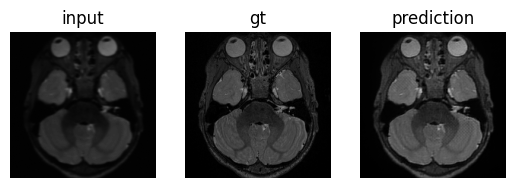

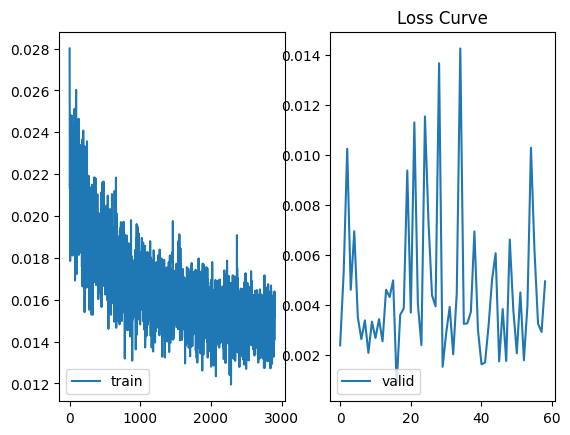

20it [00:01, 10.13it/s]


Epoch 2902, Loss: 0.014917372073978186


20it [00:02,  9.93it/s]


Epoch 2903, Loss: 0.016346178855746983


20it [00:01, 10.16it/s]


Epoch 2904, Loss: 0.015078618994448335


20it [00:01, 10.33it/s]


Epoch 2905, Loss: 0.01356109066400677


20it [00:02,  8.48it/s]


Epoch 2906, Loss: 0.016044421028345822


20it [00:01, 10.22it/s]


Epoch 2907, Loss: 0.013456299062818288


20it [00:02,  9.49it/s]


Epoch 2908, Loss: 0.014761338219977915


20it [00:01, 10.10it/s]


Epoch 2909, Loss: 0.015382374462205917


20it [00:02,  9.83it/s]


Epoch 2910, Loss: 0.014816436148248614


20it [00:02,  9.94it/s]


Epoch 2911, Loss: 0.013807017030194402


20it [00:02,  9.79it/s]


Epoch 2912, Loss: 0.014776665973477066


20it [00:02,  9.99it/s]


Epoch 2913, Loss: 0.015508558973670006


20it [00:01, 10.26it/s]


Epoch 2914, Loss: 0.01445789602585137


20it [00:01, 10.13it/s]


Epoch 2915, Loss: 0.01584660492371768


20it [00:02,  9.98it/s]


Epoch 2916, Loss: 0.015342497150413692


20it [00:02,  8.66it/s]


Epoch 2917, Loss: 0.01618608059361577


20it [00:03,  6.42it/s]


Epoch 2918, Loss: 0.016023190645501017


20it [00:03,  6.63it/s]


Epoch 2919, Loss: 0.014272480551153422


20it [00:03,  6.47it/s]


Epoch 2920, Loss: 0.015586049505509436


20it [00:03,  6.66it/s]


Epoch 2921, Loss: 0.014112614141777158


20it [00:03,  6.13it/s]


Epoch 2922, Loss: 0.01425006565405056


20it [00:03,  6.64it/s]


Epoch 2923, Loss: 0.016003322321921587


20it [00:02,  6.68it/s]


Epoch 2924, Loss: 0.014206005446612834


20it [00:03,  6.26it/s]


Epoch 2925, Loss: 0.015902404754888265


20it [00:03,  6.52it/s]


Epoch 2926, Loss: 0.014830626919865609


20it [00:02,  6.68it/s]


Epoch 2927, Loss: 0.016377372294664384


20it [00:03,  6.61it/s]


Epoch 2928, Loss: 0.014231431565713137


20it [00:03,  6.29it/s]


Epoch 2929, Loss: 0.01579637612449005


20it [00:03,  6.53it/s]


Epoch 2930, Loss: 0.013787336379755289


20it [00:02,  6.74it/s]


Epoch 2931, Loss: 0.014564069802872837


20it [00:03,  6.61it/s]


Epoch 2932, Loss: 0.014765219227410854


20it [00:02,  6.69it/s]


Epoch 2933, Loss: 0.014489599294029177


20it [00:02,  6.67it/s]


Epoch 2934, Loss: 0.0147378345602192


20it [00:02,  6.77it/s]


Epoch 2935, Loss: 0.014441971876658499


20it [00:03,  6.28it/s]


Epoch 2936, Loss: 0.01598071390762925


20it [00:02,  7.37it/s]


Epoch 2937, Loss: 0.014680643077008426


20it [00:03,  6.50it/s]


Epoch 2938, Loss: 0.015213782747741789


20it [00:02,  6.88it/s]


Epoch 2939, Loss: 0.016287264181300998


20it [00:02,  7.49it/s]


Epoch 2940, Loss: 0.013939527841284872


20it [00:03,  6.28it/s]


Epoch 2941, Loss: 0.013468449772335588


20it [00:03,  6.53it/s]


Epoch 2942, Loss: 0.016123205609619617


20it [00:03,  6.33it/s]


Epoch 2943, Loss: 0.014266261435113847


20it [00:03,  6.56it/s]


Epoch 2944, Loss: 0.01596053228713572


20it [00:02,  6.75it/s]


Epoch 2945, Loss: 0.01390888475580141


20it [00:03,  6.40it/s]


Epoch 2946, Loss: 0.016626049438491462


20it [00:03,  5.90it/s]


Epoch 2947, Loss: 0.01483028797665611


20it [00:03,  6.24it/s]


Epoch 2948, Loss: 0.015459286980330944


20it [00:02,  6.77it/s]


Epoch 2949, Loss: 0.015278489701449871


20it [00:03,  6.53it/s]


Epoch 2950, Loss: 0.01642041918821633


20it [00:03,  6.37it/s]

Epoch 2951, Loss: 0.015788562316447496



4it [00:00,  6.78it/s]


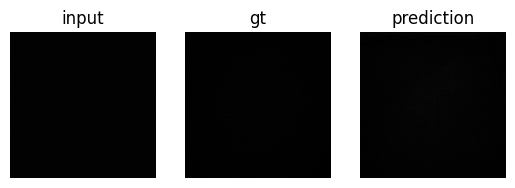

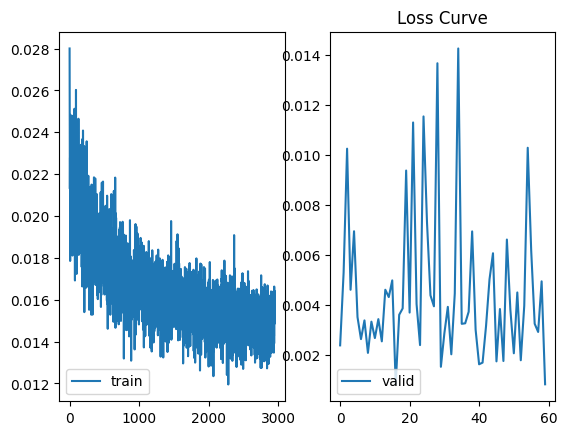

20it [00:03,  6.27it/s]


Epoch 2952, Loss: 0.014047109219245613


20it [00:02,  7.32it/s]


Epoch 2953, Loss: 0.015690623363479973


20it [00:03,  6.52it/s]


Epoch 2954, Loss: 0.015297458576969802


20it [00:03,  6.56it/s]


Epoch 2955, Loss: 0.013827856839634478


20it [00:02,  6.72it/s]


Epoch 2956, Loss: 0.016403462970629334


20it [00:03,  6.40it/s]


Epoch 2957, Loss: 0.01583289506379515


20it [00:02,  6.85it/s]


Epoch 2958, Loss: 0.013496231602039188


20it [00:03,  6.36it/s]


Epoch 2959, Loss: 0.014229366998188197


20it [00:02,  6.98it/s]


Epoch 2960, Loss: 0.01308810878545046


20it [00:02,  6.87it/s]


Epoch 2961, Loss: 0.015184778417460621


20it [00:02,  7.88it/s]


Epoch 2962, Loss: 0.01395722352899611


20it [00:03,  6.12it/s]


Epoch 2963, Loss: 0.013189364876598119


20it [00:03,  6.67it/s]


Epoch 2964, Loss: 0.013490583188831807


20it [00:03,  6.53it/s]


Epoch 2965, Loss: 0.015596265671774745


20it [00:03,  6.49it/s]


Epoch 2966, Loss: 0.014160669955890626


20it [00:03,  6.64it/s]


Epoch 2967, Loss: 0.013782614306546748


20it [00:03,  6.27it/s]


Epoch 2968, Loss: 0.01428216724889353


20it [00:02,  6.80it/s]


Epoch 2969, Loss: 0.015107805118896067


20it [00:03,  6.01it/s]


Epoch 2970, Loss: 0.014925679517909884


20it [00:03,  6.45it/s]


Epoch 2971, Loss: 0.014806954003870488


20it [00:03,  6.46it/s]


Epoch 2972, Loss: 0.013374107296112926


20it [00:03,  6.06it/s]


Epoch 2973, Loss: 0.014415306271985173


20it [00:02,  6.85it/s]


Epoch 2974, Loss: 0.01529982159845531


20it [00:03,  6.51it/s]


Epoch 2975, Loss: 0.015084925782866776


20it [00:03,  6.20it/s]


Epoch 2976, Loss: 0.015268704062327743


20it [00:03,  6.10it/s]


Epoch 2977, Loss: 0.014607986412011087


20it [00:03,  6.49it/s]


Epoch 2978, Loss: 0.014457379677332937


20it [00:03,  6.41it/s]


Epoch 2979, Loss: 0.013512755662668496


20it [00:03,  6.55it/s]


Epoch 2980, Loss: 0.014893606072291732


20it [00:03,  6.52it/s]


Epoch 2981, Loss: 0.01603262722492218


20it [00:03,  6.58it/s]


Epoch 2982, Loss: 0.014751894236542284


20it [00:02,  8.50it/s]


Epoch 2983, Loss: 0.015651069744490088


20it [00:03,  6.25it/s]


Epoch 2984, Loss: 0.015126640489324928


20it [00:02,  7.05it/s]


Epoch 2985, Loss: 0.01399486039299518


20it [00:03,  6.63it/s]


Epoch 2986, Loss: 0.01552290697582066


20it [00:02,  6.79it/s]


Epoch 2987, Loss: 0.015032570925541222


20it [00:03,  6.54it/s]


Epoch 2988, Loss: 0.015980305220000445


20it [00:03,  6.52it/s]


Epoch 2989, Loss: 0.013416393136139959


20it [00:02,  6.76it/s]


Epoch 2990, Loss: 0.015192269440740347


20it [00:02,  6.73it/s]


Epoch 2991, Loss: 0.014501562435179948


20it [00:02,  6.97it/s]


Epoch 2992, Loss: 0.015257192426361144


20it [00:02,  6.84it/s]


Epoch 2993, Loss: 0.014041149034164846


20it [00:03,  6.27it/s]


Epoch 2994, Loss: 0.015049653593450785


20it [00:03,  6.19it/s]


Epoch 2995, Loss: 0.013873698911629618


20it [00:03,  6.41it/s]


Epoch 2996, Loss: 0.014772153878584503


20it [00:03,  6.49it/s]


Epoch 2997, Loss: 0.015688504243735225


20it [00:03,  6.58it/s]


Epoch 2998, Loss: 0.015114098286721856


20it [00:03,  6.29it/s]


Epoch 2999, Loss: 0.01630345289595425


20it [00:03,  6.61it/s]


Epoch 3000, Loss: 0.01494859205558896


20it [00:02,  6.84it/s]

Epoch 3001, Loss: 0.015185614652000367



4it [00:00,  7.23it/s]


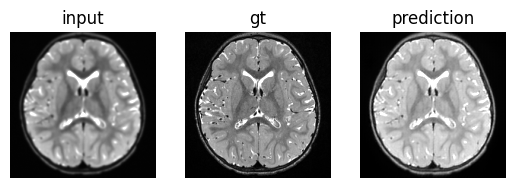

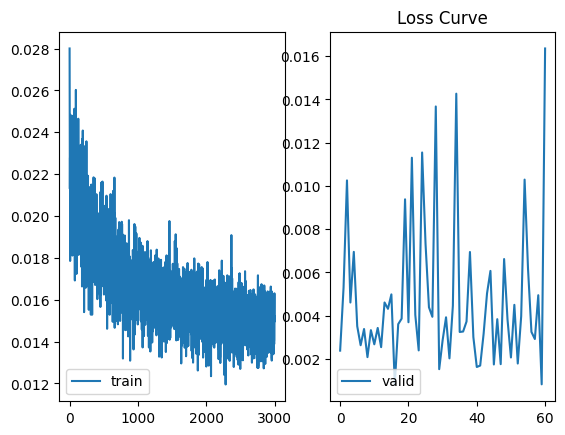

20it [00:03,  6.42it/s]


Epoch 3002, Loss: 0.016035763919353484


20it [00:02,  6.78it/s]


Epoch 3003, Loss: 0.015135551034472883


20it [00:02,  7.99it/s]


Epoch 3004, Loss: 0.013813284016214311


20it [00:02,  7.25it/s]


Epoch 3005, Loss: 0.015015725744888186


20it [00:03,  6.33it/s]


Epoch 3006, Loss: 0.01593889610376209


20it [00:03,  6.20it/s]


Epoch 3007, Loss: 0.01399170164950192


20it [00:03,  6.57it/s]


Epoch 3008, Loss: 0.014757815969642252


20it [00:03,  6.64it/s]


Epoch 3009, Loss: 0.015364747284911573


20it [00:03,  6.27it/s]


Epoch 3010, Loss: 0.015411144332028925


20it [00:02,  6.97it/s]


Epoch 3011, Loss: 0.014203074527904392


20it [00:03,  6.23it/s]


Epoch 3012, Loss: 0.015050835290458054


20it [00:02,  6.86it/s]


Epoch 3013, Loss: 0.015492736536543816


20it [00:03,  6.23it/s]


Epoch 3014, Loss: 0.014911943743936718


20it [00:03,  6.51it/s]


Epoch 3015, Loss: 0.014173031016252936


20it [00:03,  6.52it/s]


Epoch 3016, Loss: 0.013332649483345449


20it [00:02,  6.83it/s]


Epoch 3017, Loss: 0.01511727252509445


20it [00:03,  6.51it/s]


Epoch 3018, Loss: 0.016039467183873057


20it [00:02,  6.72it/s]


Epoch 3019, Loss: 0.015276360954158009


20it [00:02,  6.96it/s]


Epoch 3020, Loss: 0.015154248080216348


20it [00:03,  6.39it/s]


Epoch 3021, Loss: 0.015538923221174627


20it [00:03,  6.62it/s]


Epoch 3022, Loss: 0.016012224112637342


20it [00:03,  6.42it/s]


Epoch 3023, Loss: 0.014946745964698494


20it [00:03,  6.52it/s]


Epoch 3024, Loss: 0.01465275720693171


20it [00:03,  5.96it/s]


Epoch 3025, Loss: 0.015117523667868227


20it [00:02,  8.69it/s]


Epoch 3026, Loss: 0.015834365668706597


20it [00:02,  6.69it/s]


Epoch 3027, Loss: 0.01487938743084669


20it [00:03,  6.48it/s]


Epoch 3028, Loss: 0.01559559185989201


20it [00:02,  7.01it/s]


Epoch 3029, Loss: 0.01670395175460726


20it [00:03,  6.62it/s]


Epoch 3030, Loss: 0.015461346809752285


20it [00:03,  6.39it/s]


Epoch 3031, Loss: 0.014571464736945927


20it [00:03,  6.63it/s]


Epoch 3032, Loss: 0.01575163460802287


20it [00:02,  6.85it/s]


Epoch 3033, Loss: 0.013365760119631887


20it [00:03,  6.16it/s]


Epoch 3034, Loss: 0.014563476399052889


20it [00:03,  6.54it/s]


Epoch 3035, Loss: 0.014107650192454458


20it [00:03,  6.59it/s]


Epoch 3036, Loss: 0.015769886574707924


20it [00:03,  6.39it/s]


Epoch 3037, Loss: 0.015963566943537445


20it [00:02,  7.02it/s]


Epoch 3038, Loss: 0.01631122038234025


20it [00:03,  6.53it/s]


Epoch 3039, Loss: 0.014859711588360369


20it [00:03,  6.24it/s]


Epoch 3040, Loss: 0.016480912431143226


20it [00:03,  6.08it/s]


Epoch 3041, Loss: 0.01488482253625989


20it [00:03,  6.49it/s]


Epoch 3042, Loss: 0.014666546881198884


20it [00:03,  6.39it/s]


Epoch 3043, Loss: 0.014535258756950498


20it [00:03,  6.62it/s]


Epoch 3044, Loss: 0.01443662545643747


20it [00:03,  6.53it/s]


Epoch 3045, Loss: 0.01431990579003468


20it [00:03,  6.44it/s]


Epoch 3046, Loss: 0.013775576534681023


20it [00:03,  6.55it/s]


Epoch 3047, Loss: 0.015606854273937643


20it [00:02,  7.72it/s]


Epoch 3048, Loss: 0.016561380587518215


20it [00:02,  6.69it/s]


Epoch 3049, Loss: 0.015855173394083977


20it [00:03,  6.41it/s]


Epoch 3050, Loss: 0.014649598277173936


20it [00:03,  6.26it/s]

Epoch 3051, Loss: 0.013849685993045568



4it [00:00,  6.87it/s]


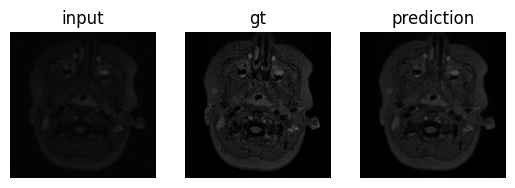

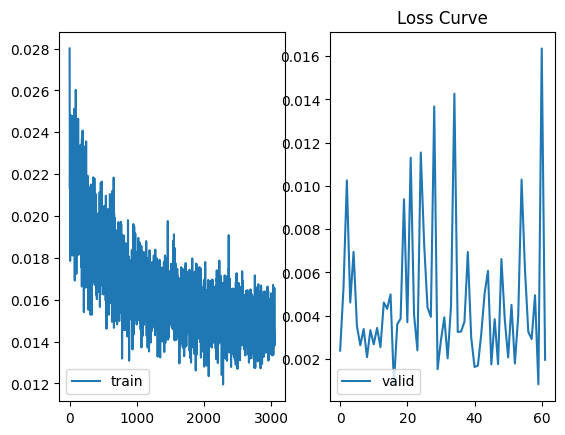

20it [00:03,  6.20it/s]


Epoch 3052, Loss: 0.015354251326061785


20it [00:03,  6.21it/s]


Epoch 3053, Loss: 0.014100928418338298


20it [00:02,  6.77it/s]


Epoch 3054, Loss: 0.014867496397346257


20it [00:02,  7.18it/s]


Epoch 3055, Loss: 0.013526320667006075


20it [00:03,  6.46it/s]


Epoch 3056, Loss: 0.015264591132290662


20it [00:02,  6.85it/s]


Epoch 3057, Loss: 0.01481942473910749


20it [00:03,  6.38it/s]


Epoch 3058, Loss: 0.014874592213891447


20it [00:03,  6.28it/s]


Epoch 3059, Loss: 0.015370007860474289


20it [00:02,  7.45it/s]


Epoch 3060, Loss: 0.014380041649565101


20it [00:03,  6.41it/s]


Epoch 3061, Loss: 0.014389140135608613


20it [00:03,  6.46it/s]


Epoch 3062, Loss: 0.014886918186675757


20it [00:03,  6.18it/s]


Epoch 3063, Loss: 0.015523933130316437


20it [00:03,  6.22it/s]


Epoch 3064, Loss: 0.01543306338135153


20it [00:03,  6.57it/s]


Epoch 3065, Loss: 0.015223834081552923


20it [00:03,  6.23it/s]


Epoch 3066, Loss: 0.015130475407931953


20it [00:02,  6.71it/s]


Epoch 3067, Loss: 0.013592304149642586


20it [00:03,  6.14it/s]


Epoch 3068, Loss: 0.013441423396579921


20it [00:02,  7.32it/s]


Epoch 3069, Loss: 0.013959167129360139


20it [00:02,  9.64it/s]


Epoch 3070, Loss: 0.016068453202024102


20it [00:02,  9.40it/s]


Epoch 3071, Loss: 0.01717566775623709


20it [00:02,  9.76it/s]


Epoch 3072, Loss: 0.014919737179297954


20it [00:02,  9.45it/s]


Epoch 3073, Loss: 0.015575037570670247


20it [00:02,  9.54it/s]


Epoch 3074, Loss: 0.013869739067740739


20it [00:02,  9.28it/s]


Epoch 3075, Loss: 0.014910940988920629


20it [00:02,  9.65it/s]


Epoch 3076, Loss: 0.015947444061748684


20it [00:02,  9.57it/s]


Epoch 3077, Loss: 0.014443412085529416


20it [00:02,  9.58it/s]


Epoch 3078, Loss: 0.016056990611832588


20it [00:02,  9.15it/s]


Epoch 3079, Loss: 0.014877658558543772


20it [00:02,  8.47it/s]


Epoch 3080, Loss: 0.014814174105413257


20it [00:02,  8.49it/s]


Epoch 3081, Loss: 0.013776595261879266


20it [00:02,  8.55it/s]


Epoch 3082, Loss: 0.015393115160986782


20it [00:02,  9.77it/s]


Epoch 3083, Loss: 0.01407209683675319


20it [00:02,  9.72it/s]


Epoch 3084, Loss: 0.015907570766285063


20it [00:01, 10.10it/s]


Epoch 3085, Loss: 0.013850176404230297


20it [00:02,  9.57it/s]


Epoch 3086, Loss: 0.015080817462876438


20it [00:02,  9.79it/s]


Epoch 3087, Loss: 0.016072779404930772


20it [00:01, 10.03it/s]


Epoch 3088, Loss: 0.015438687568530441


20it [00:01, 10.25it/s]


Epoch 3089, Loss: 0.015314230683725328


20it [00:01, 10.64it/s]


Epoch 3090, Loss: 0.015240320563316345


20it [00:02,  9.93it/s]


Epoch 3091, Loss: 0.015843778615817428


20it [00:01, 10.26it/s]


Epoch 3092, Loss: 0.014554290939122439


20it [00:01, 10.15it/s]


Epoch 3093, Loss: 0.013321436976548284


20it [00:02,  9.96it/s]


Epoch 3094, Loss: 0.014963316463399679


20it [00:01, 10.24it/s]


Epoch 3095, Loss: 0.015195686195511371


20it [00:02,  9.48it/s]


Epoch 3096, Loss: 0.014505496609490364


20it [00:01, 10.19it/s]


Epoch 3097, Loss: 0.015528309158980846


20it [00:01, 10.43it/s]


Epoch 3098, Loss: 0.015205611847341061


20it [00:02,  9.75it/s]


Epoch 3099, Loss: 0.015227002534084022


20it [00:01, 10.11it/s]


Epoch 3100, Loss: 0.015653555281460285


20it [00:01, 10.17it/s]

Epoch 3101, Loss: 0.015344512322917581



4it [00:00,  9.76it/s]


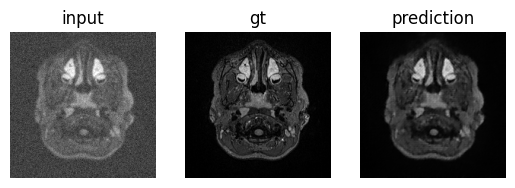

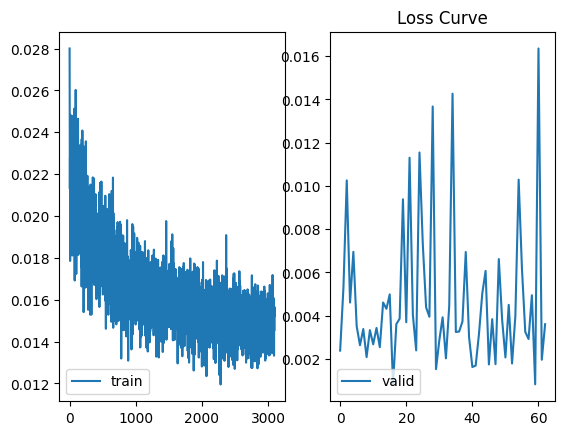

20it [00:02,  9.87it/s]


Epoch 3102, Loss: 0.012845490116160364


20it [00:02, 10.00it/s]


Epoch 3103, Loss: 0.015322111616842448


20it [00:01, 10.18it/s]


Epoch 3104, Loss: 0.014857113035395742


20it [00:02,  9.56it/s]


Epoch 3105, Loss: 0.01619837584439665


20it [00:02,  9.86it/s]


Epoch 3106, Loss: 0.014609331369865686


20it [00:01, 10.19it/s]


Epoch 3107, Loss: 0.01380786852678284


20it [00:02,  9.72it/s]


Epoch 3108, Loss: 0.013881050911732019


20it [00:02,  9.97it/s]


Epoch 3109, Loss: 0.015564700635150076


20it [00:02,  9.99it/s]


Epoch 3110, Loss: 0.016527449782006442


20it [00:02, 10.00it/s]


Epoch 3111, Loss: 0.014267192734405399


20it [00:02,  9.91it/s]


Epoch 3112, Loss: 0.01281353016383946


20it [00:02,  9.89it/s]


Epoch 3113, Loss: 0.014136179827619343


20it [00:01, 10.07it/s]


Epoch 3114, Loss: 0.013966324797365814


20it [00:02,  9.68it/s]


Epoch 3115, Loss: 0.014470737380906939


20it [00:02,  9.93it/s]


Epoch 3116, Loss: 0.013317697786260397


20it [00:01, 10.27it/s]


Epoch 3117, Loss: 0.014919416641350835


20it [00:01, 10.41it/s]


Epoch 3118, Loss: 0.015302595891989767


20it [00:01, 10.13it/s]


Epoch 3119, Loss: 0.014094570511952042


20it [00:01, 10.11it/s]


Epoch 3120, Loss: 0.014483577362261713


20it [00:02,  9.81it/s]


Epoch 3121, Loss: 0.01579045916441828


20it [00:01, 10.30it/s]


Epoch 3122, Loss: 0.0146159537602216


20it [00:02,  9.81it/s]


Epoch 3123, Loss: 0.01507486344780773


20it [00:02,  9.90it/s]


Epoch 3124, Loss: 0.015692133142147215


20it [00:01, 10.17it/s]


Epoch 3125, Loss: 0.013671092037111521


20it [00:02,  9.32it/s]


Epoch 3126, Loss: 0.016210154024884106


20it [00:01, 10.34it/s]


Epoch 3127, Loss: 0.012651722074951976


20it [00:01, 10.15it/s]


Epoch 3128, Loss: 0.013898711698129774


20it [00:02,  9.64it/s]


Epoch 3129, Loss: 0.015283810906112194


20it [00:01, 10.25it/s]


Epoch 3130, Loss: 0.014376079500652849


20it [00:01, 10.05it/s]


Epoch 3131, Loss: 0.0144188103498891


20it [00:02,  9.80it/s]


Epoch 3132, Loss: 0.014584019512403757


20it [00:02,  9.85it/s]


Epoch 3133, Loss: 0.014636733965016902


20it [00:01, 10.19it/s]


Epoch 3134, Loss: 0.013496673305053265


20it [00:01, 10.08it/s]


Epoch 3135, Loss: 0.014242430287413298


20it [00:01, 10.24it/s]


Epoch 3136, Loss: 0.014483878051396459


20it [00:02,  9.35it/s]


Epoch 3137, Loss: 0.01569491324480623


20it [00:02,  9.97it/s]


Epoch 3138, Loss: 0.014947866369038821


20it [00:01, 10.22it/s]


Epoch 3139, Loss: 0.01511078723706305


20it [00:02,  9.71it/s]


Epoch 3140, Loss: 0.01474070327822119


20it [00:02,  9.79it/s]


Epoch 3141, Loss: 0.014433219586499036


20it [00:02,  9.98it/s]


Epoch 3142, Loss: 0.015172979794442654


20it [00:02,  9.97it/s]


Epoch 3143, Loss: 0.014392062067054212


20it [00:01, 10.13it/s]


Epoch 3144, Loss: 0.01291744118789211


20it [00:02,  9.97it/s]


Epoch 3145, Loss: 0.014402792905457318


20it [00:02,  9.94it/s]


Epoch 3146, Loss: 0.015230611898005009


20it [00:02,  9.84it/s]


Epoch 3147, Loss: 0.015530215110629797


20it [00:02,  9.57it/s]


Epoch 3148, Loss: 0.014926740620285272


20it [00:01, 10.30it/s]


Epoch 3149, Loss: 0.014629640791099519


20it [00:01, 10.11it/s]


Epoch 3150, Loss: 0.013804332748986781


20it [00:01, 10.11it/s]

Epoch 3151, Loss: 0.013115407375153154



4it [00:00,  8.84it/s]


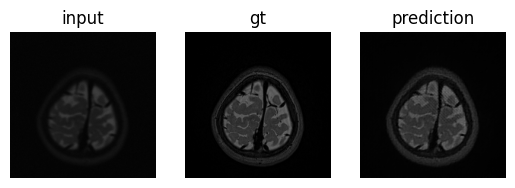

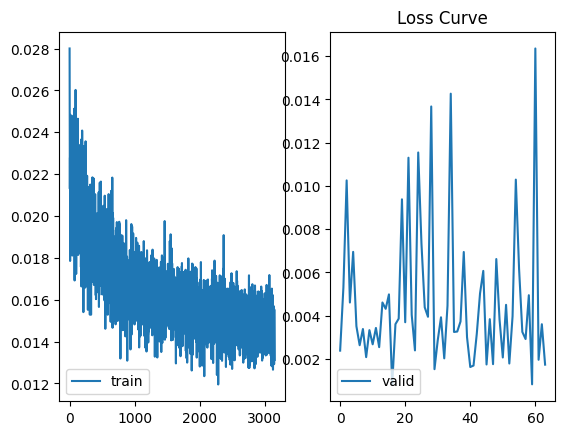

20it [00:01, 10.04it/s]


Epoch 3152, Loss: 0.013451285054907202


20it [00:02,  9.91it/s]


Epoch 3153, Loss: 0.016652917792089283


20it [00:02,  9.99it/s]


Epoch 3154, Loss: 0.014828795520588755


20it [00:02,  7.39it/s]


Epoch 3155, Loss: 0.016943100746721028


20it [00:02,  7.65it/s]


Epoch 3156, Loss: 0.016243150201626123


20it [00:02,  7.52it/s]


Epoch 3157, Loss: 0.015260246978141368


20it [00:02,  7.46it/s]


Epoch 3158, Loss: 0.015267153130844235


20it [00:02,  7.53it/s]


Epoch 3159, Loss: 0.014855867647565902


20it [00:02,  7.80it/s]


Epoch 3160, Loss: 0.01577015551738441


20it [00:02,  7.55it/s]


Epoch 3161, Loss: 0.015747897885739805


20it [00:02,  7.63it/s]


Epoch 3162, Loss: 0.015272312378510833


20it [00:02,  7.85it/s]


Epoch 3163, Loss: 0.015221722866408527


20it [00:02,  7.25it/s]


Epoch 3164, Loss: 0.014323171740397812


20it [00:02,  7.65it/s]


Epoch 3165, Loss: 0.014344518422149122


20it [00:02,  7.81it/s]


Epoch 3166, Loss: 0.01567300409078598


20it [00:02,  7.72it/s]


Epoch 3167, Loss: 0.01563031894620508


20it [00:02,  7.52it/s]


Epoch 3168, Loss: 0.014319672109559178


20it [00:02,  7.66it/s]


Epoch 3169, Loss: 0.015204965765587986


20it [00:02,  7.80it/s]


Epoch 3170, Loss: 0.01579082936514169


20it [00:02,  7.57it/s]


Epoch 3171, Loss: 0.01401331921806559


20it [00:02,  8.17it/s]


Epoch 3172, Loss: 0.015334536973387002


20it [00:02,  8.00it/s]


Epoch 3173, Loss: 0.015324744279496372


20it [00:02,  7.54it/s]


Epoch 3174, Loss: 0.011627112154383213


20it [00:02,  7.54it/s]


Epoch 3175, Loss: 0.01553834560327232


20it [00:02,  7.42it/s]


Epoch 3176, Loss: 0.013173560576979071


20it [00:02,  7.76it/s]


Epoch 3177, Loss: 0.015012000373098999


20it [00:02,  7.75it/s]


Epoch 3178, Loss: 0.015552555583417416


20it [00:02,  7.33it/s]


Epoch 3179, Loss: 0.014049400226213038


20it [00:02,  7.61it/s]


Epoch 3180, Loss: 0.014820814039558173


20it [00:02,  7.49it/s]


Epoch 3181, Loss: 0.014961498533375561


20it [00:02,  7.71it/s]


Epoch 3182, Loss: 0.015505223255604505


20it [00:02,  7.37it/s]


Epoch 3183, Loss: 0.01444366443902254


20it [00:02,  7.88it/s]


Epoch 3184, Loss: 0.01585957857314497


20it [00:02,  7.65it/s]


Epoch 3185, Loss: 0.013440663344226778


20it [00:02,  7.80it/s]


Epoch 3186, Loss: 0.0147167325951159


20it [00:02,  7.73it/s]


Epoch 3187, Loss: 0.01560531633440405


20it [00:02,  7.57it/s]


Epoch 3188, Loss: 0.013935541349928826


20it [00:02,  7.71it/s]


Epoch 3189, Loss: 0.01678785844705999


20it [00:02,  7.83it/s]


Epoch 3190, Loss: 0.01426838596817106


20it [00:02,  7.19it/s]


Epoch 3191, Loss: 0.015295224753208459


20it [00:02,  7.50it/s]


Epoch 3192, Loss: 0.015553988749161363


20it [00:02,  7.39it/s]


Epoch 3193, Loss: 0.014939598611090333


20it [00:02,  7.75it/s]


Epoch 3194, Loss: 0.01596805900335312


20it [00:02,  7.65it/s]


Epoch 3195, Loss: 0.0158276597969234


20it [00:02,  7.39it/s]


Epoch 3196, Loss: 0.014847935107536615


20it [00:02,  7.46it/s]


Epoch 3197, Loss: 0.013822371745482087


20it [00:02,  7.59it/s]


Epoch 3198, Loss: 0.01558106642914936


20it [00:02,  8.11it/s]


Epoch 3199, Loss: 0.012596360268071293


20it [00:02,  7.30it/s]


Epoch 3200, Loss: 0.014043473708443343


20it [00:02,  7.80it/s]

Epoch 3201, Loss: 0.014539936371147633



4it [00:00,  6.19it/s]


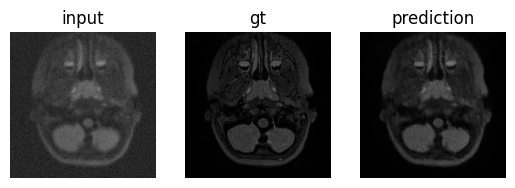

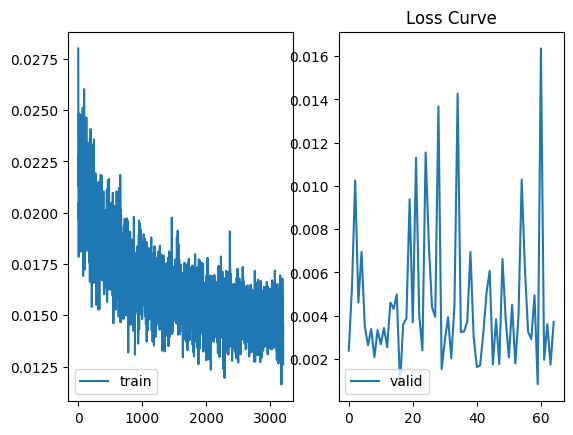

20it [00:02,  7.45it/s]


Epoch 3202, Loss: 0.01442151350202039


20it [00:02,  7.86it/s]


Epoch 3203, Loss: 0.015482476400211453


20it [00:02,  7.49it/s]


Epoch 3204, Loss: 0.014682493184227496


20it [00:02,  7.88it/s]


Epoch 3205, Loss: 0.015502838883548975


20it [00:02,  8.10it/s]


Epoch 3206, Loss: 0.016293747909367086


20it [00:02,  7.60it/s]


Epoch 3207, Loss: 0.015875878324732185


20it [00:02,  7.34it/s]


Epoch 3208, Loss: 0.015122916689142585


20it [00:02,  7.65it/s]


Epoch 3209, Loss: 0.015138246421702205


20it [00:02,  7.08it/s]


Epoch 3210, Loss: 0.015612062427680939


20it [00:02,  7.22it/s]


Epoch 3211, Loss: 0.014934657630510629


20it [00:02,  7.65it/s]


Epoch 3212, Loss: 0.014472655137069523


20it [00:02,  7.52it/s]


Epoch 3213, Loss: 0.015934678679332136


20it [00:02,  7.52it/s]


Epoch 3214, Loss: 0.014796215598471463


20it [00:02,  7.55it/s]


Epoch 3215, Loss: 0.015068378113210202


20it [00:02,  7.50it/s]


Epoch 3216, Loss: 0.015544913336634636


20it [00:02,  7.55it/s]


Epoch 3217, Loss: 0.014823373756371439


20it [00:02,  7.78it/s]


Epoch 3218, Loss: 0.015243966830894351


20it [00:02,  7.52it/s]


Epoch 3219, Loss: 0.01560460738837719


20it [00:02,  7.40it/s]


Epoch 3220, Loss: 0.013705528271384538


20it [00:02,  7.95it/s]


Epoch 3221, Loss: 0.015150450426153839


20it [00:02,  7.87it/s]


Epoch 3222, Loss: 0.014469123911112547


20it [00:02,  7.57it/s]


Epoch 3223, Loss: 0.015245771035552025


20it [00:02,  7.80it/s]


Epoch 3224, Loss: 0.014703091070987283


20it [00:02,  7.67it/s]


Epoch 3225, Loss: 0.013829017535317688


20it [00:02,  7.45it/s]


Epoch 3226, Loss: 0.014393445826135576


20it [00:02,  7.61it/s]


Epoch 3227, Loss: 0.015377952414564789


20it [00:02,  7.48it/s]


Epoch 3228, Loss: 0.01541759802494198


20it [00:02,  7.37it/s]


Epoch 3229, Loss: 0.0154756567790173


20it [00:02,  7.59it/s]


Epoch 3230, Loss: 0.013918613665737212


20it [00:02,  7.71it/s]


Epoch 3231, Loss: 0.015446097264066339


20it [00:02,  7.29it/s]


Epoch 3232, Loss: 0.015783974644728006


20it [00:02,  7.57it/s]


Epoch 3233, Loss: 0.01565519953146577


20it [00:02,  7.52it/s]


Epoch 3234, Loss: 0.01465357084525749


20it [00:02,  7.41it/s]


Epoch 3235, Loss: 0.013794641045387834


20it [00:02,  7.47it/s]


Epoch 3236, Loss: 0.016256120381876828


20it [00:02,  7.58it/s]


Epoch 3237, Loss: 0.015032366756349802


20it [00:02,  8.64it/s]


Epoch 3238, Loss: 0.015747472434304653


20it [00:02,  7.75it/s]


Epoch 3239, Loss: 0.014903572527691722


20it [00:02,  7.76it/s]


Epoch 3240, Loss: 0.014540358853992075


20it [00:02,  7.45it/s]


Epoch 3241, Loss: 0.014230584353208542


20it [00:02,  7.67it/s]


Epoch 3242, Loss: 0.014636409888043999


20it [00:02,  7.29it/s]


Epoch 3243, Loss: 0.013462952652480454


20it [00:02,  7.87it/s]


Epoch 3244, Loss: 0.015411477070301771


20it [00:02,  7.64it/s]


Epoch 3245, Loss: 0.015286188223399222


20it [00:02,  7.59it/s]


Epoch 3246, Loss: 0.01536220961716026


20it [00:02,  7.60it/s]


Epoch 3247, Loss: 0.014792017824947833


20it [00:02,  7.61it/s]


Epoch 3248, Loss: 0.015530083701014519


20it [00:02,  7.34it/s]


Epoch 3249, Loss: 0.012980051292106509


20it [00:02,  7.59it/s]


Epoch 3250, Loss: 0.014016737299971282


20it [00:02,  7.65it/s]

Epoch 3251, Loss: 0.012748105847276748



4it [00:00,  6.70it/s]


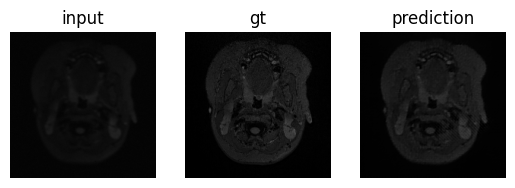

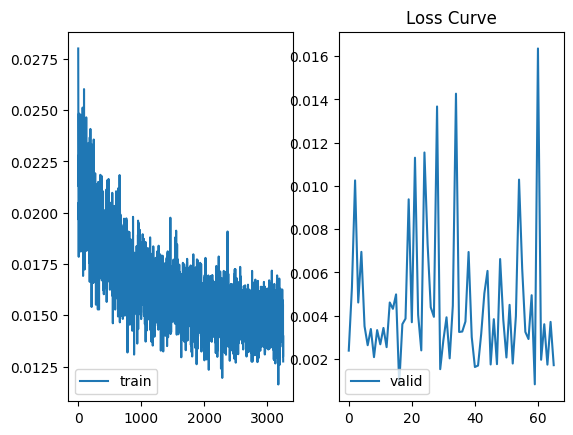

20it [00:02,  7.33it/s]


Epoch 3252, Loss: 0.014631423109676689


20it [00:02,  7.61it/s]


Epoch 3253, Loss: 0.015149960876442492


20it [00:02,  7.81it/s]


Epoch 3254, Loss: 0.015166754857636989


20it [00:02,  8.12it/s]


Epoch 3255, Loss: 0.014055660949088633


20it [00:02,  7.60it/s]


Epoch 3256, Loss: 0.016567997634410858


20it [00:02,  7.74it/s]


Epoch 3257, Loss: 0.01600572275929153


20it [00:02,  7.37it/s]


Epoch 3258, Loss: 0.016430643456988036


20it [00:02,  7.47it/s]


Epoch 3259, Loss: 0.015899372415151446


20it [00:02,  7.77it/s]


Epoch 3260, Loss: 0.015362517349421978


20it [00:02,  7.38it/s]


Epoch 3261, Loss: 0.015051036956720054


20it [00:02,  7.30it/s]


Epoch 3262, Loss: 0.014895615074783564


20it [00:02,  7.23it/s]


Epoch 3263, Loss: 0.015335341007448733


20it [00:02,  7.37it/s]


Epoch 3264, Loss: 0.015051847998984158


20it [00:02,  7.48it/s]


Epoch 3265, Loss: 0.013947740697767585


20it [00:02,  7.62it/s]


Epoch 3266, Loss: 0.01548770114313811


20it [00:02,  7.42it/s]


Epoch 3267, Loss: 0.015686043864116074


20it [00:02,  7.75it/s]


Epoch 3268, Loss: 0.013584567024372518


20it [00:02,  7.49it/s]


Epoch 3269, Loss: 0.01537471036426723


20it [00:02,  7.59it/s]


Epoch 3270, Loss: 0.012880674691405147


20it [00:02,  9.83it/s]


Epoch 3271, Loss: 0.01510732462629676


20it [00:02,  9.99it/s]


Epoch 3272, Loss: 0.015112882538232952


20it [00:02,  9.46it/s]


Epoch 3273, Loss: 0.015535609051585197


20it [00:02,  9.54it/s]


Epoch 3274, Loss: 0.013669916777871549


20it [00:02,  9.86it/s]


Epoch 3275, Loss: 0.015461612911894917


20it [00:01, 10.08it/s]


Epoch 3276, Loss: 0.015017180261202157


20it [00:02,  9.83it/s]


Epoch 3277, Loss: 0.015595025941729545


20it [00:02,  9.82it/s]


Epoch 3278, Loss: 0.01451602423330769


20it [00:01, 10.24it/s]


Epoch 3279, Loss: 0.014711175736738368


20it [00:02,  9.70it/s]


Epoch 3280, Loss: 0.01644216855056584


20it [00:02,  9.97it/s]


Epoch 3281, Loss: 0.013588967348914594


20it [00:02,  9.97it/s]


Epoch 3282, Loss: 0.014898216538131236


20it [00:01, 10.29it/s]


Epoch 3283, Loss: 0.015268268273212015


20it [00:01, 10.41it/s]


Epoch 3284, Loss: 0.014856450399383903


20it [00:02,  9.39it/s]


Epoch 3285, Loss: 0.013650454219896347


20it [00:02,  9.87it/s]


Epoch 3286, Loss: 0.01608825766015798


20it [00:02,  9.90it/s]


Epoch 3287, Loss: 0.0140614147298038


20it [00:01, 10.22it/s]


Epoch 3288, Loss: 0.01633442679885775


20it [00:02,  9.95it/s]


Epoch 3289, Loss: 0.014271125546656549


20it [00:01, 10.21it/s]


Epoch 3290, Loss: 0.014407409762497991


20it [00:02,  9.83it/s]


Epoch 3291, Loss: 0.014915805868804454


20it [00:01, 10.17it/s]


Epoch 3292, Loss: 0.015106025361455977


20it [00:01, 10.14it/s]


Epoch 3293, Loss: 0.016822238895110787


20it [00:02,  9.88it/s]


Epoch 3294, Loss: 0.013524590199813247


20it [00:02,  9.67it/s]


Epoch 3295, Loss: 0.015488222532439977


20it [00:02,  9.53it/s]


Epoch 3296, Loss: 0.01514142423402518


20it [00:01, 10.23it/s]


Epoch 3297, Loss: 0.014260400168132037


20it [00:02,  9.95it/s]


Epoch 3298, Loss: 0.015302003035321832


20it [00:02,  9.96it/s]


Epoch 3299, Loss: 0.015525895776227117


20it [00:02,  9.89it/s]


Epoch 3300, Loss: 0.013678532745689153


20it [00:02,  9.97it/s]

Epoch 3301, Loss: 0.014607697515748442



4it [00:00,  8.11it/s]


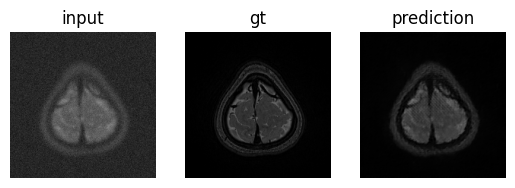

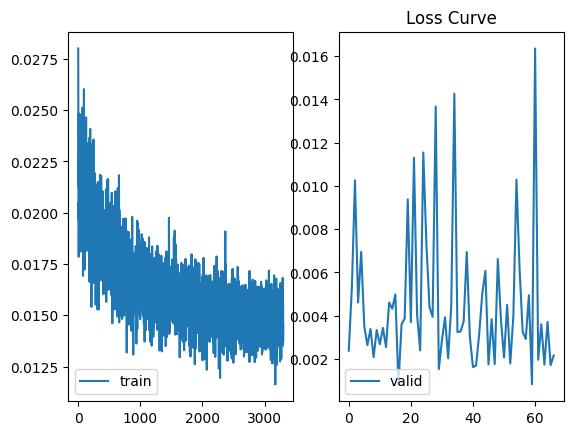

20it [00:01, 10.09it/s]


Epoch 3302, Loss: 0.014960940810851753


20it [00:02,  9.87it/s]


Epoch 3303, Loss: 0.015643388172611593


20it [00:02,  9.87it/s]


Epoch 3304, Loss: 0.01492955032736063


20it [00:02,  9.18it/s]


Epoch 3305, Loss: 0.015459433710202575


20it [00:02,  9.83it/s]


Epoch 3306, Loss: 0.013741571037098766


20it [00:02,  9.91it/s]


Epoch 3307, Loss: 0.015037552558351309


20it [00:01, 10.04it/s]


Epoch 3308, Loss: 0.014662560564465821


20it [00:02,  9.91it/s]


Epoch 3309, Loss: 0.013981170859187842


20it [00:02,  9.61it/s]


Epoch 3310, Loss: 0.01418614158174023


20it [00:01, 10.11it/s]


Epoch 3311, Loss: 0.014236707799136638


20it [00:02,  9.96it/s]


Epoch 3312, Loss: 0.014876329712569714


20it [00:02,  9.87it/s]


Epoch 3313, Loss: 0.013468842266593128


20it [00:01, 10.09it/s]


Epoch 3314, Loss: 0.01679578204639256


20it [00:01, 10.23it/s]


Epoch 3315, Loss: 0.014642029616516084


20it [00:02,  9.63it/s]


Epoch 3316, Loss: 0.015012101898901165


20it [00:01, 10.21it/s]


Epoch 3317, Loss: 0.015896666329354048


20it [00:01, 10.17it/s]


Epoch 3318, Loss: 0.015500317607074977


20it [00:01, 10.09it/s]


Epoch 3319, Loss: 0.013708037743344902


20it [00:02,  9.83it/s]


Epoch 3320, Loss: 0.014708167407661676


20it [00:02,  9.92it/s]


Epoch 3321, Loss: 0.014018636080436409


20it [00:01, 10.02it/s]


Epoch 3322, Loss: 0.015148334397235886


20it [00:02,  9.87it/s]


Epoch 3323, Loss: 0.015972261875867845


20it [00:01, 10.02it/s]


Epoch 3324, Loss: 0.016683475021272896


20it [00:02,  9.80it/s]


Epoch 3325, Loss: 0.012566873629111797


20it [00:02,  9.80it/s]


Epoch 3326, Loss: 0.01612851335667074


20it [00:01, 10.15it/s]


Epoch 3327, Loss: 0.016543985856696964


20it [00:02,  9.67it/s]


Epoch 3328, Loss: 0.015390141215175391


20it [00:01, 10.03it/s]


Epoch 3329, Loss: 0.014432705647777766


20it [00:02,  9.76it/s]


Epoch 3330, Loss: 0.014906384353525936


20it [00:02,  9.67it/s]


Epoch 3331, Loss: 0.01641291896812618


20it [00:01, 10.10it/s]


Epoch 3332, Loss: 0.013340541068464518


20it [00:01, 10.01it/s]


Epoch 3333, Loss: 0.013845114014111459


20it [00:02,  9.91it/s]


Epoch 3334, Loss: 0.0143825996783562


20it [00:01, 10.04it/s]


Epoch 3335, Loss: 0.015839394938666373


20it [00:01, 10.12it/s]


Epoch 3336, Loss: 0.015551956719718874


20it [00:02,  9.35it/s]


Epoch 3337, Loss: 0.012920573260635138


20it [00:02, 10.00it/s]


Epoch 3338, Loss: 0.014173996774479747


20it [00:01, 10.03it/s]


Epoch 3339, Loss: 0.015355165768414735


20it [00:01, 10.35it/s]


Epoch 3340, Loss: 0.014487692632246762


20it [00:02,  9.95it/s]


Epoch 3341, Loss: 0.01520065802615136


20it [00:01, 10.28it/s]


Epoch 3342, Loss: 0.014954780973494054


20it [00:02,  9.99it/s]


Epoch 3343, Loss: 0.01613322044722736


20it [00:02, 10.00it/s]


Epoch 3344, Loss: 0.013844036031514406


20it [00:02,  9.97it/s]


Epoch 3345, Loss: 0.015886793239042164


20it [00:02,  9.88it/s]


Epoch 3346, Loss: 0.0144666698994115


20it [00:02,  9.63it/s]


Epoch 3347, Loss: 0.014403651119209826


20it [00:01, 10.27it/s]


Epoch 3348, Loss: 0.015531247213948518


20it [00:01, 10.27it/s]


Epoch 3349, Loss: 0.015777748846448957


20it [00:01, 10.08it/s]


Epoch 3350, Loss: 0.015743775945156812


20it [00:02,  9.76it/s]

Epoch 3351, Loss: 0.014950148272328078



4it [00:00,  9.93it/s]


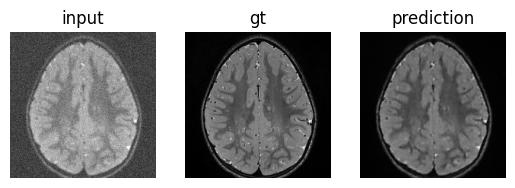

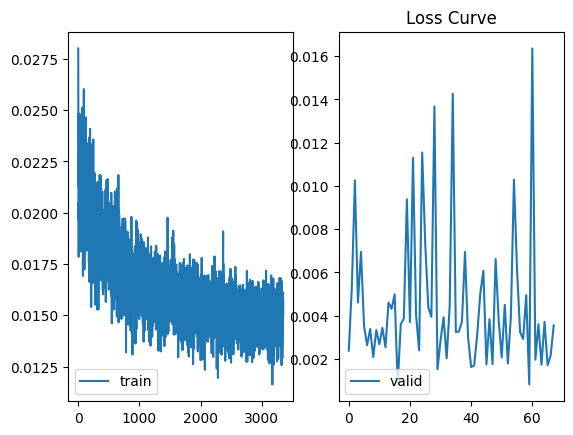

20it [00:01, 10.04it/s]


Epoch 3352, Loss: 0.014514759485609829


20it [00:01, 10.12it/s]


Epoch 3353, Loss: 0.013794501591473819


20it [00:01, 10.14it/s]


Epoch 3354, Loss: 0.015107641962822526


20it [00:01, 10.75it/s]


Epoch 3355, Loss: 0.014215126284398139


20it [00:02,  9.33it/s]


Epoch 3356, Loss: 0.012627158837858588


20it [00:01, 10.03it/s]


Epoch 3357, Loss: 0.014966267254203558


20it [00:01, 10.20it/s]


Epoch 3358, Loss: 0.015254221903160215


20it [00:01, 10.15it/s]


Epoch 3359, Loss: 0.014087621914222836


20it [00:02,  9.94it/s]


Epoch 3360, Loss: 0.014579485263675451


20it [00:01, 10.14it/s]


Epoch 3361, Loss: 0.015197365765925498


20it [00:01, 10.62it/s]


Epoch 3362, Loss: 0.015303966449573636


20it [00:02,  9.88it/s]


Epoch 3363, Loss: 0.014465957973152399


20it [00:01, 10.13it/s]


Epoch 3364, Loss: 0.013078244915232063


20it [00:02,  9.74it/s]


Epoch 3365, Loss: 0.015042419731616973


20it [00:02,  9.62it/s]


Epoch 3366, Loss: 0.014846451091580093


20it [00:02,  9.82it/s]


Epoch 3367, Loss: 0.01493773041293025


20it [00:02,  9.79it/s]


Epoch 3368, Loss: 0.013574570138007402


20it [00:02,  9.85it/s]


Epoch 3369, Loss: 0.014179327641613781


20it [00:02,  9.80it/s]


Epoch 3370, Loss: 0.014074066700413824


20it [00:01, 10.39it/s]


Epoch 3371, Loss: 0.014125393936410546


20it [00:01, 10.15it/s]


Epoch 3372, Loss: 0.014367619110271335


20it [00:01, 10.02it/s]


Epoch 3373, Loss: 0.013821226661093533


20it [00:02,  9.84it/s]


Epoch 3374, Loss: 0.014257091004401446


20it [00:01, 10.26it/s]


Epoch 3375, Loss: 0.013010864879470318


20it [00:02,  9.81it/s]


Epoch 3376, Loss: 0.01580856831278652


20it [00:02,  9.40it/s]


Epoch 3377, Loss: 0.01465563231613487


20it [00:01, 10.09it/s]


Epoch 3378, Loss: 0.014833006379194557


20it [00:02,  9.89it/s]


Epoch 3379, Loss: 0.0147492878139019


20it [00:01, 10.06it/s]


Epoch 3380, Loss: 0.015876510413363576


20it [00:02,  9.91it/s]


Epoch 3381, Loss: 0.013910402113106101


20it [00:01, 10.10it/s]


Epoch 3382, Loss: 0.015037697786465288


20it [00:02,  9.91it/s]


Epoch 3383, Loss: 0.014319434913340956


20it [00:01, 10.02it/s]


Epoch 3384, Loss: 0.014821898192167282


20it [00:02,  9.95it/s]


Epoch 3385, Loss: 0.013751079561188817


20it [00:01, 10.09it/s]


Epoch 3386, Loss: 0.01454867993015796


20it [00:01, 10.12it/s]


Epoch 3387, Loss: 0.015137779666110874


20it [00:02,  9.76it/s]


Epoch 3388, Loss: 0.014003328618127853


20it [00:01, 10.28it/s]


Epoch 3389, Loss: 0.014668433333281428


20it [00:02,  9.95it/s]


Epoch 3390, Loss: 0.014066670089960098


20it [00:01, 10.37it/s]


Epoch 3391, Loss: 0.012801455077715218


20it [00:02,  9.97it/s]


Epoch 3392, Loss: 0.014625839865766465


20it [00:01, 10.08it/s]


Epoch 3393, Loss: 0.01411272429395467


20it [00:02,  9.49it/s]


Epoch 3394, Loss: 0.01334024358075112


20it [00:02,  9.86it/s]


Epoch 3395, Loss: 0.014707903750240803


20it [00:02,  9.74it/s]


Epoch 3396, Loss: 0.01403515450656414


20it [00:02,  9.89it/s]


Epoch 3397, Loss: 0.01516023655422032


20it [00:01, 10.02it/s]


Epoch 3398, Loss: 0.01532525853253901


20it [00:02,  9.96it/s]


Epoch 3399, Loss: 0.013768205768428743


20it [00:02,  9.15it/s]


Epoch 3400, Loss: 0.014925107243470848


20it [00:02,  9.40it/s]

Epoch 3401, Loss: 0.015459843119606376



4it [00:00,  9.14it/s]


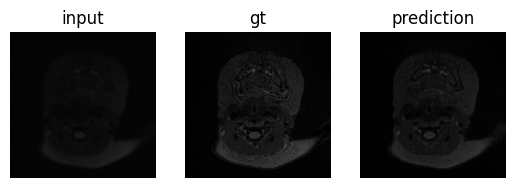

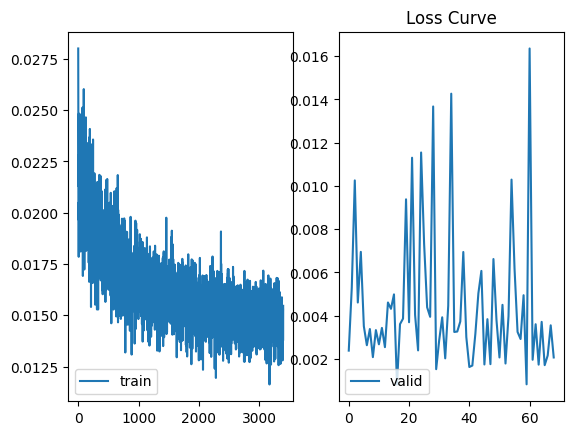

20it [00:02,  9.65it/s]


Epoch 3402, Loss: 0.014259723958093672


20it [00:02,  9.65it/s]


Epoch 3403, Loss: 0.014772418793290854


20it [00:02,  9.75it/s]


Epoch 3404, Loss: 0.015012872638180852


20it [00:02,  9.75it/s]


Epoch 3405, Loss: 0.013834236084949224


20it [00:02,  9.59it/s]


Epoch 3406, Loss: 0.014940011338330806


20it [00:02,  9.84it/s]


Epoch 3407, Loss: 0.015092791593633591


20it [00:01, 10.01it/s]


Epoch 3408, Loss: 0.01570084735285491


20it [00:02,  9.14it/s]


Epoch 3409, Loss: 0.016012243856675924


20it [00:02,  9.66it/s]


Epoch 3410, Loss: 0.014983426267281174


20it [00:02,  9.86it/s]


Epoch 3411, Loss: 0.014051978278439492


20it [00:02,  9.64it/s]


Epoch 3412, Loss: 0.014390212402213364


20it [00:02,  9.49it/s]


Epoch 3413, Loss: 0.014483826549258083


20it [00:01, 10.03it/s]


Epoch 3414, Loss: 0.013893125124741345


20it [00:02,  8.39it/s]


Epoch 3415, Loss: 0.015287185262423009


20it [00:02,  8.29it/s]


Epoch 3416, Loss: 0.013590062397997826


20it [00:02,  8.46it/s]


Epoch 3417, Loss: 0.014021076261997223


20it [00:02,  9.17it/s]


Epoch 3418, Loss: 0.014452498115133494


20it [00:02,  9.71it/s]


Epoch 3419, Loss: 0.01666672551073134


20it [00:02,  9.37it/s]


Epoch 3420, Loss: 0.014291764330118894


20it [00:02,  9.91it/s]


Epoch 3421, Loss: 0.01450556468917057


20it [00:01, 10.15it/s]


Epoch 3422, Loss: 0.013817134709097446


20it [00:01, 10.14it/s]


Epoch 3423, Loss: 0.014579423668328673


20it [00:01, 10.14it/s]


Epoch 3424, Loss: 0.013390808668918907


20it [00:02,  9.95it/s]


Epoch 3425, Loss: 0.014161244709976017


20it [00:01, 10.11it/s]


Epoch 3426, Loss: 0.011319342313800006


20it [00:01, 10.04it/s]


Epoch 3427, Loss: 0.013936988427303731


20it [00:01, 10.14it/s]


Epoch 3428, Loss: 0.013804178382270039


20it [00:01, 10.14it/s]


Epoch 3429, Loss: 0.013733296922873705


20it [00:02,  9.92it/s]


Epoch 3430, Loss: 0.013977480388712138


20it [00:02,  9.87it/s]


Epoch 3431, Loss: 0.013306145998649299


20it [00:02,  9.84it/s]


Epoch 3432, Loss: 0.012524128973018378


20it [00:01, 10.12it/s]


Epoch 3433, Loss: 0.015449973533395677


20it [00:01, 10.03it/s]


Epoch 3434, Loss: 0.014286909310612828


20it [00:02,  9.86it/s]


Epoch 3435, Loss: 0.014125181874260307


20it [00:02, 10.00it/s]


Epoch 3436, Loss: 0.01563756268005818


20it [00:01, 10.18it/s]


Epoch 3437, Loss: 0.016189749469049275


20it [00:01, 10.19it/s]


Epoch 3438, Loss: 0.015138803515583277


20it [00:01, 10.16it/s]


Epoch 3439, Loss: 0.014075910649262368


20it [00:01, 10.16it/s]


Epoch 3440, Loss: 0.01470438817050308


20it [00:02,  9.76it/s]


Epoch 3441, Loss: 0.015661333315074445


20it [00:02,  9.78it/s]


Epoch 3442, Loss: 0.016420189663767813


20it [00:01, 10.03it/s]


Epoch 3443, Loss: 0.01482561823213473


20it [00:02,  9.98it/s]


Epoch 3444, Loss: 0.015161686786450445


20it [00:02,  9.74it/s]


Epoch 3445, Loss: 0.014760866679716855


20it [00:02,  9.46it/s]


Epoch 3446, Loss: 0.016236818046309054


20it [00:01, 10.02it/s]


Epoch 3447, Loss: 0.013804658851586282


20it [00:02,  9.74it/s]


Epoch 3448, Loss: 0.015096890297718346


20it [00:02,  9.84it/s]


Epoch 3449, Loss: 0.016458466113545


20it [00:01, 10.56it/s]


Epoch 3450, Loss: 0.015711090271361174


20it [00:02,  9.96it/s]

Epoch 3451, Loss: 0.015122852753847837



4it [00:00,  8.20it/s]


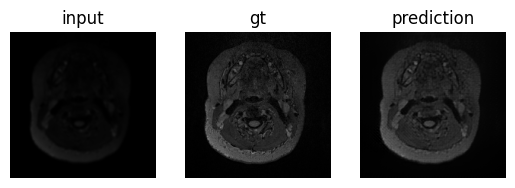

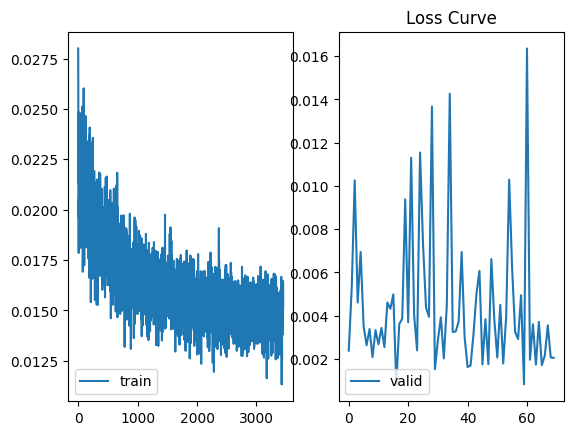

20it [00:01, 10.19it/s]


Epoch 3452, Loss: 0.01622018769849092


20it [00:01, 10.14it/s]


Epoch 3453, Loss: 0.016320943809114398


20it [00:01, 10.37it/s]


Epoch 3454, Loss: 0.014937931159511208


20it [00:02,  9.76it/s]


Epoch 3455, Loss: 0.013880852854344993


20it [00:02,  9.90it/s]


Epoch 3456, Loss: 0.01185971919912845


20it [00:02,  9.68it/s]


Epoch 3457, Loss: 0.015481994766741992


20it [00:02,  9.83it/s]


Epoch 3458, Loss: 0.0156062803696841


20it [00:02,  9.98it/s]


Epoch 3459, Loss: 0.014499764144420623


20it [00:02,  9.63it/s]


Epoch 3460, Loss: 0.015729450597427787


20it [00:02,  9.85it/s]


Epoch 3461, Loss: 0.01364361885935068


20it [00:02,  9.16it/s]


Epoch 3462, Loss: 0.013819889060687273


20it [00:01, 10.15it/s]


Epoch 3463, Loss: 0.014413508214056492


20it [00:01, 10.01it/s]


Epoch 3464, Loss: 0.015800346166361123


20it [00:02,  9.95it/s]


Epoch 3465, Loss: 0.013767836068291217


20it [00:02,  9.70it/s]


Epoch 3466, Loss: 0.015444677352206782


20it [00:02,  9.89it/s]


Epoch 3467, Loss: 0.01563794834073633


20it [00:01, 10.02it/s]


Epoch 3468, Loss: 0.01331314940471202


20it [00:01, 10.27it/s]


Epoch 3469, Loss: 0.01584331118501723


20it [00:01, 10.33it/s]


Epoch 3470, Loss: 0.013829263742081821


20it [00:02,  9.93it/s]


Epoch 3471, Loss: 0.015344158071093262


20it [00:02,  9.84it/s]


Epoch 3472, Loss: 0.013908463320694864


20it [00:01, 10.00it/s]


Epoch 3473, Loss: 0.013973407447338104


20it [00:01, 10.15it/s]


Epoch 3474, Loss: 0.015364149620290845


20it [00:02,  9.97it/s]


Epoch 3475, Loss: 0.015204333607107401


20it [00:01, 10.11it/s]


Epoch 3476, Loss: 0.015161562699358911


20it [00:02,  9.87it/s]


Epoch 3477, Loss: 0.014949804078787566


20it [00:01, 10.19it/s]


Epoch 3478, Loss: 0.014418962551280856


20it [00:01, 10.02it/s]


Epoch 3479, Loss: 0.014806229737587273


20it [00:02,  9.87it/s]


Epoch 3480, Loss: 0.015596902009565383


20it [00:02,  9.91it/s]


Epoch 3481, Loss: 0.014847691368777305


20it [00:02,  9.87it/s]


Epoch 3482, Loss: 0.015524182887747883


20it [00:01, 10.05it/s]


Epoch 3483, Loss: 0.01519741523079574


20it [00:01, 10.02it/s]


Epoch 3484, Loss: 0.013899171096272766


20it [00:02,  9.79it/s]


Epoch 3485, Loss: 0.013668395183049142


20it [00:01, 10.45it/s]


Epoch 3486, Loss: 0.015772853326052428


20it [00:02,  9.95it/s]


Epoch 3487, Loss: 0.013421886949799955


20it [00:02,  9.99it/s]


Epoch 3488, Loss: 0.01583845547866076


20it [00:01, 10.03it/s]


Epoch 3489, Loss: 0.015607461682520807


20it [00:01, 10.10it/s]


Epoch 3490, Loss: 0.014782677602488548


20it [00:01, 10.18it/s]


Epoch 3491, Loss: 0.015038394764997066


20it [00:02,  9.84it/s]


Epoch 3492, Loss: 0.015233179880306124


20it [00:02,  9.87it/s]


Epoch 3493, Loss: 0.0132780977524817


20it [00:02,  9.41it/s]


Epoch 3494, Loss: 0.01365595671813935


20it [00:01, 10.10it/s]


Epoch 3495, Loss: 0.014380040729884058


20it [00:02,  9.73it/s]


Epoch 3496, Loss: 0.015021596802398562


20it [00:02,  9.99it/s]


Epoch 3497, Loss: 0.013558660633862019


20it [00:01, 10.07it/s]


Epoch 3498, Loss: 0.015637939772568644


20it [00:01, 10.01it/s]


Epoch 3499, Loss: 0.01486487730871886


20it [00:02,  9.82it/s]


Epoch 3500, Loss: 0.014328696043230593


20it [00:02,  9.88it/s]

Epoch 3501, Loss: 0.013232854858506471



4it [00:00,  9.19it/s]


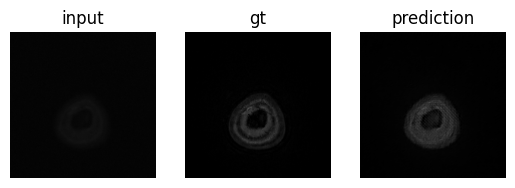

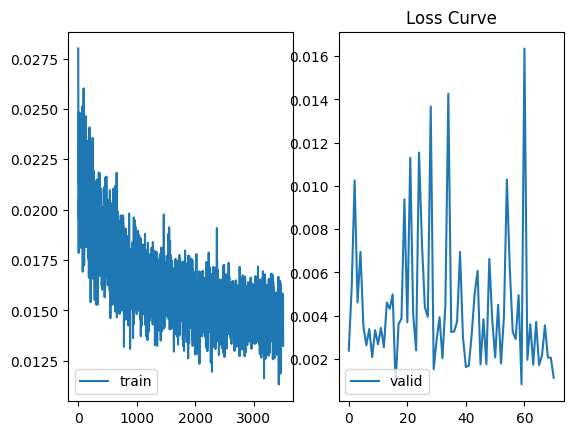

20it [00:02,  9.71it/s]


Epoch 3502, Loss: 0.016132053546607496


20it [00:02,  9.84it/s]


Epoch 3503, Loss: 0.014594343188218773


20it [00:02,  9.75it/s]


Epoch 3504, Loss: 0.015500616654753685


20it [00:02,  9.81it/s]


Epoch 3505, Loss: 0.014565933390986174


20it [00:02,  9.98it/s]


Epoch 3506, Loss: 0.015072866575792432


20it [00:01, 10.33it/s]


Epoch 3507, Loss: 0.014091766474302858


20it [00:02,  9.91it/s]


Epoch 3508, Loss: 0.013693196093663573


20it [00:01, 10.27it/s]


Epoch 3509, Loss: 0.013945228001102806


20it [00:02,  9.89it/s]


Epoch 3510, Loss: 0.014699548156931997


20it [00:01, 10.16it/s]


Epoch 3511, Loss: 0.015417091664858162


20it [00:01, 10.05it/s]


Epoch 3512, Loss: 0.01570882755331695


20it [00:02,  9.42it/s]


Epoch 3513, Loss: 0.011409250961150974


20it [00:02,  9.89it/s]


Epoch 3514, Loss: 0.013673774409107864


20it [00:01, 10.14it/s]


Epoch 3515, Loss: 0.01532816404942423


20it [00:01, 10.47it/s]


Epoch 3516, Loss: 0.014368619373999535


20it [00:02,  9.96it/s]


Epoch 3517, Loss: 0.015555944736115634


20it [00:01, 10.08it/s]


Epoch 3518, Loss: 0.014964547497220338


20it [00:02, 10.00it/s]


Epoch 3519, Loss: 0.014471886307001114


20it [00:02,  9.65it/s]


Epoch 3520, Loss: 0.015798073122277857


20it [00:02,  9.65it/s]


Epoch 3521, Loss: 0.014626194187439979


20it [00:02,  9.89it/s]


Epoch 3522, Loss: 0.014071559871081264


20it [00:01, 10.11it/s]


Epoch 3523, Loss: 0.015303338808007539


20it [00:02,  9.34it/s]


Epoch 3524, Loss: 0.015240539168007671


20it [00:01, 10.11it/s]


Epoch 3525, Loss: 0.013668014807626605


20it [00:01, 10.37it/s]


Epoch 3526, Loss: 0.014385405089706182


20it [00:02,  9.53it/s]


Epoch 3527, Loss: 0.0147318399627693


20it [00:01, 10.17it/s]


Epoch 3528, Loss: 0.015072664571925997


20it [00:01, 10.22it/s]


Epoch 3529, Loss: 0.015018219780176877


20it [00:01, 10.05it/s]


Epoch 3530, Loss: 0.015642738912720233


20it [00:01, 10.06it/s]


Epoch 3531, Loss: 0.013891356578096748


20it [00:01, 10.81it/s]


Epoch 3532, Loss: 0.01546897868392989


20it [00:01, 10.03it/s]


Epoch 3533, Loss: 0.01359969899058342


20it [00:02,  9.84it/s]


Epoch 3534, Loss: 0.015157537581399084


20it [00:02,  9.28it/s]


Epoch 3535, Loss: 0.01638557962141931


20it [00:02,  9.80it/s]


Epoch 3536, Loss: 0.01702901148237288


20it [00:01, 10.03it/s]


Epoch 3537, Loss: 0.016396434884518384


20it [00:01, 10.07it/s]


Epoch 3538, Loss: 0.01572794511448592


20it [00:01, 10.05it/s]


Epoch 3539, Loss: 0.0167518189875409


20it [00:01, 10.26it/s]


Epoch 3540, Loss: 0.01579498902428895


20it [00:02,  9.70it/s]


Epoch 3541, Loss: 0.014377864659763873


20it [00:01, 10.11it/s]


Epoch 3542, Loss: 0.01704870236571878


20it [00:02,  9.91it/s]


Epoch 3543, Loss: 0.015627280180342495


20it [00:01, 10.39it/s]


Epoch 3544, Loss: 0.014429078449029475


20it [00:02,  9.53it/s]


Epoch 3545, Loss: 0.012905145157128572


20it [00:01, 10.18it/s]


Epoch 3546, Loss: 0.01774476789869368


20it [00:01, 10.48it/s]


Epoch 3547, Loss: 0.015492283715866506


20it [00:01, 10.28it/s]


Epoch 3548, Loss: 0.016219770582392812


20it [00:02,  9.90it/s]


Epoch 3549, Loss: 0.01530074847396463


20it [00:02,  9.79it/s]


Epoch 3550, Loss: 0.01546610965160653


20it [00:01, 10.68it/s]

Epoch 3551, Loss: 0.01564836441539228



4it [00:00, 10.48it/s]


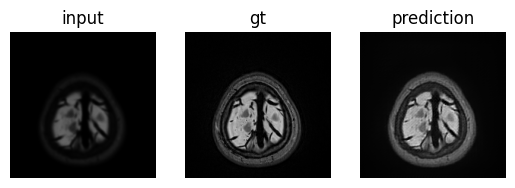

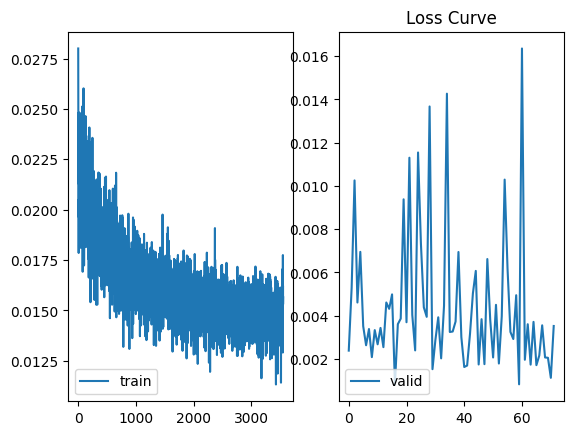

20it [00:02,  9.66it/s]


Epoch 3552, Loss: 0.016170238028280437


20it [00:02,  9.92it/s]


Epoch 3553, Loss: 0.0144557872437872


20it [00:02, 10.00it/s]


Epoch 3554, Loss: 0.014875372941605746


20it [00:02,  9.38it/s]


Epoch 3555, Loss: 0.014975478779524565


20it [00:02,  9.89it/s]


Epoch 3556, Loss: 0.015667015640065073


20it [00:01, 10.13it/s]


Epoch 3557, Loss: 0.013303907203953714


20it [00:02,  9.78it/s]


Epoch 3558, Loss: 0.014682381204329431


20it [00:01, 10.17it/s]


Epoch 3559, Loss: 0.014298789645545184


20it [00:01, 10.08it/s]


Epoch 3560, Loss: 0.01377143240533769


20it [00:01, 10.18it/s]


Epoch 3561, Loss: 0.015580488834530115


20it [00:01, 10.00it/s]


Epoch 3562, Loss: 0.016171853360719978


20it [00:02,  9.85it/s]


Epoch 3563, Loss: 0.013925638352520763


20it [00:02,  9.21it/s]


Epoch 3564, Loss: 0.015103308705147356


20it [00:02,  9.96it/s]


Epoch 3565, Loss: 0.01407652657944709


20it [00:02,  9.32it/s]


Epoch 3566, Loss: 0.014176035416312516


20it [00:02,  9.92it/s]


Epoch 3567, Loss: 0.01513523143948987


20it [00:01, 10.17it/s]


Epoch 3568, Loss: 0.013056256854906679


20it [00:02,  9.88it/s]


Epoch 3569, Loss: 0.015042467135936021


20it [00:01, 10.30it/s]


Epoch 3570, Loss: 0.013707890268415212


20it [00:02,  9.76it/s]


Epoch 3571, Loss: 0.014173370855860411


20it [00:02,  9.75it/s]


Epoch 3572, Loss: 0.015131225012009964


20it [00:01, 10.08it/s]


Epoch 3573, Loss: 0.013918784086126835


20it [00:02,  9.71it/s]


Epoch 3574, Loss: 0.01623991262167692


20it [00:01, 10.28it/s]


Epoch 3575, Loss: 0.015009048441424967


20it [00:01, 10.34it/s]


Epoch 3576, Loss: 0.0159877187339589


20it [00:02,  9.58it/s]


Epoch 3577, Loss: 0.014201478252653032


20it [00:02,  9.80it/s]


Epoch 3578, Loss: 0.015105911274440586


20it [00:02, 10.00it/s]


Epoch 3579, Loss: 0.013294936728198082


20it [00:01, 10.15it/s]


Epoch 3580, Loss: 0.014197571738623082


20it [00:02,  9.85it/s]


Epoch 3581, Loss: 0.013737762742675842


20it [00:01, 10.26it/s]


Epoch 3582, Loss: 0.01579550534952432


20it [00:02,  9.84it/s]


Epoch 3583, Loss: 0.012846885970793665


20it [00:01, 10.00it/s]


Epoch 3584, Loss: 0.014884703536517918


20it [00:02,  9.83it/s]


Epoch 3585, Loss: 0.01451858967775479


20it [00:01, 10.24it/s]


Epoch 3586, Loss: 0.012523119815159588


20it [00:02,  9.49it/s]


Epoch 3587, Loss: 0.015032334602437913


20it [00:01, 10.11it/s]


Epoch 3588, Loss: 0.016243486059829594


20it [00:01, 10.07it/s]


Epoch 3589, Loss: 0.013298951741307973


20it [00:01, 10.26it/s]


Epoch 3590, Loss: 0.01494531073840335


20it [00:02,  9.94it/s]


Epoch 3591, Loss: 0.01523563904920593


20it [00:02,  9.91it/s]


Epoch 3592, Loss: 0.013643375143874436


20it [00:02,  9.77it/s]


Epoch 3593, Loss: 0.015568168147001415


20it [00:02,  9.97it/s]


Epoch 3594, Loss: 0.014495999715290964


20it [00:02,  9.82it/s]


Epoch 3595, Loss: 0.016046292893588544


20it [00:02,  9.87it/s]


Epoch 3596, Loss: 0.014848395809531212


20it [00:02,  9.65it/s]


Epoch 3597, Loss: 0.014286049781367183


20it [00:02,  9.98it/s]


Epoch 3598, Loss: 0.015050914324820041


20it [00:02,  9.89it/s]


Epoch 3599, Loss: 0.014171482506208121


20it [00:02,  9.90it/s]


Epoch 3600, Loss: 0.015697799669578672


20it [00:01, 10.19it/s]

Epoch 3601, Loss: 0.01327506941743195



4it [00:00, 10.55it/s]


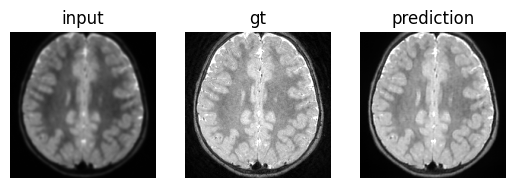

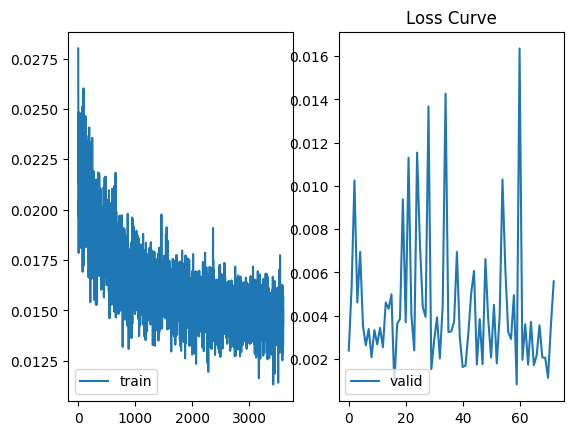

20it [00:01, 10.08it/s]


Epoch 3602, Loss: 0.015281830029562116


20it [00:01, 10.17it/s]


Epoch 3603, Loss: 0.015245908219367266


20it [00:01, 10.10it/s]


Epoch 3604, Loss: 0.012581953557673841


20it [00:01, 10.21it/s]


Epoch 3605, Loss: 0.013921633432619273


20it [00:02,  9.31it/s]


Epoch 3606, Loss: 0.014728548482526093


20it [00:02,  9.94it/s]


Epoch 3607, Loss: 0.01392861136700958


20it [00:01, 10.18it/s]


Epoch 3608, Loss: 0.015155401290394365


20it [00:01, 10.25it/s]


Epoch 3609, Loss: 0.014252626453526318


20it [00:01, 10.38it/s]


Epoch 3610, Loss: 0.01520960833877325


20it [00:02,  9.95it/s]


Epoch 3611, Loss: 0.01191380734089762


20it [00:02,  9.83it/s]


Epoch 3612, Loss: 0.01366395023651421


20it [00:02,  9.85it/s]


Epoch 3613, Loss: 0.014092805050313472


20it [00:01, 10.09it/s]


Epoch 3614, Loss: 0.01522166330832988


20it [00:02,  9.70it/s]


Epoch 3615, Loss: 0.015814929734915495


20it [00:01, 10.04it/s]


Epoch 3616, Loss: 0.014614674251060934


20it [00:02,  9.62it/s]


Epoch 3617, Loss: 0.014421800477430224


20it [00:02,  9.68it/s]


Epoch 3618, Loss: 0.015010545658878983


20it [00:01, 10.09it/s]


Epoch 3619, Loss: 0.012530853389762342


20it [00:02,  9.85it/s]


Epoch 3620, Loss: 0.014052281575277447


20it [00:02,  9.73it/s]


Epoch 3621, Loss: 0.014588098227977752


20it [00:02,  9.66it/s]


Epoch 3622, Loss: 0.01503917882218957


20it [00:02,  9.73it/s]


Epoch 3623, Loss: 0.014968751545529813


20it [00:02,  9.86it/s]


Epoch 3624, Loss: 0.014693418750539422


20it [00:02,  9.83it/s]


Epoch 3625, Loss: 0.015389404678717255


20it [00:01, 10.05it/s]


Epoch 3626, Loss: 0.014555053471121937


20it [00:02,  9.98it/s]


Epoch 3627, Loss: 0.013943071989342571


20it [00:02,  9.66it/s]


Epoch 3628, Loss: 0.015823241882026197


20it [00:01, 10.40it/s]


Epoch 3629, Loss: 0.01374529991298914


20it [00:02,  9.85it/s]


Epoch 3630, Loss: 0.014417049894109368


20it [00:01, 10.28it/s]


Epoch 3631, Loss: 0.0147362558869645


20it [00:01, 10.21it/s]


Epoch 3632, Loss: 0.015335446293465792


20it [00:01, 10.05it/s]


Epoch 3633, Loss: 0.015462816855870188


20it [00:01, 10.21it/s]


Epoch 3634, Loss: 0.01488143503665924


20it [00:02,  9.87it/s]


Epoch 3635, Loss: 0.015246496349573136


20it [00:01, 10.15it/s]


Epoch 3636, Loss: 0.014504168136045336


20it [00:02,  9.83it/s]


Epoch 3637, Loss: 0.014932915195822715


20it [00:02,  9.69it/s]


Epoch 3638, Loss: 0.013482424349058419


20it [00:02,  9.76it/s]


Epoch 3639, Loss: 0.016079820320010187


20it [00:02,  9.93it/s]


Epoch 3640, Loss: 0.01459547218400985


20it [00:02,  9.99it/s]


Epoch 3641, Loss: 0.014441356179304421


20it [00:02,  9.91it/s]


Epoch 3642, Loss: 0.014456801163032652


20it [00:02,  9.92it/s]


Epoch 3643, Loss: 0.01377693172544241


20it [00:01, 10.03it/s]


Epoch 3644, Loss: 0.014486335148103536


20it [00:01, 10.18it/s]


Epoch 3645, Loss: 0.012887505872640759


20it [00:02,  9.90it/s]


Epoch 3646, Loss: 0.015969851147383453


20it [00:01, 10.27it/s]


Epoch 3647, Loss: 0.013934355648234486


20it [00:02,  9.57it/s]


Epoch 3648, Loss: 0.014405737491324544


20it [00:02,  9.83it/s]


Epoch 3649, Loss: 0.01509875493356958


20it [00:01, 10.19it/s]


Epoch 3650, Loss: 0.013727786403615027


20it [00:02,  9.60it/s]

Epoch 3651, Loss: 0.0153194424463436



4it [00:00, 10.03it/s]


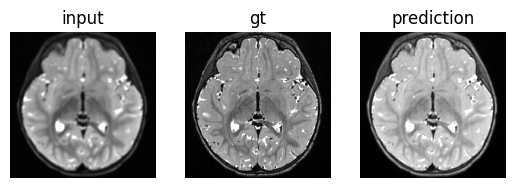

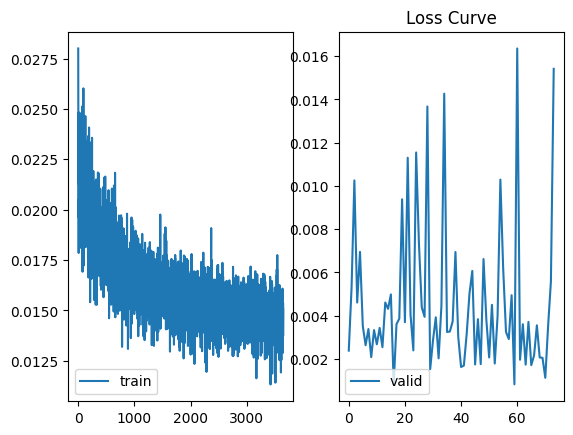

20it [00:02,  9.88it/s]


Epoch 3652, Loss: 0.013974972907453776


20it [00:02,  9.90it/s]


Epoch 3653, Loss: 0.01436210134997964


20it [00:01, 10.10it/s]


Epoch 3654, Loss: 0.014902221993543208


20it [00:02,  9.95it/s]


Epoch 3655, Loss: 0.013244324061088265


20it [00:01, 10.05it/s]


Epoch 3656, Loss: 0.01512787448009476


20it [00:02,  9.35it/s]


Epoch 3657, Loss: 0.014287820924073458


20it [00:01, 10.34it/s]


Epoch 3658, Loss: 0.015418026805855333


20it [00:02,  9.96it/s]


Epoch 3659, Loss: 0.015625490946695207


20it [00:02,  9.95it/s]


Epoch 3660, Loss: 0.014323436981067061


20it [00:02,  9.90it/s]


Epoch 3661, Loss: 0.013658333057537674


20it [00:02,  9.90it/s]


Epoch 3662, Loss: 0.014470447949133814


20it [00:02,  9.92it/s]


Epoch 3663, Loss: 0.013727258669678121


20it [00:02,  9.78it/s]


Epoch 3664, Loss: 0.014922613091766835


20it [00:02,  9.94it/s]


Epoch 3665, Loss: 0.01304931758204475


20it [00:01, 10.02it/s]


Epoch 3666, Loss: 0.015549319563433528


20it [00:02,  9.28it/s]


Epoch 3667, Loss: 0.014372862863820047


20it [00:02,  9.98it/s]


Epoch 3668, Loss: 0.014444811607245357


20it [00:02,  9.86it/s]


Epoch 3669, Loss: 0.015061796992085874


20it [00:01, 10.24it/s]


Epoch 3670, Loss: 0.013828077749349178


20it [00:01, 10.23it/s]


Epoch 3671, Loss: 0.015374012454412878


20it [00:01, 10.13it/s]


Epoch 3672, Loss: 0.015061620785854758


20it [00:02,  9.61it/s]


Epoch 3673, Loss: 0.014972099103033543


20it [00:01, 10.33it/s]


Epoch 3674, Loss: 0.015423493180423974


20it [00:02,  9.88it/s]


Epoch 3675, Loss: 0.014976141601800918


20it [00:02,  9.64it/s]


Epoch 3676, Loss: 0.015387823758646845


20it [00:01, 10.10it/s]


Epoch 3677, Loss: 0.01427237361203879


20it [00:02,  9.47it/s]


Epoch 3678, Loss: 0.015135083720088005


20it [00:02,  9.77it/s]


Epoch 3679, Loss: 0.01385292075574398


20it [00:01, 10.23it/s]


Epoch 3680, Loss: 0.014673198806121945


20it [00:02,  9.84it/s]


Epoch 3681, Loss: 0.014994169655255973


20it [00:02,  9.95it/s]


Epoch 3682, Loss: 0.01512816755566746


20it [00:02,  9.93it/s]


Epoch 3683, Loss: 0.01582781507167965


20it [00:02,  9.77it/s]


Epoch 3684, Loss: 0.015145551227033139


20it [00:02,  9.84it/s]


Epoch 3685, Loss: 0.015352187375538052


20it [00:01, 10.02it/s]


Epoch 3686, Loss: 0.012980981718283147


20it [00:01, 10.07it/s]


Epoch 3687, Loss: 0.01405127354664728


20it [00:02,  9.61it/s]


Epoch 3688, Loss: 0.015187313361093403


20it [00:02,  9.64it/s]


Epoch 3689, Loss: 0.014073896501213313


20it [00:01, 10.10it/s]


Epoch 3690, Loss: 0.014018009509891271


20it [00:01, 10.29it/s]


Epoch 3691, Loss: 0.01456832850817591


20it [00:02,  9.52it/s]


Epoch 3692, Loss: 0.015196316340006889


20it [00:01, 10.12it/s]


Epoch 3693, Loss: 0.014616771787405013


20it [00:02,  9.54it/s]


Epoch 3694, Loss: 0.015083939977921545


20it [00:01, 10.02it/s]


Epoch 3695, Loss: 0.014266724057961255


20it [00:02,  9.79it/s]


Epoch 3696, Loss: 0.013823455071542413


20it [00:01, 10.01it/s]


Epoch 3697, Loss: 0.013374350767116993


20it [00:01, 10.02it/s]


Epoch 3698, Loss: 0.01541297642979771


20it [00:02,  9.71it/s]


Epoch 3699, Loss: 0.015084173041395843


20it [00:02,  9.89it/s]


Epoch 3700, Loss: 0.012191665032878518


20it [00:02,  9.91it/s]

Epoch 3701, Loss: 0.014279380906373262



4it [00:00,  9.88it/s]


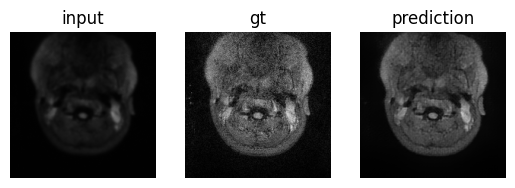

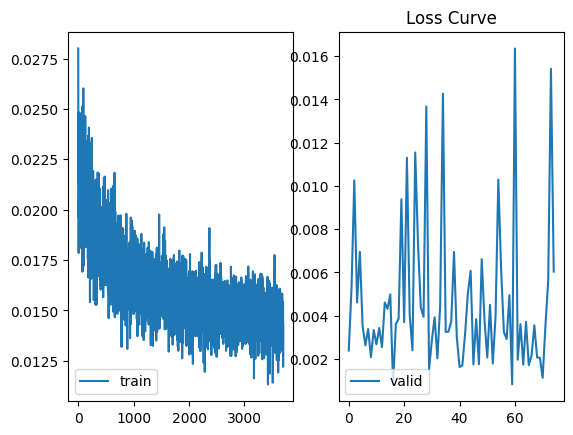

20it [00:02,  9.64it/s]


Epoch 3702, Loss: 0.014796650619246066


20it [00:01, 10.29it/s]


Epoch 3703, Loss: 0.01273330980911851


20it [00:02,  9.55it/s]


Epoch 3704, Loss: 0.01546450243331492


20it [00:02,  9.88it/s]


Epoch 3705, Loss: 0.015318322519306093


20it [00:01, 10.10it/s]


Epoch 3706, Loss: 0.016016185679472984


20it [00:02,  9.82it/s]


Epoch 3707, Loss: 0.015436178422532976


20it [00:02,  9.80it/s]


Epoch 3708, Loss: 0.014903636160306632


20it [00:02,  9.39it/s]


Epoch 3709, Loss: 0.01585277309641242


20it [00:02,  9.82it/s]


Epoch 3710, Loss: 0.017421174165792763


20it [00:01, 10.02it/s]


Epoch 3711, Loss: 0.0154589522164315


20it [00:01, 10.05it/s]


Epoch 3712, Loss: 0.017245362792164088


20it [00:02,  9.99it/s]


Epoch 3713, Loss: 0.01539370371028781


20it [00:02,  9.76it/s]


Epoch 3714, Loss: 0.015023494546767324


20it [00:02, 10.00it/s]


Epoch 3715, Loss: 0.01578494058921933


20it [00:01, 10.13it/s]


Epoch 3716, Loss: 0.015684498497284947


20it [00:02,  9.86it/s]


Epoch 3717, Loss: 0.016576955025084317


20it [00:02,  9.82it/s]


Epoch 3718, Loss: 0.016217319248244166


20it [00:01, 10.01it/s]


Epoch 3719, Loss: 0.01603196170181036


20it [00:02,  9.58it/s]


Epoch 3720, Loss: 0.0166773273027502


20it [00:01, 10.05it/s]


Epoch 3721, Loss: 0.01601774455048144


20it [00:02,  9.97it/s]


Epoch 3722, Loss: 0.014939376711845398


20it [00:01, 10.40it/s]


Epoch 3723, Loss: 0.011858623777516186


20it [00:02,  9.86it/s]


Epoch 3724, Loss: 0.015720445371698588


20it [00:02,  9.60it/s]


Epoch 3725, Loss: 0.01394583226647228


20it [00:02,  9.85it/s]


Epoch 3726, Loss: 0.015555798797868193


20it [00:02,  9.92it/s]


Epoch 3727, Loss: 0.014533207297790795


20it [00:01, 10.12it/s]


Epoch 3728, Loss: 0.015024678688496352


20it [00:02,  9.90it/s]


Epoch 3729, Loss: 0.014619077695533634


20it [00:02,  9.59it/s]


Epoch 3730, Loss: 0.015393708203919231


20it [00:01, 10.05it/s]


Epoch 3731, Loss: 0.01496586981229484


20it [00:01, 10.09it/s]


Epoch 3732, Loss: 0.015863388823345304


20it [00:01, 10.12it/s]


Epoch 3733, Loss: 0.015233254723716528


20it [00:02,  9.99it/s]


Epoch 3734, Loss: 0.012423267704434693


20it [00:02,  9.90it/s]


Epoch 3735, Loss: 0.012696135020814837


20it [00:02,  9.71it/s]


Epoch 3736, Loss: 0.014696820790413767


20it [00:01, 10.27it/s]


Epoch 3737, Loss: 0.01437159264460206


20it [00:02,  9.97it/s]


Epoch 3738, Loss: 0.014143493061419576


20it [00:01, 10.50it/s]


Epoch 3739, Loss: 0.014557639905251562


20it [00:02,  9.19it/s]


Epoch 3740, Loss: 0.012999353965278715


20it [00:01, 10.36it/s]


Epoch 3741, Loss: 0.015796358627267183


20it [00:01, 10.43it/s]


Epoch 3742, Loss: 0.013557755702640862


20it [00:01, 10.32it/s]


Epoch 3743, Loss: 0.014156361692585051


20it [00:02,  9.93it/s]


Epoch 3744, Loss: 0.014422151364851744


20it [00:01, 10.15it/s]


Epoch 3745, Loss: 0.01508499716874212


20it [00:01, 10.08it/s]


Epoch 3746, Loss: 0.014206144283525646


20it [00:02,  9.68it/s]


Epoch 3747, Loss: 0.013613289827480913


20it [00:02,  9.81it/s]


Epoch 3748, Loss: 0.013857002486474812


20it [00:01, 10.16it/s]


Epoch 3749, Loss: 0.014467659941874444


20it [00:01, 10.06it/s]


Epoch 3750, Loss: 0.015258521866053342


20it [00:02,  9.58it/s]

Epoch 3751, Loss: 0.014453264488838612



4it [00:00,  9.16it/s]


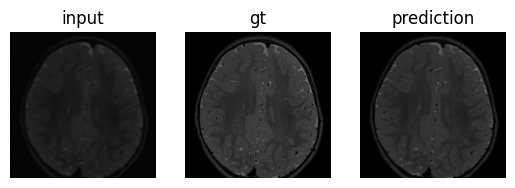

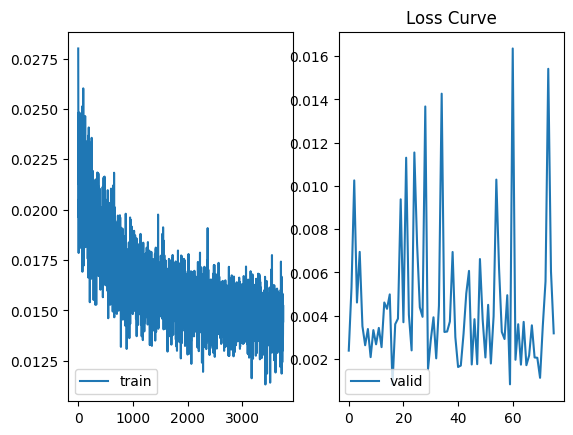

20it [00:01, 10.20it/s]


Epoch 3752, Loss: 0.015220695734024048


20it [00:01, 10.07it/s]


Epoch 3753, Loss: 0.013994546816684305


20it [00:01, 10.04it/s]


Epoch 3754, Loss: 0.015436634514480829


20it [00:02,  9.91it/s]


Epoch 3755, Loss: 0.01575446976348758


20it [00:02,  9.82it/s]


Epoch 3756, Loss: 0.01372114655096084


20it [00:01, 10.09it/s]


Epoch 3757, Loss: 0.014613422483671456


20it [00:02,  9.83it/s]


Epoch 3758, Loss: 0.013633703021332622


20it [00:01, 10.10it/s]


Epoch 3759, Loss: 0.014240409270860255


20it [00:02,  9.76it/s]


Epoch 3760, Loss: 0.015326498844660818


20it [00:02,  9.75it/s]


Epoch 3761, Loss: 0.015586782316677272


20it [00:02,  9.74it/s]


Epoch 3762, Loss: 0.015274731232784689


20it [00:01, 10.02it/s]


Epoch 3763, Loss: 0.014210678066592663


20it [00:01, 10.07it/s]


Epoch 3764, Loss: 0.014439396909438074


20it [00:01, 10.19it/s]


Epoch 3765, Loss: 0.014153264975175262


20it [00:02,  9.76it/s]


Epoch 3766, Loss: 0.01516868241596967


20it [00:02,  9.87it/s]


Epoch 3767, Loss: 0.014410499180667103


20it [00:01, 10.17it/s]


Epoch 3768, Loss: 0.013923495064955205


20it [00:02,  9.94it/s]


Epoch 3769, Loss: 0.015486802859231829


20it [00:01, 10.10it/s]


Epoch 3770, Loss: 0.013597181264776737


20it [00:02,  9.82it/s]


Epoch 3771, Loss: 0.014529477851465345


20it [00:02,  9.99it/s]


Epoch 3772, Loss: 0.015078207524493337


20it [00:02,  9.80it/s]


Epoch 3773, Loss: 0.01414352075662464


20it [00:02,  9.76it/s]


Epoch 3774, Loss: 0.013167888054158538


20it [00:01, 10.02it/s]


Epoch 3775, Loss: 0.014724371861666441


20it [00:01, 10.32it/s]


Epoch 3776, Loss: 0.015271998988464475


20it [00:02,  9.80it/s]


Epoch 3777, Loss: 0.014750887919217349


20it [00:01, 10.39it/s]


Epoch 3778, Loss: 0.015718053071759643


20it [00:02,  9.68it/s]


Epoch 3779, Loss: 0.015044094203040004


20it [00:01, 10.53it/s]


Epoch 3780, Loss: 0.013971633103210479


20it [00:01, 10.08it/s]


Epoch 3781, Loss: 0.015246685384772718


20it [00:02,  9.36it/s]


Epoch 3782, Loss: 0.015739589487202464


20it [00:02,  9.84it/s]


Epoch 3783, Loss: 0.01602657404728234


20it [00:02,  9.68it/s]


Epoch 3784, Loss: 0.014044101675972342


20it [00:02,  9.66it/s]


Epoch 3785, Loss: 0.015922089864034206


20it [00:02,  9.70it/s]


Epoch 3786, Loss: 0.014548294618725777


20it [00:02,  9.87it/s]


Epoch 3787, Loss: 0.015186555613763631


20it [00:02,  9.52it/s]


Epoch 3788, Loss: 0.014443888771347701


20it [00:02,  9.88it/s]


Epoch 3789, Loss: 0.014383935928344726


20it [00:02,  9.95it/s]


Epoch 3790, Loss: 0.014315255149267615


20it [00:02,  9.57it/s]


Epoch 3791, Loss: 0.013788126246072351


20it [00:02,  9.93it/s]


Epoch 3792, Loss: 0.015577921480871736


20it [00:02,  9.79it/s]


Epoch 3793, Loss: 0.014478720433544368


20it [00:02,  9.17it/s]


Epoch 3794, Loss: 0.013777785666752607


20it [00:02,  9.40it/s]


Epoch 3795, Loss: 0.01481360177276656


20it [00:02,  9.35it/s]


Epoch 3796, Loss: 0.014351760479621589


20it [00:02,  9.65it/s]


Epoch 3797, Loss: 0.01442475119838491


20it [00:02,  9.96it/s]


Epoch 3798, Loss: 0.015702805644832552


20it [00:02,  9.51it/s]


Epoch 3799, Loss: 0.015005406457930803


20it [00:02,  9.70it/s]


Epoch 3800, Loss: 0.014776486356277018


20it [00:02,  9.06it/s]

Epoch 3801, Loss: 0.014066471485421062



4it [00:00,  8.36it/s]


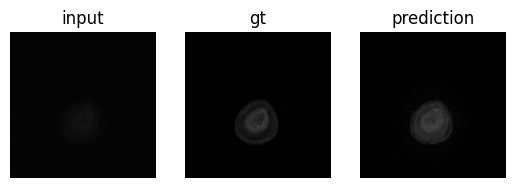

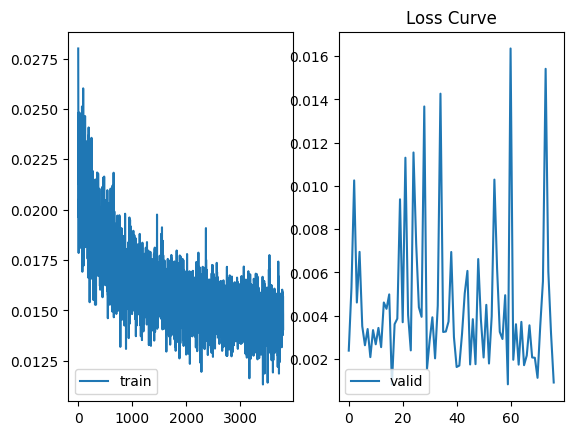

20it [00:02,  8.99it/s]


Epoch 3802, Loss: 0.014061037707142532


20it [00:02,  9.94it/s]


Epoch 3803, Loss: 0.014025346038397401


20it [00:02,  8.64it/s]


Epoch 3804, Loss: 0.014415879058651626


20it [00:02,  8.40it/s]


Epoch 3805, Loss: 0.013012438255827874


20it [00:02,  8.59it/s]


Epoch 3806, Loss: 0.01582119569648057


20it [00:02,  8.43it/s]


Epoch 3807, Loss: 0.014223770354874432


20it [00:02,  9.99it/s]


Epoch 3808, Loss: 0.014313292992301285


20it [00:02,  9.70it/s]


Epoch 3809, Loss: 0.01358522877562791


20it [00:01, 10.03it/s]


Epoch 3810, Loss: 0.013373029534704983


20it [00:01, 10.21it/s]


Epoch 3811, Loss: 0.014693557750433683


20it [00:02,  9.87it/s]


Epoch 3812, Loss: 0.013707208191044628


20it [00:02,  9.52it/s]


Epoch 3813, Loss: 0.014568612980656325


20it [00:02,  9.95it/s]


Epoch 3814, Loss: 0.014180605951696634


20it [00:01, 10.43it/s]


Epoch 3815, Loss: 0.013203579979017378


20it [00:02,  9.79it/s]


Epoch 3816, Loss: 0.014587030513212085


20it [00:01, 10.34it/s]


Epoch 3817, Loss: 0.01374721663305536


20it [00:01, 10.03it/s]


Epoch 3818, Loss: 0.013526280643418431


20it [00:02,  9.84it/s]


Epoch 3819, Loss: 0.015373728959821165


20it [00:01, 10.55it/s]


Epoch 3820, Loss: 0.01552760722115636


20it [00:01, 10.16it/s]


Epoch 3821, Loss: 0.014508333103731275


20it [00:02,  9.52it/s]


Epoch 3822, Loss: 0.013574208598583937


20it [00:01, 10.01it/s]


Epoch 3823, Loss: 0.014607025892473757


20it [00:02,  9.53it/s]


Epoch 3824, Loss: 0.013018385367467999


20it [00:02,  9.97it/s]


Epoch 3825, Loss: 0.014481719001196325


20it [00:01, 10.22it/s]


Epoch 3826, Loss: 0.015116631356067955


20it [00:01, 10.03it/s]


Epoch 3827, Loss: 0.015598907158710063


20it [00:02,  9.94it/s]


Epoch 3828, Loss: 0.016055750963278114


20it [00:01, 10.03it/s]


Epoch 3829, Loss: 0.015961005445569755


20it [00:01, 10.09it/s]


Epoch 3830, Loss: 0.01504305915441364


20it [00:01, 10.36it/s]


Epoch 3831, Loss: 0.014678488473873586


20it [00:02,  9.87it/s]


Epoch 3832, Loss: 0.013590474077500404


20it [00:02,  9.91it/s]


Epoch 3833, Loss: 0.014043500192929059


20it [00:02,  9.98it/s]


Epoch 3834, Loss: 0.014620108064264059


20it [00:02,  9.69it/s]


Epoch 3835, Loss: 0.014599209174048156


20it [00:02,  9.80it/s]


Epoch 3836, Loss: 0.014133999845944345


20it [00:01, 10.05it/s]


Epoch 3837, Loss: 0.013966169813647867


20it [00:02,  9.93it/s]


Epoch 3838, Loss: 0.013924346759449691


20it [00:02,  9.79it/s]


Epoch 3839, Loss: 0.015584004553966224


20it [00:01, 10.11it/s]


Epoch 3840, Loss: 0.015450228052213789


20it [00:02,  9.67it/s]


Epoch 3841, Loss: 0.015740193286910655


20it [00:01, 10.24it/s]


Epoch 3842, Loss: 0.013992858433630318


20it [00:02,  9.87it/s]


Epoch 3843, Loss: 0.014875689905602485


20it [00:01, 10.28it/s]


Epoch 3844, Loss: 0.015708981186617166


20it [00:02,  9.33it/s]


Epoch 3845, Loss: 0.012389880360569806


20it [00:02,  9.97it/s]


Epoch 3846, Loss: 0.01410106448456645


20it [00:01, 10.34it/s]


Epoch 3847, Loss: 0.015916674677282572


20it [00:01, 10.20it/s]


Epoch 3848, Loss: 0.0141942371847108


20it [00:01, 10.20it/s]


Epoch 3849, Loss: 0.011397446552291513


20it [00:01, 10.54it/s]


Epoch 3850, Loss: 0.013614570396021009


20it [00:02,  9.93it/s]

Epoch 3851, Loss: 0.011213942605536431



4it [00:00,  8.96it/s]


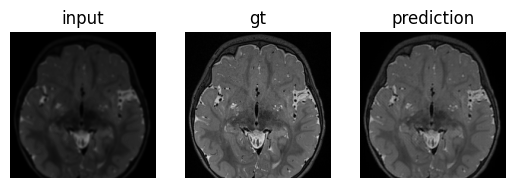

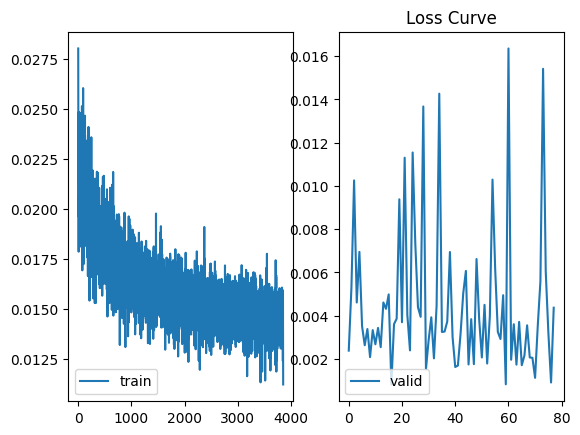

20it [00:01, 10.10it/s]


Epoch 3852, Loss: 0.014822347206063569


20it [00:01, 10.21it/s]


Epoch 3853, Loss: 0.014606616226956248


20it [00:02,  9.60it/s]


Epoch 3854, Loss: 0.01586228460073471


20it [00:02,  8.77it/s]


Epoch 3855, Loss: 0.013126491988077759


20it [00:02,  9.94it/s]


Epoch 3856, Loss: 0.014187572302762418


20it [00:01, 10.17it/s]


Epoch 3857, Loss: 0.015026912116445601


20it [00:01, 10.06it/s]


Epoch 3858, Loss: 0.015616252622567117


20it [00:01, 10.24it/s]


Epoch 3859, Loss: 0.015052861417643726


20it [00:02,  9.85it/s]


Epoch 3860, Loss: 0.014866903843358158


20it [00:01, 10.27it/s]


Epoch 3861, Loss: 0.013491405500099063


20it [00:02,  9.92it/s]


Epoch 3862, Loss: 0.013916508003603667


20it [00:02,  9.95it/s]


Epoch 3863, Loss: 0.015061053563840687


20it [00:01, 10.22it/s]


Epoch 3864, Loss: 0.014613863313570619


20it [00:02,  9.92it/s]


Epoch 3865, Loss: 0.015494778705760836


20it [00:01, 10.22it/s]


Epoch 3866, Loss: 0.014771896228194237


20it [00:01, 10.36it/s]


Epoch 3867, Loss: 0.015555334882810712


20it [00:01, 10.01it/s]


Epoch 3868, Loss: 0.01539470087736845


20it [00:01, 10.27it/s]


Epoch 3869, Loss: 0.014238721644505858


20it [00:01, 10.31it/s]


Epoch 3870, Loss: 0.01476856500376016


20it [00:01, 10.30it/s]


Epoch 3871, Loss: 0.013939434639178216


20it [00:02,  9.77it/s]


Epoch 3872, Loss: 0.014770605717785656


20it [00:01, 10.15it/s]


Epoch 3873, Loss: 0.0151227101450786


20it [00:01, 10.04it/s]


Epoch 3874, Loss: 0.016444221790879964


20it [00:01, 10.23it/s]


Epoch 3875, Loss: 0.013890775281470268


20it [00:02,  9.17it/s]


Epoch 3876, Loss: 0.0155487812589854


20it [00:01, 10.10it/s]


Epoch 3877, Loss: 0.014601126464549452


20it [00:01, 10.59it/s]


Epoch 3878, Loss: 0.014842628862243145


20it [00:01, 10.57it/s]


Epoch 3879, Loss: 0.014178100880235434


20it [00:01, 10.17it/s]


Epoch 3880, Loss: 0.013963257963769137


20it [00:02,  9.91it/s]


Epoch 3881, Loss: 0.01509234115947038


20it [00:01, 10.15it/s]


Epoch 3882, Loss: 0.014069920510519297


20it [00:01, 10.06it/s]


Epoch 3883, Loss: 0.015001282934099436


20it [00:02,  9.93it/s]


Epoch 3884, Loss: 0.01454494462814182


20it [00:02,  9.75it/s]


Epoch 3885, Loss: 0.012970411742571741


20it [00:02,  9.46it/s]


Epoch 3886, Loss: 0.013324529048986733


20it [00:02,  9.81it/s]


Epoch 3887, Loss: 0.01622245677281171


20it [00:02,  9.83it/s]


Epoch 3888, Loss: 0.014870876539498567


20it [00:01, 10.14it/s]


Epoch 3889, Loss: 0.01322619067505002


20it [00:01, 10.02it/s]


Epoch 3890, Loss: 0.014192748814821243


20it [00:01, 10.21it/s]


Epoch 3891, Loss: 0.014466831565368921


20it [00:02,  9.81it/s]


Epoch 3892, Loss: 0.015871483576484026


20it [00:01, 10.02it/s]


Epoch 3893, Loss: 0.013315007719211281


20it [00:02,  9.92it/s]


Epoch 3894, Loss: 0.014700990193523467


20it [00:02,  9.68it/s]


Epoch 3895, Loss: 0.014881350565701723


20it [00:01, 10.02it/s]


Epoch 3896, Loss: 0.014747197297401727


20it [00:02,  9.59it/s]


Epoch 3897, Loss: 0.015042560221627355


20it [00:01, 10.04it/s]


Epoch 3898, Loss: 0.014964113919995725


20it [00:02,  9.99it/s]


Epoch 3899, Loss: 0.0128375360975042


20it [00:01, 10.31it/s]


Epoch 3900, Loss: 0.014555436815135181


20it [00:01, 10.27it/s]

Epoch 3901, Loss: 0.012874214095063508



4it [00:00,  9.84it/s]


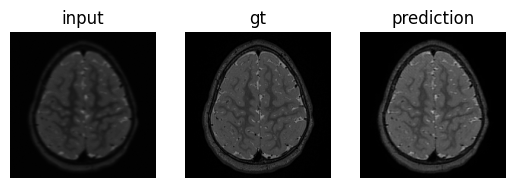

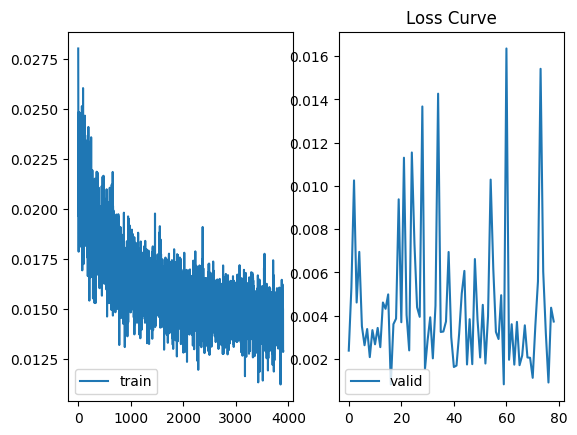

20it [00:02, 10.00it/s]


Epoch 3902, Loss: 0.012876262632198631


20it [00:02,  9.84it/s]


Epoch 3903, Loss: 0.01354431021027267


20it [00:02,  9.75it/s]


Epoch 3904, Loss: 0.013820996740832925


20it [00:02,  9.96it/s]


Epoch 3905, Loss: 0.014517111470922828


20it [00:02,  9.98it/s]


Epoch 3906, Loss: 0.015257717669010162


20it [00:02,  9.33it/s]


Epoch 3907, Loss: 0.014993392582982778


20it [00:02,  9.93it/s]


Epoch 3908, Loss: 0.01286252315621823


20it [00:01, 10.29it/s]


Epoch 3909, Loss: 0.01336516491137445


20it [00:01, 10.09it/s]


Epoch 3910, Loss: 0.015776575775817037


20it [00:01, 10.00it/s]


Epoch 3911, Loss: 0.014154624589718879


20it [00:01, 10.05it/s]


Epoch 3912, Loss: 0.013937643775716425


20it [00:02,  9.96it/s]


Epoch 3913, Loss: 0.01494289271067828


20it [00:02,  9.09it/s]


Epoch 3914, Loss: 0.013950980413937941


20it [00:02,  8.27it/s]


Epoch 3915, Loss: 0.013386067445389926


20it [00:02,  9.62it/s]


Epoch 3916, Loss: 0.015169076481834054


20it [00:02,  9.65it/s]


Epoch 3917, Loss: 0.012895428936462849


20it [00:01, 10.07it/s]


Epoch 3918, Loss: 0.013383767392951995


20it [00:01, 10.01it/s]


Epoch 3919, Loss: 0.012449701677542179


20it [00:01, 10.01it/s]


Epoch 3920, Loss: 0.013910451158881187


20it [00:02,  9.95it/s]


Epoch 3921, Loss: 0.012938122835475952


20it [00:01, 10.27it/s]


Epoch 3922, Loss: 0.01546789046842605


20it [00:02,  9.82it/s]


Epoch 3923, Loss: 0.015569296292960643


20it [00:02,  9.85it/s]


Epoch 3924, Loss: 0.01318409136729315


20it [00:01, 10.07it/s]


Epoch 3925, Loss: 0.013516516913659871


20it [00:01, 10.28it/s]


Epoch 3926, Loss: 0.013782008900307119


20it [00:01, 10.23it/s]


Epoch 3927, Loss: 0.01544430006761104


20it [00:02,  9.33it/s]


Epoch 3928, Loss: 0.015892841550521553


20it [00:01, 10.32it/s]


Epoch 3929, Loss: 0.016512986668385566


20it [00:02,  9.81it/s]


Epoch 3930, Loss: 0.014632947463542222


20it [00:02,  9.83it/s]


Epoch 3931, Loss: 0.015395400021225214


20it [00:01, 10.01it/s]


Epoch 3932, Loss: 0.013666545413434506


20it [00:02,  9.95it/s]


Epoch 3933, Loss: 0.013835271133575588


20it [00:01, 10.11it/s]


Epoch 3934, Loss: 0.014321548654697836


20it [00:01, 10.02it/s]


Epoch 3935, Loss: 0.01520554490853101


20it [00:01, 10.18it/s]


Epoch 3936, Loss: 0.01583866700530052


20it [00:02,  9.88it/s]


Epoch 3937, Loss: 0.01423685105983168


20it [00:02,  9.66it/s]


Epoch 3938, Loss: 0.013466307986527681


20it [00:01, 10.08it/s]


Epoch 3939, Loss: 0.013697445741854608


20it [00:01, 10.08it/s]


Epoch 3940, Loss: 0.01413253175560385


20it [00:01, 10.19it/s]


Epoch 3941, Loss: 0.015917336975689977


20it [00:01, 10.05it/s]


Epoch 3942, Loss: 0.013229157484602183


20it [00:02,  9.90it/s]


Epoch 3943, Loss: 0.015834128949791193


20it [00:01, 10.30it/s]


Epoch 3944, Loss: 0.014933652256149798


20it [00:02,  9.99it/s]


Epoch 3945, Loss: 0.01524514111224562


20it [00:02,  9.78it/s]


Epoch 3946, Loss: 0.0158771185670048


20it [00:01, 10.01it/s]


Epoch 3947, Loss: 0.016126690478995443


20it [00:01, 10.17it/s]


Epoch 3948, Loss: 0.014996521244756877


20it [00:02,  9.77it/s]


Epoch 3949, Loss: 0.01552125164307654


20it [00:02,  9.92it/s]


Epoch 3950, Loss: 0.014133124961517751


20it [00:01, 10.08it/s]

Epoch 3951, Loss: 0.014529733383096755



4it [00:00,  9.53it/s]


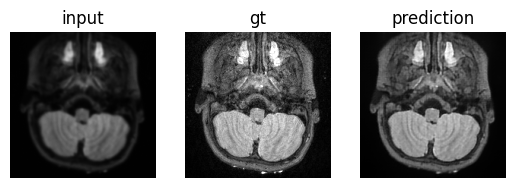

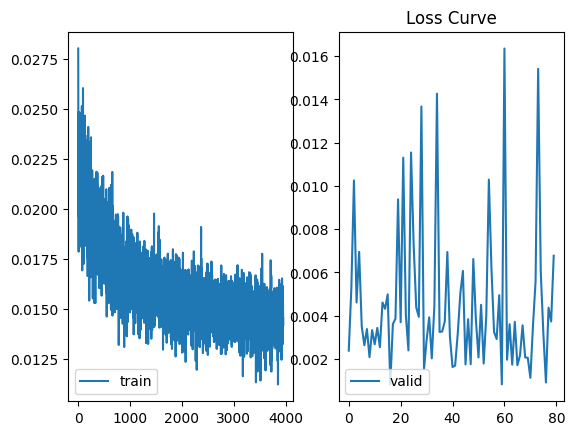

20it [00:02,  9.92it/s]


Epoch 3952, Loss: 0.015501878061331808


20it [00:02,  9.94it/s]


Epoch 3953, Loss: 0.014306723116897046


20it [00:01, 10.02it/s]


Epoch 3954, Loss: 0.013689424423500896


20it [00:02,  9.29it/s]


Epoch 3955, Loss: 0.013486268813721836


20it [00:01, 10.37it/s]


Epoch 3956, Loss: 0.014093506732024252


20it [00:02,  9.76it/s]


Epoch 3957, Loss: 0.014199836552143097


20it [00:02,  9.54it/s]


Epoch 3958, Loss: 0.014052519388496876


20it [00:01, 10.14it/s]


Epoch 3959, Loss: 0.01433985463809222


20it [00:02,  9.95it/s]


Epoch 3960, Loss: 0.014453359018079936


20it [00:01, 10.10it/s]


Epoch 3961, Loss: 0.012982336955610662


20it [00:02,  9.85it/s]


Epoch 3962, Loss: 0.013600110448896885


20it [00:02,  9.98it/s]


Epoch 3963, Loss: 0.014804783393628895


20it [00:01, 10.14it/s]


Epoch 3964, Loss: 0.013555616908706724


20it [00:02,  9.84it/s]


Epoch 3965, Loss: 0.014366832026280463


20it [00:01, 10.41it/s]


Epoch 3966, Loss: 0.014093395660165698


20it [00:01, 10.10it/s]


Epoch 3967, Loss: 0.015394813031889498


20it [00:02,  9.59it/s]


Epoch 3968, Loss: 0.01469295157585293


20it [00:01, 10.30it/s]


Epoch 3969, Loss: 0.015163027495145798


20it [00:01, 10.19it/s]


Epoch 3970, Loss: 0.014505638740956783


20it [00:01, 10.46it/s]


Epoch 3971, Loss: 0.014964235038496554


20it [00:02,  9.95it/s]


Epoch 3972, Loss: 0.0146802241448313


20it [00:02,  9.71it/s]


Epoch 3973, Loss: 0.015141715365462004


20it [00:02,  9.74it/s]


Epoch 3974, Loss: 0.014498511969577521


20it [00:02,  9.79it/s]


Epoch 3975, Loss: 0.01567114223726094


20it [00:02,  9.76it/s]


Epoch 3976, Loss: 0.015577019425109029


20it [00:01, 10.07it/s]


Epoch 3977, Loss: 0.013977369980420918


20it [00:02,  9.89it/s]


Epoch 3978, Loss: 0.014005421299953014


20it [00:02,  9.52it/s]


Epoch 3979, Loss: 0.01620232709683478


20it [00:01, 10.06it/s]


Epoch 3980, Loss: 0.01541131054982543


20it [00:01, 10.00it/s]


Epoch 3981, Loss: 0.014414964232128114


20it [00:02,  9.70it/s]


Epoch 3982, Loss: 0.015173741104081272


20it [00:01, 10.14it/s]


Epoch 3983, Loss: 0.013915636856108905


20it [00:01, 10.01it/s]


Epoch 3984, Loss: 0.014159545698203147


20it [00:01, 10.31it/s]


Epoch 3985, Loss: 0.013051268365234136


20it [00:02,  9.96it/s]


Epoch 3986, Loss: 0.013578061456792056


20it [00:02,  9.91it/s]


Epoch 3987, Loss: 0.013626556959934533


20it [00:01, 10.11it/s]


Epoch 3988, Loss: 0.013380905042868107


20it [00:02,  9.58it/s]


Epoch 3989, Loss: 0.013767875905614346


20it [00:02,  9.43it/s]


Epoch 3990, Loss: 0.015540702070575207


20it [00:01, 10.04it/s]


Epoch 3991, Loss: 0.015110598970204591


20it [00:02,  9.97it/s]


Epoch 3992, Loss: 0.014832167723216116


20it [00:01, 10.09it/s]


Epoch 3993, Loss: 0.015452132979407906


20it [00:02,  9.92it/s]


Epoch 3994, Loss: 0.01507519071456045


20it [00:01, 10.04it/s]


Epoch 3995, Loss: 0.014248920907266437


20it [00:02,  9.80it/s]


Epoch 3996, Loss: 0.015070266521070153


20it [00:02,  9.39it/s]


Epoch 3997, Loss: 0.014935488742776216


20it [00:02,  9.73it/s]


Epoch 3998, Loss: 0.01358946921536699


20it [00:02,  9.91it/s]


Epoch 3999, Loss: 0.014620187634136528


20it [00:02,  9.45it/s]

Epoch 4000, Loss: 0.014034481160342694


In [16]:
#60-110 슬라이스 쓰기
train_loss = []
val_loss = []
dice_val_best = 100
dice_val = 0
for epoch in range(4000):
    epoch_loss = 0
    model.train()
    for step,batch in tqdm(enumerate(train_loader)):
        rand = random.randint(0,219) 
        
        images = batch['low_res_image']      
#         images = images.squeeze(1)
        images = images[...,rand,:].to(device) #1,1,192,192
#         images = images.permute(0,2,1,3)
        
        target = batch['image'][...,rand,:].to(device)
        output = model(images)
        optimizer.zero_grad()
        
        perceptual = perceptual_loss(output,target)
        l1 = loss_function(output,target)
        loss = 0.01*perceptual + 0.99*l1
    
#         loss = 0.05*perceptual_loss(output,target) + 0.5*loss_function_c(output,target)

#         loss = loss_function(output,target)
        
        loss.backward()
        
        epoch_loss += loss.item()
        
        optimizer.step()
        
    train_loss.append(epoch_loss/(step+1))
    print(f'Epoch {epoch+1}, Loss: {epoch_loss/len(train_loader)}')
    if epoch % 50 == 0:
        dice_val = validation(val_loader)
        dice_val = (dice_val/len(val_loader))
        val_loss.append(dice_val)
        
        plt.subplot(121)
        plt.plot(train_loss,label='train')
        plt.legend(loc='lower left')
        plt.subplot(122)
        plt.plot(val_loss,label='valid')
        plt.legend(loc='lower left')
        plt.title('Loss Curve')
        plt.show()
    
        if dice_val < dice_val_best:
            dice_val_best = dice_val
            torch.save(model.state_dict(),os.path.join(f'./weight/UNet_ISMRM_v3.pth'))
            print(f'Model was saved! Current Best Dice {dice_val_best}')

   
        
        

In [17]:
torch.save(model.state_dict(),os.path.join(f'./weight/UNet_ISMRM_v3_last.pth'))


## UNEt

In [ ]:
model = monai.networks.nets.UNet(
        spatial_dims=2,
        in_channels=7,
        out_channels=1,
        channels=(64, 128, 256, 512),
        strides=(2, 2, 2),
        num_res_units=3,
    ).to(device)
loss_function = torch.nn.L1Loss()
# mseloss = torch.nn.MSELoss()
perceptual_loss = PerceptualLoss(spatial_dims = 2,network_type = 'alex').to(device)
loss_function_c = CharbonnierLoss()

optimizer = torch.optim.AdamW(model.parameters(), 1e-4)

In [ ]:
def validation(val_loader):
    model.eval()
    with torch.no_grad():
        for step,batch in tqdm(enumerate(val_loader)):
#             rand = random.randint(30,100)
            rand= 70
            images = batch['low_res_image']
            images = images.squeeze(1)
            images = images[...,rand:rand+7,:].to(device)
            images = images.permute(0,2,1,3)

            target = batch['image'][...,rand+3,:].to(device)
            
            val_output = model(images)

            loss = loss_function(val_output,target)
    plt.subplot(131)
    plt.imshow(images[0,4,...].detach().cpu(),cmap='gray',vmin=0,vmax=0.5)
    plt.axis('off')
    plt.title('input')

    plt.subplot(132)
    plt.imshow(target[0,0,...].detach().cpu(),cmap='gray',vmin=0,vmax=0.5)
    plt.axis('off')
    plt.title('gt')

    plt.subplot(133)
    plt.imshow(val_output[0,0,...].detach().cpu(),cmap='gray',vmin=0,vmax=0.5)
    plt.title('prediction')

    plt.axis('off')
    plt.show()
    return loss.item()

In [ ]:
# 60-110 슬라이스 쓰기
train_loss = []
val_loss = []
dice_val_best = 100
dice_val = 0
for epoch in range(10000):
    epoch_loss = 0
    model.train()
    for step,batch in enumerate(train_loader):
#         rand = random.randint(30,100) 
        rand= 70
        images = batch['low_res_image']
        images = images.squeeze(1)
        images = images[...,rand:rand+7,:].to(device)
        images = images.permute(0,2,1,3)
        
        target = batch['image'][...,rand+3,:].to(device)
        
        output = model(images)
        optimizer.zero_grad()
        
#        loss = loss_function(output,target)
        loss = 0.05*perceptual_loss(output,target) + 0.5*loss_function(output,target)
        
        loss.backward()
        
        epoch_loss += loss.item()
        
        optimizer.step()
        
    train_loss.append(epoch_loss/(step+1))
    print(f'Epoch {epoch+1}, Loss: {epoch_loss/len(train_loader)}')
    if epoch % 50 == 0:
        dice_val = validation(val_loader)
        dice_val = (dice_val/len(val_loader))
        val_loss.append(dice_val)
        
        plt.subplot(121)
        plt.plot(train_loss,label='train')
        plt.legend(loc='lower left')
        plt.subplot(122)
        plt.plot(val_loss,label='valid')
        plt.legend(loc='lower left')
        plt.title('Loss Curve')
        plt.show()
    
        if dice_val < dice_val_best:
            dice_val_best = dice_val
#             torch.save(model.state_dict(),os.path.join(f'./UNet_test.pth'))
            print(f'Model was saved! Current Best Dice {dice_val_best}')

   

In [ ]:
model.load_state_dict(torch.load(os.path.join('./SwinUNetIR_v3.pth')))

In [ ]:
model.eval()
with torch.no_grad():
    for step,batch in tqdm(enumerate(val_loader)):
        rand = random.randint(60,100)
        images = batch['low_res_image']
        images = images.squeeze(1)
        images = images[...,rand:rand+7,:].to(device)
        images = images.permute(0,2,1,3)

        target = batch['image'][...,rand+3,:].to(device)

        val_output = model(images)
#         loss = loss_function(val_output,target)
        plt.subplot(131)
        plt.imshow(images[0,4,...].detach().cpu(),cmap='gray',vmin=0,vmax=0.5)
        plt.axis('off')
        plt.title('input')

        plt.subplot(132)
        plt.imshow(target[0,0,...].detach().cpu(),cmap='gray',vmin=0,vmax=0.5)
        plt.axis('off')
        plt.title('gt')

        plt.subplot(133)
        plt.imshow(val_output[0,0,...].detach().cpu(),cmap='gray',vmin=0,vmax=0.5)
        plt.title('prediction')

        plt.axis('off')
        plt.show()

In [ ]:
torch.save(model.state_dict(),os.path.join(f'./High_res_UNet_v2.pth'))


In [ ]:
images.shape

In [ ]:
plt.imshow(output[0,0].detach().cpu(),vmin=0,vmax=1)
plt.colorbar()

In [ ]:
# model = monai.networks.nets.UNet(
#         spatial_dims=2,
#         in_channels=7,
#         out_channels=1,
#         channels=(64, 128, 256, 512),
#         strides=(2, 2, 2),
#         num_res_units=3,
#     ).to(device)
# model = net(upscale=1, in_chans=1, img_size=128, window_size=8,
#             img_range=1., depths=[6, 6, 6, 6, 6, 6], embed_dim=180, num_heads=[6, 6, 6, 6, 6, 6],
#             mlp_ratio=2, upsampler='', resi_connection='1conv')


# model = net(upscale=1, in_chans=1, img_size=192, window_size=7,
#                     img_range=255., depths=[6, 6, 6, 6, 6, 6], embed_dim=180, num_heads=[6, 6, 6, 6, 6, 6],
#                     mlp_ratio=2, upsampler='', resi_connection='1conv')